In [59]:
from sklearn.datasets import load_breast_cancer
import pandas as pd  # Import Pandas for data manipulation using dataframes
import numpy as np  # Import Numpy for data statistical analysis
import matplotlib.pyplot as plt  # Import matplotlib for data visualisation
import seaborn as sns  # Statistical data visualization

data = pd.read_csv("BreastCancerDetection.csv")

#remove the last column
data =data.iloc[:,1:-1]

#looking for exceptions
from scipy.stats import zscore

z = np.abs(zscore(data.iloc[:,1:]))
data['diagnosis'] = data['diagnosis'].map({'M':1,'B':0})

X = data.drop(['diagnosis'],axis=1)
y = data['diagnosis']

X_standard = X.apply(zscore)

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_standard, y, test_size = 0.25, random_state=5)

In [60]:
x_standard = X.apply(zscore)
x_standard.describe()
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x_standard, y, test_size=0.3, random_state=1)
x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.7, random_state=1)

In [61]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.regularizers import l2
def baseline_model(units1, units2, dropout):
    model = Sequential()
    model.add(Dense(units1, input_shape=(30,), activation='relu'))
    model.add(Dropout(dropout))
    model.add(BatchNormalization(axis=1))
    model.add(Dense(units2, activation='relu', activity_regularizer=l2(0.01), kernel_regularizer=l2(0.01)))
    model.add(Dropout(dropout))
    model.add(BatchNormalization(axis=1))
    model.add(Dense(1, activation='sigmoid'))

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    model.summary()

    return model

In [62]:
#stop the training if arriving to good results
from keras.callbacks import EarlyStopping
es = EarlyStopping(monitor='val_loss', min_delta=0.001, patience=5, verbose=1, mode='auto')

In [63]:
units1 = 128
units2 = 128
dropout = 0.25
 
# Fit the model
model = baseline_model(units1, units2, dropout)

history = model.fit(x_train, y_train, 
                    batch_size=32, 
                    epochs=50, 
                    validation_data=(x_val,y_val), 
                    callbacks=[es])

Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_48 (Dense)             (None, 128)               3968      
_________________________________________________________________
dropout_8 (Dropout)          (None, 128)               0         
_________________________________________________________________
batch_normalization_8 (Batch (None, 128)               512       
_________________________________________________________________
dense_49 (Dense)             (None, 128)               16512     
_________________________________________________________________
dropout_9 (Dropout)          (None, 128)               0         
_________________________________________________________________
batch_normalization_9 (Batch (None, 128)               512       
_________________________________________________________________
dense_50 (Dense)             (None, 1)               

13/13 [==============================] - 0s 3ms/step - loss: 0.1843 - accuracy: 0.9928 - val_loss: 0.2644 - val_accuracy: 0.9583
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2134 - accuracy: 0.9782 - val_loss: 0.2611 - val_accuracy: 0.9583
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2033 - accuracy: 0.9787 - val_loss: 0.2567 - val_accuracy: 0.9583
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1633 - accuracy: 0.9946 - val_loss: 0.2583 - val_accuracy: 0.9583
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1646 - accuracy: 0.9926 - val_loss: 0.2552 - val_accuracy: 0.9583
Epoch 41/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1656 - accuracy: 0.9875 - val_loss: 0.2388 - val_accuracy: 0.9667
Epoch 42/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1717 - accuracy: 0.9868 - val_loss: 0.2251 - val_accuracy: 0.9667
Epoch 43/50
13/13 [======

In [64]:
loss, acc = model.evaluate(x_train, y_train)
loss, acc = model.evaluate(x_val, y_val)
loss, acc = model.evaluate(x_test, y_test)

2/2 [==============================] - 0s 6ms/step - loss: 0.2218 - accuracy: 0.9608


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
The accuracy is: 0.96
f1 score : 0.96 


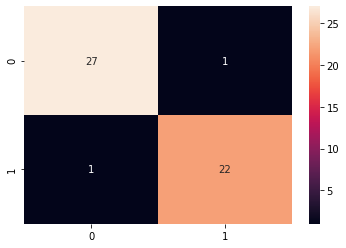

In [65]:

from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, f1_score
y_pred = model.predict(x_test)
y_pred = np.array([0 if n <= .5 else 1 for n in y_pred])
cm= confusion_matrix(y_test, y_pred)

sns.heatmap(cm,annot=True,fmt="d")
acc = accuracy_score(y_test, y_pred)
print('The accuracy is: %.2f' % acc)
print('f1 score : %.2f '% f1_score(y_test, y_pred))

In [66]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.96      0.96      0.96        28
           1       0.96      0.96      0.96        23

    accuracy                           0.96        51
   macro avg       0.96      0.96      0.96        51
weighted avg       0.96      0.96      0.96        51



# Yuval's Tenserflow 

In [67]:
x_standard = X.apply(zscore)
x_standard.describe()
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x_standard, y, test_size=0.3, random_state=1)
print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)


import keras
from keras.models import Sequential
from keras.layers import Dense

# Initialising the ANN
classifier = Sequential()

# Adding the input layer and the first hidden layer
#units = (30+1)/2
# result is binary - 1
#X_train shape is (6000,11) 
classifier.add(Dense(units = 15, kernel_initializer = 'uniform', activation = 'relu', input_dim = 30))

# Adding the second hidden layer
classifier.add(Dense(units = 15, kernel_initializer = 'uniform', activation = 'relu'))

# Adding the output layer
classifier.add(Dense(units = 1, kernel_initializer = 'uniform', activation = 'sigmoid'))

# Compiling the ANN
classifier.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

# Fitting the ANN to the Training set
classifier.fit(x_train, y_train, batch_size = 32, epochs = 100)

# Part 3 - Making the predictions and evaluating the model

# Predicting the Test set results
#y_pred = classifier.predict(X_test)

#y_pred = (y_pred > 0.5)





(398, 30)
(398,)
(171, 30)
(171,)
Epoch 1/100
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 55ms/step - loss: 0.6922 - accuracy: 0.6139
Epoch 2/100
13/13 [==============================] - 0s 741us/step - loss: 0.6852 - accuracy: 0.7724
Epoch 3/100
13/13 [==============================] - 0s 714us/step - loss: 0.6649 - accuracy: 0.9240
Epoch 4/100
13/13 [=======================

13/13 [==============================] - 0s 664us/step - loss: 0.0409 - accuracy: 0.9888
Epoch 73/100
13/13 [==============================] - 0s 670us/step - loss: 0.0133 - accuracy: 0.9991
Epoch 74/100
13/13 [==============================] - 0s 725us/step - loss: 0.0224 - accuracy: 0.9956
Epoch 75/100
13/13 [==============================] - 0s 755us/step - loss: 0.0347 - accuracy: 0.9905
Epoch 76/100
13/13 [==============================] - 0s 723us/step - loss: 0.0163 - accuracy: 0.9974
Epoch 77/100
13/13 [==============================] - 0s 703us/step - loss: 0.0163 - accuracy: 0.9978
Epoch 78/100
13/13 [==============================] - 0s 718us/step - loss: 0.0196 - accuracy: 0.9964
Epoch 79/100
13/13 [==============================] - 0s 827us/step - loss: 0.0204 - accuracy: 0.9967
Epoch 80/100
13/13 [==============================] - 0s 723us/step - loss: 0.0139 - accuracy: 0.9978
Epoch 81/100
13/13 [==============================] - 0s 722us/step - loss: 0.0228 - accuracy: 

In [68]:
y_pred = classifier.predict(x_test)

y_pred = (y_pred > 0.5)

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


(171, 1)
(171,)


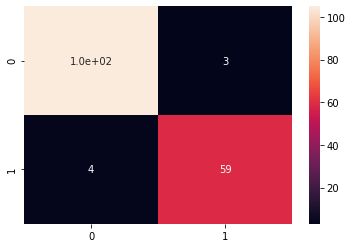

In [69]:
# Making the Confusion Matrix
from sklearn.metrics import confusion_matrix
print(y_pred.shape)
print(y_test.shape)

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True)


In [70]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.96      0.97      0.97       108
           1       0.95      0.94      0.94        63

    accuracy                           0.96       171
   macro avg       0.96      0.95      0.96       171
weighted avg       0.96      0.96      0.96       171



# Loop - get best result

In [ ]:
#def baseline_model(units1, units2, dropout):

best_i=1
best_j=1
best_d=1
best_loss=1.0
best_acc=0.0

for i in range(1,128):
    for j in range(1,128):
        for d in range(1,100,5):
            model= baseline_model(i, j, d/100)
            history = model.fit(x_train, y_train, 
                    batch_size=32, 
                    epochs=50, 
                    validation_data=(x_val,y_val), 
                    callbacks=[es])
            
#            
            loss, acc = model.evaluate(x_test, y_test)
            
            if(best_loss>loss and best_acc<acc):
                best_loss=loss 
                best_acc=acc
                best_i=i
                best_j=j
                best_d=d
                print("-----------------------------------------------new score")
                print('The accuracy is: %.2f loss is  %.2f ' %(acc,loss)) 
            

Model: "sequential_18"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_54 (Dense)             (None, 1)                 31        
_________________________________________________________________
dropout_10 (Dropout)         (None, 1)                 0         
_________________________________________________________________
batch_normalization_10 (Batc (None, 1)                 4         
_________________________________________________________________
dense_55 (Dense)             (None, 1)                 2         
_________________________________________________________________
dropout_11 (Dropout)         (None, 1)                 0         
_________________________________________________________________
batch_normalization_11 (Batc (None, 1)                 4         
_________________________________________________________________
dense_56 (Dense)             (None, 1)               

13/13 [==============================] - 0s 2ms/step - loss: 0.3606 - accuracy: 0.9133 - val_loss: 0.3888 - val_accuracy: 0.9250
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3484 - accuracy: 0.9129 - val_loss: 0.3788 - val_accuracy: 0.9167
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3824 - accuracy: 0.8759 - val_loss: 0.3750 - val_accuracy: 0.9250
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3260 - accuracy: 0.9318 - val_loss: 0.3683 - val_accuracy: 0.9250
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3388 - accuracy: 0.9242 - val_loss: 0.3573 - val_accuracy: 0.9250
Epoch 41/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3517 - accuracy: 0.8909 - val_loss: 0.3482 - val_accuracy: 0.9250
Epoch 42/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3256 - accuracy: 0.9076 - val_loss: 0.3441 - val_accuracy: 0.9250
Epoch 43/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.3787 - accuracy: 0.8735 - val_loss: 0.4928 - val_accuracy: 0.8583
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4075 - accuracy: 0.8444 - val_loss: 0.4875 - val_accuracy: 0.8583
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3674 - accuracy: 0.8613 - val_loss: 0.4781 - val_accuracy: 0.8667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3905 - accuracy: 0.8820 - val_loss: 0.4563 - val_accuracy: 0.8667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3716 - accuracy: 0.8979 - val_loss: 0.4339 - val_accuracy: 0.8750
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3517 - accuracy: 0.8896 - val_loss: 0.4262 - val_accuracy: 0.8833
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3656 - accuracy: 0.8659 - val_loss: 0.4188 - val_accuracy: 0.8833
Epoch 27/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.8195 - accuracy: 0.4225 - val_loss: 0.7430 - val_accuracy: 0.4583
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7557 - accuracy: 0.4349 - val_loss: 0.7242 - val_accuracy: 0.4750
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7399 - accuracy: 0.4420 - val_loss: 0.7076 - val_accuracy: 0.5000
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7126 - accuracy: 0.4783 - val_loss: 0.6899 - val_accuracy: 0.5250
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6865 - accuracy: 0.5358 - val_loss: 0.6747 - val_accuracy: 0.5417
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6899 - accuracy: 0.5090 - val_loss: 0.6610 - val_accuracy: 0.5667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6747 - accuracy: 0.4781 - val_loss: 0.6478 - val_accuracy: 0.6000
Epoch 11/50
13/13 [===========

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8076 - accuracy: 0.3125WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110e163b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4064 - accuracy: 0.8715 - val_loss: 0.3939 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 2ms/step - loss: 0.4092 - accuracy: 0.9474
Model: "sequential_22"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_66 (Dense)             (None, 1)                 31        
_________________________________________________________________
dropout_18 (Dropout)         (None, 1)                 0         
_________________________________________________________________
batch_normalization_18 (Batc (None, 1)                 4         
_________________________________________________________________
dense_67 (Dense)             (None, 1)                 2         
_________________________________________________________________
dropout_19 (Dropout)         (None, 1)                 0         
_____________

13/13 [==============================] - 0s 2ms/step - loss: 0.5167 - accuracy: 0.7929 - val_loss: 0.4610 - val_accuracy: 0.8750
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5246 - accuracy: 0.7809 - val_loss: 0.4571 - val_accuracy: 0.8833
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4971 - accuracy: 0.8126 - val_loss: 0.4537 - val_accuracy: 0.8750
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4928 - accuracy: 0.8251 - val_loss: 0.4472 - val_accuracy: 0.8917
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4766 - accuracy: 0.8316 - val_loss: 0.4418 - val_accuracy: 0.8917
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4900 - accuracy: 0.8203 - val_loss: 0.4388 - val_accuracy: 0.8917
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4770 - accuracy: 0.8307 - val_loss: 0.4350 - val_accuracy: 0.8917
Epoch 41/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5844 - accuracy: 0.7402 - val_loss: 0.5992 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5787 - accuracy: 0.7386 - val_loss: 0.5938 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6110 - accuracy: 0.6977 - val_loss: 0.5909 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5999 - accuracy: 0.7109 - val_loss: 0.5889 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5779 - accuracy: 0.7337 - val_loss: 0.5806 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5433 - accuracy: 0.7949 - val_loss: 0.5679 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5565 - accuracy: 0.7693 - val_loss: 0.5580 - val_accuracy: 0.6667
Epoch 26/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 1.0778 - accuracy: 0.3886 - val_loss: 0.7334 - val_accuracy: 0.4833
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 1.0146 - accuracy: 0.4552 - val_loss: 0.7239 - val_accuracy: 0.5500
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9329 - accuracy: 0.4924 - val_loss: 0.7130 - val_accuracy: 0.5917
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8110 - accuracy: 0.5616 - val_loss: 0.7030 - val_accuracy: 0.6167
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7812 - accuracy: 0.5819 - val_loss: 0.6850 - val_accuracy: 0.6583
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7736 - accuracy: 0.5940 - val_loss: 0.6640 - val_accuracy: 0.7000
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7405 - accuracy: 0.5975 - val_loss: 0.6436 - val_accuracy: 0.7583
Epoch 11/50
13/13 [===========

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6188 - accuracy: 0.6835 - val_loss: 0.6192 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6401 - accuracy: 0.6656 - val_loss: 0.6229 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 5ms/step - loss: 0.6290 - accuracy: 0.6659 - val_loss: 0.6192 - val_accuracy: 0.6667
Epoch 00017: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6356 - accuracy: 0.6316
Model: "sequential_26"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_78 (Dense)             (None, 1)                 31        
_________________________________________________________________
dropout_26 (Dropout)         (None, 1)                 0         
_________________________________________________________________
batch_normalization_26 (Batc (None, 1)       

13/13 [==============================] - 0s 2ms/step - loss: 0.6826 - accuracy: 0.6265 - val_loss: 0.6828 - val_accuracy: 0.8333
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7099 - accuracy: 0.5919 - val_loss: 0.6765 - val_accuracy: 0.8417
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6505 - accuracy: 0.6450 - val_loss: 0.6670 - val_accuracy: 0.8583
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7114 - accuracy: 0.5964 - val_loss: 0.6620 - val_accuracy: 0.8583
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6999 - accuracy: 0.5917 - val_loss: 0.6580 - val_accuracy: 0.8667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6866 - accuracy: 0.5852 - val_loss: 0.6536 - val_accuracy: 0.8833
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7104 - accuracy: 0.5572 - val_loss: 0.6482 - val_accuracy: 0.8833
Epoch 10/50
13/13 [============

Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6675 - accuracy: 0.5896 - val_loss: 0.6536 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6551 - accuracy: 0.6454 - val_loss: 0.6511 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6481 - accuracy: 0.6474 - val_loss: 0.6495 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6455 - accuracy: 0.6237 - val_loss: 0.6479 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6572 - accuracy: 0.6031 - val_loss: 0.6454 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6459 - accuracy: 0.6568 - val_loss: 0.6414 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6415 - accuracy: 0.6418 - val_loss: 0.6377 - val_accuracy: 0.6667
Epoch 25/50
1

Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8369 - accuracy: 0.6009 - val_loss: 0.7615 - val_accuracy: 0.5250
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8183 - accuracy: 0.5863 - val_loss: 0.7240 - val_accuracy: 0.5667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7479 - accuracy: 0.6142 - val_loss: 0.7017 - val_accuracy: 0.6250
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7627 - accuracy: 0.6111 - val_loss: 0.6842 - val_accuracy: 0.6583
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7236 - accuracy: 0.6340 - val_loss: 0.6734 - val_accuracy: 0.6750
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7332 - accuracy: 0.5956 - val_loss: 0.6623 - val_accuracy: 0.7083
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7433 - accuracy: 0.6646 - val_loss: 0.6522 - val_accuracy: 0.7500
Epoch 10/50
13/13 [=

Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6608 - accuracy: 0.5969 - val_loss: 0.6361 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6640 - accuracy: 0.5875 - val_loss: 0.6355 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6586 - accuracy: 0.6617 - val_loss: 0.6332 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7067 - accuracy: 0.6214 - val_loss: 0.6305 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6625 - accuracy: 0.6008 - val_loss: 0.6304 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6610 - accuracy: 0.5851 - val_loss: 0.6287 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7091 - accuracy: 0.6213 - val_loss: 0.6280 - val_accuracy: 0.6667
Epoch 27/50
1

Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6300 - accuracy: 0.6884 - val_loss: 0.6248 - val_accuracy: 0.7083
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6567 - accuracy: 0.6463 - val_loss: 0.6243 - val_accuracy: 0.7000
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6240 - accuracy: 0.6753 - val_loss: 0.6247 - val_accuracy: 0.7000
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6062 - accuracy: 0.7217 - val_loss: 0.6240 - val_accuracy: 0.6917
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6631 - accuracy: 0.6558 - val_loss: 0.6231 - val_accuracy: 0.6917
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6420 - accuracy: 0.6544 - val_loss: 0.6241 - val_accuracy: 0.6917
Epoch 27/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6569 - accuracy: 0.6588 - val_loss: 0.6242 - val_accuracy: 0.6917
Epoch 28/50
1

Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6681 - accuracy: 0.6306 - val_loss: 0.6618 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6814 - accuracy: 0.5727 - val_loss: 0.6613 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6741 - accuracy: 0.6293 - val_loss: 0.6623 - val_accuracy: 0.6667
Epoch 30/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6598 - accuracy: 0.6400 - val_loss: 0.6612 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6636 - accuracy: 0.6304 - val_loss: 0.6604 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6782 - accuracy: 0.6019 - val_loss: 0.6595 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6725 - accuracy: 0.6138 - val_loss: 0.6587 - val_accuracy: 0.6667
Epoch 34/50
1

13/13 [==============================] - 0s 2ms/step - loss: 0.6967 - accuracy: 0.6218 - val_loss: 0.6651 - val_accuracy: 0.6583
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6768 - accuracy: 0.6200 - val_loss: 0.6638 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6712 - accuracy: 0.6383 - val_loss: 0.6621 - val_accuracy: 0.6583
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6952 - accuracy: 0.5938 - val_loss: 0.6606 - val_accuracy: 0.6583
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6703 - accuracy: 0.6335 - val_loss: 0.6584 - val_accuracy: 0.6583
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6832 - accuracy: 0.6020 - val_loss: 0.6570 - val_accuracy: 0.6583
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6698 - accuracy: 0.6208 - val_loss: 0.6548 - val_accuracy: 0.6583
Epoch 19/50
13/13 [======

13/13 [==============================] - 1s 58ms/step - loss: 0.8524 - accuracy: 0.5953 - val_loss: 0.6925 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8518 - accuracy: 0.5925 - val_loss: 0.6821 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8349 - accuracy: 0.5921 - val_loss: 0.6754 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8033 - accuracy: 0.6250 - val_loss: 0.6718 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8260 - accuracy: 0.6023 - val_loss: 0.6689 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8476 - accuracy: 0.5717 - val_loss: 0.6665 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7854 - accuracy: 0.6050 - val_loss: 0.6645 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8200 - accuracy: 0.6377 - val_loss: 0.6692 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8405 - accuracy: 0.6227 - val_loss: 0.6648 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8567 - accuracy: 0.6262 - val_loss: 0.6595 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8985 - accuracy: 0.5773 - val_loss: 0.6614 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7676 - accuracy: 0.6558 - val_loss: 0.6620 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7480 - accuracy: 0.6421 - val_loss: 0.6600 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7810 - accuracy: 0.6408 - val_loss: 0.6589 - val_accuracy: 0.6667
Epoch 10/50
13/13 [=

13/13 [==============================] - 1s 57ms/step - loss: 0.7221 - accuracy: 0.5493 - val_loss: 0.7061 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7291 - accuracy: 0.5677 - val_loss: 0.7033 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7188 - accuracy: 0.6214 - val_loss: 0.7004 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7161 - accuracy: 0.5635 - val_loss: 0.6995 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7021 - accuracy: 0.5786 - val_loss: 0.6978 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7254 - accuracy: 0.5120 - val_loss: 0.6962 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7078 - accuracy: 0.6326 - val_loss: 0.6939 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Total params: 50
Trainable params: 44
Non-trainable params: 6
_________________________________________________________________
Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.5910 - accuracy: 0.7500WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe112472c20> and will run it as-is.
Please r

Epoch 45/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1927 - accuracy: 0.9531 - val_loss: 0.1804 - val_accuracy: 0.9667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1394 - accuracy: 0.9663 - val_loss: 0.1715 - val_accuracy: 0.9583
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2076 - accuracy: 0.9300 - val_loss: 0.1655 - val_accuracy: 0.9583
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1725 - accuracy: 0.9556 - val_loss: 0.1589 - val_accuracy: 0.9583
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1812 - accuracy: 0.9374 - val_loss: 0.1527 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 51ms/step - loss: 0.1530 - accuracy: 0.9649
-----------------------------------------------new score
The accuracy is: 0.96 loss is  0.15 
Model: "sequential_39"
_________________________________________________________________
Layer (type)  

13/13 [==============================] - 0s 2ms/step - loss: 0.3699 - accuracy: 0.8588 - val_loss: 0.3955 - val_accuracy: 0.9083
Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2845 - accuracy: 0.9137 - val_loss: 0.3901 - val_accuracy: 0.9083
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2657 - accuracy: 0.9093 - val_loss: 0.3799 - val_accuracy: 0.9083
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3281 - accuracy: 0.8869 - val_loss: 0.3636 - val_accuracy: 0.9083
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2953 - accuracy: 0.8884 - val_loss: 0.3643 - val_accuracy: 0.9083
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2843 - accuracy: 0.8895 - val_loss: 0.3714 - val_accuracy: 0.9167
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2574 - accuracy: 0.9193 - val_loss: 0.3722 - val_accuracy: 0.9083
Epoch 36/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.4968 - accuracy: 0.8179 - val_loss: 0.5044 - val_accuracy: 0.8333
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4857 - accuracy: 0.8412 - val_loss: 0.4919 - val_accuracy: 0.8250
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4886 - accuracy: 0.8107 - val_loss: 0.4817 - val_accuracy: 0.8417
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4625 - accuracy: 0.8385 - val_loss: 0.4768 - val_accuracy: 0.8417
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5042 - accuracy: 0.8165 - val_loss: 0.4724 - val_accuracy: 0.8500
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4827 - accuracy: 0.8264 - val_loss: 0.4668 - val_accuracy: 0.8583
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4362 - accuracy: 0.8540 - val_loss: 0.4599 - val_accuracy: 0.8500
Epoch 21/50
13/13 [======

13/13 [==============================] - 1s 56ms/step - loss: 0.8809 - accuracy: 0.3167 - val_loss: 0.6919 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8909 - accuracy: 0.3552 - val_loss: 0.6845 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7708 - accuracy: 0.4669 - val_loss: 0.6775 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7878 - accuracy: 0.5012 - val_loss: 0.6721 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8049 - accuracy: 0.5008 - val_loss: 0.6679 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7477 - accuracy: 0.6103 - val_loss: 0.6624 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7519 - accuracy: 0.5793 - val_loss: 0.6580 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.6442 - accuracy: 0.6562WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10f08c7a0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9602 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10c7300e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.7313 - accuracy: 0.5539 - val_loss: 0.6666 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6534 - accuracy: 0.6429 - val_loss: 0.6610 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6627 - accuracy: 0.6191 - val_loss: 0.6550 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6562 - accuracy: 0.5919 - val_loss: 0.6498 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6464 - accuracy: 0.6265 - val_loss: 0.6453 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6295 - accuracy: 0.6424 - val_loss: 0.6409 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6151 - accuracy: 0.6745 - val_loss: 0.6348 - val_accuracy: 0.6667
Epoch 10/50
13/13 [============

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7491 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d412dd0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6093 - accuracy: 0.6385 - val_loss: 0.5775 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 2ms/step - loss: 0.5860 - accuracy: 0.6316
Model: "sequential_46"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_138 (Dense)            (None, 1)                 31        
_________________________________________________________________
dropout_66 (Dropout)         (None, 1)                 0         
_________________________________________________________________
batch_normalization_66 (Batc (None, 1)                 4         
_________________________________________________________________
dense_139 (Dense)            (None, 2)                 4         
_________________________________________________________________
dropout_67 (Dropout)         (None, 2)                 0         
_____________

 1/13 [=>............................] - ETA: 7s - loss: 0.7881 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108b24830> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 60ms/step - loss: 0.7842 - accuracy: 0.3865 - val_loss: 0.7081 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7376 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe11227e170> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.6145 - accuracy: 0.7065 - val_loss: 0.5682 - val_accuracy: 0.7750
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6201 - accuracy: 0.6836 - val_loss: 0.5679 - val_accuracy: 0.7750
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6256 - accuracy: 0.7000 - val_loss: 0.5675 - val_accuracy: 0.7750
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6343 - accuracy: 0.6805 - val_loss: 0.5651 - val_accuracy: 0.7833
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6209 - accuracy: 0.6888 - val_loss: 0.5640 - val_accuracy: 0.7833
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.5840 - accuracy: 0.7427
Model: "sequential_49"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_147 (Dense)            (None, 1)                 

13/13 [==============================] - 0s 2ms/step - loss: 0.6063 - accuracy: 0.6935 - val_loss: 0.5883 - val_accuracy: 0.7417
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6325 - accuracy: 0.6722 - val_loss: 0.5861 - val_accuracy: 0.7417
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6108 - accuracy: 0.6875 - val_loss: 0.5868 - val_accuracy: 0.7333
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6279 - accuracy: 0.6551 - val_loss: 0.5851 - val_accuracy: 0.7250
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6197 - accuracy: 0.6797 - val_loss: 0.5831 - val_accuracy: 0.7250
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6259 - accuracy: 0.6679 - val_loss: 0.5793 - val_accuracy: 0.7250
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6409 - accuracy: 0.6560 - val_loss: 0.5774 - val_accuracy: 0.7250
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.7252 - accuracy: 0.4702 - val_loss: 0.6826 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7231 - accuracy: 0.4758 - val_loss: 0.6818 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7065 - accuracy: 0.5296 - val_loss: 0.6845 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7323 - accuracy: 0.4788 - val_loss: 0.6851 - val_accuracy: 0.6667
Epoch 00018: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6885 - accuracy: 0.6316
Model: "sequential_51"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_153 (Dense)            (None, 1)                 31        
_________________________________________________________________
dropout_76 (Dropout)         (None, 1)          

Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6795 - accuracy: 0.6121 - val_loss: 0.6670 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6833 - accuracy: 0.6218 - val_loss: 0.6682 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6769 - accuracy: 0.6271 - val_loss: 0.6688 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6710 - accuracy: 0.6508 - val_loss: 0.6683 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6663 - accuracy: 0.6293 - val_loss: 0.6671 - val_accuracy: 0.6667
Epoch 00036: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6765 - accuracy: 0.6316
Model: "sequential_52"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_156 (Dense)          

Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7202 - accuracy: 0.5830 - val_loss: 0.6592 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6753 - accuracy: 0.6397 - val_loss: 0.6586 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7058 - accuracy: 0.5735 - val_loss: 0.6580 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6885 - accuracy: 0.6058 - val_loss: 0.6573 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6898 - accuracy: 0.6234 - val_loss: 0.6566 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7093 - accuracy: 0.5687 - val_loss: 0.6559 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7050 - accuracy: 0.5869 - val_loss: 0.6552 - val_accuracy: 0.6667
Epoch 38/50
1

13/13 [==============================] - 0s 2ms/step - loss: 0.6737 - accuracy: 0.6056 - val_loss: 0.6554 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6730 - accuracy: 0.6085 - val_loss: 0.6543 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6744 - accuracy: 0.6166 - val_loss: 0.6532 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6665 - accuracy: 0.6220 - val_loss: 0.6521 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6700 - accuracy: 0.6118 - val_loss: 0.6512 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6624 - accuracy: 0.6223 - val_loss: 0.6501 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6697 - accuracy: 0.6121 - val_loss: 0.6493 - val_accuracy: 0.6667
Epoch 23/50
13/13 [======

Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7603 - accuracy: 0.4033 - val_loss: 0.7157 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7470 - accuracy: 0.4391 - val_loss: 0.7107 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7345 - accuracy: 0.4910 - val_loss: 0.7090 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7278 - accuracy: 0.4744 - val_loss: 0.7054 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7349 - accuracy: 0.5309 - val_loss: 0.7023 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7493 - accuracy: 0.4160 - val_loss: 0.7011 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7497 - accuracy: 0.3950 - val_loss: 0.7005 - val_accuracy: 0.6667
Epoch 13/50
13/13

 1/13 [=>............................] - ETA: 7s - loss: 0.7127 - accuracy: 0.6875WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d42bf80> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 59ms/step - loss: 0.7250 - accuracy: 0.5983 - val_loss: 0.7077 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7985 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10873d290> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7227 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108ca1440> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.6671 - accuracy: 0.6444 - val_loss: 0.6526 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6814 - accuracy: 0.6106 - val_loss: 0.6523 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6704 - accuracy: 0.6326 - val_loss: 0.6519 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6812 - accuracy: 0.6089 - val_loss: 0.6513 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6738 - accuracy: 0.6241 - val_loss: 0.6510 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 2ms/step - loss: 0.6679 - accuracy: 0.6316
Model: "sequential_58"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_174 (Dense)            (None, 1)                 

13/13 [==============================] - 0s 2ms/step - loss: 0.4210 - accuracy: 0.8309 - val_loss: 0.4100 - val_accuracy: 0.8583
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3811 - accuracy: 0.8451 - val_loss: 0.3996 - val_accuracy: 0.8667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3839 - accuracy: 0.8411 - val_loss: 0.3902 - val_accuracy: 0.8750
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3996 - accuracy: 0.8467 - val_loss: 0.3813 - val_accuracy: 0.8833
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3672 - accuracy: 0.8637 - val_loss: 0.3710 - val_accuracy: 0.8833
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3519 - accuracy: 0.8659 - val_loss: 0.3616 - val_accuracy: 0.8833
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3238 - accuracy: 0.8853 - val_loss: 0.3522 - val_accuracy: 0.8917
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.4581 - accuracy: 0.8156 - val_loss: 0.4839 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4642 - accuracy: 0.7922 - val_loss: 0.4733 - val_accuracy: 0.9333
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4192 - accuracy: 0.8656 - val_loss: 0.4611 - val_accuracy: 0.9333
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4020 - accuracy: 0.8676 - val_loss: 0.4523 - val_accuracy: 0.9333
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4339 - accuracy: 0.8057 - val_loss: 0.4467 - val_accuracy: 0.9333
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3748 - accuracy: 0.8774 - val_loss: 0.4395 - val_accuracy: 0.9417
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4022 - accuracy: 0.8287 - val_loss: 0.4307 - val_accuracy: 0.9417
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 90ms/step - loss: 0.8287 - accuracy: 0.5265 - val_loss: 0.7200 - val_accuracy: 0.4667
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8280 - accuracy: 0.5386 - val_loss: 0.7036 - val_accuracy: 0.5250
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7494 - accuracy: 0.5795 - val_loss: 0.6905 - val_accuracy: 0.6333
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7303 - accuracy: 0.6124 - val_loss: 0.6809 - val_accuracy: 0.6917
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6729 - accuracy: 0.6730 - val_loss: 0.6728 - val_accuracy: 0.7083
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6874 - accuracy: 0.6360 - val_loss: 0.6634 - val_accuracy: 0.7333
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6550 - accuracy: 0.6794 - val_loss: 0.6525 - val_accuracy: 0.7417
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7529 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d493f80> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.3492 - accuracy: 0.8755 - val_loss: 0.2522 - val_accuracy: 0.9833
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3998 - accuracy: 0.8121 - val_loss: 0.2481 - val_accuracy: 0.9833
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4165 - accuracy: 0.8240 - val_loss: 0.2437 - val_accuracy: 0.9833
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4029 - accuracy: 0.8216 - val_loss: 0.2371 - val_accuracy: 0.9833
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3986 - accuracy: 0.8406 - val_loss: 0.2281 - val_accuracy: 0.9833
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2701 - accuracy: 0.9532
Model: "sequential_62"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_186 (Dense)            (None, 1)                 

13/13 [==============================] - 0s 2ms/step - loss: 0.4602 - accuracy: 0.7924 - val_loss: 0.4424 - val_accuracy: 0.9250
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4859 - accuracy: 0.7230 - val_loss: 0.4368 - val_accuracy: 0.9333
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4571 - accuracy: 0.7899 - val_loss: 0.4243 - val_accuracy: 0.9333
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4854 - accuracy: 0.7616 - val_loss: 0.4265 - val_accuracy: 0.9333
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4788 - accuracy: 0.8049 - val_loss: 0.4227 - val_accuracy: 0.9417
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4289 - accuracy: 0.7855 - val_loss: 0.3951 - val_accuracy: 0.9417
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4740 - accuracy: 0.7883 - val_loss: 0.3765 - val_accuracy: 0.9417
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5848 - accuracy: 0.7013 - val_loss: 0.6121 - val_accuracy: 0.7833
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5821 - accuracy: 0.7070 - val_loss: 0.6051 - val_accuracy: 0.8000
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5652 - accuracy: 0.7563 - val_loss: 0.5965 - val_accuracy: 0.8000
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5666 - accuracy: 0.7069 - val_loss: 0.5880 - val_accuracy: 0.8167
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5543 - accuracy: 0.7725 - val_loss: 0.5803 - val_accuracy: 0.8167
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5407 - accuracy: 0.7662 - val_loss: 0.5709 - val_accuracy: 0.8167
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5387 - accuracy: 0.7580 - val_loss: 0.5625 - val_accuracy: 0.8333
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 66ms/step - loss: 0.8651 - accuracy: 0.4952 - val_loss: 0.7055 - val_accuracy: 0.6417
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8293 - accuracy: 0.5254 - val_loss: 0.6932 - val_accuracy: 0.6250
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8763 - accuracy: 0.4689 - val_loss: 0.6846 - val_accuracy: 0.6417
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8131 - accuracy: 0.4967 - val_loss: 0.6779 - val_accuracy: 0.6333
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8197 - accuracy: 0.5020 - val_loss: 0.6723 - val_accuracy: 0.6333
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7848 - accuracy: 0.5064 - val_loss: 0.6676 - val_accuracy: 0.6500
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7944 - accuracy: 0.4997 - val_loss: 0.6640 - val_accuracy: 0.6417
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 11s - loss: 1.0395 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108bd17a0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 2ms/step - loss: 0.4891 - accuracy: 0.8103 - val_loss: 0.4071 - val_accuracy: 0.8917
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5078 - accuracy: 0.7739 - val_loss: 0.4080 - val_accuracy: 0.8917
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5267 - accuracy: 0.7640 - val_loss: 0.4022 - val_accuracy: 0.9000
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4320 - accuracy: 0.8354 - val_loss: 0.4028 - val_accuracy: 0.8917
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4987 - accuracy: 0.7881 - val_loss: 0.3986 - val_accuracy: 0.9000
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4235 - accuracy: 0.8538
Model: "sequential_66"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_198 (Dense)            (None, 1)                 

13/13 [==============================] - 0s 2ms/step - loss: 0.5758 - accuracy: 0.7257 - val_loss: 0.5345 - val_accuracy: 0.8667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5280 - accuracy: 0.7467 - val_loss: 0.5212 - val_accuracy: 0.8583
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5322 - accuracy: 0.7662 - val_loss: 0.5114 - val_accuracy: 0.8667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5556 - accuracy: 0.7442 - val_loss: 0.5045 - val_accuracy: 0.8750
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5318 - accuracy: 0.7824 - val_loss: 0.4940 - val_accuracy: 0.8750
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5467 - accuracy: 0.7566 - val_loss: 0.4862 - val_accuracy: 0.9000
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5597 - accuracy: 0.7354 - val_loss: 0.4861 - val_accuracy: 0.9083
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6478 - accuracy: 0.6632 - val_loss: 0.6181 - val_accuracy: 0.7333
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6372 - accuracy: 0.6827 - val_loss: 0.6152 - val_accuracy: 0.7250
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6386 - accuracy: 0.6981 - val_loss: 0.6138 - val_accuracy: 0.7167
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6437 - accuracy: 0.6538 - val_loss: 0.6137 - val_accuracy: 0.7167
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6244 - accuracy: 0.6854 - val_loss: 0.6128 - val_accuracy: 0.7083
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6264 - accuracy: 0.6724 - val_loss: 0.6112 - val_accuracy: 0.7083
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6283 - accuracy: 0.6806 - val_loss: 0.6097 - val_accuracy: 0.7083
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 63ms/step - loss: 0.9532 - accuracy: 0.4895 - val_loss: 0.6976 - val_accuracy: 0.7750
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8792 - accuracy: 0.5161 - val_loss: 0.6869 - val_accuracy: 0.7500
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.9068 - accuracy: 0.5450 - val_loss: 0.6781 - val_accuracy: 0.7250
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7965 - accuracy: 0.5629 - val_loss: 0.6693 - val_accuracy: 0.7167
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.9131 - accuracy: 0.4974 - val_loss: 0.6636 - val_accuracy: 0.7250
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8975 - accuracy: 0.5517 - val_loss: 0.6583 - val_accuracy: 0.6917
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8149 - accuracy: 0.6125 - val_loss: 0.6517 - val_accuracy: 0.6917
Epoch 8/50
13/13 [============

 1/13 [=>............................] - ETA: 7s - loss: 0.8605 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d120200> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 64ms/step - loss: 0.8519 - accuracy: 0.4953 - val_loss: 0.6668 - val_accuracy: 0.6083
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 11s - loss: 0.6833 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dec4ef0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.8824 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10b939a70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.6825 - accuracy: 0.6344 - val_loss: 0.6520 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6855 - accuracy: 0.6281 - val_loss: 0.6522 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6910 - accuracy: 0.6243 - val_loss: 0.6523 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7074 - accuracy: 0.5882 - val_loss: 0.6514 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7115 - accuracy: 0.6174 - val_loss: 0.6502 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.6646 - accuracy: 0.6316
Model: "sequential_72"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_216 (Dense)            (None, 1)                 

13/13 [==============================] - 0s 2ms/step - loss: 0.6742 - accuracy: 0.6119 - val_loss: 0.6514 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6812 - accuracy: 0.5999 - val_loss: 0.6511 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6693 - accuracy: 0.6155 - val_loss: 0.6505 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6867 - accuracy: 0.5844 - val_loss: 0.6499 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6772 - accuracy: 0.6063 - val_loss: 0.6493 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6682 - accuracy: 0.6276 - val_loss: 0.6488 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6766 - accuracy: 0.6187 - val_loss: 0.6483 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.7274 - accuracy: 0.6360 - val_loss: 0.6600 - val_accuracy: 0.6583
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6888 - accuracy: 0.6242 - val_loss: 0.6596 - val_accuracy: 0.6583
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6999 - accuracy: 0.5986 - val_loss: 0.6589 - val_accuracy: 0.6583
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7030 - accuracy: 0.6091 - val_loss: 0.6579 - val_accuracy: 0.6583
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6823 - accuracy: 0.6181 - val_loss: 0.6571 - val_accuracy: 0.6583
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6765 - accuracy: 0.6508 - val_loss: 0.6563 - val_accuracy: 0.6583
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7168 - accuracy: 0.6186 - val_loss: 0.6547 - val_accuracy: 0.6583
Epoch 22/50
13/13 [======

Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7838 - accuracy: 0.4840 - val_loss: 0.6539 - val_accuracy: 0.7250
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7326 - accuracy: 0.5360 - val_loss: 0.6420 - val_accuracy: 0.7667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7358 - accuracy: 0.5820 - val_loss: 0.6291 - val_accuracy: 0.8000
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7618 - accuracy: 0.5222 - val_loss: 0.6214 - val_accuracy: 0.7917
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7841 - accuracy: 0.5787 - val_loss: 0.6215 - val_accuracy: 0.7917
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7253 - accuracy: 0.5601 - val_loss: 0.6189 - val_accuracy: 0.7833
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6718 - accuracy: 0.6479 - val_loss: 0.6131 - val_accuracy: 0.7833
Epoch 10/50
13/13 [=

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7194 - accuracy: 0.6875WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108abf200> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 56ms/step - loss: 0.7417 - accuracy: 0.4885 - val_loss: 0.6943 - val_accuracy: 0.8000
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7683 - accuracy: 0.6142 - val_loss: 0.6887 - val_accuracy: 0.7667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7146 - accuracy: 0.6199 - val_loss: 0.6864 - val_accuracy: 0.6917
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7689 - accuracy: 0.6313 - val_loss: 0.6824 - val_accuracy: 0.6583
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6995 - accuracy: 0.6418 - val_loss: 0.6784 - val_accuracy: 0.6583

 1/13 [=>............................] - ETA: 6s - loss: 0.7174 - accuracy: 0.3125WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111b458c0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 56ms/step - loss: 0.6354 - accuracy: 0.6939 - val_loss: 0.6747 - val_accuracy: 0.8000
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 1.0299 - accuracy: 0.1875WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110a56200> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.3285 - accuracy: 0.8842 - val_loss: 0.3220 - val_accuracy: 0.9000
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3117 - accuracy: 0.9027 - val_loss: 0.3205 - val_accuracy: 0.9000
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3335 - accuracy: 0.8822 - val_loss: 0.3186 - val_accuracy: 0.9000
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3552 - accuracy: 0.8687 - val_loss: 0.3157 - val_accuracy: 0.9000
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4017 - accuracy: 0.8557 - val_loss: 0.3130 - val_accuracy: 0.9000
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3406 - accuracy: 0.8713
Model: "sequential_80"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_240 (Dense)            (None, 1)                 

13/13 [==============================] - 0s 2ms/step - loss: 0.4064 - accuracy: 0.8313 - val_loss: 0.3593 - val_accuracy: 0.9250
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3880 - accuracy: 0.8509 - val_loss: 0.3500 - val_accuracy: 0.9250
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3286 - accuracy: 0.8986 - val_loss: 0.3408 - val_accuracy: 0.9250
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4167 - accuracy: 0.8127 - val_loss: 0.3328 - val_accuracy: 0.9250
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3431 - accuracy: 0.8710 - val_loss: 0.3277 - val_accuracy: 0.9250
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3966 - accuracy: 0.8447 - val_loss: 0.3255 - val_accuracy: 0.9250
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3998 - accuracy: 0.8443 - val_loss: 0.3167 - val_accuracy: 0.9250
Epoch 37/50
13/13 [======

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4541 - accuracy: 0.8498 - val_loss: 0.4853 - val_accuracy: 0.8500
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4210 - accuracy: 0.8381 - val_loss: 0.4765 - val_accuracy: 0.8500
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4191 - accuracy: 0.8544 - val_loss: 0.4667 - val_accuracy: 0.8500
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4227 - accuracy: 0.8528 - val_loss: 0.4596 - val_accuracy: 0.8500
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4155 - accuracy: 0.8747 - val_loss: 0.4516 - val_accuracy: 0.8583
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4335 - accuracy: 0.8495 - val_loss: 0.4429 - val_accuracy: 0.8583
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4260 - accuracy: 0.8481 - val_loss: 0.4331 - val_accuracy: 0.8750
Epoch 22/50
1

13/13 [==============================] - 1s 58ms/step - loss: 0.8929 - accuracy: 0.3368 - val_loss: 0.6544 - val_accuracy: 0.7917
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8144 - accuracy: 0.3519 - val_loss: 0.6424 - val_accuracy: 0.8333
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7916 - accuracy: 0.4421 - val_loss: 0.6328 - val_accuracy: 0.8250
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7705 - accuracy: 0.4328 - val_loss: 0.6225 - val_accuracy: 0.8083
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8046 - accuracy: 0.4299 - val_loss: 0.6089 - val_accuracy: 0.8167
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7575 - accuracy: 0.4749 - val_loss: 0.5985 - val_accuracy: 0.8167
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7178 - accuracy: 0.5704 - val_loss: 0.5864 - val_accuracy: 0.8083
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.0014 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108730560> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5009 - accuracy: 0.7441 - val_loss: 0.3395 - val_accuracy: 0.9417
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4883 - accuracy: 0.7321 - val_loss: 0.3349 - val_accuracy: 0.9417
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4761 - accuracy: 0.7621 - val_loss: 0.3310 - val_accuracy: 0.9417
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4534 - accuracy: 0.7798 - val_loss: 0.3259 - val_accuracy: 0.9417
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4759 - accuracy: 0.7468 - val_loss: 0.3256 - val_accuracy: 0.9500
Epoch 50/50
6/6 [==============================] - 0s 2ms/step - loss: 0.3521 - accuracy: 0.9415
Model: "sequential_84"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_252 (Dense)            (None, 1)                 

13/13 [==============================] - 0s 2ms/step - loss: 0.5204 - accuracy: 0.7316 - val_loss: 0.4811 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5237 - accuracy: 0.7200 - val_loss: 0.4678 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5256 - accuracy: 0.7086 - val_loss: 0.4478 - val_accuracy: 0.9500
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5158 - accuracy: 0.7275 - val_loss: 0.4386 - val_accuracy: 0.9583
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5760 - accuracy: 0.6407 - val_loss: 0.4360 - val_accuracy: 0.9583
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4911 - accuracy: 0.7474 - val_loss: 0.4343 - val_accuracy: 0.9500
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4919 - accuracy: 0.7841 - val_loss: 0.4293 - val_accuracy: 0.9583
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6881 - accuracy: 0.5553 - val_loss: 0.6670 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6693 - accuracy: 0.6376 - val_loss: 0.6656 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6785 - accuracy: 0.6150 - val_loss: 0.6645 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6738 - accuracy: 0.5932 - val_loss: 0.6633 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6542 - accuracy: 0.6215 - val_loss: 0.6622 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6812 - accuracy: 0.5925 - val_loss: 0.6612 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6816 - accuracy: 0.6135 - val_loss: 0.6603 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5474 - accuracy: 0.7476 - val_loss: 0.4969 - val_accuracy: 0.8417
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6113 - accuracy: 0.7319 - val_loss: 0.4850 - val_accuracy: 0.8500
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5298 - accuracy: 0.7799 - val_loss: 0.4810 - val_accuracy: 0.8583
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5363 - accuracy: 0.7807 - val_loss: 0.4766 - val_accuracy: 0.8500
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5001 - accuracy: 0.7994 - val_loss: 0.4726 - val_accuracy: 0.8583
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5514 - accuracy: 0.7479 - val_loss: 0.4697 - val_accuracy: 0.8583
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5261 - accuracy: 0.7812 - val_loss: 0.4641 - val_accuracy: 0.8500
Epoch 21/50
1

13/13 [==============================] - 1s 57ms/step - loss: 0.8339 - accuracy: 0.4959 - val_loss: 0.6896 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9539 - accuracy: 0.3717 - val_loss: 0.6919 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8924 - accuracy: 0.4051 - val_loss: 0.6916 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8220 - accuracy: 0.4684 - val_loss: 0.6898 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8058 - accuracy: 0.4916 - val_loss: 0.6884 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8134 - accuracy: 0.4587 - val_loss: 0.6874 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7722 - accuracy: 0.4639 - val_loss: 0.6854 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.7119 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10a177680> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.6984 - accuracy: 0.6239 - val_loss: 0.6410 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6845 - accuracy: 0.6365 - val_loss: 0.6394 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7138 - accuracy: 0.5923 - val_loss: 0.6379 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6639 - accuracy: 0.6590 - val_loss: 0.6364 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6823 - accuracy: 0.6326 - val_loss: 0.6352 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 2ms/step - loss: 0.6520 - accuracy: 0.6374
Model: "sequential_89"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_267 (Dense)            (None, 1)                 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.6887 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110cb6d40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.6718 - accuracy: 0.6055 - val_loss: 0.6448 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6667 - accuracy: 0.6090 - val_loss: 0.6442 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6568 - accuracy: 0.6199 - val_loss: 0.6434 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6554 - accuracy: 0.6237 - val_loss: 0.6429 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6533 - accuracy: 0.6324 - val_loss: 0.6425 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.6590 - accuracy: 0.6316
Model: "sequential_91"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_273 (Dense)            (None, 1)                 

13/13 [==============================] - 0s 2ms/step - loss: 0.6670 - accuracy: 0.6173 - val_loss: 0.6439 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6622 - accuracy: 0.6269 - val_loss: 0.6426 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6590 - accuracy: 0.6213 - val_loss: 0.6427 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6752 - accuracy: 0.6245 - val_loss: 0.6426 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6736 - accuracy: 0.5972 - val_loss: 0.6419 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6658 - accuracy: 0.6326 - val_loss: 0.6418 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6536 - accuracy: 0.6457 - val_loss: 0.6416 - val_accuracy: 0.6667
Epoch 00036: early stoppi

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7961 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d135e60> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7040 - accuracy: 0.6562WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d1989e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.8447 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10c7e55f0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 9s - loss: 0.8276 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10de4bb00> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7311 - accuracy: 0.8125WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10b9da320> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3456 - accuracy: 0.8989 - val_loss: 0.5329 - val_accuracy: 0.9333
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3383 - accuracy: 0.8927 - val_loss: 0.5102 - val_accuracy: 0.9333
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2890 - accuracy: 0.9217 - val_loss: 0.4845 - val_accuracy: 0.9333
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3265 - accuracy: 0.8889 - val_loss: 0.4608 - val_accuracy: 0.9500
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3094 - accuracy: 0.9195 - val_loss: 0.4403 - val_accuracy: 0.9667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2942 - accuracy: 0.9038 - val_loss: 0.4234 - val_accuracy: 0.9667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2438 - accuracy: 0.9338 - val_loss: 0.4055 - val_accuracy: 0.9667
Epoch 20/50
1

13/13 [==============================] - 1s 57ms/step - loss: 0.9293 - accuracy: 0.2887 - val_loss: 0.7313 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8424 - accuracy: 0.3414 - val_loss: 0.7118 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8139 - accuracy: 0.4579 - val_loss: 0.6974 - val_accuracy: 0.6500
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7740 - accuracy: 0.4852 - val_loss: 0.6886 - val_accuracy: 0.6250
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7197 - accuracy: 0.5934 - val_loss: 0.6821 - val_accuracy: 0.6500
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7227 - accuracy: 0.5591 - val_loss: 0.6779 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7172 - accuracy: 0.5404 - val_loss: 0.6727 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.5953 - accuracy: 0.7812WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111e45cb0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.3353 - accuracy: 0.8869 - val_loss: 0.1735 - val_accuracy: 0.9917
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3181 - accuracy: 0.8796 - val_loss: 0.1697 - val_accuracy: 0.9917
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2781 - accuracy: 0.8936 - val_loss: 0.1641 - val_accuracy: 0.9917
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2928 - accuracy: 0.8845 - val_loss: 0.1615 - val_accuracy: 0.9917
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3119 - accuracy: 0.8818 - val_loss: 0.1565 - val_accuracy: 0.9917
Epoch 50/50
6/6 [==============================] - 0s 2ms/step - loss: 0.1835 - accuracy: 0.9708
Model: "sequential_101"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_303 (Dense)            (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.3926 - accuracy: 0.8727 - val_loss: 0.3266 - val_accuracy: 0.9500
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3356 - accuracy: 0.8995 - val_loss: 0.3148 - val_accuracy: 0.9583
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3326 - accuracy: 0.8795 - val_loss: 0.2964 - val_accuracy: 0.9583
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3436 - accuracy: 0.8838 - val_loss: 0.2888 - val_accuracy: 0.9667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3122 - accuracy: 0.8894 - val_loss: 0.2840 - val_accuracy: 0.9750
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3261 - accuracy: 0.8971 - val_loss: 0.2770 - val_accuracy: 0.9667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3185 - accuracy: 0.8953 - val_loss: 0.2731 - val_accuracy: 0.9750
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.4859 - accuracy: 0.7640 - val_loss: 0.4810 - val_accuracy: 0.9667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4710 - accuracy: 0.7551 - val_loss: 0.4721 - val_accuracy: 0.9667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4653 - accuracy: 0.8226 - val_loss: 0.4638 - val_accuracy: 0.9667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4481 - accuracy: 0.8099 - val_loss: 0.4554 - val_accuracy: 0.9667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4255 - accuracy: 0.8460 - val_loss: 0.4447 - val_accuracy: 0.9667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4522 - accuracy: 0.7769 - val_loss: 0.4415 - val_accuracy: 0.9667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4117 - accuracy: 0.8278 - val_loss: 0.4353 - val_accuracy: 0.9667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 56ms/step - loss: 0.8402 - accuracy: 0.4731 - val_loss: 0.6914 - val_accuracy: 0.7583
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8312 - accuracy: 0.4553 - val_loss: 0.6856 - val_accuracy: 0.7417
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8278 - accuracy: 0.4332 - val_loss: 0.6771 - val_accuracy: 0.7250
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7509 - accuracy: 0.4738 - val_loss: 0.6697 - val_accuracy: 0.7250
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7989 - accuracy: 0.4847 - val_loss: 0.6638 - val_accuracy: 0.7083
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7456 - accuracy: 0.5232 - val_loss: 0.6552 - val_accuracy: 0.7000
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7341 - accuracy: 0.5663 - val_loss: 0.6464 - val_accuracy: 0.7000
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.8250 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108744290> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4920 - accuracy: 0.7448 - val_loss: 0.3764 - val_accuracy: 0.9417
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4788 - accuracy: 0.7356 - val_loss: 0.3704 - val_accuracy: 0.9417
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4802 - accuracy: 0.7431 - val_loss: 0.3626 - val_accuracy: 0.9417
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5310 - accuracy: 0.6940 - val_loss: 0.3533 - val_accuracy: 0.9417
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4853 - accuracy: 0.7276 - val_loss: 0.3424 - val_accuracy: 0.9417
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3562 - accuracy: 0.9415
Model: "sequential_105"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_315 (Dense)            (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.6177 - accuracy: 0.7089 - val_loss: 0.5771 - val_accuracy: 0.7500
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5919 - accuracy: 0.7272 - val_loss: 0.5679 - val_accuracy: 0.7500
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5525 - accuracy: 0.7549 - val_loss: 0.5526 - val_accuracy: 0.7667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5670 - accuracy: 0.7410 - val_loss: 0.5415 - val_accuracy: 0.7750
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5815 - accuracy: 0.7619 - val_loss: 0.5317 - val_accuracy: 0.8000
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5683 - accuracy: 0.7608 - val_loss: 0.5195 - val_accuracy: 0.8083
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5745 - accuracy: 0.7452 - val_loss: 0.5131 - val_accuracy: 0.8333
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5869 - accuracy: 0.7237 - val_loss: 0.5061 - val_accuracy: 0.8917
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5539 - accuracy: 0.7270 - val_loss: 0.5032 - val_accuracy: 0.8917
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5319 - accuracy: 0.7591 - val_loss: 0.5000 - val_accuracy: 0.8917
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5577 - accuracy: 0.7359 - val_loss: 0.4958 - val_accuracy: 0.8917
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5991 - accuracy: 0.6956 - val_loss: 0.4991 - val_accuracy: 0.8917
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5378 - accuracy: 0.7430 - val_loss: 0.5034 - val_accuracy: 0.8917
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5514 - accuracy: 0.7495 - val_loss: 0.5047 - val_accuracy: 0.8917
Epoch 22/50
13/13 [======

Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6472 - accuracy: 0.6433 - val_loss: 0.6021 - val_accuracy: 0.6833
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6022 - accuracy: 0.6951 - val_loss: 0.5971 - val_accuracy: 0.6833
Epoch 29/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5939 - accuracy: 0.7181 - val_loss: 0.5920 - val_accuracy: 0.6917
Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6143 - accuracy: 0.7084 - val_loss: 0.5866 - val_accuracy: 0.6917
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6609 - accuracy: 0.6324 - val_loss: 0.5816 - val_accuracy: 0.6917
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6147 - accuracy: 0.7061 - val_loss: 0.5790 - val_accuracy: 0.6833
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6212 - accuracy: 0.6918 - val_loss: 0.5784 - val_accuracy: 0.6833
Epoch 34/50
1

Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7151 - accuracy: 0.6333 - val_loss: 0.5949 - val_accuracy: 0.7500
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7308 - accuracy: 0.6518 - val_loss: 0.5894 - val_accuracy: 0.7583
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7280 - accuracy: 0.6297 - val_loss: 0.5849 - val_accuracy: 0.7750
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6831 - accuracy: 0.6825 - val_loss: 0.5803 - val_accuracy: 0.7750
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6718 - accuracy: 0.6478 - val_loss: 0.5755 - val_accuracy: 0.7750
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7064 - accuracy: 0.6564 - val_loss: 0.5712 - val_accuracy: 0.7833
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7034 - accuracy: 0.6714 - val_loss: 0.5657 - val_accuracy: 0.7833
Epoch 19/50
1

Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5958 - accuracy: 0.6967 - val_loss: 0.6158 - val_accuracy: 0.6750
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6423 - accuracy: 0.6554 - val_loss: 0.6133 - val_accuracy: 0.6750
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6222 - accuracy: 0.6666 - val_loss: 0.6115 - val_accuracy: 0.6750
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6812 - accuracy: 0.6398 - val_loss: 0.6117 - val_accuracy: 0.6750
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6108 - accuracy: 0.6775 - val_loss: 0.6122 - val_accuracy: 0.6750
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6186 - accuracy: 0.6725 - val_loss: 0.6138 - val_accuracy: 0.6750
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6086 - accuracy: 0.6626 - val_loss: 0.6102 - val_accuracy: 0.6750
Epoch 24/50
1

Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8567 - accuracy: 0.4543 - val_loss: 0.6839 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8457 - accuracy: 0.4579 - val_loss: 0.6839 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7860 - accuracy: 0.4698 - val_loss: 0.6843 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7839 - accuracy: 0.4679 - val_loss: 0.6828 - val_accuracy: 0.6667
Epoch 00006: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6889 - accuracy: 0.6316
Model: "sequential_111"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_333 (Dense)            (None, 1)                 31        
_________________________________________________________________
dropout_196 (Dropout)        (None, 1) 

 1/13 [=>............................] - ETA: 6s - loss: 0.7845 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111e9ea70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 56ms/step - loss: 0.7912 - accuracy: 0.5331 - val_loss: 0.6454 - val_accuracy: 0.8417
Epoch 2/50
13/13 

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7256 - accuracy: 0.5306 - val_loss: 0.6746 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7283 - accuracy: 0.4996 - val_loss: 0.6791 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7287 - accuracy: 0.5269 - val_loss: 0.6769 - val_accuracy: 0.6667
Epoch 00006: early stopping
6/6 [==============================] - 0s 2ms/step - loss: 0.6811 - accuracy: 0.6316
Model: "sequential_114"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_342 (Dense)            (None, 1)                 31        
_________________________________________________________________
dropout_202 (Dropout)        (None, 1)                 0         
_________________________________________________________________
batch_normalization_202 (Bat (None, 1)         

Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6846 - accuracy: 0.6319 - val_loss: 0.6715 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6877 - accuracy: 0.6240 - val_loss: 0.6709 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7089 - accuracy: 0.6181 - val_loss: 0.6678 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6944 - accuracy: 0.6265 - val_loss: 0.6667 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6980 - accuracy: 0.6305 - val_loss: 0.6655 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6850 - accuracy: 0.6290 - val_loss: 0.6644 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6758 - accuracy: 0.6256 - val_loss: 0.6631 - val_accuracy: 0.6667
Epoch 40/50
1

Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6688 - accuracy: 0.6313 - val_loss: 0.6527 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6720 - accuracy: 0.6184 - val_loss: 0.6518 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6802 - accuracy: 0.5998 - val_loss: 0.6513 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6782 - accuracy: 0.6071 - val_loss: 0.6504 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6831 - accuracy: 0.6229 - val_loss: 0.6495 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6706 - accuracy: 0.6249 - val_loss: 0.6488 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6657 - accuracy: 0.6368 - val_loss: 0.6483 - val_accuracy: 0.6667
Epoch 25/50
1

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6636 - accuracy: 0.6422 - val_loss: 0.6562 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6659 - accuracy: 0.6270 - val_loss: 0.6549 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6760 - accuracy: 0.5995 - val_loss: 0.6537 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6664 - accuracy: 0.6290 - val_loss: 0.6524 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6654 - accuracy: 0.6316 - val_loss: 0.6512 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6720 - accuracy: 0.6108 - val_loss: 0.6501 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6748 - accuracy: 0.6045 - val_loss: 0.6491 - val_accuracy: 0.6667
Epoch 22/50
1

Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6847 - accuracy: 0.6280 - val_loss: 0.6720 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6927 - accuracy: 0.6153 - val_loss: 0.6698 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6932 - accuracy: 0.5969 - val_loss: 0.6684 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6940 - accuracy: 0.5984 - val_loss: 0.6674 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6853 - accuracy: 0.6241 - val_loss: 0.6659 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7043 - accuracy: 0.6188 - val_loss: 0.6645 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6830 - accuracy: 0.6286 - val_loss: 0.6630 - val_accuracy: 0.6667
Epoch 19/50
1

Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7120 - accuracy: 0.5134 - val_loss: 0.6711 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7076 - accuracy: 0.5482 - val_loss: 0.6615 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6609 - accuracy: 0.6263 - val_loss: 0.6500 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6633 - accuracy: 0.6076 - val_loss: 0.6372 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6308 - accuracy: 0.6961 - val_loss: 0.6224 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6116 - accuracy: 0.7298 - val_loss: 0.6047 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5918 - accuracy: 0.7468 - val_loss: 0.5860 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 2.0653 - accuracy: 0.1250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1124d0680> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4078 - accuracy: 0.8965 - val_loss: 0.4003 - val_accuracy: 0.9917
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4230 - accuracy: 0.8821 - val_loss: 0.3898 - val_accuracy: 0.9917
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4084 - accuracy: 0.8932 - val_loss: 0.3739 - val_accuracy: 0.9917
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3933 - accuracy: 0.9214 - val_loss: 0.3642 - val_accuracy: 0.9917
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4000 - accuracy: 0.9017 - val_loss: 0.3524 - val_accuracy: 0.9917
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3651 - accuracy: 0.9766
Model: "sequential_120"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_360 (Dense)            (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.3497 - accuracy: 0.9016 - val_loss: 0.3791 - val_accuracy: 0.9417
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3717 - accuracy: 0.8809 - val_loss: 0.3896 - val_accuracy: 0.9417
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3491 - accuracy: 0.8857 - val_loss: 0.3905 - val_accuracy: 0.9417
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2812 - accuracy: 0.9163 - val_loss: 0.3805 - val_accuracy: 0.9417
Epoch 00033: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.3879 - accuracy: 0.9357
Model: "sequential_121"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_363 (Dense)            (None, 1)                 31        
_________________________________________________________________
dropout_216 (Dropout)        (None, 1)         

Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3904 - accuracy: 0.8244 - val_loss: 0.3652 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3644 - accuracy: 0.8445 - val_loss: 0.3442 - val_accuracy: 0.9667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3785 - accuracy: 0.8378 - val_loss: 0.3454 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3419 - accuracy: 0.8552 - val_loss: 0.3289 - val_accuracy: 0.9667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3744 - accuracy: 0.8173 - val_loss: 0.3276 - val_accuracy: 0.9667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4040 - accuracy: 0.8191 - val_loss: 0.3188 - val_accuracy: 0.9667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3414 - accuracy: 0.8435 - val_loss: 0.3156 - val_accuracy: 0.9667
Epoch 39/50
1

Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6690 - accuracy: 0.6536 - val_loss: 0.6540 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6753 - accuracy: 0.6249 - val_loss: 0.6537 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6973 - accuracy: 0.5685 - val_loss: 0.6541 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6755 - accuracy: 0.6168 - val_loss: 0.6540 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6776 - accuracy: 0.6037 - val_loss: 0.6536 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6578 - accuracy: 0.6282 - val_loss: 0.6523 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6867 - accuracy: 0.6426 - val_loss: 0.6520 - val_accuracy: 0.6667
Epoch 25/50
1

Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6899 - accuracy: 0.6254 - val_loss: 0.6702 - val_accuracy: 0.7583
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6112 - accuracy: 0.6822 - val_loss: 0.6583 - val_accuracy: 0.8000
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6226 - accuracy: 0.6788 - val_loss: 0.6466 - val_accuracy: 0.8083
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5447 - accuracy: 0.7395 - val_loss: 0.6331 - val_accuracy: 0.8417
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5359 - accuracy: 0.7674 - val_loss: 0.6192 - val_accuracy: 0.8500
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5817 - accuracy: 0.7164 - val_loss: 0.6064 - val_accuracy: 0.8500
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5321 - accuracy: 0.7888 - val_loss: 0.5937 - val_accuracy: 0.8583
Epoch 10/50
13/13 [=

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.9114 - accuracy: 0.3125WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10a177320> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4541 - accuracy: 0.8000 - val_loss: 0.3665 - val_accuracy: 0.9500
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3839 - accuracy: 0.9474
Model: "sequential_125"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_375 (Dense)            (None, 1)                 31        
_________________________________________________________________
dropout_224 (Dropout)        (None, 1)                 0         
_________________________________________________________________
batch_normalization_224 (Bat (None, 1)                 4         
_________________________________________________________________
dense_376 (Dense)            (None, 6)                 12        
_________________________________________________________________
dropout_225 (Dropout)        (None, 6)                 0         
____________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5464 - accuracy: 0.6711 - val_loss: 0.4812 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5529 - accuracy: 0.6644 - val_loss: 0.4774 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5091 - accuracy: 0.7584 - val_loss: 0.4732 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5162 - accuracy: 0.7392 - val_loss: 0.4706 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4770 - accuracy: 0.7434 - val_loss: 0.4515 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5157 - accuracy: 0.6971 - val_loss: 0.4371 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4668 - accuracy: 0.7629 - val_loss: 0.4293 - val_accuracy: 0.6667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5911 - accuracy: 0.7190 - val_loss: 0.5110 - val_accuracy: 0.8000
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5755 - accuracy: 0.7349 - val_loss: 0.5025 - val_accuracy: 0.8000
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5654 - accuracy: 0.7517 - val_loss: 0.4990 - val_accuracy: 0.8000
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5798 - accuracy: 0.7478 - val_loss: 0.4885 - val_accuracy: 0.8083
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5679 - accuracy: 0.7385 - val_loss: 0.4788 - val_accuracy: 0.8167
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5939 - accuracy: 0.7471 - val_loss: 0.4769 - val_accuracy: 0.8167
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5252 - accuracy: 0.7732 - val_loss: 0.4725 - val_accuracy: 0.8167
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7848 - accuracy: 0.5283 - val_loss: 0.7193 - val_accuracy: 0.5750
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7970 - accuracy: 0.5748 - val_loss: 0.7061 - val_accuracy: 0.5750
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7744 - accuracy: 0.5090 - val_loss: 0.6933 - val_accuracy: 0.6250
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7489 - accuracy: 0.5444 - val_loss: 0.6840 - val_accuracy: 0.6583
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7596 - accuracy: 0.5677 - val_loss: 0.6761 - val_accuracy: 0.6750
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7382 - accuracy: 0.5563 - val_loss: 0.6702 - val_accuracy: 0.6750
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7433 - accuracy: 0.5709 - val_loss: 0.6656 - val_accuracy: 0.6583
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.8363 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111ba34d0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5314 - accuracy: 0.7615 - val_loss: 0.4625 - val_accuracy: 0.8583
Epoch 50/50
6/6 [==============================] - 0s 2ms/step - loss: 0.4772 - accuracy: 0.8304
Model: "sequential_129"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_387 (Dense)            (None, 1)                 31        
_________________________________________________________________
dropout_232 (Dropout)        (None, 1)                 0         
_________________________________________________________________
batch_normalization_232 (Bat (None, 1)                 4         
_________________________________________________________________
dense_388 (Dense)            (None, 6)                 12        
_________________________________________________________________
dropout_233 (Dropout)        (None, 6)                 0         
____________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6271 - accuracy: 0.6895 - val_loss: 0.5228 - val_accuracy: 0.8167
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5844 - accuracy: 0.7177 - val_loss: 0.5231 - val_accuracy: 0.8083
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6058 - accuracy: 0.6984 - val_loss: 0.5254 - val_accuracy: 0.8000
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5837 - accuracy: 0.7367 - val_loss: 0.5286 - val_accuracy: 0.7833
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6538 - accuracy: 0.6790 - val_loss: 0.5254 - val_accuracy: 0.7917
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5729 - accuracy: 0.7272 - val_loss: 0.5209 - val_accuracy: 0.7917
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6189 - accuracy: 0.6791 - val_loss: 0.5233 - val_accuracy: 0.7917
Epoch 41/50
1

Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6067 - accuracy: 0.6969 - val_loss: 0.5741 - val_accuracy: 0.7167
Epoch 00021: early stopping
6/6 [==============================] - 0s 2ms/step - loss: 0.5961 - accuracy: 0.6842
Model: "sequential_131"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_393 (Dense)            (None, 1)                 31        
_________________________________________________________________
dropout_236 (Dropout)        (None, 1)                 0         
_________________________________________________________________
batch_normalization_236 (Bat (None, 1)                 4         
_________________________________________________________________
dense_394 (Dense)            (None, 6)                 12        
_________________________________________________________________
dropout_237 (Dropout)        (None, 6)                 0      

Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6660 - accuracy: 0.6400 - val_loss: 0.6435 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6520 - accuracy: 0.6257 - val_loss: 0.6423 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6914 - accuracy: 0.6071 - val_loss: 0.6413 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6519 - accuracy: 0.6531 - val_loss: 0.6413 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6615 - accuracy: 0.6252 - val_loss: 0.6413 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6543 - accuracy: 0.6285 - val_loss: 0.6406 - val_accuracy: 0.6667
Epoch 41/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6489 - accuracy: 0.6317 - val_loss: 0.6398 - val_accuracy: 0.6667
Epoch 42/50
1

Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6999 - accuracy: 0.5515 - val_loss: 0.6391 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6793 - accuracy: 0.5867 - val_loss: 0.6392 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6793 - accuracy: 0.5785 - val_loss: 0.6376 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6600 - accuracy: 0.5966 - val_loss: 0.6365 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6657 - accuracy: 0.6185 - val_loss: 0.6328 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6680 - accuracy: 0.6026 - val_loss: 0.6313 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6286 - accuracy: 0.6079 - val_loss: 0.6321 - val_accuracy: 0.6667
Epoch 27/50
1

Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6539 - accuracy: 0.6294 - val_loss: 0.6379 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6558 - accuracy: 0.6323 - val_loss: 0.6394 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6594 - accuracy: 0.6360 - val_loss: 0.6413 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6610 - accuracy: 0.6219 - val_loss: 0.6404 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6640 - accuracy: 0.6055 - val_loss: 0.6403 - val_accuracy: 0.6667
Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6634 - accuracy: 0.6282 - val_loss: 0.6405 - val_accuracy: 0.6667
Epoch 00030: early stopping
6/6 [==============================] - 0s 2ms/step - loss: 0.6576 - accuracy: 0.6316
Model: "sequential_134"
_________________

Model: "sequential_135"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_405 (Dense)            (None, 1)                 31        
_________________________________________________________________
dropout_244 (Dropout)        (None, 1)                 0         
_________________________________________________________________
batch_normalization_244 (Bat (None, 1)                 4         
_________________________________________________________________
dense_406 (Dense)            (None, 6)                 12        
_________________________________________________________________
dropout_245 (Dropout)        (None, 6)                 0         
_________________________________________________________________
batch_normalization_245 (Bat (None, 6)                 24        
_________________________________________________________________
dense_407 (Dense)            (None, 1)              

 1/13 [=>............................] - ETA: 6s - loss: 0.7434 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110e76a70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 56ms/step - loss: 0.7915 - accuracy: 0.4723 - val_loss: 0.7176 - val_accuracy: 0.6667
Epoch 2/50
13/13 

 1/13 [=>............................] - ETA: 6s - loss: 0.7051 - accuracy: 0.3125WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d19f560> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 55ms/step - loss: 0.7109 - accuracy: 0.4756 - val_loss: 0.7081 - val_accuracy: 0.6083
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.5143 - accuracy: 0.8125WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe112206dd0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.1362 - accuracy: 0.9606 - val_loss: 0.0947 - val_accuracy: 0.9917
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1210 - accuracy: 0.9670 - val_loss: 0.0957 - val_accuracy: 0.9917
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1046 - accuracy: 0.9786 - val_loss: 0.0952 - val_accuracy: 0.9917
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1329 - accuracy: 0.9716 - val_loss: 0.0995 - val_accuracy: 0.9917
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1144 - accuracy: 0.9797 - val_loss: 0.0958 - val_accuracy: 0.9917
Epoch 00049: early stopping
6/6 [==============================] - 0s 2ms/step - loss: 0.1209 - accuracy: 0.9708
-----------------------------------------------new score
The accuracy is: 0.97 loss is  0.12 
Model: "sequential_139"
_________________________________________________________________
Layer (typ

13/13 [==============================] - 0s 2ms/step - loss: 0.2333 - accuracy: 0.9410 - val_loss: 0.2472 - val_accuracy: 0.9667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2711 - accuracy: 0.9228 - val_loss: 0.2380 - val_accuracy: 0.9667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2408 - accuracy: 0.9384 - val_loss: 0.2288 - val_accuracy: 0.9667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3012 - accuracy: 0.9135 - val_loss: 0.2197 - val_accuracy: 0.9667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2385 - accuracy: 0.9283 - val_loss: 0.2170 - val_accuracy: 0.9667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2019 - accuracy: 0.9517 - val_loss: 0.2169 - val_accuracy: 0.9667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2424 - accuracy: 0.9310 - val_loss: 0.2056 - val_accuracy: 0.9667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.3309 - accuracy: 0.9241 - val_loss: 0.4311 - val_accuracy: 0.9250
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3189 - accuracy: 0.9199 - val_loss: 0.4196 - val_accuracy: 0.9333
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3578 - accuracy: 0.8918 - val_loss: 0.4029 - val_accuracy: 0.9417
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3235 - accuracy: 0.9110 - val_loss: 0.3888 - val_accuracy: 0.9417
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3214 - accuracy: 0.9047 - val_loss: 0.3743 - val_accuracy: 0.9417
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3062 - accuracy: 0.9148 - val_loss: 0.3631 - val_accuracy: 0.9417
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3310 - accuracy: 0.8902 - val_loss: 0.3531 - val_accuracy: 0.9500
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 57ms/step - loss: 0.7386 - accuracy: 0.5452 - val_loss: 0.8115 - val_accuracy: 0.3250
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7728 - accuracy: 0.5630 - val_loss: 0.7969 - val_accuracy: 0.3333
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6716 - accuracy: 0.6540 - val_loss: 0.7736 - val_accuracy: 0.3500
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7020 - accuracy: 0.6329 - val_loss: 0.7520 - val_accuracy: 0.4250
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6690 - accuracy: 0.6823 - val_loss: 0.7320 - val_accuracy: 0.5167
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6092 - accuracy: 0.7171 - val_loss: 0.7110 - val_accuracy: 0.5667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5947 - accuracy: 0.7130 - val_loss: 0.6938 - val_accuracy: 0.6083
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.8231 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe11276d290> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4421 - accuracy: 0.7775 - val_loss: 0.3155 - val_accuracy: 0.9500
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3663 - accuracy: 0.8390 - val_loss: 0.2990 - val_accuracy: 0.9500
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4002 - accuracy: 0.7990 - val_loss: 0.2931 - val_accuracy: 0.9500
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4204 - accuracy: 0.7956 - val_loss: 0.2949 - val_accuracy: 0.9500
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4571 - accuracy: 0.7597 - val_loss: 0.2830 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 2ms/step - loss: 0.3031 - accuracy: 0.9181
Model: "sequential_143"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_429 (Dense)            (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.4428 - accuracy: 0.8372 - val_loss: 0.4258 - val_accuracy: 0.9083
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3667 - accuracy: 0.8956 - val_loss: 0.4051 - val_accuracy: 0.9083
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4568 - accuracy: 0.8305 - val_loss: 0.3962 - val_accuracy: 0.9083
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3542 - accuracy: 0.8822 - val_loss: 0.3832 - val_accuracy: 0.9083
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4308 - accuracy: 0.8463 - val_loss: 0.3725 - val_accuracy: 0.9083
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3839 - accuracy: 0.8807 - val_loss: 0.3585 - val_accuracy: 0.9083
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4344 - accuracy: 0.8559 - val_loss: 0.3513 - val_accuracy: 0.9083
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5126 - accuracy: 0.7781 - val_loss: 0.5725 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5454 - accuracy: 0.7031 - val_loss: 0.5654 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5081 - accuracy: 0.7653 - val_loss: 0.5583 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5313 - accuracy: 0.6982 - val_loss: 0.5503 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5008 - accuracy: 0.7496 - val_loss: 0.5409 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4907 - accuracy: 0.7759 - val_loss: 0.5307 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5059 - accuracy: 0.7452 - val_loss: 0.5213 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 78ms/step - loss: 0.7675 - accuracy: 0.5412 - val_loss: 0.7466 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7401 - accuracy: 0.5729 - val_loss: 0.7317 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7231 - accuracy: 0.5468 - val_loss: 0.7176 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7337 - accuracy: 0.5693 - val_loss: 0.7041 - val_accuracy: 0.7417
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6898 - accuracy: 0.7089 - val_loss: 0.6906 - val_accuracy: 0.7667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6729 - accuracy: 0.7177 - val_loss: 0.6786 - val_accuracy: 0.7750
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6670 - accuracy: 0.7053 - val_loss: 0.6670 - val_accuracy: 0.7833
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.0048 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe106fb7ef0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5481 - accuracy: 0.7647 - val_loss: 0.4412 - val_accuracy: 0.9083
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5277 - accuracy: 0.7664 - val_loss: 0.4256 - val_accuracy: 0.9167
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4761 - accuracy: 0.8060 - val_loss: 0.4044 - val_accuracy: 0.9167
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5023 - accuracy: 0.8115 - val_loss: 0.3980 - val_accuracy: 0.9333
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5436 - accuracy: 0.7826 - val_loss: 0.4104 - val_accuracy: 0.9333
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4424 - accuracy: 0.9064
Model: "sequential_147"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_441 (Dense)            (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.5955 - accuracy: 0.7427 - val_loss: 0.6051 - val_accuracy: 0.7000
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5855 - accuracy: 0.7604 - val_loss: 0.5989 - val_accuracy: 0.7167
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5684 - accuracy: 0.7585 - val_loss: 0.5874 - val_accuracy: 0.7167
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5700 - accuracy: 0.7730 - val_loss: 0.5765 - val_accuracy: 0.7250
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5674 - accuracy: 0.7757 - val_loss: 0.5658 - val_accuracy: 0.7333
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5158 - accuracy: 0.7930 - val_loss: 0.5549 - val_accuracy: 0.7500
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5490 - accuracy: 0.7780 - val_loss: 0.5400 - val_accuracy: 0.7667
Epoch 37/50
13/13 [======

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5958 - accuracy: 0.7298 - val_loss: 0.6185 - val_accuracy: 0.7417
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6024 - accuracy: 0.7077 - val_loss: 0.6154 - val_accuracy: 0.7500
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6016 - accuracy: 0.7013 - val_loss: 0.6105 - val_accuracy: 0.7500
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6185 - accuracy: 0.7089 - val_loss: 0.6044 - val_accuracy: 0.7500
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5871 - accuracy: 0.7253 - val_loss: 0.5980 - val_accuracy: 0.7500
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6089 - accuracy: 0.7092 - val_loss: 0.5920 - val_accuracy: 0.7667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5834 - accuracy: 0.7218 - val_loss: 0.5858 - val_accuracy: 0.7667
Epoch 22/50
1

13/13 [==============================] - 1s 58ms/step - loss: 0.8023 - accuracy: 0.4477 - val_loss: 0.6574 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8143 - accuracy: 0.4690 - val_loss: 0.6497 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7722 - accuracy: 0.4840 - val_loss: 0.6441 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7827 - accuracy: 0.4467 - val_loss: 0.6393 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7125 - accuracy: 0.5443 - val_loss: 0.6382 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7737 - accuracy: 0.5133 - val_loss: 0.6369 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7507 - accuracy: 0.5176 - val_loss: 0.6351 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Total params: 85
Trainable params: 69
Non-trainable params: 16
_________________________________________________________________
Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 10s - loss: 1.2056 - accuracy: 0.3438WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108b78170> and will run it as-is.
Please

Epoch 45/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6241 - accuracy: 0.6343 - val_loss: 0.5787 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6311 - accuracy: 0.6007 - val_loss: 0.5729 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6146 - accuracy: 0.6164 - val_loss: 0.5692 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6239 - accuracy: 0.6316 - val_loss: 0.5657 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6333 - accuracy: 0.6081 - val_loss: 0.5659 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.5746 - accuracy: 0.6316
Model: "sequential_151"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_453 (Dense)            (None, 1)    

13/13 [==============================] - 1s 56ms/step - loss: 0.7367 - accuracy: 0.4893 - val_loss: 0.7390 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7230 - accuracy: 0.5447 - val_loss: 0.7230 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7698 - accuracy: 0.5004 - val_loss: 0.7117 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7503 - accuracy: 0.4632 - val_loss: 0.7024 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7365 - accuracy: 0.5170 - val_loss: 0.6940 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7568 - accuracy: 0.5328 - val_loss: 0.6877 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7290 - accuracy: 0.5828 - val_loss: 0.6808 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 56ms/step - loss: 0.7349 - accuracy: 0.6247 - val_loss: 0.6830 - val_accuracy: 0.6833
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7274 - accuracy: 0.5976 - val_loss: 0.6688 - val_accuracy: 0.7917
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7134 - accuracy: 0.6371 - val_loss: 0.6577 - val_accuracy: 0.8083
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7459 - accuracy: 0.6019 - val_loss: 0.6461 - val_accuracy: 0.8083
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6732 - accuracy: 0.6427 - val_loss: 0.6389 - val_accuracy: 0.7750

Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7180 - accuracy: 0.6381 - val_loss: 0.6700 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7443 - accuracy: 0.5884 - val_loss: 0.6683 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6940 - accuracy: 0.6365 - val_loss: 0.6672 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6852 - accuracy: 0.6055 - val_loss: 0.6652 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7296 - accuracy: 0.6406 - val_loss: 0.6638 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6812 - accuracy: 0.6202 - val_loss: 0.6630 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6901 - accuracy: 0.6056 - val_loss: 0.6621 - val_accuracy: 0.6667
Epoch 17/50
1

Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7219 - accuracy: 0.4785 - val_loss: 0.6513 - val_accuracy: 0.7833
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7997 - accuracy: 0.5447 - val_loss: 0.6513 - val_accuracy: 0.7833
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7451 - accuracy: 0.5496 - val_loss: 0.6506 - val_accuracy: 0.7750
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7796 - accuracy: 0.5608 - val_loss: 0.6498 - val_accuracy: 0.7583
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7420 - accuracy: 0.6211 - val_loss: 0.6484 - val_accuracy: 0.7417
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7660 - accuracy: 0.6092 - val_loss: 0.6467 - val_accuracy: 0.7417
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6984 - accuracy: 0.6160 - val_loss: 0.6467 - val_accuracy: 0.7167
Epoch 12/50
13/13 

Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6704 - accuracy: 0.6376 - val_loss: 0.6522 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6830 - accuracy: 0.5849 - val_loss: 0.6511 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6743 - accuracy: 0.6155 - val_loss: 0.6498 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6707 - accuracy: 0.6024 - val_loss: 0.6485 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6700 - accuracy: 0.6194 - val_loss: 0.6475 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6679 - accuracy: 0.6225 - val_loss: 0.6465 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6578 - accuracy: 0.6470 - val_loss: 0.6455 - val_accuracy: 0.6667
Epoch 21/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6672 - accuracy: 0.6573 - val_loss: 0.6512 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6814 - accuracy: 0.6304 - val_loss: 0.6515 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6738 - accuracy: 0.6202 - val_loss: 0.6514 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6726 - accuracy: 0.6216 - val_loss: 0.6506 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6869 - accuracy: 0.5925 - val_loss: 0.6506 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6724 - accuracy: 0.6163 - val_loss: 0.6502 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6591 - accuracy: 0.6482 - val_loss: 0.6496 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5315 - accuracy: 0.8053 - val_loss: 0.5918 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4859 - accuracy: 0.8291 - val_loss: 0.5713 - val_accuracy: 0.7667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4309 - accuracy: 0.8596 - val_loss: 0.5498 - val_accuracy: 0.8500
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3990 - accuracy: 0.8590 - val_loss: 0.5319 - val_accuracy: 0.8750
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4044 - accuracy: 0.8547 - val_loss: 0.5147 - val_accuracy: 0.8917
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3523 - accuracy: 0.8723 - val_loss: 0.4955 - val_accuracy: 0.8917
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3471 - accuracy: 0.8938 - val_loss: 0.4743 - val_accuracy: 0.8917
Epoch 23/50
1

13/13 [==============================] - 1s 56ms/step - loss: 1.3577 - accuracy: 0.1682 - val_loss: 0.7040 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 1.0989 - accuracy: 0.2183 - val_loss: 0.6890 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9226 - accuracy: 0.3016 - val_loss: 0.6780 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8445 - accuracy: 0.3526 - val_loss: 0.6703 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8108 - accuracy: 0.3542 - val_loss: 0.6651 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7543 - accuracy: 0.4346 - val_loss: 0.6609 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7345 - accuracy: 0.5475 - val_loss: 0.6602 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.9690 - accuracy: 0.2188WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1133d53b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.3411 - accuracy: 0.8746 - val_loss: 0.2538 - val_accuracy: 0.9667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3774 - accuracy: 0.8555 - val_loss: 0.2535 - val_accuracy: 0.9667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3351 - accuracy: 0.8906 - val_loss: 0.2485 - val_accuracy: 0.9667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2656 - accuracy: 0.9075 - val_loss: 0.2321 - val_accuracy: 0.9667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3233 - accuracy: 0.8855 - val_loss: 0.2221 - val_accuracy: 0.9667
Epoch 50/50
6/6 [==============================] - 0s 2ms/step - loss: 0.2241 - accuracy: 0.9766
Model: "sequential_161"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_483 (Dense)            (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.4073 - accuracy: 0.8508 - val_loss: 0.3903 - val_accuracy: 0.8833
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3731 - accuracy: 0.8663 - val_loss: 0.3837 - val_accuracy: 0.8833
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3695 - accuracy: 0.8730 - val_loss: 0.3760 - val_accuracy: 0.8833
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3455 - accuracy: 0.8779 - val_loss: 0.3702 - val_accuracy: 0.8833
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3619 - accuracy: 0.8739 - val_loss: 0.3666 - val_accuracy: 0.8833
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3498 - accuracy: 0.8882 - val_loss: 0.3596 - val_accuracy: 0.8833
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3604 - accuracy: 0.8649 - val_loss: 0.3503 - val_accuracy: 0.8833
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5106 - accuracy: 0.7636 - val_loss: 0.4856 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4907 - accuracy: 0.7890 - val_loss: 0.4725 - val_accuracy: 0.9333
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4380 - accuracy: 0.8456 - val_loss: 0.4617 - val_accuracy: 0.9417
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4782 - accuracy: 0.8029 - val_loss: 0.4510 - val_accuracy: 0.9417
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4617 - accuracy: 0.7931 - val_loss: 0.4414 - val_accuracy: 0.9417
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4669 - accuracy: 0.8077 - val_loss: 0.4283 - val_accuracy: 0.9417
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4474 - accuracy: 0.8134 - val_loss: 0.4200 - val_accuracy: 0.9417
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 56ms/step - loss: 0.7157 - accuracy: 0.5859 - val_loss: 0.7086 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6840 - accuracy: 0.6086 - val_loss: 0.7068 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6379 - accuracy: 0.6925 - val_loss: 0.7025 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6650 - accuracy: 0.6395 - val_loss: 0.6969 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5937 - accuracy: 0.7381 - val_loss: 0.6884 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5791 - accuracy: 0.7416 - val_loss: 0.6794 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5788 - accuracy: 0.7339 - val_loss: 0.6712 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.8100 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10de69830> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 1.2747 - accuracy: 0.3125WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10f0c2440> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4921 - accuracy: 0.7199 - val_loss: 0.3747 - val_accuracy: 0.9583
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5070 - accuracy: 0.6618 - val_loss: 0.3727 - val_accuracy: 0.9583
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4844 - accuracy: 0.7120 - val_loss: 0.3683 - val_accuracy: 0.9583
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4836 - accuracy: 0.7123 - val_loss: 0.3622 - val_accuracy: 0.9500
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5105 - accuracy: 0.6681 - val_loss: 0.3668 - val_accuracy: 0.9500
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3842 - accuracy: 0.9532
Model: "sequential_166"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_498 (Dense)            (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.5606 - accuracy: 0.6828 - val_loss: 0.4961 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5304 - accuracy: 0.6996 - val_loss: 0.4915 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5231 - accuracy: 0.7309 - val_loss: 0.4846 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5503 - accuracy: 0.7049 - val_loss: 0.4767 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5276 - accuracy: 0.6604 - val_loss: 0.4709 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5125 - accuracy: 0.7210 - val_loss: 0.4668 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5380 - accuracy: 0.6823 - val_loss: 0.4639 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.7164 - accuracy: 0.6281 - val_loss: 0.6386 - val_accuracy: 0.6750
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6620 - accuracy: 0.6425 - val_loss: 0.6348 - val_accuracy: 0.6917
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6754 - accuracy: 0.6535 - val_loss: 0.6298 - val_accuracy: 0.7000
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7421 - accuracy: 0.5903 - val_loss: 0.6259 - val_accuracy: 0.7000
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7024 - accuracy: 0.6432 - val_loss: 0.6215 - val_accuracy: 0.7167
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7319 - accuracy: 0.6461 - val_loss: 0.6186 - val_accuracy: 0.7250
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7237 - accuracy: 0.6087 - val_loss: 0.6160 - val_accuracy: 0.7250
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 56ms/step - loss: 0.7933 - accuracy: 0.4811 - val_loss: 0.6976 - val_accuracy: 0.7083
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7480 - accuracy: 0.5040 - val_loss: 0.6890 - val_accuracy: 0.7750
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7095 - accuracy: 0.5059 - val_loss: 0.6805 - val_accuracy: 0.7750
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7269 - accuracy: 0.5657 - val_loss: 0.6735 - val_accuracy: 0.7500
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7060 - accuracy: 0.6021 - val_loss: 0.6670 - val_accuracy: 0.7167
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7061 - accuracy: 0.6549 - val_loss: 0.6592 - val_accuracy: 0.7500
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6905 - accuracy: 0.6280 - val_loss: 0.6518 - val_accuracy: 0.7500
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.8686 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111e73950> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5822 - accuracy: 0.6354 - val_loss: 0.5253 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6144 - accuracy: 0.6081 - val_loss: 0.5236 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5975 - accuracy: 0.6077 - val_loss: 0.5217 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5785 - accuracy: 0.6432 - val_loss: 0.5170 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5885 - accuracy: 0.6271 - val_loss: 0.5091 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 2ms/step - loss: 0.5218 - accuracy: 0.6316
Model: "sequential_170"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_510 (Dense)            (None, 1)                

13/13 [==============================] - 0s 3ms/step - loss: 0.5902 - accuracy: 0.7167 - val_loss: 0.5622 - val_accuracy: 0.7333
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6175 - accuracy: 0.6776 - val_loss: 0.5707 - val_accuracy: 0.7250
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6028 - accuracy: 0.7037 - val_loss: 0.5749 - val_accuracy: 0.6917
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5899 - accuracy: 0.7145 - val_loss: 0.5719 - val_accuracy: 0.7083
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6242 - accuracy: 0.6555 - val_loss: 0.5655 - val_accuracy: 0.7333
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5956 - accuracy: 0.7050 - val_loss: 0.5559 - val_accuracy: 0.7333
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6008 - accuracy: 0.6778 - val_loss: 0.5490 - val_accuracy: 0.7417
Epoch 37/50
13/13 [======

Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6601 - accuracy: 0.6048 - val_loss: 0.6214 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6661 - accuracy: 0.5922 - val_loss: 0.6183 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6501 - accuracy: 0.6087 - val_loss: 0.6153 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6800 - accuracy: 0.5784 - val_loss: 0.6130 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6499 - accuracy: 0.6090 - val_loss: 0.6125 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6847 - accuracy: 0.6078 - val_loss: 0.6109 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6396 - accuracy: 0.5944 - val_loss: 0.6078 - val_accuracy: 0.6667
Epoch 24/50
1

Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6344 - accuracy: 0.6858 - val_loss: 0.6358 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6472 - accuracy: 0.6392 - val_loss: 0.6361 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6531 - accuracy: 0.6841 - val_loss: 0.6351 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6532 - accuracy: 0.6504 - val_loss: 0.6347 - val_accuracy: 0.6667
Epoch 00024: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6517 - accuracy: 0.6316
Model: "sequential_173"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_519 (Dense)            (None, 1)                 31        
_________________________________________________________________
dropout_320 (Dropout)        (None,

13/13 [==============================] - 0s 2ms/step - loss: 0.7209 - accuracy: 0.5201 - val_loss: 0.6504 - val_accuracy: 0.9083
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7185 - accuracy: 0.5388 - val_loss: 0.6512 - val_accuracy: 0.8500
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6743 - accuracy: 0.6533 - val_loss: 0.6481 - val_accuracy: 0.7750
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6821 - accuracy: 0.6066 - val_loss: 0.6456 - val_accuracy: 0.7417
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6921 - accuracy: 0.6289 - val_loss: 0.6408 - val_accuracy: 0.7417
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6739 - accuracy: 0.6423 - val_loss: 0.6364 - val_accuracy: 0.7250
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6990 - accuracy: 0.6383 - val_loss: 0.6374 - val_accuracy: 0.7000
Epoch 9/50
13/13 [=============

13/13 [==============================] - 1s 56ms/step - loss: 0.8744 - accuracy: 0.3949 - val_loss: 0.7774 - val_accuracy: 0.3167
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8791 - accuracy: 0.4549 - val_loss: 0.7389 - val_accuracy: 0.4000
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8580 - accuracy: 0.4583 - val_loss: 0.7140 - val_accuracy: 0.5000
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7938 - accuracy: 0.5245 - val_loss: 0.7033 - val_accuracy: 0.5750
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7856 - accuracy: 0.5057 - val_loss: 0.6970 - val_accuracy: 0.6083
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7950 - accuracy: 0.4545 - val_loss: 0.6899 - val_accuracy: 0.6333
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7266 - accuracy: 0.5540 - val_loss: 0.6821 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 56ms/step - loss: 0.8346 - accuracy: 0.4078 - val_loss: 0.7113 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7628 - accuracy: 0.5617 - val_loss: 0.7028 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7615 - accuracy: 0.5135 - val_loss: 0.6988 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7519 - accuracy: 0.4528 - val_loss: 0.6959 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7062 - accuracy: 0.4983 - val_loss: 0.6933 - val_accuracy: 0.6667

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 78ms/step - loss: 0.7369 - accuracy: 0.6107 - val_loss: 0.7093 - val_accuracy: 0.5917
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7810 - accuracy: 0.5733 - val_loss: 0.6945 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7426 - accuracy: 0.5508 - val_loss: 0.6879 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6944 - accuracy: 0.6657 - val_loss: 0.6823 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7262 - accuracy: 0.5905 - val_loss: 0.6760 - val_accuracy: 0.6667

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.5484 - accuracy: 0.7500WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108e873b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.0966 - accuracy: 0.9723 - val_loss: 0.1213 - val_accuracy: 0.9667
Epoch 50/50
6/6 [==============================] - 0s 2ms/step - loss: 0.1339 - accuracy: 0.9532
Model: "sequential_179"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_537 (Dense)            (None, 1)                 31        
_________________________________________________________________
dropout_332 (Dropout)        (None, 1)                 0         
_________________________________________________________________
batch_normalization_332 (Bat (None, 1)                 4         
_________________________________________________________________
dense_538 (Dense)            (None, 9)                 18        
_________________________________________________________________
dropout_333 (Dropout)        (None, 9)                 0         
____________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2336 - accuracy: 0.9386 - val_loss: 0.2908 - val_accuracy: 0.9500
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2934 - accuracy: 0.9103 - val_loss: 0.2834 - val_accuracy: 0.9583
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2538 - accuracy: 0.9229 - val_loss: 0.2750 - val_accuracy: 0.9583
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2298 - accuracy: 0.9455 - val_loss: 0.2662 - val_accuracy: 0.9583
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2282 - accuracy: 0.9501 - val_loss: 0.2535 - val_accuracy: 0.9583
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2373 - accuracy: 0.9429 - val_loss: 0.2465 - val_accuracy: 0.9583
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2139 - accuracy: 0.9465 - val_loss: 0.2407 - val_accuracy: 0.9583
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5371 - accuracy: 0.7844 - val_loss: 0.5551 - val_accuracy: 0.8250
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4944 - accuracy: 0.8219 - val_loss: 0.5449 - val_accuracy: 0.8333
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5093 - accuracy: 0.8010 - val_loss: 0.5306 - val_accuracy: 0.8500
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4714 - accuracy: 0.8219 - val_loss: 0.5126 - val_accuracy: 0.8500
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4615 - accuracy: 0.8442 - val_loss: 0.4892 - val_accuracy: 0.8500
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4729 - accuracy: 0.8245 - val_loss: 0.4711 - val_accuracy: 0.8583
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4434 - accuracy: 0.8351 - val_loss: 0.4549 - val_accuracy: 0.8667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6291 - accuracy: 0.6702 - val_loss: 0.6574 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6063 - accuracy: 0.6679 - val_loss: 0.6455 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5913 - accuracy: 0.6885 - val_loss: 0.6348 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5413 - accuracy: 0.7288 - val_loss: 0.6246 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5198 - accuracy: 0.7596 - val_loss: 0.6147 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5607 - accuracy: 0.7500 - val_loss: 0.6038 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5731 - accuracy: 0.7016 - val_loss: 0.5931 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 10s - loss: 1.3434 - accuracy: 0.3438WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10a6fe290> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4071 - accuracy: 0.8592 - val_loss: 0.3697 - val_accuracy: 0.8917
Epoch 50/50
6/6 [==============================] - 0s 2ms/step - loss: 0.3903 - accuracy: 0.8947
Model: "sequential_183"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_549 (Dense)            (None, 1)                 31        
_________________________________________________________________
dropout_340 (Dropout)        (None, 1)                 0         
_________________________________________________________________
batch_normalization_340 (Bat (None, 1)                 4         
_________________________________________________________________
dense_550 (Dense)            (None, 9)                 18        
_________________________________________________________________
dropout_341 (Dropout)        (None, 9)                 0         
____________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4339 - accuracy: 0.7755 - val_loss: 0.3352 - val_accuracy: 0.9667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4301 - accuracy: 0.7923 - val_loss: 0.3279 - val_accuracy: 0.9667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3684 - accuracy: 0.8569 - val_loss: 0.3194 - val_accuracy: 0.9667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3480 - accuracy: 0.8672 - val_loss: 0.3107 - val_accuracy: 0.9667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4446 - accuracy: 0.7783 - val_loss: 0.3018 - val_accuracy: 0.9667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3688 - accuracy: 0.8265 - val_loss: 0.2925 - val_accuracy: 0.9667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4331 - accuracy: 0.7834 - val_loss: 0.2895 - val_accuracy: 0.9667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4985 - accuracy: 0.8101 - val_loss: 0.4863 - val_accuracy: 0.8917
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4536 - accuracy: 0.8208 - val_loss: 0.4743 - val_accuracy: 0.8917
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4695 - accuracy: 0.8284 - val_loss: 0.4662 - val_accuracy: 0.8917
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4611 - accuracy: 0.8435 - val_loss: 0.4614 - val_accuracy: 0.9000
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5069 - accuracy: 0.8086 - val_loss: 0.4624 - val_accuracy: 0.9000
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4703 - accuracy: 0.8332 - val_loss: 0.4606 - val_accuracy: 0.9000
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4442 - accuracy: 0.8406 - val_loss: 0.4552 - val_accuracy: 0.9000
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7795 - accuracy: 0.5361 - val_loss: 0.6510 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7106 - accuracy: 0.5319 - val_loss: 0.6374 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7346 - accuracy: 0.5159 - val_loss: 0.6226 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6489 - accuracy: 0.6129 - val_loss: 0.6089 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6541 - accuracy: 0.5856 - val_loss: 0.5988 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6015 - accuracy: 0.6369 - val_loss: 0.5929 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6224 - accuracy: 0.6022 - val_loss: 0.5856 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8751 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1127b5d40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4904 - accuracy: 0.7960 - val_loss: 0.3675 - val_accuracy: 0.9417
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3755 - accuracy: 0.9298
Model: "sequential_187"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_561 (Dense)            (None, 1)                 31        
_________________________________________________________________
dropout_348 (Dropout)        (None, 1)                 0         
_________________________________________________________________
batch_normalization_348 (Bat (None, 1)                 4         
_________________________________________________________________
dense_562 (Dense)            (None, 9)                 18        
_________________________________________________________________
dropout_349 (Dropout)        (None, 9)                 0         
____________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6085 - accuracy: 0.6175 - val_loss: 0.5504 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5844 - accuracy: 0.6027 - val_loss: 0.5439 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6056 - accuracy: 0.6360 - val_loss: 0.5340 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5782 - accuracy: 0.6558 - val_loss: 0.5265 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5633 - accuracy: 0.6828 - val_loss: 0.5194 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5665 - accuracy: 0.6654 - val_loss: 0.5125 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5740 - accuracy: 0.6486 - val_loss: 0.5056 - val_accuracy: 0.6667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6642 - accuracy: 0.6641 - val_loss: 0.6561 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6271 - accuracy: 0.6544 - val_loss: 0.6499 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6629 - accuracy: 0.6435 - val_loss: 0.6453 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6501 - accuracy: 0.6395 - val_loss: 0.6398 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6502 - accuracy: 0.6996 - val_loss: 0.6326 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6451 - accuracy: 0.6730 - val_loss: 0.6290 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6480 - accuracy: 0.6798 - val_loss: 0.6285 - val_accuracy: 0.6750
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8929 - accuracy: 0.4977 - val_loss: 0.6883 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9055 - accuracy: 0.4851 - val_loss: 0.6797 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7576 - accuracy: 0.5493 - val_loss: 0.6722 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7730 - accuracy: 0.5708 - val_loss: 0.6665 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7539 - accuracy: 0.5799 - val_loss: 0.6630 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7386 - accuracy: 0.5556 - val_loss: 0.6602 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7082 - accuracy: 0.5913 - val_loss: 0.6585 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6822 - accuracy: 0.6096 - val_loss: 0.6513 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6733 - accuracy: 0.6229 - val_loss: 0.6504 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6571 - accuracy: 0.6502 - val_loss: 0.6493 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6650 - accuracy: 0.6298 - val_loss: 0.6489 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6595 - accuracy: 0.6359 - val_loss: 0.6483 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6694 - accuracy: 0.6135 - val_loss: 0.6475 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6556 - accuracy: 0.6483 - val_loss: 0.6468 - val_accuracy: 0.6667
Epoch 20/50
1

13/13 [==============================] - 1s 56ms/step - loss: 1.0123 - accuracy: 0.4833 - val_loss: 0.7751 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9970 - accuracy: 0.4703 - val_loss: 0.7499 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 1.0323 - accuracy: 0.4916 - val_loss: 0.7313 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9961 - accuracy: 0.5007 - val_loss: 0.7222 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9367 - accuracy: 0.4764 - val_loss: 0.7146 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9925 - accuracy: 0.4630 - val_loss: 0.7058 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9343 - accuracy: 0.5270 - val_loss: 0.6963 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.8992 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe107245560> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.8269 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10871bdd0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.7459 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108c1db90> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 56ms/step - loss: 0.7814 - accuracy: 0.4839 - val_loss: 0.6981 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7727 - accuracy: 0.4485 - val_loss: 0.6909 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7448 - accuracy: 0.4927 - val_loss: 0.6877 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7379 - accuracy: 0.5424 - val_loss: 0.6824 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7348 - accuracy: 0.5484 - val_loss: 0.6778 - val_accuracy: 0.6667

Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7173 - accuracy: 0.5989 - val_loss: 0.6848 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7133 - accuracy: 0.6173 - val_loss: 0.6795 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7165 - accuracy: 0.6027 - val_loss: 0.6753 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6920 - accuracy: 0.6483 - val_loss: 0.6713 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7295 - accuracy: 0.6113 - val_loss: 0.6686 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6917 - accuracy: 0.6103 - val_loss: 0.6661 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7044 - accuracy: 0.6249 - val_loss: 0.6635 - val_accuracy: 0.6667
Epoch 12/50
13/13 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 56ms/step - loss: 0.7532 - accuracy: 0.5654 - val_loss: 0.7622 - val_accuracy: 0.3750
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7006 - accuracy: 0.6340 - val_loss: 0.7444 - val_accuracy: 0.3917
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6219 - accuracy: 0.6771 - val_loss: 0.7268 - val_accuracy: 0.4667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5803 - accuracy: 0.7772 - val_loss: 0.7119 - val_accuracy: 0.5250
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5606 - accuracy: 0.7681 - val_loss: 0.6996 - val_accuracy: 0.6167

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 1.1064 - accuracy: 0.3438WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dc23710> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.2615 - accuracy: 0.9237 - val_loss: 0.2403 - val_accuracy: 0.9417
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3182 - accuracy: 0.8795 - val_loss: 0.2358 - val_accuracy: 0.9417
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2368 - accuracy: 0.9322 - val_loss: 0.2243 - val_accuracy: 0.9417
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3010 - accuracy: 0.8922 - val_loss: 0.2246 - val_accuracy: 0.9417
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3029 - accuracy: 0.8961 - val_loss: 0.2252 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2218 - accuracy: 0.9532
Model: "sequential_200"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_600 (Dense)            (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.3056 - accuracy: 0.8900 - val_loss: 0.3133 - val_accuracy: 0.9417
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3320 - accuracy: 0.8903 - val_loss: 0.3052 - val_accuracy: 0.9417
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3156 - accuracy: 0.8787 - val_loss: 0.2907 - val_accuracy: 0.9333
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2563 - accuracy: 0.9059 - val_loss: 0.2860 - val_accuracy: 0.9500
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3680 - accuracy: 0.8402 - val_loss: 0.2795 - val_accuracy: 0.9500
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2940 - accuracy: 0.8919 - val_loss: 0.2633 - val_accuracy: 0.9500
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3185 - accuracy: 0.8822 - val_loss: 0.2430 - val_accuracy: 0.9417
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.4897 - accuracy: 0.8185 - val_loss: 0.5266 - val_accuracy: 0.8417
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4814 - accuracy: 0.8270 - val_loss: 0.5106 - val_accuracy: 0.8583
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4809 - accuracy: 0.8055 - val_loss: 0.4906 - val_accuracy: 0.8583
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4615 - accuracy: 0.8178 - val_loss: 0.4731 - val_accuracy: 0.8667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4332 - accuracy: 0.8575 - val_loss: 0.4585 - val_accuracy: 0.8833
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3842 - accuracy: 0.8864 - val_loss: 0.4451 - val_accuracy: 0.8833
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4226 - accuracy: 0.8593 - val_loss: 0.4334 - val_accuracy: 0.9000
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 56ms/step - loss: 0.6781 - accuracy: 0.5891 - val_loss: 0.6786 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6407 - accuracy: 0.6526 - val_loss: 0.6722 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6526 - accuracy: 0.6114 - val_loss: 0.6655 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6023 - accuracy: 0.6778 - val_loss: 0.6558 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6209 - accuracy: 0.6589 - val_loss: 0.6458 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5690 - accuracy: 0.6886 - val_loss: 0.6356 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5563 - accuracy: 0.7472 - val_loss: 0.6243 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 10s - loss: 0.7517 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110ba0710> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 2ms/step - loss: 0.4002 - accuracy: 0.8614 - val_loss: 0.2715 - val_accuracy: 0.9583
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3929 - accuracy: 0.8642 - val_loss: 0.2684 - val_accuracy: 0.9583
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3911 - accuracy: 0.8659 - val_loss: 0.2669 - val_accuracy: 0.9583
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3813 - accuracy: 0.8774 - val_loss: 0.2637 - val_accuracy: 0.9583
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3456 - accuracy: 0.8905 - val_loss: 0.2531 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2633 - accuracy: 0.9474
Model: "sequential_204"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_612 (Dense)            (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.5727 - accuracy: 0.6745 - val_loss: 0.4966 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5392 - accuracy: 0.6934 - val_loss: 0.4890 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4729 - accuracy: 0.7260 - val_loss: 0.4831 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5066 - accuracy: 0.6961 - val_loss: 0.4784 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4944 - accuracy: 0.7028 - val_loss: 0.4746 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4985 - accuracy: 0.7120 - val_loss: 0.4589 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4700 - accuracy: 0.7226 - val_loss: 0.4619 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6629 - accuracy: 0.6708 - val_loss: 0.6326 - val_accuracy: 0.6833
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6605 - accuracy: 0.6594 - val_loss: 0.6301 - val_accuracy: 0.6833
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6347 - accuracy: 0.7122 - val_loss: 0.6223 - val_accuracy: 0.6833
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5797 - accuracy: 0.7429 - val_loss: 0.6111 - val_accuracy: 0.6917
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5992 - accuracy: 0.7102 - val_loss: 0.6025 - val_accuracy: 0.6917
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6003 - accuracy: 0.7279 - val_loss: 0.5966 - val_accuracy: 0.7000
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5632 - accuracy: 0.7595 - val_loss: 0.5875 - val_accuracy: 0.7000
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 56ms/step - loss: 1.0144 - accuracy: 0.4073 - val_loss: 0.7073 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8651 - accuracy: 0.4896 - val_loss: 0.6927 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8664 - accuracy: 0.4335 - val_loss: 0.6837 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7697 - accuracy: 0.4998 - val_loss: 0.6752 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7437 - accuracy: 0.5524 - val_loss: 0.6679 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7294 - accuracy: 0.5859 - val_loss: 0.6608 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6866 - accuracy: 0.6177 - val_loss: 0.6533 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

13/13 [==============================] - 1s 57ms/step - loss: 0.9703 - accuracy: 0.4537 - val_loss: 0.7695 - val_accuracy: 0.3083
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9278 - accuracy: 0.5111 - val_loss: 0.7336 - val_accuracy: 0.4250
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9208 - accuracy: 0.5220 - val_loss: 0.7062 - val_accuracy: 0.5417
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9918 - accuracy: 0.4855 - val_loss: 0.6856 - val_accuracy: 0.6000
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8305 - accuracy: 0.5434 - val_loss: 0.6748 - val_accuracy: 0.6333
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8559 - accuracy: 0.5375 - val_loss: 0.6645 - val_accuracy: 0.6417
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9156 - accuracy: 0.4623 - val_loss: 0.6487 - val_accuracy: 0.6833
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 10s - loss: 0.8825 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1124058c0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8188 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe106fb77a0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5374 - accuracy: 0.7566 - val_loss: 0.5116 - val_accuracy: 0.8167
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5594 - accuracy: 0.7333 - val_loss: 0.5009 - val_accuracy: 0.8167
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5446 - accuracy: 0.7556 - val_loss: 0.4970 - val_accuracy: 0.8250
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5519 - accuracy: 0.7501 - val_loss: 0.4903 - val_accuracy: 0.8583
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5962 - accuracy: 0.7025 - val_loss: 0.4916 - val_accuracy: 0.8667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.5100 - accuracy: 0.8304
Model: "sequential_210"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_630 (Dense)            (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.6114 - accuracy: 0.6089 - val_loss: 0.6032 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6259 - accuracy: 0.5940 - val_loss: 0.5969 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6568 - accuracy: 0.6084 - val_loss: 0.5916 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6175 - accuracy: 0.6450 - val_loss: 0.5914 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6198 - accuracy: 0.6215 - val_loss: 0.5950 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6342 - accuracy: 0.5856 - val_loss: 0.5941 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6292 - accuracy: 0.5828 - val_loss: 0.5897 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6995 - accuracy: 0.5770 - val_loss: 0.6536 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6841 - accuracy: 0.6427 - val_loss: 0.6531 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7024 - accuracy: 0.6158 - val_loss: 0.6521 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6943 - accuracy: 0.6170 - val_loss: 0.6515 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7247 - accuracy: 0.5842 - val_loss: 0.6510 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6997 - accuracy: 0.6092 - val_loss: 0.6501 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6992 - accuracy: 0.6150 - val_loss: 0.6497 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 58ms/step - loss: 0.8056 - accuracy: 0.5447 - val_loss: 0.6848 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8138 - accuracy: 0.5387 - val_loss: 0.6777 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8301 - accuracy: 0.5554 - val_loss: 0.6720 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7711 - accuracy: 0.5427 - val_loss: 0.6654 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7243 - accuracy: 0.5998 - val_loss: 0.6606 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6998 - accuracy: 0.5832 - val_loss: 0.6555 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6990 - accuracy: 0.5712 - val_loss: 0.6504 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7913 - accuracy: 0.5403 - val_loss: 0.7313 - val_accuracy: 0.4750
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8159 - accuracy: 0.5386 - val_loss: 0.7182 - val_accuracy: 0.5500
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8131 - accuracy: 0.4652 - val_loss: 0.7078 - val_accuracy: 0.5583
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7525 - accuracy: 0.5431 - val_loss: 0.6999 - val_accuracy: 0.5917
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7484 - accuracy: 0.5582 - val_loss: 0.6918 - val_accuracy: 0.6500
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7842 - accuracy: 0.5058 - val_loss: 0.6861 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7649 - accuracy: 0.5503 - val_loss: 0.6801 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 56ms/step - loss: 0.8043 - accuracy: 0.4495 - val_loss: 0.7026 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7695 - accuracy: 0.5508 - val_loss: 0.6942 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7231 - accuracy: 0.5760 - val_loss: 0.6873 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8044 - accuracy: 0.4903 - val_loss: 0.6822 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7481 - accuracy: 0.5812 - val_loss: 0.6781 - val_accuracy: 0.6667

13/13 [==============================] - 1s 56ms/step - loss: 0.7970 - accuracy: 0.4595 - val_loss: 0.7099 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7856 - accuracy: 0.4447 - val_loss: 0.6994 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7583 - accuracy: 0.4482 - val_loss: 0.6902 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7035 - accuracy: 0.5769 - val_loss: 0.6841 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7450 - accuracy: 0.5143 - val_loss: 0.6793 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7671 - accuracy: 0.5306 - val_loss: 0.6738 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7711 - accuracy: 0.5447 - val_loss: 0.6701 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7140 - accuracy: 0.5848 - val_loss: 0.6915 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7352 - accuracy: 0.5056 - val_loss: 0.6856 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7059 - accuracy: 0.6168 - val_loss: 0.6797 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6975 - accuracy: 0.6433 - val_loss: 0.6748 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7128 - accuracy: 0.6142 - val_loss: 0.6713 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7073 - accuracy: 0.6094 - val_loss: 0.6685 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6978 - accuracy: 0.6136 - val_loss: 0.6660 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 56ms/step - loss: 0.7618 - accuracy: 0.4192 - val_loss: 0.7097 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7478 - accuracy: 0.5226 - val_loss: 0.7012 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7276 - accuracy: 0.5883 - val_loss: 0.6944 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7219 - accuracy: 0.6488 - val_loss: 0.6927 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7086 - accuracy: 0.6123 - val_loss: 0.6870 - val_accuracy: 0.6667

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 76ms/step - loss: 1.1965 - accuracy: 0.2031 - val_loss: 0.6604 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 1.0692 - accuracy: 0.2440 - val_loss: 0.6509 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9692 - accuracy: 0.2832 - val_loss: 0.6426 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8640 - accuracy: 0.3771 - val_loss: 0.6358 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7488 - accuracy: 0.4699 - val_loss: 0.6289 - val_accuracy: 0.6667

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7370 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10b93de60> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.1374 - accuracy: 0.9616 - val_loss: 0.1612 - val_accuracy: 0.9750
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1799 - accuracy: 0.9558 - val_loss: 0.1550 - val_accuracy: 0.9750
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2009 - accuracy: 0.9503 - val_loss: 0.1601 - val_accuracy: 0.9667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2116 - accuracy: 0.9549 - val_loss: 0.1664 - val_accuracy: 0.9583
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1844 - accuracy: 0.9556 - val_loss: 0.1619 - val_accuracy: 0.9667
Epoch 50/50
6/6 [==============================] - 0s 2ms/step - loss: 0.1645 - accuracy: 0.9591
Model: "sequential_220"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_660 (Dense)            (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.4350 - accuracy: 0.8052 - val_loss: 0.4720 - val_accuracy: 0.8417
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3818 - accuracy: 0.8234 - val_loss: 0.4639 - val_accuracy: 0.8417
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3730 - accuracy: 0.8341 - val_loss: 0.4553 - val_accuracy: 0.8583
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4097 - accuracy: 0.8046 - val_loss: 0.4479 - val_accuracy: 0.8583
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4141 - accuracy: 0.8021 - val_loss: 0.4303 - val_accuracy: 0.8583
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3993 - accuracy: 0.8159 - val_loss: 0.4184 - val_accuracy: 0.8583
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3980 - accuracy: 0.8200 - val_loss: 0.4109 - val_accuracy: 0.8750
Epoch 37/50
13/13 [======

Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3367 - accuracy: 0.8631 - val_loss: 0.5156 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4578 - accuracy: 0.7780 - val_loss: 0.5043 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3910 - accuracy: 0.8276 - val_loss: 0.4920 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4031 - accuracy: 0.8326 - val_loss: 0.4729 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3440 - accuracy: 0.8637 - val_loss: 0.4688 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4023 - accuracy: 0.8651 - val_loss: 0.4645 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4048 - accuracy: 0.8298 - val_loss: 0.4526 - val_accuracy: 0.6667
Epoch 23/50
1

13/13 [==============================] - 1s 56ms/step - loss: 0.6924 - accuracy: 0.5194 - val_loss: 0.7123 - val_accuracy: 0.4500
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6254 - accuracy: 0.6532 - val_loss: 0.6978 - val_accuracy: 0.6250
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5931 - accuracy: 0.7294 - val_loss: 0.6864 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5524 - accuracy: 0.7547 - val_loss: 0.6733 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5266 - accuracy: 0.7499 - val_loss: 0.6588 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5719 - accuracy: 0.7067 - val_loss: 0.6443 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4681 - accuracy: 0.8149 - val_loss: 0.6297 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.7537 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10be40680> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.3910 - accuracy: 0.8703 - val_loss: 0.2657 - val_accuracy: 0.9667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4309 - accuracy: 0.8368 - val_loss: 0.2742 - val_accuracy: 0.9667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3499 - accuracy: 0.8831 - val_loss: 0.2782 - val_accuracy: 0.9750
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4360 - accuracy: 0.8502 - val_loss: 0.2721 - val_accuracy: 0.9750
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4147 - accuracy: 0.8453 - val_loss: 0.2537 - val_accuracy: 0.9750
Epoch 50/50
6/6 [==============================] - 0s 2ms/step - loss: 0.2647 - accuracy: 0.9474
Model: "sequential_224"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_672 (Dense)            (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.5375 - accuracy: 0.6701 - val_loss: 0.4798 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4441 - accuracy: 0.7567 - val_loss: 0.4714 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4825 - accuracy: 0.7412 - val_loss: 0.4658 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4950 - accuracy: 0.7340 - val_loss: 0.4637 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4323 - accuracy: 0.7818 - val_loss: 0.4456 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4556 - accuracy: 0.7867 - val_loss: 0.4374 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5288 - accuracy: 0.6965 - val_loss: 0.4432 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6426 - accuracy: 0.6684 - val_loss: 0.6480 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6329 - accuracy: 0.6850 - val_loss: 0.6372 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6479 - accuracy: 0.6850 - val_loss: 0.6305 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6149 - accuracy: 0.6933 - val_loss: 0.6246 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6383 - accuracy: 0.6382 - val_loss: 0.6194 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5934 - accuracy: 0.7329 - val_loss: 0.6123 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6174 - accuracy: 0.6871 - val_loss: 0.6038 - val_accuracy: 0.6750
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 56ms/step - loss: 0.7895 - accuracy: 0.4720 - val_loss: 0.7265 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7601 - accuracy: 0.5380 - val_loss: 0.7198 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6919 - accuracy: 0.5810 - val_loss: 0.7129 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7063 - accuracy: 0.6477 - val_loss: 0.7052 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6028 - accuracy: 0.7310 - val_loss: 0.6925 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5863 - accuracy: 0.7362 - val_loss: 0.6812 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6140 - accuracy: 0.7303 - val_loss: 0.6687 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.6797 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d1c39e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5095 - accuracy: 0.7933 - val_loss: 0.4387 - val_accuracy: 0.8917
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5056 - accuracy: 0.7952 - val_loss: 0.4339 - val_accuracy: 0.9000
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5509 - accuracy: 0.7303 - val_loss: 0.4228 - val_accuracy: 0.9000
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4637 - accuracy: 0.8118 - val_loss: 0.4124 - val_accuracy: 0.9000
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5136 - accuracy: 0.7684 - val_loss: 0.4039 - val_accuracy: 0.9000
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4036 - accuracy: 0.9006
Model: "sequential_228"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_684 (Dense)            (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.6163 - accuracy: 0.6969 - val_loss: 0.5604 - val_accuracy: 0.7667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5786 - accuracy: 0.7355 - val_loss: 0.5594 - val_accuracy: 0.7583
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5662 - accuracy: 0.7478 - val_loss: 0.5496 - val_accuracy: 0.7750
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5792 - accuracy: 0.7257 - val_loss: 0.5398 - val_accuracy: 0.7917
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5966 - accuracy: 0.6902 - val_loss: 0.5291 - val_accuracy: 0.7917
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5783 - accuracy: 0.7418 - val_loss: 0.5222 - val_accuracy: 0.8000
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5769 - accuracy: 0.7173 - val_loss: 0.5180 - val_accuracy: 0.8000
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.7687 - accuracy: 0.6240 - val_loss: 0.6851 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7218 - accuracy: 0.6332 - val_loss: 0.6819 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7451 - accuracy: 0.6082 - val_loss: 0.6808 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7543 - accuracy: 0.6005 - val_loss: 0.6810 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7011 - accuracy: 0.6252 - val_loss: 0.6792 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6741 - accuracy: 0.6615 - val_loss: 0.6813 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6890 - accuracy: 0.6328 - val_loss: 0.6835 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6299 - accuracy: 0.6333 - val_loss: 0.6110 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6345 - accuracy: 0.5753 - val_loss: 0.6041 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6186 - accuracy: 0.6418 - val_loss: 0.5941 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5958 - accuracy: 0.6552 - val_loss: 0.5880 - val_accuracy: 0.6667
Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6380 - accuracy: 0.6146 - val_loss: 0.5861 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6275 - accuracy: 0.6101 - val_loss: 0.5870 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6639 - accuracy: 0.5825 - val_loss: 0.5878 - val_accuracy: 0.6667
Epoch 33/50
1

Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7183 - accuracy: 0.6175 - val_loss: 0.6542 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7267 - accuracy: 0.5908 - val_loss: 0.6533 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7569 - accuracy: 0.5999 - val_loss: 0.6523 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6766 - accuracy: 0.6591 - val_loss: 0.6504 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6845 - accuracy: 0.6056 - val_loss: 0.6499 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7078 - accuracy: 0.6400 - val_loss: 0.6491 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6981 - accuracy: 0.5955 - val_loss: 0.6485 - val_accuracy: 0.6667
Epoch 18/50
1

Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6350 - accuracy: 0.6272 - val_loss: 0.6208 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6421 - accuracy: 0.6098 - val_loss: 0.6197 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6766 - accuracy: 0.6193 - val_loss: 0.6187 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6274 - accuracy: 0.6288 - val_loss: 0.6182 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6404 - accuracy: 0.6317 - val_loss: 0.6165 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6570 - accuracy: 0.5876 - val_loss: 0.6156 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6582 - accuracy: 0.5859 - val_loss: 0.6150 - val_accuracy: 0.6667
Epoch 30/50
1

Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6770 - accuracy: 0.6210 - val_loss: 0.6534 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7017 - accuracy: 0.5882 - val_loss: 0.6518 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7049 - accuracy: 0.5965 - val_loss: 0.6508 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6732 - accuracy: 0.6165 - val_loss: 0.6500 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6879 - accuracy: 0.5905 - val_loss: 0.6494 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7006 - accuracy: 0.5528 - val_loss: 0.6488 - val_accuracy: 0.6667
Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6872 - accuracy: 0.5854 - val_loss: 0.6475 - val_accuracy: 0.6667
Epoch 31/50
1

Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6884 - accuracy: 0.5875 - val_loss: 0.6386 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6601 - accuracy: 0.6274 - val_loss: 0.6394 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6845 - accuracy: 0.6146 - val_loss: 0.6392 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6695 - accuracy: 0.6524 - val_loss: 0.6386 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6689 - accuracy: 0.6044 - val_loss: 0.6389 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6743 - accuracy: 0.6193 - val_loss: 0.6371 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7180 - accuracy: 0.6027 - val_loss: 0.6371 - val_accuracy: 0.6667
Epoch 24/50
1

Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6975 - accuracy: 0.6417 - val_loss: 0.6472 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6838 - accuracy: 0.6191 - val_loss: 0.6470 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7267 - accuracy: 0.6043 - val_loss: 0.6472 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6886 - accuracy: 0.6047 - val_loss: 0.6473 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6753 - accuracy: 0.6243 - val_loss: 0.6470 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7226 - accuracy: 0.5864 - val_loss: 0.6468 - val_accuracy: 0.6667
Epoch 00027: early stopping
6/6 [==============================] - 0s 2ms/step - loss: 0.6656 - accuracy: 0.6316
Model: "sequential_236"
_________________

Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6537 - accuracy: 0.6532 - val_loss: 0.6464 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6796 - accuracy: 0.6115 - val_loss: 0.6460 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6697 - accuracy: 0.6156 - val_loss: 0.6456 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6847 - accuracy: 0.6178 - val_loss: 0.6452 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6704 - accuracy: 0.6292 - val_loss: 0.6452 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6732 - accuracy: 0.6033 - val_loss: 0.6452 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6764 - accuracy: 0.6213 - val_loss: 0.6449 - val_accuracy: 0.6667
Epoch 37/50
1

Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6688 - accuracy: 0.6130 - val_loss: 0.6441 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6712 - accuracy: 0.6163 - val_loss: 0.6439 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6770 - accuracy: 0.5932 - val_loss: 0.6439 - val_accuracy: 0.6667
Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6609 - accuracy: 0.6306 - val_loss: 0.6437 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6503 - accuracy: 0.6540 - val_loss: 0.6436 - val_accuracy: 0.6667
Epoch 00031: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6610 - accuracy: 0.6316
Model: "sequential_238"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_714 (Dense)         

Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.0850 - accuracy: 0.9842 - val_loss: 0.1434 - val_accuracy: 0.9833
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1190 - accuracy: 0.9694 - val_loss: 0.1322 - val_accuracy: 0.9833
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1173 - accuracy: 0.9686 - val_loss: 0.1218 - val_accuracy: 0.9833
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1329 - accuracy: 0.9601 - val_loss: 0.1217 - val_accuracy: 0.9833
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1266 - accuracy: 0.9664 - val_loss: 0.1264 - val_accuracy: 0.9833
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1056 - accuracy: 0.9789 - val_loss: 0.1233 - val_accuracy: 0.9833
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1351 - accuracy: 0.9620 - val_loss: 0.1158 - val_accuracy: 0.9833
Epoch 38/50
1

Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3760 - accuracy: 0.8690 - val_loss: 0.5119 - val_accuracy: 0.8417
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3005 - accuracy: 0.9175 - val_loss: 0.4915 - val_accuracy: 0.8583
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3360 - accuracy: 0.9006 - val_loss: 0.4759 - val_accuracy: 0.8667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2842 - accuracy: 0.9178 - val_loss: 0.4535 - val_accuracy: 0.8667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3096 - accuracy: 0.9113 - val_loss: 0.4398 - val_accuracy: 0.8667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3142 - accuracy: 0.8978 - val_loss: 0.4289 - val_accuracy: 0.9000
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2588 - accuracy: 0.9441 - val_loss: 0.4130 - val_accuracy: 0.9250
Epoch 23/50
1

Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7693 - accuracy: 0.6280 - val_loss: 0.7052 - val_accuracy: 0.6167
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6396 - accuracy: 0.6983 - val_loss: 0.7000 - val_accuracy: 0.6333
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6529 - accuracy: 0.6835 - val_loss: 0.6941 - val_accuracy: 0.6583
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5483 - accuracy: 0.7355 - val_loss: 0.6828 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5697 - accuracy: 0.7083 - val_loss: 0.6699 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5613 - accuracy: 0.7355 - val_loss: 0.6571 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5317 - accuracy: 0.7285 - val_loss: 0.6451 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.7574 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1127ae440> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.3115 - accuracy: 0.9080 - val_loss: 0.2172 - val_accuracy: 0.9750
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2646 - accuracy: 0.9232 - val_loss: 0.2058 - val_accuracy: 0.9750
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3078 - accuracy: 0.8942 - val_loss: 0.1990 - val_accuracy: 0.9833
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2657 - accuracy: 0.9218 - val_loss: 0.1896 - val_accuracy: 0.9833
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3219 - accuracy: 0.9087 - val_loss: 0.1902 - val_accuracy: 0.9833
Epoch 50/50
6/6 [==============================] - 0s 2ms/step - loss: 0.1979 - accuracy: 0.9708
Model: "sequential_242"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_726 (Dense)            (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.4251 - accuracy: 0.8526 - val_loss: 0.4280 - val_accuracy: 0.9083
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4246 - accuracy: 0.8466 - val_loss: 0.4151 - val_accuracy: 0.9083
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4132 - accuracy: 0.8640 - val_loss: 0.4024 - val_accuracy: 0.9083
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4308 - accuracy: 0.8539 - val_loss: 0.3928 - val_accuracy: 0.9083
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3634 - accuracy: 0.8837 - val_loss: 0.3869 - val_accuracy: 0.9167
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3703 - accuracy: 0.8853 - val_loss: 0.3707 - val_accuracy: 0.9250
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3515 - accuracy: 0.8833 - val_loss: 0.3674 - val_accuracy: 0.9333
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5158 - accuracy: 0.7286 - val_loss: 0.5682 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5280 - accuracy: 0.6946 - val_loss: 0.5565 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5033 - accuracy: 0.7437 - val_loss: 0.5472 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4795 - accuracy: 0.7497 - val_loss: 0.5410 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4799 - accuracy: 0.7192 - val_loss: 0.5313 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5013 - accuracy: 0.7088 - val_loss: 0.5231 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4508 - accuracy: 0.7896 - val_loss: 0.5180 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 56ms/step - loss: 0.7539 - accuracy: 0.4843 - val_loss: 0.6980 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7210 - accuracy: 0.5489 - val_loss: 0.6784 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7018 - accuracy: 0.5847 - val_loss: 0.6601 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6256 - accuracy: 0.6764 - val_loss: 0.6442 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6497 - accuracy: 0.6331 - val_loss: 0.6293 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6065 - accuracy: 0.6742 - val_loss: 0.6151 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5695 - accuracy: 0.7092 - val_loss: 0.6035 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 10s - loss: 0.9296 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10de62c20> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 2ms/step - loss: 0.4812 - accuracy: 0.7952 - val_loss: 0.3918 - val_accuracy: 0.9000
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4657 - accuracy: 0.8144 - val_loss: 0.3842 - val_accuracy: 0.9000
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4346 - accuracy: 0.8279 - val_loss: 0.3781 - val_accuracy: 0.9000
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4902 - accuracy: 0.7929 - val_loss: 0.3741 - val_accuracy: 0.9000
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4387 - accuracy: 0.8405 - val_loss: 0.3663 - val_accuracy: 0.9000
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3607 - accuracy: 0.9006
Model: "sequential_246"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_738 (Dense)            (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.6668 - accuracy: 0.6404 - val_loss: 0.6021 - val_accuracy: 0.7250
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6547 - accuracy: 0.6478 - val_loss: 0.5962 - val_accuracy: 0.7417
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6253 - accuracy: 0.6834 - val_loss: 0.5917 - val_accuracy: 0.7833
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5968 - accuracy: 0.7189 - val_loss: 0.5804 - val_accuracy: 0.8000
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5867 - accuracy: 0.7080 - val_loss: 0.5641 - val_accuracy: 0.8333
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6227 - accuracy: 0.6933 - val_loss: 0.5557 - val_accuracy: 0.8417
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6286 - accuracy: 0.7002 - val_loss: 0.5525 - val_accuracy: 0.8417
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6704 - accuracy: 0.6041 - val_loss: 0.6334 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6729 - accuracy: 0.6326 - val_loss: 0.6281 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7010 - accuracy: 0.5931 - val_loss: 0.6225 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6615 - accuracy: 0.6111 - val_loss: 0.6163 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6475 - accuracy: 0.6445 - val_loss: 0.6086 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6270 - accuracy: 0.5964 - val_loss: 0.5995 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6527 - accuracy: 0.5802 - val_loss: 0.5953 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 57ms/step - loss: 0.9739 - accuracy: 0.4792 - val_loss: 0.7256 - val_accuracy: 0.4917
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8464 - accuracy: 0.5283 - val_loss: 0.7066 - val_accuracy: 0.6000
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8682 - accuracy: 0.4756 - val_loss: 0.6893 - val_accuracy: 0.6750
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7575 - accuracy: 0.5647 - val_loss: 0.6762 - val_accuracy: 0.6750
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7520 - accuracy: 0.5786 - val_loss: 0.6671 - val_accuracy: 0.6833
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7876 - accuracy: 0.5086 - val_loss: 0.6595 - val_accuracy: 0.6917
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7020 - accuracy: 0.5595 - val_loss: 0.6516 - val_accuracy: 0.6917
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.7637 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1127f3e60> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5298 - accuracy: 0.7727 - val_loss: 0.5391 - val_accuracy: 0.7917
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5784 - accuracy: 0.7439 - val_loss: 0.5373 - val_accuracy: 0.7917
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5828 - accuracy: 0.7311 - val_loss: 0.5346 - val_accuracy: 0.8000
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6151 - accuracy: 0.7010 - val_loss: 0.5351 - val_accuracy: 0.8250
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5352 - accuracy: 0.7668 - val_loss: 0.5359 - val_accuracy: 0.8250
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.5367 - accuracy: 0.8129
Model: "sequential_250"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_750 (Dense)            (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.6063 - accuracy: 0.7233 - val_loss: 0.5781 - val_accuracy: 0.7167
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5558 - accuracy: 0.7491 - val_loss: 0.5797 - val_accuracy: 0.7167
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5964 - accuracy: 0.7026 - val_loss: 0.5798 - val_accuracy: 0.7250
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6187 - accuracy: 0.7099 - val_loss: 0.5811 - val_accuracy: 0.7250
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5418 - accuracy: 0.7606 - val_loss: 0.5764 - val_accuracy: 0.7250
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5676 - accuracy: 0.7176 - val_loss: 0.5751 - val_accuracy: 0.7250
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5458 - accuracy: 0.7507 - val_loss: 0.5651 - val_accuracy: 0.7250
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6617 - accuracy: 0.6565 - val_loss: 0.6330 - val_accuracy: 0.6750
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6576 - accuracy: 0.6638 - val_loss: 0.6302 - val_accuracy: 0.6750
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6455 - accuracy: 0.6747 - val_loss: 0.6264 - val_accuracy: 0.6750
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6397 - accuracy: 0.7073 - val_loss: 0.6236 - val_accuracy: 0.6750
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6568 - accuracy: 0.6296 - val_loss: 0.6222 - val_accuracy: 0.6750
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6501 - accuracy: 0.6865 - val_loss: 0.6183 - val_accuracy: 0.6750
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6573 - accuracy: 0.6519 - val_loss: 0.6159 - val_accuracy: 0.6750
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 56ms/step - loss: 0.9497 - accuracy: 0.4189 - val_loss: 0.7110 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9270 - accuracy: 0.4244 - val_loss: 0.7008 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8442 - accuracy: 0.5292 - val_loss: 0.6921 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8179 - accuracy: 0.4971 - val_loss: 0.6855 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7824 - accuracy: 0.4778 - val_loss: 0.6798 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7610 - accuracy: 0.5033 - val_loss: 0.6745 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7624 - accuracy: 0.5066 - val_loss: 0.6705 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7736 - accuracy: 0.5416 - val_loss: 0.6526 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6751 - accuracy: 0.6073 - val_loss: 0.6506 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7040 - accuracy: 0.5816 - val_loss: 0.6480 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7021 - accuracy: 0.5512 - val_loss: 0.6473 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6962 - accuracy: 0.5743 - val_loss: 0.6464 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6492 - accuracy: 0.6058 - val_loss: 0.6451 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6565 - accuracy: 0.6074 - val_loss: 0.6432 - val_accuracy: 0.6667
Epoch 12/50
13/13 

Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6913 - accuracy: 0.5907 - val_loss: 0.6594 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6893 - accuracy: 0.6209 - val_loss: 0.6583 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7066 - accuracy: 0.6123 - val_loss: 0.6567 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6897 - accuracy: 0.6299 - val_loss: 0.6557 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6907 - accuracy: 0.6264 - val_loss: 0.6554 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6823 - accuracy: 0.6440 - val_loss: 0.6548 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6809 - accuracy: 0.6159 - val_loss: 0.6547 - val_accuracy: 0.6667
Epoch 24/50
1

Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7139 - accuracy: 0.6031 - val_loss: 0.7046 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7396 - accuracy: 0.5921 - val_loss: 0.6966 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7630 - accuracy: 0.6088 - val_loss: 0.6881 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7255 - accuracy: 0.5995 - val_loss: 0.6808 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6904 - accuracy: 0.6351 - val_loss: 0.6771 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7411 - accuracy: 0.5846 - val_loss: 0.6736 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7101 - accuracy: 0.6271 - val_loss: 0.6691 - val_accuracy: 0.6667
Epoch 12/50
13/13 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 79ms/step - loss: 0.7475 - accuracy: 0.5152 - val_loss: 0.6016 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7629 - accuracy: 0.5233 - val_loss: 0.6233 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7018 - accuracy: 0.6121 - val_loss: 0.6308 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7229 - accuracy: 0.5427 - val_loss: 0.6380 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7359 - accuracy: 0.5968 - val_loss: 0.6386 - val_accuracy: 0.6667

Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6666 - accuracy: 0.6221 - val_loss: 0.6436 - val_accuracy: 0.6667
Epoch 00027: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6613 - accuracy: 0.6316
Model: "sequential_258"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_774 (Dense)            (None, 1)                 31        
_________________________________________________________________
dropout_490 (Dropout)        (None, 1)                 0         
_________________________________________________________________
batch_normalization_490 (Bat (None, 1)                 4         
_________________________________________________________________
dense_775 (Dense)            (None, 13)                26        
_________________________________________________________________
dropout_491 (Dropout)        (None, 13)                0      

Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4547 - accuracy: 0.8144 - val_loss: 0.5047 - val_accuracy: 0.8167
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4460 - accuracy: 0.8173 - val_loss: 0.4866 - val_accuracy: 0.8167
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4200 - accuracy: 0.8310 - val_loss: 0.4702 - val_accuracy: 0.8333
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4279 - accuracy: 0.8158 - val_loss: 0.4562 - val_accuracy: 0.8417
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3846 - accuracy: 0.8496 - val_loss: 0.4427 - val_accuracy: 0.8417
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3997 - accuracy: 0.8284 - val_loss: 0.4330 - val_accuracy: 0.8417
Epoch 41/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3772 - accuracy: 0.8572 - val_loss: 0.4226 - val_accuracy: 0.8417
Epoch 42/50
1

Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2876 - accuracy: 0.8873 - val_loss: 0.4251 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3669 - accuracy: 0.8782 - val_loss: 0.4329 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2342 - accuracy: 0.9342 - val_loss: 0.4353 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2765 - accuracy: 0.9236 - val_loss: 0.4324 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2411 - accuracy: 0.9383 - val_loss: 0.4245 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2480 - accuracy: 0.9117 - val_loss: 0.4326 - val_accuracy: 0.6667
Epoch 00025: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.4651 - accuracy: 0.6316
Model: "sequential_260"
_________________

Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3643 - accuracy: 0.8431 - val_loss: 0.3558 - val_accuracy: 0.9417
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3136 - accuracy: 0.8797 - val_loss: 0.3433 - val_accuracy: 0.9417
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2909 - accuracy: 0.9035 - val_loss: 0.3229 - val_accuracy: 0.9417
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2998 - accuracy: 0.8980 - val_loss: 0.3205 - val_accuracy: 0.9417
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2929 - accuracy: 0.8992 - val_loss: 0.3121 - val_accuracy: 0.9500
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3146 - accuracy: 0.8757 - val_loss: 0.3046 - val_accuracy: 0.9500
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2975 - accuracy: 0.9046 - val_loss: 0.2925 - val_accuracy: 0.9500
Epoch 37/50
1

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5105 - accuracy: 0.8026 - val_loss: 0.4574 - val_accuracy: 0.8750
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4798 - accuracy: 0.8065 - val_loss: 0.4425 - val_accuracy: 0.8750
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4499 - accuracy: 0.8250 - val_loss: 0.4334 - val_accuracy: 0.8833
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4922 - accuracy: 0.7828 - val_loss: 0.4253 - val_accuracy: 0.8917
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3885 - accuracy: 0.8628 - val_loss: 0.4129 - val_accuracy: 0.9083
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4132 - accuracy: 0.8382 - val_loss: 0.4034 - val_accuracy: 0.9083
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3567 - accuracy: 0.8838 - val_loss: 0.3956 - val_accuracy: 0.9083
Epoch 22/50
1

13/13 [==============================] - 1s 56ms/step - loss: 0.7213 - accuracy: 0.6788 - val_loss: 0.5842 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6680 - accuracy: 0.7209 - val_loss: 0.5791 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6736 - accuracy: 0.7151 - val_loss: 0.5742 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5558 - accuracy: 0.7607 - val_loss: 0.5672 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5758 - accuracy: 0.7424 - val_loss: 0.5625 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5434 - accuracy: 0.7759 - val_loss: 0.5598 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4972 - accuracy: 0.7689 - val_loss: 0.5555 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.6636 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dda48c0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4265 - accuracy: 0.7919 - val_loss: 0.3278 - val_accuracy: 0.9333
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4906 - accuracy: 0.7373 - val_loss: 0.3323 - val_accuracy: 0.9250
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4132 - accuracy: 0.8228 - val_loss: 0.3207 - val_accuracy: 0.9333
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4746 - accuracy: 0.7190 - val_loss: 0.3128 - val_accuracy: 0.9333
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4140 - accuracy: 0.7947 - val_loss: 0.3119 - val_accuracy: 0.9333
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3232 - accuracy: 0.9474
Model: "sequential_264"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_792 (Dense)            (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.4591 - accuracy: 0.7439 - val_loss: 0.4652 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5181 - accuracy: 0.7109 - val_loss: 0.4596 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4812 - accuracy: 0.7327 - val_loss: 0.4457 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5001 - accuracy: 0.6852 - val_loss: 0.4320 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4594 - accuracy: 0.7829 - val_loss: 0.4248 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4884 - accuracy: 0.6934 - val_loss: 0.4144 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4632 - accuracy: 0.7509 - val_loss: 0.4030 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5688 - accuracy: 0.6647 - val_loss: 0.5436 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5925 - accuracy: 0.6472 - val_loss: 0.5410 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5719 - accuracy: 0.6595 - val_loss: 0.5333 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5427 - accuracy: 0.7110 - val_loss: 0.5280 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5269 - accuracy: 0.6919 - val_loss: 0.5221 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5343 - accuracy: 0.6754 - val_loss: 0.5168 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5490 - accuracy: 0.6817 - val_loss: 0.5146 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 56ms/step - loss: 0.8172 - accuracy: 0.4861 - val_loss: 0.6871 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8737 - accuracy: 0.4618 - val_loss: 0.6746 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8502 - accuracy: 0.4600 - val_loss: 0.6637 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8101 - accuracy: 0.4702 - val_loss: 0.6555 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7855 - accuracy: 0.5155 - val_loss: 0.6455 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7132 - accuracy: 0.5938 - val_loss: 0.6343 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7035 - accuracy: 0.5692 - val_loss: 0.6238 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 10s - loss: 1.0728 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10c7dfef0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 2ms/step - loss: 0.5756 - accuracy: 0.6357 - val_loss: 0.4517 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5744 - accuracy: 0.6039 - val_loss: 0.4487 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5972 - accuracy: 0.6127 - val_loss: 0.4467 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5903 - accuracy: 0.6707 - val_loss: 0.4480 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5340 - accuracy: 0.6848 - val_loss: 0.4554 - val_accuracy: 0.6667
Epoch 00049: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.4921 - accuracy: 0.6316
Model: "sequential_268"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_804 (Dense)            (None, 1)

Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5978 - accuracy: 0.6092 - val_loss: 0.5551 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5701 - accuracy: 0.6166 - val_loss: 0.5456 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5796 - accuracy: 0.6812 - val_loss: 0.5391 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5900 - accuracy: 0.5969 - val_loss: 0.5327 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6219 - accuracy: 0.6213 - val_loss: 0.5240 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5918 - accuracy: 0.6336 - val_loss: 0.5183 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5992 - accuracy: 0.6163 - val_loss: 0.5125 - val_accuracy: 0.6667
Epoch 38/50
1

Epoch 00015: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6891 - accuracy: 0.6316
Model: "sequential_270"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_810 (Dense)            (None, 1)                 31        
_________________________________________________________________
dropout_514 (Dropout)        (None, 1)                 0         
_________________________________________________________________
batch_normalization_514 (Bat (None, 1)                 4         
_________________________________________________________________
dense_811 (Dense)            (None, 13)                26        
_________________________________________________________________
dropout_515 (Dropout)        (None, 13)                0         
_________________________________________________________________
batch_normalization_515 (Bat (None, 13)                52        
_____

Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5530 - accuracy: 0.7379 - val_loss: 0.5285 - val_accuracy: 0.7667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5417 - accuracy: 0.7501 - val_loss: 0.5215 - val_accuracy: 0.7750
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5743 - accuracy: 0.7252 - val_loss: 0.5190 - val_accuracy: 0.8000
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5964 - accuracy: 0.6968 - val_loss: 0.5103 - val_accuracy: 0.8083
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5753 - accuracy: 0.7099 - val_loss: 0.5051 - val_accuracy: 0.8083
Epoch 41/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5543 - accuracy: 0.7333 - val_loss: 0.5003 - val_accuracy: 0.8000
Epoch 42/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5807 - accuracy: 0.7012 - val_loss: 0.4850 - val_accuracy: 0.8000
Epoch 43/50
1

Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6525 - accuracy: 0.6584 - val_loss: 0.6283 - val_accuracy: 0.6750
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6594 - accuracy: 0.6461 - val_loss: 0.6279 - val_accuracy: 0.6750
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6491 - accuracy: 0.6593 - val_loss: 0.6270 - val_accuracy: 0.6750
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6409 - accuracy: 0.6836 - val_loss: 0.6264 - val_accuracy: 0.6750
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6114 - accuracy: 0.7114 - val_loss: 0.6242 - val_accuracy: 0.6750
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6479 - accuracy: 0.6599 - val_loss: 0.6221 - val_accuracy: 0.6750
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6518 - accuracy: 0.6541 - val_loss: 0.6193 - val_accuracy: 0.6833
Epoch 28/50
1

Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7819 - accuracy: 0.5588 - val_loss: 0.6780 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7267 - accuracy: 0.6514 - val_loss: 0.6716 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7805 - accuracy: 0.6030 - val_loss: 0.6672 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7904 - accuracy: 0.6073 - val_loss: 0.6623 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6899 - accuracy: 0.6495 - val_loss: 0.6593 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7204 - accuracy: 0.6273 - val_loss: 0.6573 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6645 - accuracy: 0.6676 - val_loss: 0.6561 - val_accuracy: 0.6667
Epoch 13/50
13/13

 1/13 [=>............................] - ETA: 6s - loss: 0.8048 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dec4710> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 56ms/step - loss: 0.8077 - accuracy: 0.4705 - val_loss: 0.6860 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7116 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111ebaef0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 55ms/step - loss: 0.8703 - accuracy: 0.4849 - val_loss: 0.7131 - val_accuracy: 0.6750
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8722 - accuracy: 0.4647 - val_loss: 0.6918 - val_accuracy: 0.7083
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7575 - accuracy: 0.5668 - val_loss: 0.6780 - val_accuracy: 0.7417
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8242 - accuracy: 0.5065 - val_loss: 0.6676 - val_accuracy: 0.7333
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7361 - accuracy: 0.6133 - val_loss: 0.6620 - val_accuracy: 0.7167

Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6824 - accuracy: 0.6271 - val_loss: 0.6672 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7230 - accuracy: 0.6103 - val_loss: 0.6649 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6829 - accuracy: 0.6140 - val_loss: 0.6635 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6991 - accuracy: 0.5931 - val_loss: 0.6623 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7045 - accuracy: 0.6126 - val_loss: 0.6611 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6704 - accuracy: 0.6389 - val_loss: 0.6596 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6759 - accuracy: 0.6379 - val_loss: 0.6586 - val_accuracy: 0.6667
Epoch 16/50
13

Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7060 - accuracy: 0.5792 - val_loss: 0.6901 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6799 - accuracy: 0.6238 - val_loss: 0.6867 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7059 - accuracy: 0.6150 - val_loss: 0.6797 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6711 - accuracy: 0.6402 - val_loss: 0.6782 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6907 - accuracy: 0.6152 - val_loss: 0.6746 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6727 - accuracy: 0.6291 - val_loss: 0.6719 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6848 - accuracy: 0.6149 - val_loss: 0.6612 - val_accuracy: 0.6667
Epoch 12/50
13/13 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 57ms/step - loss: 0.6119 - accuracy: 0.7242 - val_loss: 0.6980 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5845 - accuracy: 0.7456 - val_loss: 0.6796 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5071 - accuracy: 0.8077 - val_loss: 0.6573 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5191 - accuracy: 0.8087 - val_loss: 0.6388 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4599 - accuracy: 0.8153 - val_loss: 0.6212 - val_accuracy: 0.6667

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7136 - accuracy: 0.6562WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10b9da200> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.1518 - accuracy: 0.9663 - val_loss: 0.1210 - val_accuracy: 0.9750
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1683 - accuracy: 0.9607 - val_loss: 0.1190 - val_accuracy: 0.9833
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2219 - accuracy: 0.9440 - val_loss: 0.1181 - val_accuracy: 0.9917
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1632 - accuracy: 0.9574 - val_loss: 0.1131 - val_accuracy: 0.9833
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1767 - accuracy: 0.9633 - val_loss: 0.1105 - val_accuracy: 0.9833
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.1460 - accuracy: 0.9708
Model: "sequential_280"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_840 (Dense)            (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.4377 - accuracy: 0.8060 - val_loss: 0.4556 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4057 - accuracy: 0.8217 - val_loss: 0.4396 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3851 - accuracy: 0.8205 - val_loss: 0.4216 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4299 - accuracy: 0.8170 - val_loss: 0.4026 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3820 - accuracy: 0.8524 - val_loss: 0.3877 - val_accuracy: 0.9167
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3698 - accuracy: 0.8485 - val_loss: 0.3743 - val_accuracy: 0.9167
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3999 - accuracy: 0.8213 - val_loss: 0.3590 - val_accuracy: 0.9167
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.4777 - accuracy: 0.7987 - val_loss: 0.5779 - val_accuracy: 0.7500
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4544 - accuracy: 0.8316 - val_loss: 0.5571 - val_accuracy: 0.7583
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4183 - accuracy: 0.8501 - val_loss: 0.5388 - val_accuracy: 0.8167
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4477 - accuracy: 0.8166 - val_loss: 0.5225 - val_accuracy: 0.8333
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3430 - accuracy: 0.9033 - val_loss: 0.5065 - val_accuracy: 0.8500
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4272 - accuracy: 0.8335 - val_loss: 0.4978 - val_accuracy: 0.8500
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3495 - accuracy: 0.8926 - val_loss: 0.4894 - val_accuracy: 0.8583
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 56ms/step - loss: 0.8017 - accuracy: 0.5610 - val_loss: 0.7491 - val_accuracy: 0.4000
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6799 - accuracy: 0.6387 - val_loss: 0.7429 - val_accuracy: 0.4000
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6897 - accuracy: 0.6396 - val_loss: 0.7351 - val_accuracy: 0.4250
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6537 - accuracy: 0.6452 - val_loss: 0.7284 - val_accuracy: 0.5000
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6569 - accuracy: 0.6744 - val_loss: 0.7146 - val_accuracy: 0.5583
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5866 - accuracy: 0.6940 - val_loss: 0.6955 - val_accuracy: 0.6333
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5468 - accuracy: 0.7531 - val_loss: 0.6700 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 10s - loss: 1.0133 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1122593b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 2ms/step - loss: 0.4250 - accuracy: 0.7862 - val_loss: 0.2949 - val_accuracy: 0.9500
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3995 - accuracy: 0.8185 - val_loss: 0.2900 - val_accuracy: 0.9500
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4236 - accuracy: 0.7404 - val_loss: 0.2795 - val_accuracy: 0.9500
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4515 - accuracy: 0.7479 - val_loss: 0.2818 - val_accuracy: 0.9500
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4430 - accuracy: 0.7878 - val_loss: 0.2875 - val_accuracy: 0.9500
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3156 - accuracy: 0.9357
Model: "sequential_284"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_852 (Dense)            (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.4906 - accuracy: 0.7373 - val_loss: 0.4459 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4783 - accuracy: 0.7626 - val_loss: 0.4380 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4827 - accuracy: 0.7107 - val_loss: 0.4313 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5005 - accuracy: 0.6841 - val_loss: 0.4229 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4661 - accuracy: 0.7246 - val_loss: 0.4158 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4425 - accuracy: 0.7767 - val_loss: 0.4064 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4878 - accuracy: 0.7365 - val_loss: 0.3949 - val_accuracy: 0.9417
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6213 - accuracy: 0.6094 - val_loss: 0.6073 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6519 - accuracy: 0.5820 - val_loss: 0.5989 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6070 - accuracy: 0.6707 - val_loss: 0.5853 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5965 - accuracy: 0.6332 - val_loss: 0.5741 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6034 - accuracy: 0.5966 - val_loss: 0.5646 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5918 - accuracy: 0.6264 - val_loss: 0.5557 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5538 - accuracy: 0.6679 - val_loss: 0.5488 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 55ms/step - loss: 0.8494 - accuracy: 0.5469 - val_loss: 0.7343 - val_accuracy: 0.5000
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7733 - accuracy: 0.5631 - val_loss: 0.7161 - val_accuracy: 0.5500
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7503 - accuracy: 0.5153 - val_loss: 0.7013 - val_accuracy: 0.5917
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7591 - accuracy: 0.5364 - val_loss: 0.6904 - val_accuracy: 0.6083
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7568 - accuracy: 0.5484 - val_loss: 0.6820 - val_accuracy: 0.6167
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7383 - accuracy: 0.5405 - val_loss: 0.6750 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7636 - accuracy: 0.4640 - val_loss: 0.6680 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.9614 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110adbd40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5408 - accuracy: 0.7841 - val_loss: 0.4207 - val_accuracy: 0.9000
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4873 - accuracy: 0.8116 - val_loss: 0.4151 - val_accuracy: 0.9000
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5667 - accuracy: 0.7623 - val_loss: 0.4318 - val_accuracy: 0.9000
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4879 - accuracy: 0.7989 - val_loss: 0.4343 - val_accuracy: 0.9000
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5306 - accuracy: 0.7732 - val_loss: 0.4486 - val_accuracy: 0.9000
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4583 - accuracy: 0.8772
Model: "sequential_288"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_864 (Dense)            (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.5910 - accuracy: 0.7564 - val_loss: 0.5538 - val_accuracy: 0.7250
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6017 - accuracy: 0.7192 - val_loss: 0.5502 - val_accuracy: 0.7667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5807 - accuracy: 0.7440 - val_loss: 0.5418 - val_accuracy: 0.7750
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5771 - accuracy: 0.7403 - val_loss: 0.5336 - val_accuracy: 0.7917
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5747 - accuracy: 0.7425 - val_loss: 0.5225 - val_accuracy: 0.8167
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5488 - accuracy: 0.7585 - val_loss: 0.5202 - val_accuracy: 0.8250
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5498 - accuracy: 0.7671 - val_loss: 0.5134 - val_accuracy: 0.8417
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5686 - accuracy: 0.6593 - val_loss: 0.5969 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6067 - accuracy: 0.6000 - val_loss: 0.5930 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5683 - accuracy: 0.6537 - val_loss: 0.5870 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6059 - accuracy: 0.6619 - val_loss: 0.5815 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5927 - accuracy: 0.6334 - val_loss: 0.5769 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6055 - accuracy: 0.5829 - val_loss: 0.5743 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5997 - accuracy: 0.5850 - val_loss: 0.5677 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6032 - accuracy: 0.7233 - val_loss: 0.5593 - val_accuracy: 0.8083
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5971 - accuracy: 0.7256 - val_loss: 0.5583 - val_accuracy: 0.8083
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5891 - accuracy: 0.7437 - val_loss: 0.5580 - val_accuracy: 0.8167
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6326 - accuracy: 0.7121 - val_loss: 0.5585 - val_accuracy: 0.8083
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5534 - accuracy: 0.7505 - val_loss: 0.5586 - val_accuracy: 0.8083
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6234 - accuracy: 0.7150 - val_loss: 0.5557 - val_accuracy: 0.8083
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6133 - accuracy: 0.7106 - val_loss: 0.5538 - val_accuracy: 0.8083
Epoch 17/50
1

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 56ms/step - loss: 0.8025 - accuracy: 0.5441 - val_loss: 0.6169 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8022 - accuracy: 0.5047 - val_loss: 0.6156 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7686 - accuracy: 0.5092 - val_loss: 0.6118 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6937 - accuracy: 0.5871 - val_loss: 0.6106 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7247 - accuracy: 0.5274 - val_loss: 0.6104 - val_accuracy: 0.6667

Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7024 - accuracy: 0.5424 - val_loss: 0.6517 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6823 - accuracy: 0.6116 - val_loss: 0.6492 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6550 - accuracy: 0.6504 - val_loss: 0.6475 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6534 - accuracy: 0.5931 - val_loss: 0.6460 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6472 - accuracy: 0.6064 - val_loss: 0.6436 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6654 - accuracy: 0.5899 - val_loss: 0.6417 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6411 - accuracy: 0.6085 - val_loss: 0.6405 - val_accuracy: 0.6667
Epoch 15/50
13/

 1/13 [=>............................] - ETA: 10s - loss: 0.8196 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe112715a70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 76ms/step - loss: 0.8822 - accuracy: 0.4912 - val_loss: 0.6960 - val_accuracy: 0.6667
Epoch 2/50
13/13

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8034 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10b928680> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8783 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dda4050> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

 1/13 [=>............................] - ETA: 7s - loss: 0.7135 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1122535f0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 57ms/step - loss: 0.7677 - accuracy: 0.5373 - val_loss: 0.7180 - val_accuracy: 0.5583
Epoch 2/50
13/13 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7168 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111b65320> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.7350 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111825b00> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.2279 - accuracy: 0.9278 - val_loss: 0.1745 - val_accuracy: 0.9417
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1550 - accuracy: 0.9569 - val_loss: 0.1707 - val_accuracy: 0.9417
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1951 - accuracy: 0.9410 - val_loss: 0.1673 - val_accuracy: 0.9417
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1609 - accuracy: 0.9518 - val_loss: 0.1644 - val_accuracy: 0.9417
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1470 - accuracy: 0.9578 - val_loss: 0.1611 - val_accuracy: 0.9417
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.1893 - accuracy: 0.9357
Model: "sequential_299"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_897 (Dense)            (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.3431 - accuracy: 0.8864 - val_loss: 0.3975 - val_accuracy: 0.9250
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3510 - accuracy: 0.8711 - val_loss: 0.3898 - val_accuracy: 0.9250
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3627 - accuracy: 0.8447 - val_loss: 0.3739 - val_accuracy: 0.9250
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3573 - accuracy: 0.8615 - val_loss: 0.3713 - val_accuracy: 0.9333
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3757 - accuracy: 0.8433 - val_loss: 0.3516 - val_accuracy: 0.9333
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3622 - accuracy: 0.8667 - val_loss: 0.3524 - val_accuracy: 0.9333
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3160 - accuracy: 0.8926 - val_loss: 0.3399 - val_accuracy: 0.9333
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.3145 - accuracy: 0.9047 - val_loss: 0.4650 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3086 - accuracy: 0.9077 - val_loss: 0.4502 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3168 - accuracy: 0.8931 - val_loss: 0.4405 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3333 - accuracy: 0.8985 - val_loss: 0.4331 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2802 - accuracy: 0.9271 - val_loss: 0.4217 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2765 - accuracy: 0.9169 - val_loss: 0.4006 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3549 - accuracy: 0.8717 - val_loss: 0.3923 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 56ms/step - loss: 0.9499 - accuracy: 0.4786 - val_loss: 0.6850 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7875 - accuracy: 0.5395 - val_loss: 0.6753 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7207 - accuracy: 0.5814 - val_loss: 0.6656 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6768 - accuracy: 0.6044 - val_loss: 0.6549 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6573 - accuracy: 0.6443 - val_loss: 0.6431 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6291 - accuracy: 0.6647 - val_loss: 0.6313 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5853 - accuracy: 0.6868 - val_loss: 0.6192 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.9101 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110bb9e60> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.3483 - accuracy: 0.8920 - val_loss: 0.2812 - val_accuracy: 0.9583
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3824 - accuracy: 0.8580 - val_loss: 0.2850 - val_accuracy: 0.9583
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2958 - accuracy: 0.9150 - val_loss: 0.2557 - val_accuracy: 0.9667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2859 - accuracy: 0.9063 - val_loss: 0.2408 - val_accuracy: 0.9667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2911 - accuracy: 0.9127 - val_loss: 0.2328 - val_accuracy: 0.9667
Epoch 50/50
6/6 [==============================] - 0s 2ms/step - loss: 0.2634 - accuracy: 0.9474
Model: "sequential_303"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_909 (Dense)            (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.4548 - accuracy: 0.8175 - val_loss: 0.4210 - val_accuracy: 0.9417
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4060 - accuracy: 0.8587 - val_loss: 0.4112 - val_accuracy: 0.9417
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3874 - accuracy: 0.8687 - val_loss: 0.3923 - val_accuracy: 0.9417
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3598 - accuracy: 0.8775 - val_loss: 0.3783 - val_accuracy: 0.9417
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3231 - accuracy: 0.8910 - val_loss: 0.3556 - val_accuracy: 0.9417
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3935 - accuracy: 0.8582 - val_loss: 0.3628 - val_accuracy: 0.9500
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3581 - accuracy: 0.9008 - val_loss: 0.3647 - val_accuracy: 0.9583
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.7387 - accuracy: 0.5898 - val_loss: 0.6590 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6832 - accuracy: 0.5751 - val_loss: 0.6566 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6799 - accuracy: 0.6102 - val_loss: 0.6559 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6528 - accuracy: 0.6370 - val_loss: 0.6540 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6839 - accuracy: 0.6103 - val_loss: 0.6535 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6718 - accuracy: 0.6164 - val_loss: 0.6522 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6655 - accuracy: 0.6199 - val_loss: 0.6495 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 57ms/step - loss: 0.9311 - accuracy: 0.4508 - val_loss: 0.7216 - val_accuracy: 0.5583
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8623 - accuracy: 0.5287 - val_loss: 0.7027 - val_accuracy: 0.5917
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8327 - accuracy: 0.5002 - val_loss: 0.6884 - val_accuracy: 0.6417
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8556 - accuracy: 0.4829 - val_loss: 0.6778 - val_accuracy: 0.6750
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7806 - accuracy: 0.5326 - val_loss: 0.6700 - val_accuracy: 0.6917
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7874 - accuracy: 0.5539 - val_loss: 0.6629 - val_accuracy: 0.7000
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7749 - accuracy: 0.5230 - val_loss: 0.6557 - val_accuracy: 0.6917
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9391 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dc9ba70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4525 - accuracy: 0.8244 - val_loss: 0.3539 - val_accuracy: 0.9333
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4981 - accuracy: 0.7830 - val_loss: 0.3551 - val_accuracy: 0.9333
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4421 - accuracy: 0.8308 - val_loss: 0.3473 - val_accuracy: 0.9333
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4937 - accuracy: 0.8066 - val_loss: 0.3360 - val_accuracy: 0.9500
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4561 - accuracy: 0.8232 - val_loss: 0.3279 - val_accuracy: 0.9500
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3468 - accuracy: 0.9415
Model: "sequential_307"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_921 (Dense)            (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.5473 - accuracy: 0.6443 - val_loss: 0.4857 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5504 - accuracy: 0.6475 - val_loss: 0.4869 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5501 - accuracy: 0.6357 - val_loss: 0.4894 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5524 - accuracy: 0.6374 - val_loss: 0.4879 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5506 - accuracy: 0.6471 - val_loss: 0.4833 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5483 - accuracy: 0.6603 - val_loss: 0.4794 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5342 - accuracy: 0.6815 - val_loss: 0.4809 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5636 - accuracy: 0.7571 - val_loss: 0.5907 - val_accuracy: 0.7583
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5850 - accuracy: 0.7284 - val_loss: 0.5871 - val_accuracy: 0.7583
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5863 - accuracy: 0.7486 - val_loss: 0.5821 - val_accuracy: 0.7667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6122 - accuracy: 0.7301 - val_loss: 0.5790 - val_accuracy: 0.7667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5748 - accuracy: 0.7118 - val_loss: 0.5736 - val_accuracy: 0.7667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5717 - accuracy: 0.7626 - val_loss: 0.5663 - val_accuracy: 0.7667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5455 - accuracy: 0.7606 - val_loss: 0.5615 - val_accuracy: 0.7667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 76ms/step - loss: 0.8004 - accuracy: 0.4995 - val_loss: 0.6943 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7947 - accuracy: 0.4731 - val_loss: 0.6876 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7534 - accuracy: 0.5327 - val_loss: 0.6810 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7276 - accuracy: 0.5647 - val_loss: 0.6747 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7094 - accuracy: 0.5169 - val_loss: 0.6698 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7253 - accuracy: 0.5480 - val_loss: 0.6648 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7149 - accuracy: 0.5622 - val_loss: 0.6630 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8484 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dda4200> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9970 - accuracy: 0.2812WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10871b710> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5936 - accuracy: 0.6293 - val_loss: 0.5639 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6382 - accuracy: 0.6023 - val_loss: 0.5583 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5955 - accuracy: 0.6501 - val_loss: 0.5544 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6078 - accuracy: 0.6406 - val_loss: 0.5517 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6043 - accuracy: 0.6411 - val_loss: 0.5493 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.5667 - accuracy: 0.6316
Model: "sequential_312"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_936 (Dense)            (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.6429 - accuracy: 0.6417 - val_loss: 0.6349 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6749 - accuracy: 0.6536 - val_loss: 0.6336 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6536 - accuracy: 0.6206 - val_loss: 0.6335 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6478 - accuracy: 0.6400 - val_loss: 0.6324 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6445 - accuracy: 0.6294 - val_loss: 0.6315 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6531 - accuracy: 0.6112 - val_loss: 0.6308 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6772 - accuracy: 0.6080 - val_loss: 0.6299 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6686 - accuracy: 0.6291 - val_loss: 0.6521 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6882 - accuracy: 0.6643 - val_loss: 0.6511 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7029 - accuracy: 0.6320 - val_loss: 0.6506 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7007 - accuracy: 0.6363 - val_loss: 0.6494 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7010 - accuracy: 0.6178 - val_loss: 0.6485 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6830 - accuracy: 0.6389 - val_loss: 0.6476 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6742 - accuracy: 0.6238 - val_loss: 0.6466 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6565 - accuracy: 0.6502 - val_loss: 0.6469 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6945 - accuracy: 0.6113 - val_loss: 0.6474 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6771 - accuracy: 0.6172 - val_loss: 0.6469 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6702 - accuracy: 0.6083 - val_loss: 0.6467 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6701 - accuracy: 0.6360 - val_loss: 0.6465 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6538 - accuracy: 0.6412 - val_loss: 0.6465 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6638 - accuracy: 0.6405 - val_loss: 0.6459 - val_accuracy: 0.6667
Epoch 20/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6777 - accuracy: 0.6345 - val_loss: 0.6475 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6855 - accuracy: 0.6145 - val_loss: 0.6475 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6911 - accuracy: 0.6199 - val_loss: 0.6473 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7076 - accuracy: 0.5944 - val_loss: 0.6473 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6762 - accuracy: 0.5932 - val_loss: 0.6469 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6967 - accuracy: 0.6115 - val_loss: 0.6465 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6578 - accuracy: 0.6461 - val_loss: 0.6461 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6749 - accuracy: 0.6242 - val_loss: 0.6498 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6727 - accuracy: 0.6220 - val_loss: 0.6499 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6712 - accuracy: 0.6275 - val_loss: 0.6498 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6568 - accuracy: 0.6376 - val_loss: 0.6495 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6969 - accuracy: 0.6050 - val_loss: 0.6495 - val_accuracy: 0.6667
Epoch 00028: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6664 - accuracy: 0.6316
Model: "sequential_317"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_951 (Dense)         

13/13 [==============================] - 1s 56ms/step - loss: 0.6976 - accuracy: 0.6304 - val_loss: 0.6910 - val_accuracy: 0.7000
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6522 - accuracy: 0.6791 - val_loss: 0.6687 - val_accuracy: 0.7833
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6342 - accuracy: 0.6964 - val_loss: 0.6482 - val_accuracy: 0.7833
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5777 - accuracy: 0.7509 - val_loss: 0.6260 - val_accuracy: 0.7917
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5672 - accuracy: 0.7508 - val_loss: 0.6069 - val_accuracy: 0.8083
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4927 - accuracy: 0.7843 - val_loss: 0.5847 - val_accuracy: 0.8250
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4800 - accuracy: 0.8313 - val_loss: 0.5657 - val_accuracy: 0.8250
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.7946 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1122ba9e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.1995 - accuracy: 0.9494 - val_loss: 0.2390 - val_accuracy: 0.9417
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2599 - accuracy: 0.9293 - val_loss: 0.2299 - val_accuracy: 0.9417
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2407 - accuracy: 0.9332 - val_loss: 0.2369 - val_accuracy: 0.9417
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2354 - accuracy: 0.9239 - val_loss: 0.2487 - val_accuracy: 0.9417
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1811 - accuracy: 0.9476 - val_loss: 0.2232 - val_accuracy: 0.9417
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2379 - accuracy: 0.9298
Model: "sequential_320"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_960 (Dense)            (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.3303 - accuracy: 0.8638 - val_loss: 0.3738 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3548 - accuracy: 0.8765 - val_loss: 0.3455 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3439 - accuracy: 0.8602 - val_loss: 0.3339 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3007 - accuracy: 0.8900 - val_loss: 0.3230 - val_accuracy: 0.9667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3019 - accuracy: 0.8935 - val_loss: 0.2950 - val_accuracy: 0.9667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3002 - accuracy: 0.8897 - val_loss: 0.2773 - val_accuracy: 0.9667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3439 - accuracy: 0.8591 - val_loss: 0.2841 - val_accuracy: 0.9750
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5440 - accuracy: 0.6860 - val_loss: 0.5509 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5060 - accuracy: 0.7507 - val_loss: 0.5463 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5373 - accuracy: 0.7337 - val_loss: 0.5444 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4714 - accuracy: 0.7936 - val_loss: 0.5391 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4849 - accuracy: 0.7865 - val_loss: 0.5325 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4871 - accuracy: 0.7554 - val_loss: 0.5218 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4194 - accuracy: 0.8212 - val_loss: 0.5143 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 56ms/step - loss: 0.6967 - accuracy: 0.5696 - val_loss: 0.7038 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6668 - accuracy: 0.6237 - val_loss: 0.6852 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6487 - accuracy: 0.6572 - val_loss: 0.6680 - val_accuracy: 0.7000
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5838 - accuracy: 0.7147 - val_loss: 0.6487 - val_accuracy: 0.7167
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5302 - accuracy: 0.7514 - val_loss: 0.6310 - val_accuracy: 0.7583
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5359 - accuracy: 0.7635 - val_loss: 0.6179 - val_accuracy: 0.7750
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5136 - accuracy: 0.7799 - val_loss: 0.6088 - val_accuracy: 0.7750
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.8926 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10c7009e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4784 - accuracy: 0.6914 - val_loss: 0.3713 - val_accuracy: 0.9167
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4550 - accuracy: 0.7544 - val_loss: 0.3608 - val_accuracy: 0.9167
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4577 - accuracy: 0.7308 - val_loss: 0.3551 - val_accuracy: 0.9167
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4644 - accuracy: 0.7393 - val_loss: 0.3452 - val_accuracy: 0.9167
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4208 - accuracy: 0.7918 - val_loss: 0.3404 - val_accuracy: 0.9167
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3693 - accuracy: 0.8889
Model: "sequential_324"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_972 (Dense)            (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.5048 - accuracy: 0.7063 - val_loss: 0.4894 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4896 - accuracy: 0.7206 - val_loss: 0.4779 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5140 - accuracy: 0.6948 - val_loss: 0.4690 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4726 - accuracy: 0.7296 - val_loss: 0.4637 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4749 - accuracy: 0.7269 - val_loss: 0.4564 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5071 - accuracy: 0.6645 - val_loss: 0.4370 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4755 - accuracy: 0.7209 - val_loss: 0.4288 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5326 - accuracy: 0.6967 - val_loss: 0.5212 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5049 - accuracy: 0.7371 - val_loss: 0.5175 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4965 - accuracy: 0.7506 - val_loss: 0.5150 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5446 - accuracy: 0.7138 - val_loss: 0.5104 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5293 - accuracy: 0.6968 - val_loss: 0.4995 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5332 - accuracy: 0.6710 - val_loss: 0.5016 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5066 - accuracy: 0.7243 - val_loss: 0.5008 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 57ms/step - loss: 1.0221 - accuracy: 0.4519 - val_loss: 0.8191 - val_accuracy: 0.2583
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9864 - accuracy: 0.4599 - val_loss: 0.7692 - val_accuracy: 0.3500
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9486 - accuracy: 0.4985 - val_loss: 0.7290 - val_accuracy: 0.4500
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8782 - accuracy: 0.5030 - val_loss: 0.6998 - val_accuracy: 0.5667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8767 - accuracy: 0.4948 - val_loss: 0.6787 - val_accuracy: 0.6333
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7972 - accuracy: 0.5172 - val_loss: 0.6644 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7598 - accuracy: 0.5716 - val_loss: 0.6543 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5701 - accuracy: 0.7424 - val_loss: 0.5608 - val_accuracy: 0.8083
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5531 - accuracy: 0.7504 - val_loss: 0.5517 - val_accuracy: 0.8333
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5255 - accuracy: 0.7875 - val_loss: 0.5445 - val_accuracy: 0.8333
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5442 - accuracy: 0.8056 - val_loss: 0.5359 - val_accuracy: 0.8333
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5192 - accuracy: 0.7995 - val_loss: 0.5326 - val_accuracy: 0.8417
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5347 - accuracy: 0.7866 - val_loss: 0.5364 - val_accuracy: 0.8417
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5590 - accuracy: 0.7569 - val_loss: 0.5276 - val_accuracy: 0.8500
Epoch 27/50
1

Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7176 - accuracy: 0.5491 - val_loss: 0.6717 - val_accuracy: 0.6500
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6949 - accuracy: 0.5525 - val_loss: 0.6642 - val_accuracy: 0.6500
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6947 - accuracy: 0.6076 - val_loss: 0.6591 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7292 - accuracy: 0.5747 - val_loss: 0.6568 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6715 - accuracy: 0.6148 - val_loss: 0.6541 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6904 - accuracy: 0.5981 - val_loss: 0.6522 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6920 - accuracy: 0.6016 - val_loss: 0.6505 - val_accuracy: 0.6667
Epoch 12/50
13/13 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.9279 - accuracy: 0.3438WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111ea4170> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5512 - accuracy: 0.7396 - val_loss: 0.4845 - val_accuracy: 0.8500
Epoch 50/50
6/6 [==============================] - 0s 2ms/step - loss: 0.4858 - accuracy: 0.8304
Model: "sequential_330"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_990 (Dense)            (None, 1)                 31        
_________________________________________________________________
dropout_634 (Dropout)        (None, 1)                 0         
_________________________________________________________________
batch_normalization_634 (Bat (None, 1)                 4         
_________________________________________________________________
dense_991 (Dense)            (None, 16)                32        
_________________________________________________________________
dropout_635 (Dropout)        (None, 16)                0         
____________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5868 - accuracy: 0.5902 - val_loss: 0.5439 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5920 - accuracy: 0.6426 - val_loss: 0.5435 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5918 - accuracy: 0.6066 - val_loss: 0.5353 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5750 - accuracy: 0.6219 - val_loss: 0.5279 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5788 - accuracy: 0.6449 - val_loss: 0.5220 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5882 - accuracy: 0.6205 - val_loss: 0.5163 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5553 - accuracy: 0.6273 - val_loss: 0.5134 - val_accuracy: 0.6667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6589 - accuracy: 0.6545 - val_loss: 0.5890 - val_accuracy: 0.7083
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6229 - accuracy: 0.6805 - val_loss: 0.5894 - val_accuracy: 0.7000
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6719 - accuracy: 0.6700 - val_loss: 0.5904 - val_accuracy: 0.7000
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6605 - accuracy: 0.6719 - val_loss: 0.5903 - val_accuracy: 0.7000
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6112 - accuracy: 0.6957 - val_loss: 0.5869 - val_accuracy: 0.7083
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5721 - accuracy: 0.7402 - val_loss: 0.5847 - val_accuracy: 0.7167
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6771 - accuracy: 0.6533 - val_loss: 0.5861 - val_accuracy: 0.7083
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7802 - accuracy: 0.5435 - val_loss: 0.7086 - val_accuracy: 0.5417
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8103 - accuracy: 0.5225 - val_loss: 0.6932 - val_accuracy: 0.6167
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7726 - accuracy: 0.5483 - val_loss: 0.6855 - val_accuracy: 0.6500
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7230 - accuracy: 0.5967 - val_loss: 0.6770 - val_accuracy: 0.6583
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7752 - accuracy: 0.5463 - val_loss: 0.6704 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7282 - accuracy: 0.5652 - val_loss: 0.6626 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6914 - accuracy: 0.6432 - val_loss: 0.6563 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7379 - accuracy: 0.5394 - val_loss: 0.6486 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7277 - accuracy: 0.5288 - val_loss: 0.6467 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7052 - accuracy: 0.5408 - val_loss: 0.6431 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7235 - accuracy: 0.5418 - val_loss: 0.6419 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6553 - accuracy: 0.6139 - val_loss: 0.6385 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6621 - accuracy: 0.5839 - val_loss: 0.6367 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6539 - accuracy: 0.6174 - val_loss: 0.6365 - val_accuracy: 0.6667
Epoch 14/50
13/1

 1/13 [=>............................] - ETA: 6s - loss: 0.7785 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110a7aa70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 56ms/step - loss: 0.7920 - accuracy: 0.5236 - val_loss: 0.7168 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 10s - loss: 0.7225 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10871be60> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

 1/13 [=>............................] - ETA: 6s - loss: 0.7096 - accuracy: 0.6875WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d4fb680> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 56ms/step - loss: 0.7140 - accuracy: 0.5922 - val_loss: 0.6840 - val_accuracy: 0.8833
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.7164 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe112243dd0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.5942 - accuracy: 0.7188WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10f097440> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.1787 - accuracy: 0.9524 - val_loss: 0.1910 - val_accuracy: 0.9417
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1436 - accuracy: 0.9547 - val_loss: 0.1889 - val_accuracy: 0.9417
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2270 - accuracy: 0.9387 - val_loss: 0.1853 - val_accuracy: 0.9333
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1678 - accuracy: 0.9522 - val_loss: 0.1831 - val_accuracy: 0.9333
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1542 - accuracy: 0.9560 - val_loss: 0.1861 - val_accuracy: 0.9333
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2093 - accuracy: 0.9240
Model: "sequential_339"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1017 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.3314 - accuracy: 0.8921 - val_loss: 0.3035 - val_accuracy: 0.9417
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2785 - accuracy: 0.9126 - val_loss: 0.2909 - val_accuracy: 0.9417
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2082 - accuracy: 0.9243 - val_loss: 0.2911 - val_accuracy: 0.9417
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2563 - accuracy: 0.9002 - val_loss: 0.2752 - val_accuracy: 0.9417
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2760 - accuracy: 0.9142 - val_loss: 0.2672 - val_accuracy: 0.9500
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1973 - accuracy: 0.9378 - val_loss: 0.2499 - val_accuracy: 0.9500
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2021 - accuracy: 0.9448 - val_loss: 0.2359 - val_accuracy: 0.9500
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.3864 - accuracy: 0.8478 - val_loss: 0.4807 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3923 - accuracy: 0.8442 - val_loss: 0.4713 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3262 - accuracy: 0.9010 - val_loss: 0.4547 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3839 - accuracy: 0.8621 - val_loss: 0.4454 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3256 - accuracy: 0.8652 - val_loss: 0.4386 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3159 - accuracy: 0.8862 - val_loss: 0.4266 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3539 - accuracy: 0.8684 - val_loss: 0.4212 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 57ms/step - loss: 0.8122 - accuracy: 0.4433 - val_loss: 0.6886 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7527 - accuracy: 0.4626 - val_loss: 0.6787 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7053 - accuracy: 0.5504 - val_loss: 0.6679 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7059 - accuracy: 0.5375 - val_loss: 0.6578 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6901 - accuracy: 0.5283 - val_loss: 0.6468 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6620 - accuracy: 0.6042 - val_loss: 0.6355 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6456 - accuracy: 0.6250 - val_loss: 0.6235 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.9346 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10871b830> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.3276 - accuracy: 0.8889 - val_loss: 0.2596 - val_accuracy: 0.9333
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3521 - accuracy: 0.8944 - val_loss: 0.2578 - val_accuracy: 0.9333
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3475 - accuracy: 0.8840 - val_loss: 0.2583 - val_accuracy: 0.9333
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3495 - accuracy: 0.8812 - val_loss: 0.2558 - val_accuracy: 0.9333
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3171 - accuracy: 0.9039 - val_loss: 0.2484 - val_accuracy: 0.9333
Epoch 50/50
6/6 [==============================] - 0s 2ms/step - loss: 0.2609 - accuracy: 0.9181
Model: "sequential_343"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1029 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.4314 - accuracy: 0.7800 - val_loss: 0.4063 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4435 - accuracy: 0.7881 - val_loss: 0.4069 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4336 - accuracy: 0.7722 - val_loss: 0.3931 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4136 - accuracy: 0.8443 - val_loss: 0.3730 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4354 - accuracy: 0.7842 - val_loss: 0.3645 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4430 - accuracy: 0.7646 - val_loss: 0.3545 - val_accuracy: 0.9750
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4442 - accuracy: 0.7702 - val_loss: 0.3421 - val_accuracy: 0.9667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.3885 - accuracy: 0.8737 - val_loss: 0.4928 - val_accuracy: 0.9250
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4161 - accuracy: 0.8562 - val_loss: 0.4782 - val_accuracy: 0.9250
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5007 - accuracy: 0.7970 - val_loss: 0.4734 - val_accuracy: 0.9250
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4162 - accuracy: 0.8711 - val_loss: 0.4582 - val_accuracy: 0.9417
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4728 - accuracy: 0.8200 - val_loss: 0.4521 - val_accuracy: 0.9500
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4069 - accuracy: 0.8595 - val_loss: 0.4350 - val_accuracy: 0.9500
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4221 - accuracy: 0.8603 - val_loss: 0.4230 - val_accuracy: 0.9583
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 56ms/step - loss: 0.7442 - accuracy: 0.5655 - val_loss: 0.6692 - val_accuracy: 0.8083
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6801 - accuracy: 0.5751 - val_loss: 0.6508 - val_accuracy: 0.7833
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6534 - accuracy: 0.6367 - val_loss: 0.6327 - val_accuracy: 0.7917
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5931 - accuracy: 0.6997 - val_loss: 0.6159 - val_accuracy: 0.8000
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5710 - accuracy: 0.6715 - val_loss: 0.6013 - val_accuracy: 0.7917
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5788 - accuracy: 0.7143 - val_loss: 0.5877 - val_accuracy: 0.7833
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5558 - accuracy: 0.7453 - val_loss: 0.5767 - val_accuracy: 0.7917
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 11s - loss: 0.7776 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111b4e7a0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 2ms/step - loss: 0.4956 - accuracy: 0.6845 - val_loss: 0.4492 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5220 - accuracy: 0.6529 - val_loss: 0.4412 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5164 - accuracy: 0.6639 - val_loss: 0.4389 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5176 - accuracy: 0.6506 - val_loss: 0.4372 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5221 - accuracy: 0.6567 - val_loss: 0.4368 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4496 - accuracy: 0.8947
Model: "sequential_347"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1041 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.5034 - accuracy: 0.8013 - val_loss: 0.4868 - val_accuracy: 0.8417
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5154 - accuracy: 0.7860 - val_loss: 0.4844 - val_accuracy: 0.8417
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4812 - accuracy: 0.7981 - val_loss: 0.4802 - val_accuracy: 0.8500
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4877 - accuracy: 0.8060 - val_loss: 0.4818 - val_accuracy: 0.8500
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5448 - accuracy: 0.7643 - val_loss: 0.4812 - val_accuracy: 0.8500
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4626 - accuracy: 0.8339 - val_loss: 0.4687 - val_accuracy: 0.8500
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5073 - accuracy: 0.7828 - val_loss: 0.4720 - val_accuracy: 0.8500
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6309 - accuracy: 0.6897 - val_loss: 0.5731 - val_accuracy: 0.7667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6060 - accuracy: 0.7070 - val_loss: 0.5667 - val_accuracy: 0.7750
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5788 - accuracy: 0.7449 - val_loss: 0.5630 - val_accuracy: 0.7750
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5910 - accuracy: 0.7314 - val_loss: 0.5574 - val_accuracy: 0.7583
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5708 - accuracy: 0.7486 - val_loss: 0.5557 - val_accuracy: 0.7583
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5753 - accuracy: 0.7350 - val_loss: 0.5525 - val_accuracy: 0.7583
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5601 - accuracy: 0.7525 - val_loss: 0.5473 - val_accuracy: 0.7500
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 56ms/step - loss: 0.8337 - accuracy: 0.5136 - val_loss: 0.7081 - val_accuracy: 0.7167
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7982 - accuracy: 0.5445 - val_loss: 0.6963 - val_accuracy: 0.7500
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7283 - accuracy: 0.5750 - val_loss: 0.6840 - val_accuracy: 0.7583
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7010 - accuracy: 0.5880 - val_loss: 0.6727 - val_accuracy: 0.7000
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7928 - accuracy: 0.5119 - val_loss: 0.6636 - val_accuracy: 0.7083
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6810 - accuracy: 0.6066 - val_loss: 0.6527 - val_accuracy: 0.7083
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7289 - accuracy: 0.6406 - val_loss: 0.6455 - val_accuracy: 0.7000
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9285 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108cb3d40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

6/6 [==============================] - 0s 3ms/step - loss: 0.5539 - accuracy: 0.6316
Model: "sequential_351"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1053 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_676 (Dropout)        (None, 1)                 0         
_________________________________________________________________
batch_normalization_676 (Bat (None, 1)                 4         
_________________________________________________________________
dense_1054 (Dense)           (None, 17)                34        
_________________________________________________________________
dropout_677 (Dropout)        (None, 17)                0         
_________________________________________________________________
batch_normalization_677 (Bat (None, 17)                68        
_________________________________

Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5960 - accuracy: 0.6447 - val_loss: 0.5886 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6143 - accuracy: 0.6236 - val_loss: 0.5867 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6035 - accuracy: 0.6520 - val_loss: 0.5864 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6222 - accuracy: 0.6175 - val_loss: 0.5847 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6136 - accuracy: 0.6387 - val_loss: 0.5832 - val_accuracy: 0.6667
Epoch 41/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5983 - accuracy: 0.6676 - val_loss: 0.5824 - val_accuracy: 0.6667
Epoch 42/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6226 - accuracy: 0.6166 - val_loss: 0.5752 - val_accuracy: 0.6667
Epoch 43/50
1

Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7251 - accuracy: 0.6191 - val_loss: 0.6553 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7175 - accuracy: 0.6339 - val_loss: 0.6540 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6732 - accuracy: 0.6295 - val_loss: 0.6530 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7094 - accuracy: 0.6047 - val_loss: 0.6519 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7125 - accuracy: 0.6096 - val_loss: 0.6510 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6837 - accuracy: 0.6268 - val_loss: 0.6500 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6951 - accuracy: 0.6172 - val_loss: 0.6496 - val_accuracy: 0.6667
Epoch 28/50
1

Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7101 - accuracy: 0.5932 - val_loss: 0.6432 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7823 - accuracy: 0.5489 - val_loss: 0.6427 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7004 - accuracy: 0.6073 - val_loss: 0.6413 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7249 - accuracy: 0.5613 - val_loss: 0.6391 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6531 - accuracy: 0.6136 - val_loss: 0.6385 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7078 - accuracy: 0.5808 - val_loss: 0.6382 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6884 - accuracy: 0.6194 - val_loss: 0.6366 - val_accuracy: 0.6667
Epoch 17/50
1

Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6706 - accuracy: 0.6354 - val_loss: 0.6466 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6790 - accuracy: 0.6274 - val_loss: 0.6461 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6640 - accuracy: 0.6280 - val_loss: 0.6457 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6957 - accuracy: 0.5873 - val_loss: 0.6452 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6810 - accuracy: 0.5993 - val_loss: 0.6451 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6499 - accuracy: 0.6658 - val_loss: 0.6451 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6637 - accuracy: 0.6359 - val_loss: 0.6450 - val_accuracy: 0.6667
Epoch 29/50
1

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.9386 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111896e60> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

13/13 [==============================] - 1s 59ms/step - loss: 0.7162 - accuracy: 0.6421 - val_loss: 0.6966 - val_accuracy: 0.6833
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7251 - accuracy: 0.6029 - val_loss: 0.6866 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7237 - accuracy: 0.6042 - val_loss: 0.6783 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7139 - accuracy: 0.6169 - val_loss: 0.6733 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7207 - accuracy: 0.5903 - val_loss: 0.6675 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6978 - accuracy: 0.6024 - val_loss: 0.6628 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7185 - accuracy: 0.5721 - val_loss: 0.6588 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3566 - accuracy: 0.8759 - val_loss: 0.5297 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3413 - accuracy: 0.8829 - val_loss: 0.5238 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3399 - accuracy: 0.8638 - val_loss: 0.5163 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3157 - accuracy: 0.8826 - val_loss: 0.5055 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3167 - accuracy: 0.8871 - val_loss: 0.4924 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2992 - accuracy: 0.8993 - val_loss: 0.4894 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2678 - accuracy: 0.9181 - val_loss: 0.4704 - val_accuracy: 0.6667
Epoch 15/50
13/

 1/13 [=>............................] - ETA: 6s - loss: 0.7754 - accuracy: 0.2188WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111e94290> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 57ms/step - loss: 0.7394 - accuracy: 0.4474 - val_loss: 0.7044 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.5658 - accuracy: 0.7500WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111e4da70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.2697 - accuracy: 0.8992 - val_loss: 0.2234 - val_accuracy: 0.9667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2884 - accuracy: 0.8995 - val_loss: 0.2193 - val_accuracy: 0.9667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2920 - accuracy: 0.8922 - val_loss: 0.2149 - val_accuracy: 0.9667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2662 - accuracy: 0.9080 - val_loss: 0.2158 - val_accuracy: 0.9667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3129 - accuracy: 0.8829 - val_loss: 0.1964 - val_accuracy: 0.9750
Epoch 50/50
6/6 [==============================] - 0s 2ms/step - loss: 0.2165 - accuracy: 0.9415
Model: "sequential_361"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1083 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.3075 - accuracy: 0.8813 - val_loss: 0.4008 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3667 - accuracy: 0.8477 - val_loss: 0.3811 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3598 - accuracy: 0.8520 - val_loss: 0.3622 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3288 - accuracy: 0.8705 - val_loss: 0.3583 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3495 - accuracy: 0.8582 - val_loss: 0.3500 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2988 - accuracy: 0.8944 - val_loss: 0.3271 - val_accuracy: 0.9583
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3616 - accuracy: 0.8466 - val_loss: 0.3195 - val_accuracy: 0.9583
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.3864 - accuracy: 0.8852 - val_loss: 0.5516 - val_accuracy: 0.8500
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4673 - accuracy: 0.8326 - val_loss: 0.5422 - val_accuracy: 0.8583
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4317 - accuracy: 0.8478 - val_loss: 0.5263 - val_accuracy: 0.8667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4269 - accuracy: 0.8503 - val_loss: 0.5113 - val_accuracy: 0.8667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3444 - accuracy: 0.8800 - val_loss: 0.4929 - val_accuracy: 0.9083
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3757 - accuracy: 0.8734 - val_loss: 0.4800 - val_accuracy: 0.9250
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4405 - accuracy: 0.8482 - val_loss: 0.4734 - val_accuracy: 0.9333
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 56ms/step - loss: 0.6614 - accuracy: 0.6731 - val_loss: 0.6239 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6092 - accuracy: 0.6608 - val_loss: 0.6104 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5851 - accuracy: 0.7227 - val_loss: 0.5987 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5315 - accuracy: 0.7540 - val_loss: 0.5885 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5109 - accuracy: 0.7687 - val_loss: 0.5811 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5091 - accuracy: 0.7612 - val_loss: 0.5751 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5149 - accuracy: 0.7680 - val_loss: 0.5670 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.8202 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108abf830> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.3442 - accuracy: 0.8898 - val_loss: 0.2841 - val_accuracy: 0.9667
Epoch 46/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4001 - accuracy: 0.8412 - val_loss: 0.2739 - val_accuracy: 0.9667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3429 - accuracy: 0.8975 - val_loss: 0.2635 - val_accuracy: 0.9667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4780 - accuracy: 0.8159 - val_loss: 0.2743 - val_accuracy: 0.9667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4331 - accuracy: 0.8420 - val_loss: 0.2812 - val_accuracy: 0.9667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2966 - accuracy: 0.9415
Model: "sequential_365"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1095 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.5143 - accuracy: 0.8105 - val_loss: 0.4957 - val_accuracy: 0.8250
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4303 - accuracy: 0.8530 - val_loss: 0.4783 - val_accuracy: 0.8500
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5265 - accuracy: 0.7942 - val_loss: 0.4650 - val_accuracy: 0.8750
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4883 - accuracy: 0.8134 - val_loss: 0.4479 - val_accuracy: 0.8917
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4865 - accuracy: 0.7967 - val_loss: 0.4286 - val_accuracy: 0.9000
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5556 - accuracy: 0.7798 - val_loss: 0.4148 - val_accuracy: 0.9000
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4779 - accuracy: 0.8223 - val_loss: 0.4043 - val_accuracy: 0.9000
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5993 - accuracy: 0.6016 - val_loss: 0.5701 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5557 - accuracy: 0.7327 - val_loss: 0.5646 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5378 - accuracy: 0.6906 - val_loss: 0.5535 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5267 - accuracy: 0.7001 - val_loss: 0.5429 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5578 - accuracy: 0.6519 - val_loss: 0.5400 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5563 - accuracy: 0.6408 - val_loss: 0.5433 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5286 - accuracy: 0.6504 - val_loss: 0.5398 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 84ms/step - loss: 1.0948 - accuracy: 0.3970 - val_loss: 0.7132 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9474 - accuracy: 0.4999 - val_loss: 0.6925 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8881 - accuracy: 0.4584 - val_loss: 0.6799 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7680 - accuracy: 0.5398 - val_loss: 0.6701 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7701 - accuracy: 0.5521 - val_loss: 0.6645 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7729 - accuracy: 0.5372 - val_loss: 0.6574 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7552 - accuracy: 0.5764 - val_loss: 0.6479 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 1.3384 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10a177830> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.6009 - accuracy: 0.7294 - val_loss: 0.5167 - val_accuracy: 0.7750
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6195 - accuracy: 0.7052 - val_loss: 0.5261 - val_accuracy: 0.7750
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5893 - accuracy: 0.7343 - val_loss: 0.5324 - val_accuracy: 0.7750
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5889 - accuracy: 0.7156 - val_loss: 0.5371 - val_accuracy: 0.7833
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5680 - accuracy: 0.7412 - val_loss: 0.5308 - val_accuracy: 0.8000
Epoch 50/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5591 - accuracy: 0.7383 - val_loss: 0.5243 - val_accuracy: 0.8000
Epoch 00050: early stopping
6/6 [==============================] - 0s 2ms/step - loss: 0.5275 - accuracy: 0.8012
Model: "sequential_369"
_____________________________

Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6216 - accuracy: 0.7080 - val_loss: 0.5926 - val_accuracy: 0.7333
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6223 - accuracy: 0.6910 - val_loss: 0.5864 - val_accuracy: 0.7417
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5988 - accuracy: 0.7123 - val_loss: 0.5770 - val_accuracy: 0.7417
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5996 - accuracy: 0.7248 - val_loss: 0.5696 - val_accuracy: 0.7667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6003 - accuracy: 0.7201 - val_loss: 0.5632 - val_accuracy: 0.7833
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5931 - accuracy: 0.7171 - val_loss: 0.5554 - val_accuracy: 0.7833
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6047 - accuracy: 0.7162 - val_loss: 0.5503 - val_accuracy: 0.7833
Epoch 37/50
1

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6920 - accuracy: 0.5973 - val_loss: 0.6450 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6647 - accuracy: 0.6379 - val_loss: 0.6422 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6814 - accuracy: 0.6227 - val_loss: 0.6400 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6724 - accuracy: 0.6071 - val_loss: 0.6377 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6729 - accuracy: 0.6115 - val_loss: 0.6344 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6487 - accuracy: 0.6305 - val_loss: 0.6307 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6580 - accuracy: 0.6307 - val_loss: 0.6266 - val_accuracy: 0.6667
Epoch 22/50
1

13/13 [==============================] - 1s 58ms/step - loss: 0.8475 - accuracy: 0.5109 - val_loss: 0.6990 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7732 - accuracy: 0.5529 - val_loss: 0.6905 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8503 - accuracy: 0.4823 - val_loss: 0.6844 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7790 - accuracy: 0.5224 - val_loss: 0.6776 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7358 - accuracy: 0.5563 - val_loss: 0.6718 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7270 - accuracy: 0.5907 - val_loss: 0.6677 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7264 - accuracy: 0.5744 - val_loss: 0.6623 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - ETA: 0s - loss: 0.7956 - accuracy: 0.5102 WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1122fc3b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

13/13 [==============================] - 0s 11ms/step - loss: 0.6200 - accuracy: 0.6880 - val_loss: 0.5520 - val_accuracy: 0.7250
Epoch 46/50
13/13 [==============================] - 0s 11ms/step - loss: 0.6048 - accuracy: 0.6932 - val_loss: 0.5548 - val_accuracy: 0.7250
Epoch 47/50
13/13 [==============================] - 0s 11ms/step - loss: 0.6015 - accuracy: 0.7092 - val_loss: 0.5484 - val_accuracy: 0.7333
Epoch 48/50
13/13 [==============================] - 0s 11ms/step - loss: 0.6184 - accuracy: 0.6829 - val_loss: 0.5474 - val_accuracy: 0.7583
Epoch 49/50
13/13 [==============================] - 0s 11ms/step - loss: 0.6142 - accuracy: 0.6890 - val_loss: 0.5538 - val_accuracy: 0.7583
Epoch 50/50
6/6 [==============================] - 0s 12ms/step - loss: 0.5776 - accuracy: 0.7076
Model: "sequential_373"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1119 (Dense)           (None, 1)          

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 36s - loss: 0.7345 - accuracy: 0.7188WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108776ef0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

Epoch 2/50
13/13 [==============================] - 0s 9ms/step - loss: 0.8465 - accuracy: 0.4700 - val_loss: 0.6590 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 9ms/step - loss: 0.7185 - accuracy: 0.5888 - val_loss: 0.6594 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 9ms/step - loss: 0.7641 - accuracy: 0.5548 - val_loss: 0.6579 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 9ms/step - loss: 0.7292 - accuracy: 0.5331 - val_loss: 0.6585 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7232 - accuracy: 0.6005 - val_loss: 0.6562 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 9ms/step - loss: 0.6978 - accuracy: 0.5866 - val_loss: 0.6558 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6870 - accuracy: 0.6459 - val_loss: 0.6536 - val_accuracy: 0.6667
Epoch 9/50
13/13 [

Epoch 2/50
13/13 [==============================] - 0s 11ms/step - loss: 0.8559 - accuracy: 0.4198 - val_loss: 0.6534 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 10ms/step - loss: 0.8064 - accuracy: 0.5201 - val_loss: 0.6539 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7541 - accuracy: 0.5570 - val_loss: 0.6502 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7232 - accuracy: 0.5912 - val_loss: 0.6463 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7240 - accuracy: 0.5953 - val_loss: 0.6452 - val_accuracy: 0.6667
Epoch 00006: early stopping
6/6 [==============================] - 0s 11ms/step - loss: 0.6577 - accuracy: 0.6316
Model: "sequential_377"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1131 (Dense)       

6/6 [==============================] - 0s 3ms/step - loss: 0.6610 - accuracy: 0.6316
Model: "sequential_378"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1134 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_730 (Dropout)        (None, 1)                 0         
_________________________________________________________________
batch_normalization_730 (Bat (None, 1)                 4         
_________________________________________________________________
dense_1135 (Dense)           (None, 19)                38        
_________________________________________________________________
dropout_731 (Dropout)        (None, 19)                0         
_________________________________________________________________
batch_normalization_731 (Bat (None, 19)                76        
_________________________________

Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1584 - accuracy: 0.9772 - val_loss: 0.2201 - val_accuracy: 0.9417
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2040 - accuracy: 0.9591 - val_loss: 0.2135 - val_accuracy: 0.9417
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1934 - accuracy: 0.9456 - val_loss: 0.2071 - val_accuracy: 0.9417
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2037 - accuracy: 0.9405 - val_loss: 0.1999 - val_accuracy: 0.9417
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1854 - accuracy: 0.9436 - val_loss: 0.1928 - val_accuracy: 0.9417
Epoch 41/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1760 - accuracy: 0.9583 - val_loss: 0.1882 - val_accuracy: 0.9417
Epoch 42/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1727 - accuracy: 0.9499 - val_loss: 0.1833 - val_accuracy: 0.9417
Epoch 43/50
1

Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3448 - accuracy: 0.8748 - val_loss: 0.4750 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3048 - accuracy: 0.8832 - val_loss: 0.4490 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2604 - accuracy: 0.9207 - val_loss: 0.4320 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2669 - accuracy: 0.9234 - val_loss: 0.4179 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2531 - accuracy: 0.9154 - val_loss: 0.4139 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3097 - accuracy: 0.8926 - val_loss: 0.4082 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2649 - accuracy: 0.9163 - val_loss: 0.3978 - val_accuracy: 0.9417
Epoch 28/50
1

Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7299 - accuracy: 0.5180 - val_loss: 0.6664 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6881 - accuracy: 0.5460 - val_loss: 0.6630 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6983 - accuracy: 0.5786 - val_loss: 0.6593 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6711 - accuracy: 0.5992 - val_loss: 0.6560 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7097 - accuracy: 0.5322 - val_loss: 0.6528 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7049 - accuracy: 0.6094 - val_loss: 0.6477 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6664 - accuracy: 0.6022 - val_loss: 0.6396 - val_accuracy: 0.6667
Epoch 13/50
13/13

12/13 [==========================>...] - ETA: 0s - loss: 0.7579 - accuracy: 0.5226 WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d1bb710> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 3s 231ms/step - loss: 0.7542 - accuracy: 0.5280 - val_loss: 0.6671 - val_accuracy: 0.8167
Epoch 2/50
13/1

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - ETA: 0s - loss: 0.8378 - accuracy: 0.4065 WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110afa7a0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

13/13 [==============================] - 0s 9ms/step - loss: 0.4055 - accuracy: 0.7987 - val_loss: 0.2985 - val_accuracy: 0.9417
Epoch 46/50
13/13 [==============================] - 0s 9ms/step - loss: 0.4103 - accuracy: 0.7807 - val_loss: 0.2892 - val_accuracy: 0.9417
Epoch 47/50
13/13 [==============================] - 0s 9ms/step - loss: 0.3675 - accuracy: 0.8476 - val_loss: 0.2804 - val_accuracy: 0.9417
Epoch 48/50
13/13 [==============================] - 0s 10ms/step - loss: 0.3811 - accuracy: 0.8223 - val_loss: 0.2800 - val_accuracy: 0.9417
Epoch 49/50
13/13 [==============================] - 0s 10ms/step - loss: 0.3401 - accuracy: 0.8390 - val_loss: 0.2790 - val_accuracy: 0.9417
Epoch 50/50
6/6 [==============================] - 0s 12ms/step - loss: 0.2812 - accuracy: 0.9240
Model: "sequential_383"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1149 (Dense)           (None, 1)             

Epoch 30/50
13/13 [==============================] - 0s 9ms/step - loss: 0.4168 - accuracy: 0.7890 - val_loss: 0.4086 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 10ms/step - loss: 0.3782 - accuracy: 0.8251 - val_loss: 0.3892 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 9ms/step - loss: 0.4694 - accuracy: 0.7580 - val_loss: 0.3826 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 10ms/step - loss: 0.4146 - accuracy: 0.8109 - val_loss: 0.3678 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 9ms/step - loss: 0.4239 - accuracy: 0.7901 - val_loss: 0.3626 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 10ms/step - loss: 0.4393 - accuracy: 0.7791 - val_loss: 0.3553 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 10ms/step - loss: 0.4416 - accuracy: 0.7316 - val_loss: 0.3394 - val_accuracy: 0.9583
Epoch 37/

Epoch 15/50
13/13 [==============================] - 0s 10ms/step - loss: 0.4466 - accuracy: 0.8474 - val_loss: 0.5336 - val_accuracy: 0.9000
Epoch 16/50
13/13 [==============================] - 0s 10ms/step - loss: 0.4561 - accuracy: 0.8150 - val_loss: 0.5197 - val_accuracy: 0.9167
Epoch 17/50
13/13 [==============================] - 0s 9ms/step - loss: 0.5126 - accuracy: 0.7933 - val_loss: 0.5102 - val_accuracy: 0.9167
Epoch 18/50
13/13 [==============================] - 0s 9ms/step - loss: 0.3980 - accuracy: 0.8673 - val_loss: 0.4965 - val_accuracy: 0.9167
Epoch 19/50
13/13 [==============================] - 0s 9ms/step - loss: 0.4075 - accuracy: 0.8464 - val_loss: 0.4879 - val_accuracy: 0.9167
Epoch 20/50
13/13 [==============================] - 0s 10ms/step - loss: 0.3825 - accuracy: 0.8661 - val_loss: 0.4742 - val_accuracy: 0.9250
Epoch 21/50
13/13 [==============================] - 0s 9ms/step - loss: 0.4238 - accuracy: 0.8465 - val_loss: 0.4677 - val_accuracy: 0.9250
Epoch 22/5

13/13 [==============================] - 8s 597ms/step - loss: 1.0259 - accuracy: 0.4636 - val_loss: 0.6985 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 1.0978 - accuracy: 0.4251 - val_loss: 0.6841 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8915 - accuracy: 0.5050 - val_loss: 0.6750 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8231 - accuracy: 0.5436 - val_loss: 0.6697 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8817 - accuracy: 0.4727 - val_loss: 0.6661 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7111 - accuracy: 0.6127 - val_loss: 0.6636 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7081 - accuracy: 0.5556 - val_loss: 0.6612 - val_accuracy: 0.6667
Epoch 8/50
13/13 [===========

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 1.0176 - accuracy: 0.2812WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111b52ef0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4873 - accuracy: 0.7708 - val_loss: 0.3064 - val_accuracy: 0.9583
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4949 - accuracy: 0.8047 - val_loss: 0.3045 - val_accuracy: 0.9583
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4480 - accuracy: 0.8446 - val_loss: 0.3072 - val_accuracy: 0.9583
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5736 - accuracy: 0.7783 - val_loss: 0.3230 - val_accuracy: 0.9583
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4680 - accuracy: 0.8281 - val_loss: 0.3325 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 2ms/step - loss: 0.3433 - accuracy: 0.9474
Model: "sequential_387"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1161 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.5562 - accuracy: 0.7309 - val_loss: 0.5320 - val_accuracy: 0.8083
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5479 - accuracy: 0.7754 - val_loss: 0.5340 - val_accuracy: 0.8083
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5391 - accuracy: 0.7506 - val_loss: 0.5312 - val_accuracy: 0.8083
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5211 - accuracy: 0.7637 - val_loss: 0.5185 - val_accuracy: 0.8083
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5583 - accuracy: 0.7460 - val_loss: 0.5075 - val_accuracy: 0.8083
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5177 - accuracy: 0.7854 - val_loss: 0.5026 - val_accuracy: 0.8167
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5154 - accuracy: 0.8019 - val_loss: 0.4942 - val_accuracy: 0.8250
Epoch 37/50
13/13 [======

Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6331 - accuracy: 0.5943 - val_loss: 0.6197 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6125 - accuracy: 0.6371 - val_loss: 0.6157 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6181 - accuracy: 0.5986 - val_loss: 0.6124 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6029 - accuracy: 0.6452 - val_loss: 0.6094 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6018 - accuracy: 0.6150 - val_loss: 0.6066 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6235 - accuracy: 0.5748 - val_loss: 0.6019 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5968 - accuracy: 0.6713 - val_loss: 0.5979 - val_accuracy: 0.6667
Epoch 24/50
1

Epoch 2/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6896 - accuracy: 0.5738 - val_loss: 0.6133 - val_accuracy: 0.9000
Epoch 3/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6367 - accuracy: 0.7339 - val_loss: 0.5950 - val_accuracy: 0.8917
Epoch 4/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6599 - accuracy: 0.6878 - val_loss: 0.5868 - val_accuracy: 0.8750
Epoch 5/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6159 - accuracy: 0.7168 - val_loss: 0.5799 - val_accuracy: 0.8750
Epoch 6/50
13/13 [==============================] - 0s 10ms/step - loss: 0.5914 - accuracy: 0.7477 - val_loss: 0.5683 - val_accuracy: 0.8750
Epoch 7/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6023 - accuracy: 0.7238 - val_loss: 0.5620 - val_accuracy: 0.8750
Epoch 8/50
13/13 [==============================] - 0s 11ms/step - loss: 0.5942 - accuracy: 0.7259 - val_loss: 0.5561 - val_accuracy: 0.8583
Epoch 9/50
13

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 34s - loss: 1.0137 - accuracy: 0.3438WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10a177560> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

13/13 [==============================] - 0s 10ms/step - loss: 0.6111 - accuracy: 0.7213 - val_loss: 0.5569 - val_accuracy: 0.7333
Epoch 46/50
13/13 [==============================] - 0s 10ms/step - loss: 0.5528 - accuracy: 0.7608 - val_loss: 0.5485 - val_accuracy: 0.7417
Epoch 47/50
13/13 [==============================] - 0s 9ms/step - loss: 0.6127 - accuracy: 0.6970 - val_loss: 0.5484 - val_accuracy: 0.7500
Epoch 48/50
13/13 [==============================] - 0s 9ms/step - loss: 0.5803 - accuracy: 0.7374 - val_loss: 0.5407 - val_accuracy: 0.7583
Epoch 49/50
13/13 [==============================] - 0s 9ms/step - loss: 0.5775 - accuracy: 0.7487 - val_loss: 0.5340 - val_accuracy: 0.7583
Epoch 50/50
6/6 [==============================] - 0s 12ms/step - loss: 0.5395 - accuracy: 0.7427
Model: "sequential_391"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1173 (Dense)           (None, 1)             

13/13 [==============================] - ETA: 0s - loss: 0.9248 - accuracy: 0.4630 WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108c66440> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 4s 275ms/step - loss: 0.9279 - accuracy: 0.4613 - val_loss: 0.7726 - val_accuracy: 0.6667
Epoch 2/50
13/1

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - ETA: 0s - loss: 0.8565 - accuracy: 0.5204 WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111e96f80> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 60ms/step - loss: 0.8360 - accuracy: 0.4713 - val_loss: 0.7081 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7507 - accuracy: 0.5607 - val_loss: 0.6977 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8041 - accuracy: 0.5182 - val_loss: 0.6885 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7496 - accuracy: 0.5727 - val_loss: 0.6816 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7486 - accuracy: 0.5436 - val_loss: 0.6752 - val_accuracy: 0.6667

Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7632 - accuracy: 0.5609 - val_loss: 0.6745 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7003 - accuracy: 0.6248 - val_loss: 0.6711 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7121 - accuracy: 0.6050 - val_loss: 0.6673 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7033 - accuracy: 0.5910 - val_loss: 0.6653 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7094 - accuracy: 0.5743 - val_loss: 0.6633 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7013 - accuracy: 0.6473 - val_loss: 0.6603 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7300 - accuracy: 0.6039 - val_loss: 0.6589 - val_accuracy: 0.6667
Epoch 14/50
13/1

Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6713 - accuracy: 0.6223 - val_loss: 0.6622 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7017 - accuracy: 0.6133 - val_loss: 0.6597 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7045 - accuracy: 0.6113 - val_loss: 0.6587 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6646 - accuracy: 0.6335 - val_loss: 0.6591 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7099 - accuracy: 0.5709 - val_loss: 0.6581 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6698 - accuracy: 0.6323 - val_loss: 0.6563 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6818 - accuracy: 0.6061 - val_loss: 0.6555 - val_accuracy: 0.6667
Epoch 24/50
1

Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6577 - accuracy: 0.6423 - val_loss: 0.6463 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6677 - accuracy: 0.6212 - val_loss: 0.6460 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6834 - accuracy: 0.5923 - val_loss: 0.6455 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6781 - accuracy: 0.6098 - val_loss: 0.6449 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6629 - accuracy: 0.6520 - val_loss: 0.6443 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6747 - accuracy: 0.6095 - val_loss: 0.6444 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6706 - accuracy: 0.6201 - val_loss: 0.6446 - val_accuracy: 0.6667
Epoch 25/50
1

Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2186 - accuracy: 0.9268 - val_loss: 0.3758 - val_accuracy: 0.9000
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1560 - accuracy: 0.9647 - val_loss: 0.3505 - val_accuracy: 0.9000
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1445 - accuracy: 0.9600 - val_loss: 0.3331 - val_accuracy: 0.9000
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1752 - accuracy: 0.9357 - val_loss: 0.3176 - val_accuracy: 0.9083
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1948 - accuracy: 0.9358 - val_loss: 0.3072 - val_accuracy: 0.9250
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1977 - accuracy: 0.9289 - val_loss: 0.3002 - val_accuracy: 0.9250
Epoch 29/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1668 - accuracy: 0.9473 - val_loss: 0.2981 - val_accuracy: 0.9250
Epoch 30/50
1

Epoch 8/50
13/13 [==============================] - 0s 10ms/step - loss: 0.4315 - accuracy: 0.8445 - val_loss: 0.5854 - val_accuracy: 0.8583
Epoch 9/50
13/13 [==============================] - 0s 10ms/step - loss: 0.4530 - accuracy: 0.8323 - val_loss: 0.5712 - val_accuracy: 0.8667
Epoch 10/50
13/13 [==============================] - 0s 10ms/step - loss: 0.3964 - accuracy: 0.8588 - val_loss: 0.5584 - val_accuracy: 0.8750
Epoch 11/50
13/13 [==============================] - 0s 10ms/step - loss: 0.3659 - accuracy: 0.8840 - val_loss: 0.5444 - val_accuracy: 0.8833
Epoch 12/50
13/13 [==============================] - 0s 9ms/step - loss: 0.3584 - accuracy: 0.8798 - val_loss: 0.5314 - val_accuracy: 0.9000
Epoch 13/50
13/13 [==============================] - 0s 10ms/step - loss: 0.3559 - accuracy: 0.8864 - val_loss: 0.5223 - val_accuracy: 0.9000
Epoch 14/50
13/13 [==============================] - 0s 9ms/step - loss: 0.3080 - accuracy: 0.8971 - val_loss: 0.5027 - val_accuracy: 0.9083
Epoch 15/5

13/13 [==============================] - ETA: 0s - loss: 0.9454 - accuracy: 0.3573 WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10b5374d0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 4s 284ms/step - loss: 0.9449 - accuracy: 0.3580 - val_loss: 0.6858 - val_accuracy: 0.7333
Epoch 2/50
13/1

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - ETA: 0s - loss: 0.9806 - accuracy: 0.5835 WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10b9dadd0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

13/13 [==============================] - 0s 10ms/step - loss: 0.2838 - accuracy: 0.9163 - val_loss: 0.2820 - val_accuracy: 0.9083
Epoch 46/50
13/13 [==============================] - 0s 10ms/step - loss: 0.3127 - accuracy: 0.8993 - val_loss: 0.2761 - val_accuracy: 0.9083
Epoch 47/50
13/13 [==============================] - 0s 9ms/step - loss: 0.3688 - accuracy: 0.8763 - val_loss: 0.2764 - val_accuracy: 0.9167
Epoch 48/50
13/13 [==============================] - 0s 10ms/step - loss: 0.3003 - accuracy: 0.9106 - val_loss: 0.2745 - val_accuracy: 0.9167
Epoch 49/50
13/13 [==============================] - 0s 10ms/step - loss: 0.3335 - accuracy: 0.8818 - val_loss: 0.2728 - val_accuracy: 0.9167
Epoch 50/50
6/6 [==============================] - 0s 12ms/step - loss: 0.2697 - accuracy: 0.9181
Model: "sequential_402"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1206 (Dense)           (None, 1)           

Epoch 30/50
13/13 [==============================] - 0s 10ms/step - loss: 0.4183 - accuracy: 0.7790 - val_loss: 0.3939 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 10ms/step - loss: 0.3641 - accuracy: 0.8461 - val_loss: 0.3812 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 10ms/step - loss: 0.3762 - accuracy: 0.8148 - val_loss: 0.3652 - val_accuracy: 0.9167
Epoch 33/50
13/13 [==============================] - 0s 9ms/step - loss: 0.3712 - accuracy: 0.8347 - val_loss: 0.3560 - val_accuracy: 0.9167
Epoch 34/50
13/13 [==============================] - 0s 9ms/step - loss: 0.3809 - accuracy: 0.8634 - val_loss: 0.3372 - val_accuracy: 0.9167
Epoch 35/50
13/13 [==============================] - 0s 9ms/step - loss: 0.4173 - accuracy: 0.8092 - val_loss: 0.3359 - val_accuracy: 0.9167
Epoch 36/50
13/13 [==============================] - 0s 9ms/step - loss: 0.4106 - accuracy: 0.8035 - val_loss: 0.3296 - val_accuracy: 0.9333
Epoch 37/5

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5267 - accuracy: 0.7237 - val_loss: 0.5598 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5491 - accuracy: 0.7142 - val_loss: 0.5527 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5409 - accuracy: 0.7032 - val_loss: 0.5469 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4969 - accuracy: 0.7360 - val_loss: 0.5387 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5365 - accuracy: 0.6831 - val_loss: 0.5332 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5265 - accuracy: 0.7022 - val_loss: 0.5287 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5092 - accuracy: 0.7530 - val_loss: 0.5189 - val_accuracy: 0.6667
Epoch 22/50
1

13/13 [==============================] - 1s 78ms/step - loss: 0.7617 - accuracy: 0.5159 - val_loss: 0.7200 - val_accuracy: 0.5917
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7321 - accuracy: 0.4957 - val_loss: 0.7079 - val_accuracy: 0.5833
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7304 - accuracy: 0.5704 - val_loss: 0.6960 - val_accuracy: 0.6000
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7248 - accuracy: 0.5436 - val_loss: 0.6876 - val_accuracy: 0.6000
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7301 - accuracy: 0.6165 - val_loss: 0.6815 - val_accuracy: 0.6417
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6765 - accuracy: 0.5774 - val_loss: 0.6747 - val_accuracy: 0.6333
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6798 - accuracy: 0.5763 - val_loss: 0.6689 - val_accuracy: 0.6500
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.6756 - accuracy: 0.7188WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10b537d40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4810 - accuracy: 0.6875 - val_loss: 0.4099 - val_accuracy: 0.9083
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4443 - accuracy: 0.7614 - val_loss: 0.4009 - val_accuracy: 0.9000
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4999 - accuracy: 0.7148 - val_loss: 0.3899 - val_accuracy: 0.9000
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4814 - accuracy: 0.6733 - val_loss: 0.3891 - val_accuracy: 0.9000
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4971 - accuracy: 0.6743 - val_loss: 0.3859 - val_accuracy: 0.9167
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4077 - accuracy: 0.9006
Model: "sequential_406"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1218 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.4895 - accuracy: 0.7090 - val_loss: 0.4814 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4863 - accuracy: 0.7316 - val_loss: 0.4667 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4359 - accuracy: 0.7858 - val_loss: 0.4582 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4983 - accuracy: 0.6952 - val_loss: 0.4498 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5258 - accuracy: 0.6359 - val_loss: 0.4467 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4857 - accuracy: 0.7029 - val_loss: 0.4360 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4586 - accuracy: 0.7134 - val_loss: 0.4214 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 10ms/step - loss: 0.5884 - accuracy: 0.7629 - val_loss: 0.5438 - val_accuracy: 0.8083
Epoch 16/50
13/13 [==============================] - 0s 9ms/step - loss: 0.5473 - accuracy: 0.7566 - val_loss: 0.5314 - val_accuracy: 0.8250
Epoch 17/50
13/13 [==============================] - 0s 10ms/step - loss: 0.4878 - accuracy: 0.8233 - val_loss: 0.5247 - val_accuracy: 0.8500
Epoch 18/50
13/13 [==============================] - 0s 9ms/step - loss: 0.4043 - accuracy: 0.8647 - val_loss: 0.5147 - val_accuracy: 0.8667
Epoch 19/50
13/13 [==============================] - 0s 9ms/step - loss: 0.4571 - accuracy: 0.8293 - val_loss: 0.5016 - val_accuracy: 0.8917
Epoch 20/50
13/13 [==============================] - 0s 9ms/step - loss: 0.4949 - accuracy: 0.7902 - val_loss: 0.4967 - val_accuracy: 0.8917
Epoch 21/50
13/13 [==============================] - 0s 9ms/step - loss: 0.5321 - accuracy: 0.7634 - val_loss: 0.4915 - val_accuracy: 0.8917
Epoch 22/50
13/13 [====

13/13 [==============================] - 4s 274ms/step - loss: 0.8428 - accuracy: 0.4899 - val_loss: 0.6919 - val_accuracy: 0.7667
Epoch 2/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7552 - accuracy: 0.5466 - val_loss: 0.6734 - val_accuracy: 0.7667
Epoch 3/50
13/13 [==============================] - 0s 9ms/step - loss: 0.7219 - accuracy: 0.5638 - val_loss: 0.6567 - val_accuracy: 0.7417
Epoch 4/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7113 - accuracy: 0.6028 - val_loss: 0.6432 - val_accuracy: 0.7500
Epoch 5/50
13/13 [==============================] - 0s 9ms/step - loss: 0.7096 - accuracy: 0.6197 - val_loss: 0.6279 - val_accuracy: 0.7583
Epoch 6/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6876 - accuracy: 0.6545 - val_loss: 0.6118 - val_accuracy: 0.7750
Epoch 7/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6501 - accuracy: 0.6911 - val_loss: 0.6005 - val_accuracy: 0.7750
Epoch 8/50
13/13 [=======

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - ETA: 0s - loss: 0.8505 - accuracy: 0.5243 WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d4fbcb0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

13/13 [==============================] - 0s 10ms/step - loss: 0.5571 - accuracy: 0.7621 - val_loss: 0.5249 - val_accuracy: 0.7917
Epoch 46/50
13/13 [==============================] - 0s 9ms/step - loss: 0.5759 - accuracy: 0.7548 - val_loss: 0.5246 - val_accuracy: 0.8000
Epoch 47/50
13/13 [==============================] - 0s 10ms/step - loss: 0.5869 - accuracy: 0.7362 - val_loss: 0.5238 - val_accuracy: 0.8000
Epoch 48/50
13/13 [==============================] - 0s 10ms/step - loss: 0.5845 - accuracy: 0.7240 - val_loss: 0.5333 - val_accuracy: 0.7917
Epoch 49/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6069 - accuracy: 0.7376 - val_loss: 0.5352 - val_accuracy: 0.7917
Epoch 00049: early stopping
6/6 [==============================] - 0s 13ms/step - loss: 0.5487 - accuracy: 0.7719
Model: "sequential_410"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1230 (Dense)           (Non

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
12/13 [==========================>...] - ETA: 0s - loss: 0.8009 - accuracy: 0.5161 WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10f0d5830> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

13/13 [==============================] - 0s 2ms/step - loss: 0.6660 - accuracy: 0.6542 - val_loss: 0.5996 - val_accuracy: 0.6917
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6379 - accuracy: 0.6695 - val_loss: 0.5946 - val_accuracy: 0.7083
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6559 - accuracy: 0.6686 - val_loss: 0.5920 - val_accuracy: 0.7083
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6231 - accuracy: 0.6818 - val_loss: 0.5924 - val_accuracy: 0.7083
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6265 - accuracy: 0.6924 - val_loss: 0.5899 - val_accuracy: 0.7083
Epoch 50/50
6/6 [==============================] - 0s 2ms/step - loss: 0.6051 - accuracy: 0.6784
Model: "sequential_412"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1236 (Dense)           (None, 1)                

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9713 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe11242b710> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

 1/13 [=>............................] - ETA: 6s - loss: 0.7440 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108af0d40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 76ms/step - loss: 0.7824 - accuracy: 0.4991 - val_loss: 0.6763 - val_accuracy: 0.8333
Epoch 2/50
13/13 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 59ms/step - loss: 0.8588 - accuracy: 0.4721 - val_loss: 0.7018 - val_accuracy: 0.7000
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8738 - accuracy: 0.4762 - val_loss: 0.6893 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8143 - accuracy: 0.4908 - val_loss: 0.6793 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7940 - accuracy: 0.5034 - val_loss: 0.6722 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7119 - accuracy: 0.6060 - val_loss: 0.6654 - val_accuracy: 0.6667

Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6917 - accuracy: 0.6240 - val_loss: 0.6696 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7222 - accuracy: 0.5431 - val_loss: 0.6658 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7328 - accuracy: 0.5430 - val_loss: 0.6622 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6879 - accuracy: 0.6154 - val_loss: 0.6587 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7025 - accuracy: 0.5793 - val_loss: 0.6563 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6839 - accuracy: 0.6224 - val_loss: 0.6539 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6861 - accuracy: 0.6175 - val_loss: 0.6523 - val_accuracy: 0.6667
Epoch 12/50
13/13 

Epoch 10/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6865 - accuracy: 0.6090 - val_loss: 0.6532 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 9ms/step - loss: 0.6639 - accuracy: 0.6413 - val_loss: 0.6516 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 9ms/step - loss: 0.6654 - accuracy: 0.6335 - val_loss: 0.6509 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6732 - accuracy: 0.6211 - val_loss: 0.6503 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6832 - accuracy: 0.6073 - val_loss: 0.6494 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 9ms/step - loss: 0.6753 - accuracy: 0.6140 - val_loss: 0.6490 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6767 - accuracy: 0.6098 - val_loss: 0.6487 - val_accuracy: 0.6667
Epoch 17/

13/13 [==============================] - 0s 9ms/step - loss: 0.2919 - accuracy: 0.9093 - val_loss: 0.4559 - val_accuracy: 0.9167
Epoch 17/50
13/13 [==============================] - 0s 9ms/step - loss: 0.3108 - accuracy: 0.9070 - val_loss: 0.4340 - val_accuracy: 0.9333
Epoch 18/50
13/13 [==============================] - 0s 9ms/step - loss: 0.2580 - accuracy: 0.9228 - val_loss: 0.4154 - val_accuracy: 0.9333
Epoch 19/50
13/13 [==============================] - 0s 9ms/step - loss: 0.2779 - accuracy: 0.9104 - val_loss: 0.3989 - val_accuracy: 0.9417
Epoch 20/50
13/13 [==============================] - 0s 9ms/step - loss: 0.2470 - accuracy: 0.9236 - val_loss: 0.3833 - val_accuracy: 0.9500
Epoch 21/50
13/13 [==============================] - 0s 10ms/step - loss: 0.2620 - accuracy: 0.9272 - val_loss: 0.3671 - val_accuracy: 0.9583
Epoch 22/50
13/13 [==============================] - 0s 9ms/step - loss: 0.2010 - accuracy: 0.9377 - val_loss: 0.3552 - val_accuracy: 0.9583
Epoch 23/50
13/13 [=====

13/13 [==============================] - 4s 279ms/step - loss: 0.6804 - accuracy: 0.7055 - val_loss: 0.7012 - val_accuracy: 0.7500
Epoch 2/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6178 - accuracy: 0.7452 - val_loss: 0.6789 - val_accuracy: 0.8083
Epoch 3/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6250 - accuracy: 0.7223 - val_loss: 0.6644 - val_accuracy: 0.8167
Epoch 4/50
13/13 [==============================] - 0s 10ms/step - loss: 0.5639 - accuracy: 0.7502 - val_loss: 0.6455 - val_accuracy: 0.8333
Epoch 5/50
13/13 [==============================] - 0s 9ms/step - loss: 0.5228 - accuracy: 0.7741 - val_loss: 0.6257 - val_accuracy: 0.8417
Epoch 6/50
13/13 [==============================] - 0s 9ms/step - loss: 0.5460 - accuracy: 0.7722 - val_loss: 0.6065 - val_accuracy: 0.8417
Epoch 7/50
13/13 [==============================] - 0s 9ms/step - loss: 0.4411 - accuracy: 0.8516 - val_loss: 0.5864 - val_accuracy: 0.8417
Epoch 8/50
13/13 [========

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - ETA: 0s - loss: 0.4990 - accuracy: 0.8124 WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10be583b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

13/13 [==============================] - 0s 10ms/step - loss: 0.2334 - accuracy: 0.9258 - val_loss: 0.1718 - val_accuracy: 0.9750
Epoch 46/50
13/13 [==============================] - 0s 10ms/step - loss: 0.2425 - accuracy: 0.9367 - val_loss: 0.1694 - val_accuracy: 0.9750
Epoch 47/50
13/13 [==============================] - 0s 10ms/step - loss: 0.2452 - accuracy: 0.9289 - val_loss: 0.1500 - val_accuracy: 0.9750
Epoch 48/50
13/13 [==============================] - 0s 10ms/step - loss: 0.2458 - accuracy: 0.9410 - val_loss: 0.1631 - val_accuracy: 0.9750
Epoch 49/50
13/13 [==============================] - 0s 10ms/step - loss: 0.2017 - accuracy: 0.9447 - val_loss: 0.1694 - val_accuracy: 0.9750
Epoch 50/50
6/6 [==============================] - 0s 12ms/step - loss: 0.1874 - accuracy: 0.9532
Model: "sequential_421"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1263 (Dense)           (None, 1)          

13/13 [==============================] - 0s 2ms/step - loss: 0.2982 - accuracy: 0.9208 - val_loss: 0.3711 - val_accuracy: 0.9417
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3551 - accuracy: 0.8766 - val_loss: 0.3675 - val_accuracy: 0.9417
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3227 - accuracy: 0.8952 - val_loss: 0.3623 - val_accuracy: 0.9417
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3431 - accuracy: 0.8849 - val_loss: 0.3521 - val_accuracy: 0.9417
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3827 - accuracy: 0.8768 - val_loss: 0.3535 - val_accuracy: 0.9333
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3635 - accuracy: 0.8765 - val_loss: 0.3528 - val_accuracy: 0.9333
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3899 - accuracy: 0.8714 - val_loss: 0.3486 - val_accuracy: 0.9417
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.3833 - accuracy: 0.8737 - val_loss: 0.5017 - val_accuracy: 0.9083
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3078 - accuracy: 0.8973 - val_loss: 0.4812 - val_accuracy: 0.9083
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3643 - accuracy: 0.8772 - val_loss: 0.4727 - val_accuracy: 0.9250
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3130 - accuracy: 0.8941 - val_loss: 0.4707 - val_accuracy: 0.9500
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2925 - accuracy: 0.9086 - val_loss: 0.4594 - val_accuracy: 0.9500
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3004 - accuracy: 0.9147 - val_loss: 0.4603 - val_accuracy: 0.9583
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3635 - accuracy: 0.8784 - val_loss: 0.4567 - val_accuracy: 0.9583
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 57ms/step - loss: 0.6671 - accuracy: 0.6122 - val_loss: 0.7118 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6738 - accuracy: 0.6443 - val_loss: 0.6900 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6031 - accuracy: 0.7181 - val_loss: 0.6685 - val_accuracy: 0.6750
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5422 - accuracy: 0.7661 - val_loss: 0.6486 - val_accuracy: 0.7500
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5362 - accuracy: 0.7431 - val_loss: 0.6317 - val_accuracy: 0.8250
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4630 - accuracy: 0.8355 - val_loss: 0.6097 - val_accuracy: 0.8500
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4435 - accuracy: 0.8456 - val_loss: 0.5936 - val_accuracy: 0.8583
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8315 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10be2c9e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4123 - accuracy: 0.7715 - val_loss: 0.3250 - val_accuracy: 0.9583
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4842 - accuracy: 0.7259 - val_loss: 0.3220 - val_accuracy: 0.9583
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4727 - accuracy: 0.6994 - val_loss: 0.3234 - val_accuracy: 0.9583
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4893 - accuracy: 0.6853 - val_loss: 0.3184 - val_accuracy: 0.9583
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4873 - accuracy: 0.7024 - val_loss: 0.3178 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3400 - accuracy: 0.9474
Model: "sequential_425"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1275 (Dense)           (None, 1)                

Epoch 30/50
13/13 [==============================] - 0s 10ms/step - loss: 0.4962 - accuracy: 0.7071 - val_loss: 0.4696 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 9ms/step - loss: 0.5394 - accuracy: 0.6412 - val_loss: 0.4618 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 10ms/step - loss: 0.5373 - accuracy: 0.6435 - val_loss: 0.4533 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 9ms/step - loss: 0.5414 - accuracy: 0.6595 - val_loss: 0.4498 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 10ms/step - loss: 0.5313 - accuracy: 0.6711 - val_loss: 0.4447 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 9ms/step - loss: 0.5227 - accuracy: 0.6580 - val_loss: 0.4477 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 9ms/step - loss: 0.5178 - accuracy: 0.6444 - val_loss: 0.4461 - val_accuracy: 0.6667
Epoch 37/5

Epoch 15/50
13/13 [==============================] - 0s 10ms/step - loss: 0.5537 - accuracy: 0.6747 - val_loss: 0.5587 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 9ms/step - loss: 0.5585 - accuracy: 0.6766 - val_loss: 0.5538 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 10ms/step - loss: 0.5351 - accuracy: 0.6659 - val_loss: 0.5501 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 10ms/step - loss: 0.5097 - accuracy: 0.6731 - val_loss: 0.5396 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 10ms/step - loss: 0.5313 - accuracy: 0.6811 - val_loss: 0.5268 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 9ms/step - loss: 0.5412 - accuracy: 0.6723 - val_loss: 0.5257 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 10ms/step - loss: 0.5391 - accuracy: 0.6286 - val_loss: 0.5246 - val_accuracy: 0.6667
Epoch 22

13/13 [==============================] - 4s 278ms/step - loss: 0.7479 - accuracy: 0.5485 - val_loss: 0.6977 - val_accuracy: 0.6417
Epoch 2/50
13/13 [==============================] - 0s 9ms/step - loss: 0.7169 - accuracy: 0.5825 - val_loss: 0.6757 - val_accuracy: 0.7083
Epoch 3/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6684 - accuracy: 0.6196 - val_loss: 0.6591 - val_accuracy: 0.7500
Epoch 4/50
13/13 [==============================] - 0s 9ms/step - loss: 0.6978 - accuracy: 0.5866 - val_loss: 0.6455 - val_accuracy: 0.7667
Epoch 5/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7121 - accuracy: 0.5731 - val_loss: 0.6370 - val_accuracy: 0.7750
Epoch 6/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6473 - accuracy: 0.6377 - val_loss: 0.6254 - val_accuracy: 0.7750
Epoch 7/50
13/13 [==============================] - 0s 9ms/step - loss: 0.6167 - accuracy: 0.6961 - val_loss: 0.6151 - val_accuracy: 0.7750
Epoch 8/50
13/13 [========

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - ETA: 0s - loss: 0.8407 - accuracy: 0.5000 WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108bad5f0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

13/13 [==============================] - 0s 9ms/step - loss: 0.5605 - accuracy: 0.7459 - val_loss: 0.3996 - val_accuracy: 0.9083
Epoch 46/50
13/13 [==============================] - 0s 12ms/step - loss: 0.5309 - accuracy: 0.7625 - val_loss: 0.3997 - val_accuracy: 0.9167
Epoch 47/50
13/13 [==============================] - 0s 9ms/step - loss: 0.5379 - accuracy: 0.7672 - val_loss: 0.3873 - val_accuracy: 0.9167
Epoch 48/50
13/13 [==============================] - 0s 10ms/step - loss: 0.5587 - accuracy: 0.7508 - val_loss: 0.3899 - val_accuracy: 0.9250
Epoch 49/50
13/13 [==============================] - 0s 9ms/step - loss: 0.5812 - accuracy: 0.7210 - val_loss: 0.3973 - val_accuracy: 0.9333
Epoch 50/50
6/6 [==============================] - 0s 12ms/step - loss: 0.4130 - accuracy: 0.8889
Model: "sequential_429"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1287 (Dense)           (None, 1)             

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 1.0165 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110e14c20> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6215 - accuracy: 0.6960 - val_loss: 0.5674 - val_accuracy: 0.8167
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6402 - accuracy: 0.6902 - val_loss: 0.5589 - val_accuracy: 0.8250
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6039 - accuracy: 0.7137 - val_loss: 0.5554 - val_accuracy: 0.8167
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5929 - accuracy: 0.7336 - val_loss: 0.5550 - val_accuracy: 0.7833
Epoch 13/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5674 - accuracy: 0.7401 - val_loss: 0.5548 - val_accuracy: 0.7833
Epoch 14/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6258 - accuracy: 0.6737 - val_loss: 0.5566 - val_accuracy: 0.7750
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5822 - accuracy: 0.7486 - val_loss: 0.5588 - val_accuracy: 0.7583
Epoch 16/50
13

Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6702 - accuracy: 0.5865 - val_loss: 0.6072 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6504 - accuracy: 0.5862 - val_loss: 0.6080 - val_accuracy: 0.6667
Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6219 - accuracy: 0.6340 - val_loss: 0.6065 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6176 - accuracy: 0.6403 - val_loss: 0.6019 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6525 - accuracy: 0.5929 - val_loss: 0.5997 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6362 - accuracy: 0.6052 - val_loss: 0.5977 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6373 - accuracy: 0.6264 - val_loss: 0.5944 - val_accuracy: 0.6667
Epoch 35/50
1

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.8819 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe11278b050> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 15ms/step - loss: 0.6592 - accuracy: 0.6357 - val_loss: 0.6079 - val_accuracy: 0.6833
Epoch 46/50
13/13 [==============================] - 0s 11ms/step - loss: 0.6716 - accuracy: 0.6265 - val_loss: 0.6020 - val_accuracy: 0.6833
Epoch 47/50
13/13 [==============================] - 0s 9ms/step - loss: 0.6503 - accuracy: 0.6409 - val_loss: 0.6007 - val_accuracy: 0.6833
Epoch 48/50
13/13 [==============================] - 0s 9ms/step - loss: 0.6656 - accuracy: 0.6300 - val_loss: 0.6021 - val_accuracy: 0.6833
Epoch 49/50
13/13 [==============================] - 0s 9ms/step - loss: 0.6530 - accuracy: 0.6574 - val_loss: 0.6011 - val_accuracy: 0.6833
Epoch 50/50
6/6 [==============================] - 0s 12ms/step - loss: 0.6143 - accuracy: 0.6608
Model: "sequential_435"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1305 (Dense)           (None, 1)             

13/13 [==============================] - 5s 346ms/step - loss: 0.8443 - accuracy: 0.5601 - val_loss: 0.7012 - val_accuracy: 0.6917
Epoch 2/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7702 - accuracy: 0.5604 - val_loss: 0.6927 - val_accuracy: 0.6750
Epoch 3/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7505 - accuracy: 0.5495 - val_loss: 0.6839 - val_accuracy: 0.6750
Epoch 4/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7278 - accuracy: 0.5644 - val_loss: 0.6772 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6895 - accuracy: 0.6241 - val_loss: 0.6712 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6920 - accuracy: 0.6387 - val_loss: 0.6656 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 9ms/step - loss: 0.7051 - accuracy: 0.6120 - val_loss: 0.6609 - val_accuracy: 0.6667
Epoch 8/50
13/13 [======

13/13 [==============================] - 0s 10ms/step - loss: 0.7909 - accuracy: 0.4700 - val_loss: 0.6850 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7108 - accuracy: 0.5709 - val_loss: 0.6784 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7297 - accuracy: 0.5757 - val_loss: 0.6734 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7177 - accuracy: 0.6347 - val_loss: 0.6696 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7325 - accuracy: 0.6013 - val_loss: 0.6661 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6874 - accuracy: 0.6420 - val_loss: 0.6627 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7072 - accuracy: 0.6036 - val_loss: 0.6601 - val_accuracy: 0.6667
Epoch 10/50
13/13 [=====

Epoch 10/50
13/13 [==============================] - 0s 10ms/step - loss: 0.3458 - accuracy: 0.8657 - val_loss: 0.5824 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 9ms/step - loss: 0.3326 - accuracy: 0.8744 - val_loss: 0.5818 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 10ms/step - loss: 0.3141 - accuracy: 0.8869 - val_loss: 0.5689 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 10ms/step - loss: 0.3205 - accuracy: 0.8924 - val_loss: 0.5616 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 9ms/step - loss: 0.3304 - accuracy: 0.8870 - val_loss: 0.5579 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 10ms/step - loss: 0.3112 - accuracy: 0.9052 - val_loss: 0.5330 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 10ms/step - loss: 0.3006 - accuracy: 0.8953 - val_loss: 0.5233 - val_accuracy: 0.6667
Epoch 17

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 4s 279ms/step - loss: 0.7289 - accuracy: 0.5785 - val_loss: 0.7142 - val_accuracy: 0.5583
Epoch 2/50
13/13 [==============================] - 0s 9ms/step - loss: 0.7467 - accuracy: 0.6163 - val_loss: 0.6919 - val_accuracy: 0.5833
Epoch 3/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7398 - accuracy: 0.5871 - val_loss: 0.6783 - val_accuracy: 0.6083
Epoch 4/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6663 - accuracy: 0.6389 - val_loss: 0.6662 - val_accuracy: 0.6583
Epoch 5/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6706 - accuracy: 0.6523 - val_loss: 0.6549 - val_accuracy: 0.

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 34s - loss: 0.7436 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10c79f170> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

13/13 [==============================] - 0s 10ms/step - loss: 0.2381 - accuracy: 0.9372 - val_loss: 0.2032 - val_accuracy: 0.9583
Epoch 46/50
13/13 [==============================] - 0s 10ms/step - loss: 0.3480 - accuracy: 0.8994 - val_loss: 0.2012 - val_accuracy: 0.9583
Epoch 47/50
13/13 [==============================] - 0s 10ms/step - loss: 0.2212 - accuracy: 0.9463 - val_loss: 0.1874 - val_accuracy: 0.9583
Epoch 48/50
13/13 [==============================] - 0s 10ms/step - loss: 0.2152 - accuracy: 0.9455 - val_loss: 0.1857 - val_accuracy: 0.9583
Epoch 49/50
13/13 [==============================] - 0s 9ms/step - loss: 0.1784 - accuracy: 0.9546 - val_loss: 0.1766 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 12ms/step - loss: 0.1996 - accuracy: 0.9415
Model: "sequential_441"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1323 (Dense)           (None, 1)           

13/13 [==============================] - 0s 2ms/step - loss: 0.4077 - accuracy: 0.8109 - val_loss: 0.4656 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3952 - accuracy: 0.8181 - val_loss: 0.4563 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3607 - accuracy: 0.8455 - val_loss: 0.4432 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3707 - accuracy: 0.8426 - val_loss: 0.4217 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3902 - accuracy: 0.8470 - val_loss: 0.4240 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3790 - accuracy: 0.8478 - val_loss: 0.4171 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3998 - accuracy: 0.8065 - val_loss: 0.3908 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.3891 - accuracy: 0.8850 - val_loss: 0.5206 - val_accuracy: 0.9333
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3967 - accuracy: 0.8554 - val_loss: 0.5078 - val_accuracy: 0.9333
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3595 - accuracy: 0.8888 - val_loss: 0.4917 - val_accuracy: 0.9500
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3837 - accuracy: 0.8787 - val_loss: 0.4742 - val_accuracy: 0.9500
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3616 - accuracy: 0.8704 - val_loss: 0.4607 - val_accuracy: 0.9500
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3519 - accuracy: 0.8905 - val_loss: 0.4516 - val_accuracy: 0.9500
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3896 - accuracy: 0.8779 - val_loss: 0.4493 - val_accuracy: 0.9417
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 56ms/step - loss: 0.8024 - accuracy: 0.5168 - val_loss: 0.7059 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7252 - accuracy: 0.5775 - val_loss: 0.6924 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7428 - accuracy: 0.5386 - val_loss: 0.6818 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7260 - accuracy: 0.5805 - val_loss: 0.6721 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7273 - accuracy: 0.5789 - val_loss: 0.6665 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6901 - accuracy: 0.6198 - val_loss: 0.6588 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6898 - accuracy: 0.6262 - val_loss: 0.6528 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.7614 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108b787a0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.3429 - accuracy: 0.8820 - val_loss: 0.2706 - val_accuracy: 0.9250
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4063 - accuracy: 0.8454 - val_loss: 0.2631 - val_accuracy: 0.9417
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3505 - accuracy: 0.8763 - val_loss: 0.2642 - val_accuracy: 0.9417
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3793 - accuracy: 0.8674 - val_loss: 0.2659 - val_accuracy: 0.9333
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3671 - accuracy: 0.8696 - val_loss: 0.2641 - val_accuracy: 0.9333
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2674 - accuracy: 0.9357
Model: "sequential_445"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1335 (Dense)           (None, 1)                

Epoch 30/50
13/13 [==============================] - 0s 10ms/step - loss: 0.5246 - accuracy: 0.7967 - val_loss: 0.4985 - val_accuracy: 0.8167
Epoch 31/50
13/13 [==============================] - 0s 10ms/step - loss: 0.4385 - accuracy: 0.8623 - val_loss: 0.4819 - val_accuracy: 0.8333
Epoch 32/50
13/13 [==============================] - 0s 10ms/step - loss: 0.4640 - accuracy: 0.8201 - val_loss: 0.4691 - val_accuracy: 0.8500
Epoch 33/50
13/13 [==============================] - 0s 10ms/step - loss: 0.4086 - accuracy: 0.8703 - val_loss: 0.4461 - val_accuracy: 0.8583
Epoch 34/50
13/13 [==============================] - 0s 10ms/step - loss: 0.4962 - accuracy: 0.8069 - val_loss: 0.4327 - val_accuracy: 0.8750
Epoch 35/50
13/13 [==============================] - 0s 10ms/step - loss: 0.4919 - accuracy: 0.8342 - val_loss: 0.4210 - val_accuracy: 0.9000
Epoch 36/50
13/13 [==============================] - 0s 10ms/step - loss: 0.4641 - accuracy: 0.8344 - val_loss: 0.4130 - val_accuracy: 0.9083
Epoch 

Epoch 15/50
13/13 [==============================] - 0s 10ms/step - loss: 0.5309 - accuracy: 0.7890 - val_loss: 0.5954 - val_accuracy: 0.7167
Epoch 16/50
13/13 [==============================] - 0s 10ms/step - loss: 0.5423 - accuracy: 0.7805 - val_loss: 0.5907 - val_accuracy: 0.7167
Epoch 17/50
13/13 [==============================] - 0s 10ms/step - loss: 0.5135 - accuracy: 0.7816 - val_loss: 0.5868 - val_accuracy: 0.7250
Epoch 18/50
13/13 [==============================] - 0s 10ms/step - loss: 0.5423 - accuracy: 0.7807 - val_loss: 0.5816 - val_accuracy: 0.7417
Epoch 19/50
13/13 [==============================] - 0s 10ms/step - loss: 0.5405 - accuracy: 0.7807 - val_loss: 0.5789 - val_accuracy: 0.7500
Epoch 20/50
13/13 [==============================] - 0s 10ms/step - loss: 0.5385 - accuracy: 0.7794 - val_loss: 0.5722 - val_accuracy: 0.7833
Epoch 21/50
13/13 [==============================] - 0s 9ms/step - loss: 0.4956 - accuracy: 0.8322 - val_loss: 0.5580 - val_accuracy: 0.7917
Epoch 2

13/13 [==============================] - 0s 10ms/step - loss: 0.7146 - accuracy: 0.6238 - val_loss: 0.6518 - val_accuracy: 0.6917
Epoch 7/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6901 - accuracy: 0.6435 - val_loss: 0.6445 - val_accuracy: 0.6917
Epoch 8/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6803 - accuracy: 0.6734 - val_loss: 0.6376 - val_accuracy: 0.6917
Epoch 9/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6315 - accuracy: 0.7259 - val_loss: 0.6289 - val_accuracy: 0.6917
Epoch 10/50
13/13 [==============================] - 0s 10ms/step - loss: 0.5649 - accuracy: 0.7554 - val_loss: 0.6199 - val_accuracy: 0.7167
Epoch 11/50
13/13 [==============================] - 0s 10ms/step - loss: 0.5958 - accuracy: 0.7413 - val_loss: 0.6121 - val_accuracy: 0.7167
Epoch 12/50
13/13 [==============================] - 0s 10ms/step - loss: 0.5946 - accuracy: 0.7512 - val_loss: 0.6015 - val_accuracy: 0.7500
Epoch 13/50
13/13 [==

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
12/13 [==========================>...] - ETA: 0s - loss: 0.7437 - accuracy: 0.5903 WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dc9bdd0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - ETA: 0s - loss: 0.8304 - accuracy: 0.4870 WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dd57950> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5088 - accuracy: 0.7915 - val_loss: 0.4206 - val_accuracy: 0.9500
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5182 - accuracy: 0.7858 - val_loss: 0.4154 - val_accuracy: 0.9500
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5319 - accuracy: 0.7933 - val_loss: 0.4157 - val_accuracy: 0.9500
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5465 - accuracy: 0.7550 - val_loss: 0.4157 - val_accuracy: 0.9500
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4079 - accuracy: 0.9298
Model: "sequential_450"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1350 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_874 (Dropout)        (None, 1)             

Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6823 - accuracy: 0.6499 - val_loss: 0.6211 - val_accuracy: 0.6750
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6205 - accuracy: 0.6918 - val_loss: 0.6205 - val_accuracy: 0.6750
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6407 - accuracy: 0.6697 - val_loss: 0.6170 - val_accuracy: 0.6750
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6494 - accuracy: 0.6637 - val_loss: 0.6122 - val_accuracy: 0.6833
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6005 - accuracy: 0.7053 - val_loss: 0.6061 - val_accuracy: 0.6833
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6140 - accuracy: 0.6946 - val_loss: 0.6021 - val_accuracy: 0.6833
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6020 - accuracy: 0.7184 - val_loss: 0.5986 - val_accuracy: 0.6833
Epoch 38/50
1

Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6872 - accuracy: 0.5868 - val_loss: 0.6377 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6880 - accuracy: 0.6055 - val_loss: 0.6331 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6435 - accuracy: 0.6449 - val_loss: 0.6281 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6712 - accuracy: 0.6030 - val_loss: 0.6274 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6529 - accuracy: 0.6045 - val_loss: 0.6266 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6394 - accuracy: 0.6154 - val_loss: 0.6252 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6174 - accuracy: 0.6412 - val_loss: 0.6220 - val_accuracy: 0.6667
Epoch 24/50
1

Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8880 - accuracy: 0.5040 - val_loss: 0.6706 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8092 - accuracy: 0.5116 - val_loss: 0.6604 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7561 - accuracy: 0.5668 - val_loss: 0.6531 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7446 - accuracy: 0.5335 - val_loss: 0.6484 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7549 - accuracy: 0.5715 - val_loss: 0.6448 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7608 - accuracy: 0.6070 - val_loss: 0.6431 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7212 - accuracy: 0.5358 - val_loss: 0.6431 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 0.7907 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dd607a0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 9ms/step - loss: 0.6355 - accuracy: 0.6646 - val_loss: 0.6025 - val_accuracy: 0.6750
Epoch 46/50
13/13 [==============================] - 0s 9ms/step - loss: 0.6359 - accuracy: 0.6581 - val_loss: 0.6026 - val_accuracy: 0.6750
Epoch 47/50
13/13 [==============================] - 0s 9ms/step - loss: 0.6557 - accuracy: 0.6377 - val_loss: 0.6044 - val_accuracy: 0.6750
Epoch 48/50
13/13 [==============================] - 0s 9ms/step - loss: 0.6269 - accuracy: 0.6755 - val_loss: 0.6037 - val_accuracy: 0.6750
Epoch 49/50
13/13 [==============================] - 0s 11ms/step - loss: 0.6215 - accuracy: 0.6767 - val_loss: 0.6076 - val_accuracy: 0.6750
Epoch 50/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6439 - accuracy: 0.6689 - val_loss: 0.6057 - val_accuracy: 0.6750
Epoch 00050: early stopping
6/6 [==============================] - 0s 12ms/step - loss: 0.6264 - accuracy: 0.6433
Model: "sequential_454"
__________________________

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - ETA: 0s - loss: 0.8247 - accuracy: 0.4837 WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1127574d0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - ETA: 0s - loss: 0.7963 - accuracy: 0.5749 WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10de46320> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

13/13 [==============================] - 4s 337ms/step - loss: 0.7247 - accuracy: 0.5810 - val_loss: 0.7061 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7584 - accuracy: 0.6117 - val_loss: 0.6912 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7172 - accuracy: 0.6010 - val_loss: 0.6749 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7005 - accuracy: 0.6332 - val_loss: 0.6665 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7246 - accuracy: 0.6095 - val_loss: 0.6625 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6842 - accuracy: 0.6064 - val_loss: 0.6572 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6939 - accuracy: 0.5971 - val_loss: 0.6538 - val_accuracy: 0.6667
Epoch 8/50
13/13 [=====

Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1622 - accuracy: 0.9579 - val_loss: 0.4005 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1528 - accuracy: 0.9597 - val_loss: 0.3673 - val_accuracy: 0.9667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1187 - accuracy: 0.9744 - val_loss: 0.3393 - val_accuracy: 0.9750
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1320 - accuracy: 0.9789 - val_loss: 0.3228 - val_accuracy: 0.9750
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1770 - accuracy: 0.9610 - val_loss: 0.3261 - val_accuracy: 0.9750
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1223 - accuracy: 0.9758 - val_loss: 0.3181 - val_accuracy: 0.9750
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1048 - accuracy: 0.9750 - val_loss: 0.2976 - val_accuracy: 0.9750
Epoch 28/50
1

Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4732 - accuracy: 0.8298 - val_loss: 0.6075 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4632 - accuracy: 0.8353 - val_loss: 0.5968 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4500 - accuracy: 0.8455 - val_loss: 0.5864 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4406 - accuracy: 0.8286 - val_loss: 0.5764 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3894 - accuracy: 0.8823 - val_loss: 0.5683 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3528 - accuracy: 0.8936 - val_loss: 0.5597 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4124 - accuracy: 0.8391 - val_loss: 0.5521 - val_accuracy: 0.6667
Epoch 13/50
13/13

 1/13 [=>............................] - ETA: 7s - loss: 0.8798 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111e4a5f0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 57ms/step - loss: 0.9005 - accuracy: 0.4362 - val_loss: 0.7090 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 6s - loss: 1.2198 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110a41e60> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.3520 - accuracy: 0.8471 - val_loss: 0.3039 - val_accuracy: 0.9500
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4272 - accuracy: 0.7569 - val_loss: 0.3015 - val_accuracy: 0.9500
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3907 - accuracy: 0.8173 - val_loss: 0.3102 - val_accuracy: 0.9500
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3802 - accuracy: 0.8290 - val_loss: 0.3052 - val_accuracy: 0.9500
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3730 - accuracy: 0.8220 - val_loss: 0.2994 - val_accuracy: 0.9500
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3363 - accuracy: 0.9240
Model: "sequential_462"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1386 (Dense)           (None, 1)                

13/13 [==============================] - 0s 9ms/step - loss: 0.4136 - accuracy: 0.8690 - val_loss: 0.4017 - val_accuracy: 0.9083
Epoch 31/50
13/13 [==============================] - 0s 9ms/step - loss: 0.3796 - accuracy: 0.8769 - val_loss: 0.3857 - val_accuracy: 0.9167
Epoch 32/50
13/13 [==============================] - 0s 9ms/step - loss: 0.3907 - accuracy: 0.8704 - val_loss: 0.3745 - val_accuracy: 0.9167
Epoch 33/50
13/13 [==============================] - 0s 9ms/step - loss: 0.3581 - accuracy: 0.8728 - val_loss: 0.3633 - val_accuracy: 0.9167
Epoch 34/50
13/13 [==============================] - 0s 9ms/step - loss: 0.3499 - accuracy: 0.8793 - val_loss: 0.3495 - val_accuracy: 0.9167
Epoch 35/50
13/13 [==============================] - 0s 9ms/step - loss: 0.3627 - accuracy: 0.8774 - val_loss: 0.3488 - val_accuracy: 0.9167
Epoch 36/50
13/13 [==============================] - 0s 9ms/step - loss: 0.3437 - accuracy: 0.8768 - val_loss: 0.3430 - val_accuracy: 0.9167
Epoch 37/50
13/13 [======

Epoch 15/50
13/13 [==============================] - 0s 12ms/step - loss: 0.5720 - accuracy: 0.7442 - val_loss: 0.5763 - val_accuracy: 0.7500
Epoch 16/50
13/13 [==============================] - 0s 10ms/step - loss: 0.5146 - accuracy: 0.7779 - val_loss: 0.5678 - val_accuracy: 0.7583
Epoch 17/50
13/13 [==============================] - 0s 10ms/step - loss: 0.5380 - accuracy: 0.7428 - val_loss: 0.5665 - val_accuracy: 0.7583
Epoch 18/50
13/13 [==============================] - 0s 9ms/step - loss: 0.5364 - accuracy: 0.7712 - val_loss: 0.5601 - val_accuracy: 0.7583
Epoch 19/50
13/13 [==============================] - 0s 9ms/step - loss: 0.4915 - accuracy: 0.8180 - val_loss: 0.5548 - val_accuracy: 0.7583
Epoch 20/50
13/13 [==============================] - 0s 10ms/step - loss: 0.5165 - accuracy: 0.7881 - val_loss: 0.5501 - val_accuracy: 0.7583
Epoch 21/50
13/13 [==============================] - 0s 10ms/step - loss: 0.4655 - accuracy: 0.8095 - val_loss: 0.5455 - val_accuracy: 0.7583
Epoch 22

13/13 [==============================] - 4s 276ms/step - loss: 0.7860 - accuracy: 0.4908 - val_loss: 0.6443 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 9ms/step - loss: 0.7089 - accuracy: 0.6210 - val_loss: 0.6191 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 9ms/step - loss: 0.6355 - accuracy: 0.6896 - val_loss: 0.5986 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6214 - accuracy: 0.7073 - val_loss: 0.5808 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6175 - accuracy: 0.6650 - val_loss: 0.5658 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 9ms/step - loss: 0.5763 - accuracy: 0.7289 - val_loss: 0.5535 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 9ms/step - loss: 0.5282 - accuracy: 0.7504 - val_loss: 0.5474 - val_accuracy: 0.6667
Epoch 8/50
13/13 [=========

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 34s - loss: 0.8418 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d16f320> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

13/13 [==============================] - 0s 9ms/step - loss: 0.4854 - accuracy: 0.8067 - val_loss: 0.3298 - val_accuracy: 0.9750
Epoch 46/50
13/13 [==============================] - 0s 9ms/step - loss: 0.4643 - accuracy: 0.8300 - val_loss: 0.3448 - val_accuracy: 0.9750
Epoch 47/50
13/13 [==============================] - 0s 9ms/step - loss: 0.4227 - accuracy: 0.8452 - val_loss: 0.3511 - val_accuracy: 0.9750
Epoch 48/50
13/13 [==============================] - 0s 9ms/step - loss: 0.4259 - accuracy: 0.8434 - val_loss: 0.3669 - val_accuracy: 0.9750
Epoch 49/50
13/13 [==============================] - 0s 9ms/step - loss: 0.4145 - accuracy: 0.8530 - val_loss: 0.3500 - val_accuracy: 0.9750
Epoch 00049: early stopping
6/6 [==============================] - 0s 12ms/step - loss: 0.3628 - accuracy: 0.9591
Model: "sequential_466"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1398 (Dense)           (None, 1

Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5126 - accuracy: 0.6794 - val_loss: 0.4612 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5103 - accuracy: 0.7087 - val_loss: 0.4504 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5210 - accuracy: 0.6620 - val_loss: 0.4429 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4831 - accuracy: 0.7102 - val_loss: 0.4366 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4911 - accuracy: 0.7400 - val_loss: 0.4325 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4954 - accuracy: 0.7025 - val_loss: 0.4276 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5153 - accuracy: 0.6454 - val_loss: 0.4288 - val_accuracy: 0.6667
Epoch 38/50
1

Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5083 - accuracy: 0.7970 - val_loss: 0.5262 - val_accuracy: 0.8250
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5148 - accuracy: 0.7890 - val_loss: 0.5198 - val_accuracy: 0.8250
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5261 - accuracy: 0.7841 - val_loss: 0.5162 - val_accuracy: 0.8250
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5190 - accuracy: 0.7763 - val_loss: 0.5120 - val_accuracy: 0.8333
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5326 - accuracy: 0.7567 - val_loss: 0.5068 - val_accuracy: 0.8417
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5004 - accuracy: 0.7856 - val_loss: 0.5027 - val_accuracy: 0.8417
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4753 - accuracy: 0.8060 - val_loss: 0.4964 - val_accuracy: 0.8500
Epoch 23/50
1

13/13 [==============================] - 1s 79ms/step - loss: 0.9192 - accuracy: 0.4800 - val_loss: 0.8279 - val_accuracy: 0.1917
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8305 - accuracy: 0.5714 - val_loss: 0.7622 - val_accuracy: 0.3333
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8293 - accuracy: 0.5354 - val_loss: 0.7175 - val_accuracy: 0.5583
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8088 - accuracy: 0.5275 - val_loss: 0.6917 - val_accuracy: 0.6583
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7299 - accuracy: 0.5988 - val_loss: 0.6714 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7096 - accuracy: 0.6253 - val_loss: 0.6583 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6586 - accuracy: 0.6346 - val_loss: 0.6468 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8745 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10de4f8c0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5637 - accuracy: 0.6399 - val_loss: 0.4511 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5338 - accuracy: 0.6576 - val_loss: 0.4481 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5633 - accuracy: 0.6331 - val_loss: 0.4473 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5430 - accuracy: 0.6717 - val_loss: 0.4319 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5498 - accuracy: 0.6313 - val_loss: 0.4296 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 2ms/step - loss: 0.4508 - accuracy: 0.6316
Model: "sequential_470"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1410 (Dense)           (None, 1)                

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 34s - loss: 0.8167 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe11333b4d0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - ETA: 0s - loss: 0.8474 - accuracy: 0.5199 WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111831200> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 43s - loss: 0.8173 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d488950> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 4s 278ms/step - loss: 0.8501 - accuracy: 0.5529 - val_loss: 0.6818 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7968 - accuracy: 0.5395 - val_loss: 0.6686 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 9ms/step - loss: 0.8495 - accuracy: 0.4877 - val_loss: 0.6604 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 9ms/step - loss: 0.7602 - accuracy: 0.5243 - val_loss: 0.6583 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7416 - accuracy: 0.5548 - val_loss: 0.6535 - val_accuracy: 0.6

13/13 [==============================] - 0s 10ms/step - loss: 0.6977 - accuracy: 0.5750 - val_loss: 0.6643 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7192 - accuracy: 0.6101 - val_loss: 0.6569 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7274 - accuracy: 0.5572 - val_loss: 0.6521 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7104 - accuracy: 0.5875 - val_loss: 0.6491 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 4ms/step - loss: 0.7016 - accuracy: 0.6120 - val_loss: 0.6468 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 4ms/step - loss: 0.7092 - accuracy: 0.5868 - val_loss: 0.6439 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6844 - accuracy: 0.6164 - val_loss: 0.6415 - val_accuracy: 0.6667
Epoch 12/50
13/13 [======

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 59ms/step - loss: 0.7581 - accuracy: 0.5006 - val_loss: 0.7156 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7450 - accuracy: 0.6131 - val_loss: 0.6997 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7132 - accuracy: 0.6447 - val_loss: 0.6879 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7429 - accuracy: 0.5619 - val_loss: 0.6802 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6746 - accuracy: 0.6527 - val_loss: 0.6737 - val_accuracy: 0.6667

Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6718 - accuracy: 0.6157 - val_loss: 0.6455 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7017 - accuracy: 0.6300 - val_loss: 0.6444 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6553 - accuracy: 0.6589 - val_loss: 0.6432 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6667 - accuracy: 0.6273 - val_loss: 0.6433 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6709 - accuracy: 0.6222 - val_loss: 0.6434 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6579 - accuracy: 0.6471 - val_loss: 0.6438 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6731 - accuracy: 0.6131 - val_loss: 0.6436 - val_accuracy: 0.6667
Epoch 15/50
13/

Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1180 - accuracy: 0.9738 - val_loss: 0.2580 - val_accuracy: 0.9667
Epoch 29/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1016 - accuracy: 0.9774 - val_loss: 0.2546 - val_accuracy: 0.9667
Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1083 - accuracy: 0.9789 - val_loss: 0.2468 - val_accuracy: 0.9667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.0858 - accuracy: 0.9883 - val_loss: 0.2254 - val_accuracy: 0.9667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.0831 - accuracy: 0.9864 - val_loss: 0.2215 - val_accuracy: 0.9667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1200 - accuracy: 0.9682 - val_loss: 0.2185 - val_accuracy: 0.9667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1007 - accuracy: 0.9731 - val_loss: 0.2059 - val_accuracy: 0.9667
Epoch 35/50
1

Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5870 - accuracy: 0.7006 - val_loss: 0.6236 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5604 - accuracy: 0.6919 - val_loss: 0.6034 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5527 - accuracy: 0.7210 - val_loss: 0.5889 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4426 - accuracy: 0.8054 - val_loss: 0.5707 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4513 - accuracy: 0.8034 - val_loss: 0.5548 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3920 - accuracy: 0.8440 - val_loss: 0.5486 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3761 - accuracy: 0.8703 - val_loss: 0.5399 - val_accuracy: 0.6667
Epoch 20/50
1

13/13 [==============================] - 3s 199ms/step - loss: 0.7783 - accuracy: 0.5164 - val_loss: 0.6943 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 16ms/step - loss: 0.7491 - accuracy: 0.5514 - val_loss: 0.6886 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - ETA: 0s - loss: 0.7052 - accuracy: 0.54 - 0s 19ms/step - loss: 0.6964 - accuracy: 0.5617 - val_loss: 0.6842 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 14ms/step - loss: 0.6547 - accuracy: 0.6636 - val_loss: 0.6740 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 12ms/step - loss: 0.6043 - accuracy: 0.7109 - val_loss: 0.6616 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 12ms/step - loss: 0.5874 - accuracy: 0.7244 - val_loss: 0.6494 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 11ms/step - loss: 0.5604 - accuracy: 0.7591 - val_loss: 0.6362 - va

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 41s - loss: 0.9390 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe113b05680> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 9ms/step - loss: 0.3293 - accuracy: 0.8715 - val_loss: 0.2873 - val_accuracy: 0.9583
Epoch 46/50
13/13 [==============================] - 0s 10ms/step - loss: 0.3048 - accuracy: 0.8869 - val_loss: 0.2802 - val_accuracy: 0.9583
Epoch 47/50
13/13 [==============================] - 0s 9ms/step - loss: 0.4103 - accuracy: 0.7988 - val_loss: 0.2642 - val_accuracy: 0.9583
Epoch 48/50
13/13 [==============================] - 0s 10ms/step - loss: 0.3860 - accuracy: 0.8430 - val_loss: 0.2482 - val_accuracy: 0.9583
Epoch 49/50
13/13 [==============================] - 0s 10ms/step - loss: 0.3320 - accuracy: 0.8739 - val_loss: 0.2421 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 12ms/step - loss: 0.2821 - accuracy: 0.9298
Model: "sequential_482"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1446 (Dense)           (None, 1)            

Epoch 30/50
13/13 [==============================] - 0s 10ms/step - loss: 0.4210 - accuracy: 0.7767 - val_loss: 0.4340 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 10ms/step - loss: 0.4539 - accuracy: 0.7981 - val_loss: 0.4190 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 10ms/step - loss: 0.4557 - accuracy: 0.7731 - val_loss: 0.4064 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 9ms/step - loss: 0.4140 - accuracy: 0.8021 - val_loss: 0.3986 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 9ms/step - loss: 0.4474 - accuracy: 0.7821 - val_loss: 0.3996 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 10ms/step - loss: 0.4295 - accuracy: 0.8046 - val_loss: 0.3860 - val_accuracy: 0.9333
Epoch 36/50
13/13 [==============================] - 0s 10ms/step - loss: 0.3929 - accuracy: 0.8270 - val_loss: 0.3725 - val_accuracy: 0.9333
Epoch 37

Epoch 15/50
13/13 [==============================] - 0s 12ms/step - loss: 0.4674 - accuracy: 0.8069 - val_loss: 0.4827 - val_accuracy: 0.8333
Epoch 16/50
13/13 [==============================] - 0s 13ms/step - loss: 0.5112 - accuracy: 0.7791 - val_loss: 0.4729 - val_accuracy: 0.8417
Epoch 17/50
13/13 [==============================] - 0s 10ms/step - loss: 0.4481 - accuracy: 0.8247 - val_loss: 0.4623 - val_accuracy: 0.8500
Epoch 18/50
13/13 [==============================] - 0s 10ms/step - loss: 0.4649 - accuracy: 0.8073 - val_loss: 0.4573 - val_accuracy: 0.8500
Epoch 19/50
13/13 [==============================] - 0s 9ms/step - loss: 0.4173 - accuracy: 0.8446 - val_loss: 0.4513 - val_accuracy: 0.8667
Epoch 20/50
13/13 [==============================] - 0s 10ms/step - loss: 0.4653 - accuracy: 0.8168 - val_loss: 0.4489 - val_accuracy: 0.8917
Epoch 21/50
13/13 [==============================] - 0s 11ms/step - loss: 0.4321 - accuracy: 0.8309 - val_loss: 0.4400 - val_accuracy: 0.9000
Epoch 2

13/13 [==============================] - 1s 77ms/step - loss: 0.8082 - accuracy: 0.5344 - val_loss: 0.7051 - val_accuracy: 0.6167
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8030 - accuracy: 0.5246 - val_loss: 0.6875 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7726 - accuracy: 0.5147 - val_loss: 0.6759 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7647 - accuracy: 0.5404 - val_loss: 0.6665 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7822 - accuracy: 0.5315 - val_loss: 0.6608 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7336 - accuracy: 0.5907 - val_loss: 0.6544 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7184 - accuracy: 0.5212 - val_loss: 0.6504 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Total params: 204
Trainable params: 154
Non-trainable params: 50
_________________________________________________________________
Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.8938 - accuracy: 0.2812WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dda44d0> and will run it as-is.
Pleas

Epoch 45/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4564 - accuracy: 0.8299 - val_loss: 0.3738 - val_accuracy: 0.9500
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5333 - accuracy: 0.7891 - val_loss: 0.3725 - val_accuracy: 0.9583
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4907 - accuracy: 0.8117 - val_loss: 0.3641 - val_accuracy: 0.9583
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5173 - accuracy: 0.8015 - val_loss: 0.3600 - val_accuracy: 0.9583
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4976 - accuracy: 0.7745 - val_loss: 0.3551 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3691 - accuracy: 0.9532
Model: "sequential_486"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1458 (Dense)           (None, 1)    

Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5407 - accuracy: 0.7527 - val_loss: 0.4990 - val_accuracy: 0.8417
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5186 - accuracy: 0.7792 - val_loss: 0.4894 - val_accuracy: 0.8500
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4887 - accuracy: 0.8068 - val_loss: 0.4781 - val_accuracy: 0.8500
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5166 - accuracy: 0.7664 - val_loss: 0.4606 - val_accuracy: 0.8500
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4930 - accuracy: 0.7951 - val_loss: 0.4487 - val_accuracy: 0.8667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4698 - accuracy: 0.8359 - val_loss: 0.4427 - val_accuracy: 0.8667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4935 - accuracy: 0.8201 - val_loss: 0.4439 - val_accuracy: 0.8667
Epoch 37/50
1

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5659 - accuracy: 0.7485 - val_loss: 0.5740 - val_accuracy: 0.7417
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5766 - accuracy: 0.7368 - val_loss: 0.5711 - val_accuracy: 0.7417
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5638 - accuracy: 0.7329 - val_loss: 0.5668 - val_accuracy: 0.7417
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5995 - accuracy: 0.7421 - val_loss: 0.5625 - val_accuracy: 0.7417
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6298 - accuracy: 0.6811 - val_loss: 0.5615 - val_accuracy: 0.7417
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5931 - accuracy: 0.7270 - val_loss: 0.5568 - val_accuracy: 0.7417
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5829 - accuracy: 0.7267 - val_loss: 0.5508 - val_accuracy: 0.7417
Epoch 22/50
1

13/13 [==============================] - 4s 302ms/step - loss: 0.9935 - accuracy: 0.4767 - val_loss: 0.7019 - val_accuracy: 0.6500
Epoch 2/50
13/13 [==============================] - 0s 9ms/step - loss: 0.8742 - accuracy: 0.5555 - val_loss: 0.6826 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 9ms/step - loss: 0.8280 - accuracy: 0.5484 - val_loss: 0.6740 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7563 - accuracy: 0.5664 - val_loss: 0.6689 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 9ms/step - loss: 0.7763 - accuracy: 0.5785 - val_loss: 0.6657 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 9ms/step - loss: 0.7328 - accuracy: 0.5875 - val_loss: 0.6609 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7814 - accuracy: 0.6210 - val_loss: 0.6582 - val_accuracy: 0.6667
Epoch 8/50
13/13 [=========

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 43s - loss: 0.6907 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10f084f80> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 4s 276ms/step - loss: 0.8324 - accuracy: 0.5410 - val_loss: 0.7025 - val_accuracy: 0.6583
Epoch 2/50
13/13 [==============================] - 0s 10ms/step - loss: 0.8488 - accuracy: 0.4682 - val_loss: 0.6885 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7619 - accuracy: 0.5463 - val_loss: 0.6787 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 9ms/step - loss: 0.7325 - accuracy: 0.5813 - val_loss: 0.6690 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 9ms/step - loss: 0.7226 - accuracy: 0.5900 - val_loss: 0.6629 - val_accuracy: 0.6

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 34s - loss: 1.0901 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10871b200> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 5:49:27 - loss: 0.8528 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10c7dfd40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach

13/13 [==============================] - 0s 2ms/step - loss: 0.6134 - accuracy: 0.6378 - val_loss: 0.5704 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5873 - accuracy: 0.6510 - val_loss: 0.5650 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6547 - accuracy: 0.6189 - val_loss: 0.5656 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6052 - accuracy: 0.6510 - val_loss: 0.5615 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6126 - accuracy: 0.5974 - val_loss: 0.5645 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 2ms/step - loss: 0.5895 - accuracy: 0.6316
Model: "sequential_493"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1479 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.6145 - accuracy: 0.7076 - val_loss: 0.5973 - val_accuracy: 0.6917
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6253 - accuracy: 0.6986 - val_loss: 0.5899 - val_accuracy: 0.7083
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6642 - accuracy: 0.6553 - val_loss: 0.5920 - val_accuracy: 0.7083
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6263 - accuracy: 0.6840 - val_loss: 0.5890 - val_accuracy: 0.7083
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6349 - accuracy: 0.6639 - val_loss: 0.5847 - val_accuracy: 0.7167
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6425 - accuracy: 0.6535 - val_loss: 0.5876 - val_accuracy: 0.7167
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6281 - accuracy: 0.6828 - val_loss: 0.5884 - val_accuracy: 0.7083
Epoch 37/50
13/13 [======

Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6565 - accuracy: 0.6632 - val_loss: 0.6351 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6543 - accuracy: 0.6493 - val_loss: 0.6323 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6410 - accuracy: 0.6801 - val_loss: 0.6300 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6447 - accuracy: 0.6567 - val_loss: 0.6283 - val_accuracy: 0.6667
Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6539 - accuracy: 0.6636 - val_loss: 0.6283 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6646 - accuracy: 0.6369 - val_loss: 0.6290 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6433 - accuracy: 0.6576 - val_loss: 0.6290 - val_accuracy: 0.6667
Epoch 33/50
1

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7167 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d1767a0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 4s 286ms/step - loss: 0.7450 - accuracy: 0.6180 - val_loss: 0.7087 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7417 - accuracy: 0.6074 - val_loss: 0.6931 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7358 - accuracy: 0.5833 - val_loss: 0.6821 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6948 - accuracy: 0.6586 - val_loss: 0.6742 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7367 - accuracy: 0.5932 - val_loss: 0.6674 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 10ms/step - loss: 0.7226 - accuracy: 0.6359 - val_loss: 0.6622 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 10ms/step - loss: 0.6946 - accuracy: 0.6282 - val_loss: 0.6598 - val_accuracy: 0.6667
Epoch 8/50
13/13 [=====

Epoch 14/50
13/13 [==============================] - 0s 10ms/step - loss: 0.2489 - accuracy: 0.9302 - val_loss: 0.5579 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 9ms/step - loss: 0.2549 - accuracy: 0.9211 - val_loss: 0.5438 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 10ms/step - loss: 0.2290 - accuracy: 0.9344 - val_loss: 0.5318 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 10ms/step - loss: 0.2508 - accuracy: 0.9203 - val_loss: 0.5185 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 9ms/step - loss: 0.2426 - accuracy: 0.9210 - val_loss: 0.5004 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 10ms/step - loss: 0.2775 - accuracy: 0.9383 - val_loss: 0.4816 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 9ms/step - loss: 0.1662 - accuracy: 0.9624 - val_loss: 0.4681 - val_accuracy: 0.6667
Epoch 21/

13/13 [==============================] - 4s 272ms/step - loss: 0.7966 - accuracy: 0.6149 - val_loss: 0.7049 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 9ms/step - loss: 0.6722 - accuracy: 0.6693 - val_loss: 0.7015 - val_accuracy: 0.6750
Epoch 3/50
13/13 [==============================] - 0s 9ms/step - loss: 0.6131 - accuracy: 0.7301 - val_loss: 0.6964 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 9ms/step - loss: 0.5552 - accuracy: 0.7672 - val_loss: 0.6866 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 9ms/step - loss: 0.5222 - accuracy: 0.7900 - val_loss: 0.6734 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 9ms/step - loss: 0.4543 - accuracy: 0.8275 - val_loss: 0.6610 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 9ms/step - loss: 0.4130 - accuracy: 0.8576 - val_loss: 0.6456 - val_accuracy: 0.6667
Epoch 8/50
13/13 [===========

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - ETA: 0s - loss: 1.0656 - accuracy: 0.4798 WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d40d950> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 10ms/step - loss: 0.2847 - accuracy: 0.9126 - val_loss: 0.2309 - val_accuracy: 0.9583
Epoch 46/50
13/13 [==============================] - 0s 10ms/step - loss: 0.2614 - accuracy: 0.9225 - val_loss: 0.2072 - val_accuracy: 0.9667
Epoch 47/50
13/13 [==============================] - 0s 10ms/step - loss: 0.3116 - accuracy: 0.9056 - val_loss: 0.2105 - val_accuracy: 0.9667
Epoch 48/50
13/13 [==============================] - 0s 10ms/step - loss: 0.2471 - accuracy: 0.9181 - val_loss: 0.2212 - val_accuracy: 0.9667
Epoch 49/50
13/13 [==============================] - 0s 10ms/step - loss: 0.2661 - accuracy: 0.9148 - val_loss: 0.2192 - val_accuracy: 0.9667
Epoch 50/50
6/6 [==============================] - 0s 12ms/step - loss: 0.2176 - accuracy: 0.9532
Model: "sequential_501"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1503 (Dense)           (None, 1)          

Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4068 - accuracy: 0.8085 - val_loss: 0.4555 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4075 - accuracy: 0.8119 - val_loss: 0.4575 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3275 - accuracy: 0.8657 - val_loss: 0.4392 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3870 - accuracy: 0.8210 - val_loss: 0.4353 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3689 - accuracy: 0.8344 - val_loss: 0.4322 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3525 - accuracy: 0.8518 - val_loss: 0.4227 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3675 - accuracy: 0.8383 - val_loss: 0.4037 - val_accuracy: 0.6667
Epoch 37/50
1

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3961 - accuracy: 0.8651 - val_loss: 0.5397 - val_accuracy: 0.8917
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3944 - accuracy: 0.8708 - val_loss: 0.5273 - val_accuracy: 0.9083
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3898 - accuracy: 0.8636 - val_loss: 0.5147 - val_accuracy: 0.9250
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3636 - accuracy: 0.8912 - val_loss: 0.4952 - val_accuracy: 0.9250
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3378 - accuracy: 0.8925 - val_loss: 0.4797 - val_accuracy: 0.9333
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3889 - accuracy: 0.8662 - val_loss: 0.4695 - val_accuracy: 0.9500
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3256 - accuracy: 0.8910 - val_loss: 0.4602 - val_accuracy: 0.9500
Epoch 22/50
1

13/13 [==============================] - 1s 70ms/step - loss: 0.6882 - accuracy: 0.6135 - val_loss: 0.7082 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6568 - accuracy: 0.6437 - val_loss: 0.6866 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6164 - accuracy: 0.7167 - val_loss: 0.6674 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6102 - accuracy: 0.6953 - val_loss: 0.6517 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5940 - accuracy: 0.7154 - val_loss: 0.6374 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5763 - accuracy: 0.6795 - val_loss: 0.6296 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5547 - accuracy: 0.6913 - val_loss: 0.6219 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8222 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110a9c3b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4542 - accuracy: 0.7362 - val_loss: 0.3256 - val_accuracy: 0.9750
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4312 - accuracy: 0.7666 - val_loss: 0.3239 - val_accuracy: 0.9750
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4544 - accuracy: 0.7549 - val_loss: 0.3331 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4531 - accuracy: 0.7574 - val_loss: 0.3110 - val_accuracy: 0.9750
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4590 - accuracy: 0.7304 - val_loss: 0.2936 - val_accuracy: 0.9750
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3326 - accuracy: 0.9474
Model: "sequential_505"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1515 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.4807 - accuracy: 0.7255 - val_loss: 0.4819 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4832 - accuracy: 0.7033 - val_loss: 0.4723 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5094 - accuracy: 0.6658 - val_loss: 0.4673 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4870 - accuracy: 0.6989 - val_loss: 0.4592 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5045 - accuracy: 0.6762 - val_loss: 0.4501 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4682 - accuracy: 0.7204 - val_loss: 0.4407 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4803 - accuracy: 0.6914 - val_loss: 0.4354 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5893 - accuracy: 0.5899 - val_loss: 0.5919 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5703 - accuracy: 0.6475 - val_loss: 0.5863 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5689 - accuracy: 0.6185 - val_loss: 0.5771 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5305 - accuracy: 0.7164 - val_loss: 0.5706 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5645 - accuracy: 0.5813 - val_loss: 0.5650 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5271 - accuracy: 0.6490 - val_loss: 0.5574 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5409 - accuracy: 0.6446 - val_loss: 0.5492 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 60ms/step - loss: 0.9311 - accuracy: 0.4196 - val_loss: 0.6911 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8487 - accuracy: 0.4941 - val_loss: 0.6773 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8144 - accuracy: 0.5161 - val_loss: 0.6678 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8024 - accuracy: 0.5344 - val_loss: 0.6610 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7804 - accuracy: 0.5446 - val_loss: 0.6549 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7174 - accuracy: 0.5887 - val_loss: 0.6488 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7070 - accuracy: 0.5867 - val_loss: 0.6446 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9804 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108b2c830> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4978 - accuracy: 0.8026 - val_loss: 0.4080 - val_accuracy: 0.9000
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5475 - accuracy: 0.7451 - val_loss: 0.4045 - val_accuracy: 0.9000
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4875 - accuracy: 0.8012 - val_loss: 0.3855 - val_accuracy: 0.9083
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5483 - accuracy: 0.7703 - val_loss: 0.3696 - val_accuracy: 0.9000
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4647 - accuracy: 0.8035 - val_loss: 0.3657 - val_accuracy: 0.9000
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3895 - accuracy: 0.9064
Model: "sequential_509"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1527 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.5514 - accuracy: 0.7504 - val_loss: 0.4568 - val_accuracy: 0.9167
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5297 - accuracy: 0.7714 - val_loss: 0.4478 - val_accuracy: 0.9333
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4945 - accuracy: 0.7856 - val_loss: 0.4454 - val_accuracy: 0.9333
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5192 - accuracy: 0.7576 - val_loss: 0.4449 - val_accuracy: 0.9333
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5484 - accuracy: 0.7583 - val_loss: 0.4404 - val_accuracy: 0.9333
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4747 - accuracy: 0.7969 - val_loss: 0.4284 - val_accuracy: 0.9333
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5237 - accuracy: 0.7661 - val_loss: 0.4201 - val_accuracy: 0.9333
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.7880 - accuracy: 0.5940 - val_loss: 0.6374 - val_accuracy: 0.6750
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7412 - accuracy: 0.5734 - val_loss: 0.6355 - val_accuracy: 0.6833
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7493 - accuracy: 0.5788 - val_loss: 0.6343 - val_accuracy: 0.6750
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6889 - accuracy: 0.6409 - val_loss: 0.6329 - val_accuracy: 0.6750
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7929 - accuracy: 0.5687 - val_loss: 0.6315 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6982 - accuracy: 0.6259 - val_loss: 0.6304 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6789 - accuracy: 0.6411 - val_loss: 0.6287 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 65ms/step - loss: 0.7723 - accuracy: 0.5457 - val_loss: 0.7100 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7138 - accuracy: 0.6061 - val_loss: 0.6943 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7269 - accuracy: 0.5848 - val_loss: 0.6863 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6972 - accuracy: 0.5769 - val_loss: 0.6785 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6795 - accuracy: 0.6222 - val_loss: 0.6708 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6673 - accuracy: 0.6328 - val_loss: 0.6651 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6475 - accuracy: 0.6552 - val_loss: 0.6588 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6418 - accuracy: 0.7162 - val_loss: 0.5995 - val_accuracy: 0.7917
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6457 - accuracy: 0.6687 - val_loss: 0.5960 - val_accuracy: 0.7917
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6149 - accuracy: 0.7041 - val_loss: 0.5947 - val_accuracy: 0.7750
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6294 - accuracy: 0.6946 - val_loss: 0.5925 - val_accuracy: 0.7583
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6213 - accuracy: 0.7038 - val_loss: 0.5900 - val_accuracy: 0.7583
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6362 - accuracy: 0.6763 - val_loss: 0.5853 - val_accuracy: 0.7583
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5918 - accuracy: 0.7322 - val_loss: 0.5797 - val_accuracy: 0.7583
Epoch 15/50
13/

13/13 [==============================] - 1s 67ms/step - loss: 0.8206 - accuracy: 0.4965 - val_loss: 0.7005 - val_accuracy: 0.6833
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7738 - accuracy: 0.4814 - val_loss: 0.6903 - val_accuracy: 0.6917
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7775 - accuracy: 0.5257 - val_loss: 0.6806 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7543 - accuracy: 0.5229 - val_loss: 0.6725 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7819 - accuracy: 0.5387 - val_loss: 0.6662 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6940 - accuracy: 0.6223 - val_loss: 0.6609 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7348 - accuracy: 0.6142 - val_loss: 0.6587 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7115 - accuracy: 0.6072 - val_loss: 0.6594 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6914 - accuracy: 0.6106 - val_loss: 0.6575 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7177 - accuracy: 0.5873 - val_loss: 0.6573 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 4ms/step - loss: 0.7193 - accuracy: 0.5809 - val_loss: 0.6554 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6775 - accuracy: 0.6182 - val_loss: 0.6535 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6855 - accuracy: 0.6264 - val_loss: 0.6519 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 4ms/step - loss: 0.7086 - accuracy: 0.5890 - val_loss: 0.6511 - val_accuracy: 0.6667
Epoch 15/50
13/

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 96ms/step - loss: 0.7376 - accuracy: 0.5448 - val_loss: 0.7491 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7545 - accuracy: 0.5155 - val_loss: 0.7286 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7375 - accuracy: 0.5351 - val_loss: 0.7124 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7749 - accuracy: 0.5176 - val_loss: 0.6938 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6969 - accuracy: 0.5948 - val_loss: 0.6863 - val_accuracy: 0.6667

Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7598 - accuracy: 0.5239 - val_loss: 0.6717 - val_accuracy: 0.8000
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7404 - accuracy: 0.5641 - val_loss: 0.6624 - val_accuracy: 0.7750
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6823 - accuracy: 0.6347 - val_loss: 0.6595 - val_accuracy: 0.6917
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7283 - accuracy: 0.5432 - val_loss: 0.6546 - val_accuracy: 0.6833
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7184 - accuracy: 0.5912 - val_loss: 0.6505 - val_accuracy: 0.6833
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6787 - accuracy: 0.6460 - val_loss: 0.6483 - val_accuracy: 0.6833
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7334 - accuracy: 0.5523 - val_loss: 0.6464 - val_accuracy: 0.6833
Epoch 9/50
13/13 [==

Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6731 - accuracy: 0.6167 - val_loss: 0.6472 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6693 - accuracy: 0.6460 - val_loss: 0.6468 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6753 - accuracy: 0.6077 - val_loss: 0.6470 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6802 - accuracy: 0.6092 - val_loss: 0.6469 - val_accuracy: 0.6667
Epoch 00025: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6649 - accuracy: 0.6316
Model: "sequential_518"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1554 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1010 (Dropout)       (None,

13/13 [==============================] - 0s 3ms/step - loss: 0.1425 - accuracy: 0.9682 - val_loss: 0.2775 - val_accuracy: 0.9583
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2468 - accuracy: 0.9300 - val_loss: 0.2864 - val_accuracy: 0.9583
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1625 - accuracy: 0.9551 - val_loss: 0.2687 - val_accuracy: 0.9583
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1390 - accuracy: 0.9651 - val_loss: 0.2456 - val_accuracy: 0.9583
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1915 - accuracy: 0.9441 - val_loss: 0.2227 - val_accuracy: 0.9417
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1456 - accuracy: 0.9639 - val_loss: 0.2171 - val_accuracy: 0.9417
Epoch 37/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1045 - accuracy: 0.9801 - val_loss: 0.1990 - val_accuracy: 0.9417
Epoch 38/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.3643 - accuracy: 0.8561 - val_loss: 0.5080 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3471 - accuracy: 0.8761 - val_loss: 0.4973 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3513 - accuracy: 0.8688 - val_loss: 0.4866 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2985 - accuracy: 0.8904 - val_loss: 0.4823 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2765 - accuracy: 0.9094 - val_loss: 0.4651 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3648 - accuracy: 0.8699 - val_loss: 0.4606 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3116 - accuracy: 0.9059 - val_loss: 0.4442 - val_accuracy: 0.6667
Epoch 23/50
13/13 [======

13/13 [==============================] - 1s 69ms/step - loss: 0.8428 - accuracy: 0.3720 - val_loss: 0.7098 - val_accuracy: 0.7250
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7298 - accuracy: 0.5292 - val_loss: 0.6901 - val_accuracy: 0.7250
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7277 - accuracy: 0.5690 - val_loss: 0.6738 - val_accuracy: 0.7167
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6391 - accuracy: 0.6983 - val_loss: 0.6584 - val_accuracy: 0.7417
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6474 - accuracy: 0.6963 - val_loss: 0.6455 - val_accuracy: 0.7750
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5990 - accuracy: 0.7239 - val_loss: 0.6336 - val_accuracy: 0.7833
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5628 - accuracy: 0.7857 - val_loss: 0.6204 - val_accuracy: 0.7917
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 12s - loss: 0.7165 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108e12710> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 3ms/step - loss: 0.2515 - accuracy: 0.9280 - val_loss: 0.2078 - val_accuracy: 0.9750
Epoch 46/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3024 - accuracy: 0.9094 - val_loss: 0.2071 - val_accuracy: 0.9833
Epoch 47/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2871 - accuracy: 0.9060 - val_loss: 0.2198 - val_accuracy: 0.9750
Epoch 48/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3120 - accuracy: 0.8968 - val_loss: 0.2171 - val_accuracy: 0.9750
Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3514 - accuracy: 0.8877 - val_loss: 0.2363 - val_accuracy: 0.9750
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2165 - accuracy: 0.9708
Model: "sequential_522"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1566 (Dense)           (None, 1)                

13/13 [==============================] - 0s 3ms/step - loss: 0.4198 - accuracy: 0.8581 - val_loss: 0.3961 - val_accuracy: 0.9667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3573 - accuracy: 0.8922 - val_loss: 0.3711 - val_accuracy: 0.9667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3215 - accuracy: 0.8968 - val_loss: 0.3534 - val_accuracy: 0.9667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3404 - accuracy: 0.8897 - val_loss: 0.3382 - val_accuracy: 0.9667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3897 - accuracy: 0.8606 - val_loss: 0.3213 - val_accuracy: 0.9750
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3764 - accuracy: 0.8710 - val_loss: 0.3182 - val_accuracy: 0.9833
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3052 - accuracy: 0.8932 - val_loss: 0.3218 - val_accuracy: 0.9833
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.8514 - val_loss: 0.5525 - val_accuracy: 0.7833
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5323 - accuracy: 0.7805 - val_loss: 0.5548 - val_accuracy: 0.7833
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4304 - accuracy: 0.8408 - val_loss: 0.5400 - val_accuracy: 0.7917
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4325 - accuracy: 0.8252 - val_loss: 0.5292 - val_accuracy: 0.8083
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3931 - accuracy: 0.8571 - val_loss: 0.5257 - val_accuracy: 0.8250
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4485 - accuracy: 0.8353 - val_loss: 0.5223 - val_accuracy: 0.8333
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4507 - accuracy: 0.8311 - val_loss: 0.5182 - val_accuracy: 0.8333
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 71ms/step - loss: 0.8296 - accuracy: 0.5946 - val_loss: 0.7084 - val_accuracy: 0.6500
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8424 - accuracy: 0.4969 - val_loss: 0.6881 - val_accuracy: 0.7333
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7727 - accuracy: 0.5482 - val_loss: 0.6701 - val_accuracy: 0.7333
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7007 - accuracy: 0.5871 - val_loss: 0.6490 - val_accuracy: 0.7417
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6885 - accuracy: 0.6239 - val_loss: 0.6322 - val_accuracy: 0.7500
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6646 - accuracy: 0.6624 - val_loss: 0.6147 - val_accuracy: 0.7917
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6704 - accuracy: 0.6482 - val_loss: 0.6009 - val_accuracy: 0.8000
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7392 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe11188d8c0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.4982 - accuracy: 0.6763 - val_loss: 0.3571 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4523 - accuracy: 0.7561 - val_loss: 0.3538 - val_accuracy: 0.9583
Epoch 47/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4762 - accuracy: 0.7078 - val_loss: 0.3582 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5103 - accuracy: 0.6454 - val_loss: 0.3552 - val_accuracy: 0.6667
Epoch 00048: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.3822 - accuracy: 0.6316
Model: "sequential_526"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1578 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1026 (Dropout)       (None, 1)         

Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5354 - accuracy: 0.6654 - val_loss: 0.4866 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5611 - accuracy: 0.6570 - val_loss: 0.4801 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5407 - accuracy: 0.6629 - val_loss: 0.4729 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5417 - accuracy: 0.6640 - val_loss: 0.4680 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5213 - accuracy: 0.6727 - val_loss: 0.4627 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4976 - accuracy: 0.6863 - val_loss: 0.4517 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5079 - accuracy: 0.6909 - val_loss: 0.4403 - val_accuracy: 0.6667
Epoch 39/50
1

Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5610 - accuracy: 0.7569 - val_loss: 0.5701 - val_accuracy: 0.7667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5299 - accuracy: 0.7835 - val_loss: 0.5594 - val_accuracy: 0.7750
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5777 - accuracy: 0.7495 - val_loss: 0.5543 - val_accuracy: 0.7833
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5366 - accuracy: 0.7683 - val_loss: 0.5476 - val_accuracy: 0.7917
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5602 - accuracy: 0.7462 - val_loss: 0.5312 - val_accuracy: 0.8250
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5486 - accuracy: 0.7552 - val_loss: 0.5234 - val_accuracy: 0.8250
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5405 - accuracy: 0.7717 - val_loss: 0.5214 - val_accuracy: 0.8250
Epoch 24/50
1

Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7614 - accuracy: 0.5371 - val_loss: 0.6854 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7942 - accuracy: 0.5233 - val_loss: 0.6778 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7239 - accuracy: 0.5555 - val_loss: 0.6710 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7228 - accuracy: 0.5906 - val_loss: 0.6636 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7353 - accuracy: 0.5521 - val_loss: 0.6591 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7224 - accuracy: 0.5898 - val_loss: 0.6534 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6959 - accuracy: 0.5991 - val_loss: 0.6474 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 1.0031 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110a24440> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.5214 - accuracy: 0.7812 - val_loss: 0.4417 - val_accuracy: 0.8583
Epoch 46/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5039 - accuracy: 0.7785 - val_loss: 0.4331 - val_accuracy: 0.8750
Epoch 47/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5550 - accuracy: 0.7276 - val_loss: 0.4266 - val_accuracy: 0.8917
Epoch 48/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5496 - accuracy: 0.7578 - val_loss: 0.4223 - val_accuracy: 0.8917
Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5212 - accuracy: 0.7629 - val_loss: 0.4146 - val_accuracy: 0.8917
Epoch 50/50
6/6 [==============================] - 0s 4ms/step - loss: 0.4417 - accuracy: 0.8538
Model: "sequential_530"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1590 (Dense)           (None, 1)                

13/13 [==============================] - 0s 3ms/step - loss: 0.6030 - accuracy: 0.6393 - val_loss: 0.5643 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6065 - accuracy: 0.5926 - val_loss: 0.5642 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5990 - accuracy: 0.6244 - val_loss: 0.5605 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5875 - accuracy: 0.6076 - val_loss: 0.5568 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5882 - accuracy: 0.6116 - val_loss: 0.5531 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6131 - accuracy: 0.6133 - val_loss: 0.5524 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5898 - accuracy: 0.5818 - val_loss: 0.5496 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.8140 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10724fd40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 86ms/step - loss: 0.9068 - accuracy: 0.5053 - val_loss: 0.7358 - val_accuracy: 0.4833
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8092 - accuracy: 0.5349 - val_loss: 0.7099 - val_accuracy: 0.5833
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8756 - accuracy: 0.4735 - val_loss: 0.6926 - val_accuracy: 0.6417
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8169 - accuracy: 0.5382 - val_loss: 0.6819 - val_accuracy: 0.6833
Epoch 5/50
13/13 [==============================] - 0s 5ms/step - loss: 0.7507 - accuracy: 0.5820 - val_loss: 0.6754 - val_accuracy: 0.6667

Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7252 - accuracy: 0.5347 - val_loss: 0.6738 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7632 - accuracy: 0.5440 - val_loss: 0.6669 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6956 - accuracy: 0.5989 - val_loss: 0.6632 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6885 - accuracy: 0.6293 - val_loss: 0.6597 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7093 - accuracy: 0.6148 - val_loss: 0.6575 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7255 - accuracy: 0.5737 - val_loss: 0.6549 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6767 - accuracy: 0.6245 - val_loss: 0.6530 - val_accuracy: 0.6667
Epoch 12/50
13/13 

Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6930 - accuracy: 0.6099 - val_loss: 0.6582 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6654 - accuracy: 0.6355 - val_loss: 0.6551 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7015 - accuracy: 0.6288 - val_loss: 0.6529 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6911 - accuracy: 0.6145 - val_loss: 0.6512 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6688 - accuracy: 0.6294 - val_loss: 0.6500 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7044 - accuracy: 0.5907 - val_loss: 0.6490 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6982 - accuracy: 0.6275 - val_loss: 0.6479 - val_accuracy: 0.6667
Epoch 15/50
13/

Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6778 - accuracy: 0.6075 - val_loss: 0.6460 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6712 - accuracy: 0.6178 - val_loss: 0.6457 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6633 - accuracy: 0.6384 - val_loss: 0.6452 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6549 - accuracy: 0.6490 - val_loss: 0.6447 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6829 - accuracy: 0.6047 - val_loss: 0.6447 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6485 - accuracy: 0.6417 - val_loss: 0.6447 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6607 - accuracy: 0.6142 - val_loss: 0.6448 - val_accuracy: 0.6667
Epoch 00025: 

Epoch 00028: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6631 - accuracy: 0.6316
Model: "sequential_538"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1614 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1050 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1050 (Ba (None, 1)                 4         
_________________________________________________________________
dense_1615 (Dense)           (None, 27)                54        
_________________________________________________________________
dropout_1051 (Dropout)       (None, 27)                0         
_________________________________________________________________
batch_normalization_1051 (Ba (None, 27)                108       
_____

Epoch 36/50
13/13 [==============================] - 0s 6ms/step - loss: 0.2047 - accuracy: 0.9466 - val_loss: 0.2806 - val_accuracy: 0.9333
Epoch 37/50
13/13 [==============================] - 0s 8ms/step - loss: 0.1382 - accuracy: 0.9685 - val_loss: 0.2549 - val_accuracy: 0.9250
Epoch 38/50
13/13 [==============================] - 0s 6ms/step - loss: 0.1540 - accuracy: 0.9574 - val_loss: 0.2418 - val_accuracy: 0.9250
Epoch 39/50
13/13 [==============================] - 0s 6ms/step - loss: 0.1652 - accuracy: 0.9593 - val_loss: 0.2411 - val_accuracy: 0.9333
Epoch 40/50
13/13 [==============================] - 0s 8ms/step - loss: 0.1571 - accuracy: 0.9573 - val_loss: 0.2245 - val_accuracy: 0.9250
Epoch 41/50
13/13 [==============================] - 0s 12ms/step - loss: 0.1589 - accuracy: 0.9501 - val_loss: 0.2176 - val_accuracy: 0.9333
Epoch 42/50
13/13 [==============================] - 0s 7ms/step - loss: 0.1410 - accuracy: 0.9577 - val_loss: 0.2183 - val_accuracy: 0.9333
Epoch 43/50


Epoch 21/50
13/13 [==============================] - 0s 4ms/step - loss: 0.2551 - accuracy: 0.9122 - val_loss: 0.4798 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 4ms/step - loss: 0.2435 - accuracy: 0.9349 - val_loss: 0.4660 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2223 - accuracy: 0.9355 - val_loss: 0.4568 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2549 - accuracy: 0.9230 - val_loss: 0.4526 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2128 - accuracy: 0.9383 - val_loss: 0.4392 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2393 - accuracy: 0.9129 - val_loss: 0.4345 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 4ms/step - loss: 0.2617 - accuracy: 0.9245 - val_loss: 0.3694 - val_accuracy: 0.9500
Epoch 28/50
1

Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4890 - accuracy: 0.7851 - val_loss: 0.5896 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4675 - accuracy: 0.7902 - val_loss: 0.5792 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4670 - accuracy: 0.7991 - val_loss: 0.5688 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4418 - accuracy: 0.8314 - val_loss: 0.5634 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4028 - accuracy: 0.8370 - val_loss: 0.5553 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3684 - accuracy: 0.8535 - val_loss: 0.5429 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4237 - accuracy: 0.8420 - val_loss: 0.5330 - val_accuracy: 0.6667
Epoch 13/50
13/13

 1/13 [=>............................] - ETA: 9s - loss: 0.7535 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110ca3440> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 81ms/step - loss: 0.7329 - accuracy: 0.5668 - val_loss: 0.7094 - val_accuracy: 0.5417
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 13s - loss: 1.5673 - accuracy: 0.1875WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10c705a70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 4ms/step - loss: 0.4186 - accuracy: 0.8559 - val_loss: 0.3871 - val_accuracy: 0.8583
Epoch 46/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3895 - accuracy: 0.8730 - val_loss: 0.3804 - val_accuracy: 0.8667
Epoch 47/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3656 - accuracy: 0.8857 - val_loss: 0.3705 - val_accuracy: 0.8750
Epoch 48/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3273 - accuracy: 0.9031 - val_loss: 0.3637 - val_accuracy: 0.8833
Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3369 - accuracy: 0.8982 - val_loss: 0.3593 - val_accuracy: 0.8833
Epoch 50/50
6/6 [==============================] - 0s 4ms/step - loss: 0.3375 - accuracy: 0.8947
Model: "sequential_543"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1629 (Dense)           (None, 1)                

Epoch 30/50
13/13 [==============================] - 0s 4ms/step - loss: 0.4661 - accuracy: 0.7425 - val_loss: 0.4693 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4868 - accuracy: 0.6970 - val_loss: 0.4695 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4565 - accuracy: 0.7624 - val_loss: 0.4560 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4483 - accuracy: 0.7572 - val_loss: 0.4354 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4299 - accuracy: 0.7636 - val_loss: 0.4147 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4346 - accuracy: 0.7787 - val_loss: 0.4024 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4488 - accuracy: 0.7333 - val_loss: 0.3937 - val_accuracy: 0.6667
Epoch 37/50
1

Epoch 15/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4811 - accuracy: 0.8053 - val_loss: 0.5319 - val_accuracy: 0.8000
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4707 - accuracy: 0.8155 - val_loss: 0.5276 - val_accuracy: 0.8000
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4404 - accuracy: 0.8351 - val_loss: 0.5218 - val_accuracy: 0.8083
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5321 - accuracy: 0.7853 - val_loss: 0.5201 - val_accuracy: 0.8167
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4733 - accuracy: 0.8225 - val_loss: 0.5184 - val_accuracy: 0.8167
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4954 - accuracy: 0.8046 - val_loss: 0.5147 - val_accuracy: 0.8167
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4053 - accuracy: 0.8503 - val_loss: 0.5101 - val_accuracy: 0.8250
Epoch 22/50
1

13/13 [==============================] - 1s 109ms/step - loss: 0.8261 - accuracy: 0.5614 - val_loss: 0.6980 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8215 - accuracy: 0.5125 - val_loss: 0.6843 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8045 - accuracy: 0.5239 - val_loss: 0.6747 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7745 - accuracy: 0.5313 - val_loss: 0.6681 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7579 - accuracy: 0.5330 - val_loss: 0.6626 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7242 - accuracy: 0.5665 - val_loss: 0.6571 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7406 - accuracy: 0.5367 - val_loss: 0.6534 - val_accuracy: 0.6667
Epoch 8/50
13/13 [===========

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 9s - loss: 0.9373 - accuracy: 0.3125WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110ad3d40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.5078 - accuracy: 0.7062 - val_loss: 0.3418 - val_accuracy: 0.9917
Epoch 46/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4821 - accuracy: 0.7049 - val_loss: 0.3397 - val_accuracy: 0.9917
Epoch 47/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4727 - accuracy: 0.7261 - val_loss: 0.3328 - val_accuracy: 0.9917
Epoch 48/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4703 - accuracy: 0.7165 - val_loss: 0.3230 - val_accuracy: 0.9833
Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4978 - accuracy: 0.7494 - val_loss: 0.3055 - val_accuracy: 0.9833
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3600 - accuracy: 0.9415
Model: "sequential_547"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1641 (Dense)           (None, 1)                

13/13 [==============================] - 0s 3ms/step - loss: 0.5293 - accuracy: 0.6646 - val_loss: 0.5053 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5166 - accuracy: 0.6633 - val_loss: 0.4919 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5361 - accuracy: 0.6210 - val_loss: 0.4811 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5072 - accuracy: 0.6968 - val_loss: 0.4786 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5138 - accuracy: 0.6749 - val_loss: 0.4727 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5138 - accuracy: 0.6587 - val_loss: 0.4666 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5340 - accuracy: 0.6542 - val_loss: 0.4613 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.6026 - accuracy: 0.7270 - val_loss: 0.5630 - val_accuracy: 0.8000
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5908 - accuracy: 0.7084 - val_loss: 0.5569 - val_accuracy: 0.8000
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6045 - accuracy: 0.7186 - val_loss: 0.5535 - val_accuracy: 0.8000
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5421 - accuracy: 0.7646 - val_loss: 0.5451 - val_accuracy: 0.8083
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5420 - accuracy: 0.7692 - val_loss: 0.5386 - val_accuracy: 0.8083
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5392 - accuracy: 0.7646 - val_loss: 0.5343 - val_accuracy: 0.8167
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5302 - accuracy: 0.7765 - val_loss: 0.5330 - val_accuracy: 0.8167
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 60ms/step - loss: 0.9666 - accuracy: 0.5164 - val_loss: 0.7954 - val_accuracy: 0.3083
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8703 - accuracy: 0.5645 - val_loss: 0.7440 - val_accuracy: 0.4167
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8227 - accuracy: 0.5200 - val_loss: 0.7118 - val_accuracy: 0.5250
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8443 - accuracy: 0.5601 - val_loss: 0.6878 - val_accuracy: 0.6333
Epoch 5/50
13/13 [==============================] - 0s 4ms/step - loss: 0.7663 - accuracy: 0.5492 - val_loss: 0.6725 - val_accuracy: 0.6500
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8307 - accuracy: 0.5524 - val_loss: 0.6598 - val_accuracy: 0.6583
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7447 - accuracy: 0.5480 - val_loss: 0.6489 - val_accuracy: 0.6583
Epoch 8/50
13/13 [============

 1/13 [=>............................] - ETA: 8s - loss: 0.8294 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110a2c680> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 66ms/step - loss: 0.8551 - accuracy: 0.4875 - val_loss: 0.6973 - val_accuracy: 0.7833
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.9153 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108c8e320> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 1s 97ms/step - loss: 0.9100 - accuracy: 0.4391 - val_loss: 0.6969 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8561 - accuracy: 0.4913 - val_loss: 0.6867 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8644 - accuracy: 0.5077 - val_loss: 0.6779 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7512 - accuracy: 0.5958 - val_loss: 0.6705 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7617 - accuracy: 0.5844 - val_loss: 0.6663 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7721 - accuracy: 0.5151 - val_loss: 0.6624 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7030 - accuracy: 0.6125 - val_loss: 0.6589 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6380 - accuracy: 0.6792 - val_loss: 0.6080 - val_accuracy: 0.7000
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6548 - accuracy: 0.6824 - val_loss: 0.6056 - val_accuracy: 0.7000
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6365 - accuracy: 0.6755 - val_loss: 0.6021 - val_accuracy: 0.7000
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6703 - accuracy: 0.6682 - val_loss: 0.5972 - val_accuracy: 0.7000
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6608 - accuracy: 0.6721 - val_loss: 0.5932 - val_accuracy: 0.7083
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6297 - accuracy: 0.6796 - val_loss: 0.5880 - val_accuracy: 0.7083
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6647 - accuracy: 0.6464 - val_loss: 0.5899 - val_accuracy: 0.7083
Epoch 21/50
1

Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6541 - accuracy: 0.6256 - val_loss: 0.6299 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6525 - accuracy: 0.6306 - val_loss: 0.6293 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6679 - accuracy: 0.6171 - val_loss: 0.6295 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6632 - accuracy: 0.6403 - val_loss: 0.6286 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6554 - accuracy: 0.6168 - val_loss: 0.6270 - val_accuracy: 0.6667
Epoch 30/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6534 - accuracy: 0.6228 - val_loss: 0.6255 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6375 - accuracy: 0.6557 - val_loss: 0.6234 - val_accuracy: 0.6667
Epoch 32/50
1

Epoch 00023: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6611 - accuracy: 0.6316
Model: "sequential_556"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1668 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1086 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1086 (Ba (None, 1)                 4         
_________________________________________________________________
dense_1669 (Dense)           (None, 27)                54        
_________________________________________________________________
dropout_1087 (Dropout)       (None, 27)                0         
_________________________________________________________________
batch_normalization_1087 (Ba (None, 27)                108       
_____

Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6496 - accuracy: 0.6540 - val_loss: 0.6464 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6531 - accuracy: 0.6588 - val_loss: 0.6460 - val_accuracy: 0.6667
Epoch 00037: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6647 - accuracy: 0.6316
Model: "sequential_557"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1671 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1088 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1088 (Ba (None, 1)                 4         
_________________________________________________________________
dense_1672 (Dense)           (None, 27)              

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 11s - loss: 1.0250 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe112701440> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 2ms/step - loss: 0.1785 - accuracy: 0.9530 - val_loss: 0.1533 - val_accuracy: 0.9750
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1544 - accuracy: 0.9631 - val_loss: 0.1577 - val_accuracy: 0.9833
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2029 - accuracy: 0.9373 - val_loss: 0.1398 - val_accuracy: 0.9750
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1972 - accuracy: 0.9411 - val_loss: 0.1282 - val_accuracy: 0.9750
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1387 - accuracy: 0.9695 - val_loss: 0.1113 - val_accuracy: 0.9750
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.1370 - accuracy: 0.9591
Model: "sequential_559"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1677 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.3212 - accuracy: 0.8901 - val_loss: 0.3638 - val_accuracy: 0.9333
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2688 - accuracy: 0.9206 - val_loss: 0.3486 - val_accuracy: 0.9333
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2318 - accuracy: 0.9321 - val_loss: 0.3358 - val_accuracy: 0.9333
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1806 - accuracy: 0.9495 - val_loss: 0.3201 - val_accuracy: 0.9333
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2833 - accuracy: 0.8991 - val_loss: 0.3150 - val_accuracy: 0.9333
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2759 - accuracy: 0.9126 - val_loss: 0.3122 - val_accuracy: 0.9417
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2101 - accuracy: 0.9406 - val_loss: 0.2926 - val_accuracy: 0.9417
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.3320 - accuracy: 0.9092 - val_loss: 0.5709 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3703 - accuracy: 0.8641 - val_loss: 0.5651 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2685 - accuracy: 0.8999 - val_loss: 0.5520 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3509 - accuracy: 0.8670 - val_loss: 0.5556 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4101 - accuracy: 0.8355 - val_loss: 0.5462 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3285 - accuracy: 0.8829 - val_loss: 0.5367 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3414 - accuracy: 0.8859 - val_loss: 0.5117 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 60ms/step - loss: 0.5702 - accuracy: 0.7471 - val_loss: 0.6530 - val_accuracy: 0.9083
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4931 - accuracy: 0.8205 - val_loss: 0.6196 - val_accuracy: 0.9083
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4762 - accuracy: 0.8279 - val_loss: 0.5909 - val_accuracy: 0.9167
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4514 - accuracy: 0.8393 - val_loss: 0.5702 - val_accuracy: 0.9167
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4571 - accuracy: 0.8082 - val_loss: 0.5558 - val_accuracy: 0.9167
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4138 - accuracy: 0.8726 - val_loss: 0.5370 - val_accuracy: 0.9167
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3000 - accuracy: 0.9146 - val_loss: 0.5196 - val_accuracy: 0.9167
Epoch 8/50
13/13 [============

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7808 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108bd3d40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3274 - accuracy: 0.8636 - val_loss: 0.2439 - val_accuracy: 0.9417
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2757 - accuracy: 0.9532
Model: "sequential_563"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1689 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1100 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1100 (Ba (None, 1)                 4         
_________________________________________________________________
dense_1690 (Dense)           (None, 28)                56        
_________________________________________________________________
dropout_1101 (Dropout)       (None, 28)                0         
____________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4345 - accuracy: 0.8506 - val_loss: 0.4143 - val_accuracy: 0.9083
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3872 - accuracy: 0.8612 - val_loss: 0.4019 - val_accuracy: 0.9083
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4832 - accuracy: 0.8014 - val_loss: 0.4048 - val_accuracy: 0.9083
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4874 - accuracy: 0.8065 - val_loss: 0.4106 - val_accuracy: 0.9083
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4402 - accuracy: 0.8359 - val_loss: 0.3973 - val_accuracy: 0.9083
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4554 - accuracy: 0.8121 - val_loss: 0.3838 - val_accuracy: 0.9083
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4165 - accuracy: 0.8526 - val_loss: 0.3709 - val_accuracy: 0.9083
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4211 - accuracy: 0.8648 - val_loss: 0.4775 - val_accuracy: 0.9167
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4223 - accuracy: 0.8585 - val_loss: 0.4707 - val_accuracy: 0.9250
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4038 - accuracy: 0.8681 - val_loss: 0.4549 - val_accuracy: 0.9250
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3799 - accuracy: 0.8648 - val_loss: 0.4414 - val_accuracy: 0.9500
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3909 - accuracy: 0.8677 - val_loss: 0.4325 - val_accuracy: 0.9500
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4320 - accuracy: 0.8487 - val_loss: 0.4275 - val_accuracy: 0.9500
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3779 - accuracy: 0.8741 - val_loss: 0.4221 - val_accuracy: 0.9500
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7689 - accuracy: 0.5506 - val_loss: 0.6585 - val_accuracy: 0.6833
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7101 - accuracy: 0.6211 - val_loss: 0.6464 - val_accuracy: 0.6833
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6412 - accuracy: 0.6472 - val_loss: 0.6327 - val_accuracy: 0.6917
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6258 - accuracy: 0.6969 - val_loss: 0.6168 - val_accuracy: 0.7333
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6069 - accuracy: 0.7118 - val_loss: 0.6004 - val_accuracy: 0.7417
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5570 - accuracy: 0.7527 - val_loss: 0.5924 - val_accuracy: 0.7500
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5390 - accuracy: 0.7842 - val_loss: 0.5824 - val_accuracy: 0.7500
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7001 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111e079e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

13/13 [==============================] - 0s 2ms/step - loss: 0.7660 - accuracy: 0.6246 - val_loss: 0.6375 - val_accuracy: 0.7167
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7542 - accuracy: 0.5858 - val_loss: 0.6304 - val_accuracy: 0.7167
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6548 - accuracy: 0.6785 - val_loss: 0.6256 - val_accuracy: 0.7167
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6195 - accuracy: 0.7210 - val_loss: 0.6181 - val_accuracy: 0.7167
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6312 - accuracy: 0.6906 - val_loss: 0.6113 - val_accuracy: 0.7167
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6291 - accuracy: 0.6900 - val_loss: 0.6034 - val_accuracy: 0.7250
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6153 - accuracy: 0.7133 - val_loss: 0.6007 - val_accuracy: 0.7250
Epoch 13/50
13/13 [=========

 1/13 [=>............................] - ETA: 11s - loss: 0.9063 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10f0ba7a0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 84ms/step - loss: 0.8901 - accuracy: 0.5094 - val_loss: 0.6674 - val_accuracy: 0.7750
Epoch 2/50
13/13

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8550 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dc9bd40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5758 - accuracy: 0.5897 - val_loss: 0.4338 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5268 - accuracy: 0.6888 - val_loss: 0.4321 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5499 - accuracy: 0.6581 - val_loss: 0.4228 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5502 - accuracy: 0.6623 - val_loss: 0.4128 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5945 - accuracy: 0.5759 - val_loss: 0.4135 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4373 - accuracy: 0.6316
Model: "sequential_570"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1710 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.5798 - accuracy: 0.7429 - val_loss: 0.5197 - val_accuracy: 0.8000
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5641 - accuracy: 0.7288 - val_loss: 0.5159 - val_accuracy: 0.8000
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5622 - accuracy: 0.7485 - val_loss: 0.5091 - val_accuracy: 0.8083
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6045 - accuracy: 0.7124 - val_loss: 0.5163 - val_accuracy: 0.8000
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5614 - accuracy: 0.7503 - val_loss: 0.5253 - val_accuracy: 0.7833
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6067 - accuracy: 0.7038 - val_loss: 0.5164 - val_accuracy: 0.7917
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5547 - accuracy: 0.7489 - val_loss: 0.5069 - val_accuracy: 0.7917
Epoch 37/50
13/13 [======

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7065 - accuracy: 0.6368 - val_loss: 0.6480 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6785 - accuracy: 0.6343 - val_loss: 0.6449 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6734 - accuracy: 0.6585 - val_loss: 0.6420 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6827 - accuracy: 0.6348 - val_loss: 0.6408 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7082 - accuracy: 0.6095 - val_loss: 0.6383 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6913 - accuracy: 0.6317 - val_loss: 0.6350 - val_accuracy: 0.6750
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6850 - accuracy: 0.6353 - val_loss: 0.6318 - val_accuracy: 0.6750
Epoch 22/50
1

13/13 [==============================] - 1s 60ms/step - loss: 0.7550 - accuracy: 0.5320 - val_loss: 0.6715 - val_accuracy: 0.8500
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7694 - accuracy: 0.5607 - val_loss: 0.6620 - val_accuracy: 0.8417
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6621 - accuracy: 0.6770 - val_loss: 0.6532 - val_accuracy: 0.7750
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6502 - accuracy: 0.6703 - val_loss: 0.6455 - val_accuracy: 0.7500
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6714 - accuracy: 0.6188 - val_loss: 0.6364 - val_accuracy: 0.7250
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6881 - accuracy: 0.6493 - val_loss: 0.6320 - val_accuracy: 0.7250
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6817 - accuracy: 0.6370 - val_loss: 0.6275 - val_accuracy: 0.7167
Epoch 8/50
13/13 [============

 1/13 [=>............................] - ETA: 11s - loss: 0.8491 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe112734320> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 84ms/step - loss: 0.8201 - accuracy: 0.5108 - val_loss: 0.6966 - val_accuracy: 0.7667
Epoch 2/50
13/13

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8078 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108776ef0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.6948 - accuracy: 0.6067 - val_loss: 0.6553 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6883 - accuracy: 0.6250 - val_loss: 0.6544 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7105 - accuracy: 0.6106 - val_loss: 0.6541 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7025 - accuracy: 0.6400 - val_loss: 0.6526 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6645 - accuracy: 0.6473 - val_loss: 0.6506 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6544 - accuracy: 0.6523 - val_loss: 0.6493 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6919 - accuracy: 0.6141 - val_loss: 0.6487 - val_accuracy: 0.6667
Epoch 17/50
13/13 [======

Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6682 - accuracy: 0.6248 - val_loss: 0.6446 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6914 - accuracy: 0.5911 - val_loss: 0.6453 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6696 - accuracy: 0.6361 - val_loss: 0.6449 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6648 - accuracy: 0.6250 - val_loss: 0.6447 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6792 - accuracy: 0.6013 - val_loss: 0.6448 - val_accuracy: 0.6667
Epoch 00022: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6630 - accuracy: 0.6316
Model: "sequential_577"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1731 (Dense)        

Epoch 00030: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6624 - accuracy: 0.6316
Model: "sequential_578"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1734 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1130 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1130 (Ba (None, 1)                 4         
_________________________________________________________________
dense_1735 (Dense)           (None, 29)                58        
_________________________________________________________________
dropout_1131 (Dropout)       (None, 29)                0         
_________________________________________________________________
batch_normalization_1131 (Ba (None, 29)                116       
_____

Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2061 - accuracy: 0.9375 - val_loss: 0.2971 - val_accuracy: 0.9000
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2104 - accuracy: 0.9376 - val_loss: 0.2912 - val_accuracy: 0.9083
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1974 - accuracy: 0.9402 - val_loss: 0.2897 - val_accuracy: 0.9083
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1881 - accuracy: 0.9486 - val_loss: 0.2795 - val_accuracy: 0.9000
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1940 - accuracy: 0.9451 - val_loss: 0.2750 - val_accuracy: 0.9083
Epoch 41/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1633 - accuracy: 0.9595 - val_loss: 0.2749 - val_accuracy: 0.9167
Epoch 42/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2462 - accuracy: 0.9110 - val_loss: 0.2702 - val_accuracy: 0.9167
Epoch 43/50
1

Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3049 - accuracy: 0.8837 - val_loss: 0.4623 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3220 - accuracy: 0.8940 - val_loss: 0.4442 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3318 - accuracy: 0.8869 - val_loss: 0.4245 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2820 - accuracy: 0.9005 - val_loss: 0.4069 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2846 - accuracy: 0.8933 - val_loss: 0.3879 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2804 - accuracy: 0.9077 - val_loss: 0.3691 - val_accuracy: 0.9500
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3037 - accuracy: 0.8833 - val_loss: 0.3633 - val_accuracy: 0.9583
Epoch 28/50
1

Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5678 - accuracy: 0.6974 - val_loss: 0.6124 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5521 - accuracy: 0.7187 - val_loss: 0.6040 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5158 - accuracy: 0.7493 - val_loss: 0.5936 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4878 - accuracy: 0.7687 - val_loss: 0.5819 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4975 - accuracy: 0.7623 - val_loss: 0.5747 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4474 - accuracy: 0.8155 - val_loss: 0.5663 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4852 - accuracy: 0.7587 - val_loss: 0.5634 - val_accuracy: 0.6667
Epoch 13/50
13/13

 1/13 [=>............................] - ETA: 7s - loss: 0.8700 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111b30ef0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 59ms/step - loss: 0.8535 - accuracy: 0.4528 - val_loss: 0.7105 - val_accuracy: 0.6083
Epoch 2/50
13/13 

Total params: 239
Trainable params: 179
Non-trainable params: 60
_________________________________________________________________
Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.5997 - accuracy: 0.6562WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111e4fb00> and will run it as-is.
Pleas

13/13 [==============================] - 0s 2ms/step - loss: 0.5723 - accuracy: 0.6600 - val_loss: 0.6053 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6062 - accuracy: 0.6454 - val_loss: 0.6020 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5286 - accuracy: 0.7168 - val_loss: 0.5945 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5473 - accuracy: 0.6999 - val_loss: 0.5847 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5342 - accuracy: 0.6866 - val_loss: 0.5706 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5094 - accuracy: 0.7238 - val_loss: 0.5562 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4540 - accuracy: 0.7694 - val_loss: 0.5406 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 83ms/step - loss: 0.9630 - accuracy: 0.4592 - val_loss: 0.6963 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8020 - accuracy: 0.5112 - val_loss: 0.6861 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7874 - accuracy: 0.4702 - val_loss: 0.6788 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8018 - accuracy: 0.4915 - val_loss: 0.6718 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7495 - accuracy: 0.5374 - val_loss: 0.6661 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7174 - accuracy: 0.5848 - val_loss: 0.6602 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7094 - accuracy: 0.5858 - val_loss: 0.6558 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7723 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d4d9290> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4941 - accuracy: 0.6517 - val_loss: 0.3690 - val_accuracy: 0.9500
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4888 - accuracy: 0.6816 - val_loss: 0.3730 - val_accuracy: 0.9500
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4473 - accuracy: 0.7899 - val_loss: 0.3556 - val_accuracy: 0.9500
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4743 - accuracy: 0.7130 - val_loss: 0.3383 - val_accuracy: 0.9333
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4880 - accuracy: 0.7137 - val_loss: 0.3370 - val_accuracy: 0.9500
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3490 - accuracy: 0.9415
Model: "sequential_586"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1758 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.4366 - accuracy: 0.8278 - val_loss: 0.4653 - val_accuracy: 0.9000
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4768 - accuracy: 0.8246 - val_loss: 0.4545 - val_accuracy: 0.9000
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4905 - accuracy: 0.7952 - val_loss: 0.4612 - val_accuracy: 0.9000
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5257 - accuracy: 0.7946 - val_loss: 0.4654 - val_accuracy: 0.9000
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4715 - accuracy: 0.8094 - val_loss: 0.4579 - val_accuracy: 0.9000
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4973 - accuracy: 0.7854 - val_loss: 0.4467 - val_accuracy: 0.9000
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4785 - accuracy: 0.8088 - val_loss: 0.4375 - val_accuracy: 0.9250
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5734 - accuracy: 0.6225 - val_loss: 0.5684 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5601 - accuracy: 0.6616 - val_loss: 0.5617 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6085 - accuracy: 0.5871 - val_loss: 0.5541 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5584 - accuracy: 0.6611 - val_loss: 0.5513 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5886 - accuracy: 0.5887 - val_loss: 0.5471 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5351 - accuracy: 0.6807 - val_loss: 0.5399 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5334 - accuracy: 0.6589 - val_loss: 0.5322 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 60ms/step - loss: 0.8173 - accuracy: 0.5499 - val_loss: 0.7167 - val_accuracy: 0.7417
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8076 - accuracy: 0.5423 - val_loss: 0.6971 - val_accuracy: 0.7333
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7953 - accuracy: 0.5804 - val_loss: 0.6826 - val_accuracy: 0.7167
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7188 - accuracy: 0.5997 - val_loss: 0.6674 - val_accuracy: 0.7333
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7186 - accuracy: 0.5972 - val_loss: 0.6525 - val_accuracy: 0.7500
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7003 - accuracy: 0.6496 - val_loss: 0.6390 - val_accuracy: 0.7500
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6999 - accuracy: 0.6799 - val_loss: 0.6230 - val_accuracy: 0.7750
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 11s - loss: 1.1481 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d4fb8c0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 2ms/step - loss: 0.4995 - accuracy: 0.7972 - val_loss: 0.3922 - val_accuracy: 0.9750
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5405 - accuracy: 0.7718 - val_loss: 0.3929 - val_accuracy: 0.9750
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5348 - accuracy: 0.7777 - val_loss: 0.4024 - val_accuracy: 0.9750
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5684 - accuracy: 0.7349 - val_loss: 0.4061 - val_accuracy: 0.9833
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5407 - accuracy: 0.7701 - val_loss: 0.4125 - val_accuracy: 0.9833
Epoch 50/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5444 - accuracy: 0.7647 - val_loss: 0.4046 - val_accuracy: 0.9833
Epoch 00050: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.4204 - accuracy: 0.9532
Model: "sequential_590"
_____________________________

Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6052 - accuracy: 0.5885 - val_loss: 0.5468 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6255 - accuracy: 0.6156 - val_loss: 0.5403 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6288 - accuracy: 0.5579 - val_loss: 0.5396 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6177 - accuracy: 0.5949 - val_loss: 0.5428 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5963 - accuracy: 0.5770 - val_loss: 0.5431 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6162 - accuracy: 0.6068 - val_loss: 0.5412 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5656 - accuracy: 0.5861 - val_loss: 0.5362 - val_accuracy: 0.6667
Epoch 37/50
1

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6213 - accuracy: 0.6934 - val_loss: 0.6286 - val_accuracy: 0.6833
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6082 - accuracy: 0.7018 - val_loss: 0.6238 - val_accuracy: 0.6917
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6201 - accuracy: 0.7016 - val_loss: 0.6199 - val_accuracy: 0.6917
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6203 - accuracy: 0.6899 - val_loss: 0.6188 - val_accuracy: 0.6917
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6185 - accuracy: 0.7048 - val_loss: 0.6173 - val_accuracy: 0.6917
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5952 - accuracy: 0.7149 - val_loss: 0.6163 - val_accuracy: 0.6917
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6082 - accuracy: 0.7064 - val_loss: 0.6146 - val_accuracy: 0.6917
Epoch 22/50
1

13/13 [==============================] - 1s 60ms/step - loss: 0.8050 - accuracy: 0.5180 - val_loss: 0.7041 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7206 - accuracy: 0.6022 - val_loss: 0.6942 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7814 - accuracy: 0.5083 - val_loss: 0.6877 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7095 - accuracy: 0.5764 - val_loss: 0.6820 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7704 - accuracy: 0.5052 - val_loss: 0.6773 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7062 - accuracy: 0.5372 - val_loss: 0.6727 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7088 - accuracy: 0.5713 - val_loss: 0.6696 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6629 - accuracy: 0.5790 - val_loss: 0.6310 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6539 - accuracy: 0.6294 - val_loss: 0.6295 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6534 - accuracy: 0.6157 - val_loss: 0.6289 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6471 - accuracy: 0.6251 - val_loss: 0.6279 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6627 - accuracy: 0.5845 - val_loss: 0.6244 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6549 - accuracy: 0.6244 - val_loss: 0.6196 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6109 - accuracy: 0.6716 - val_loss: 0.6153 - val_accuracy: 0.6667
Epoch 21/50
1

13/13 [==============================] - 1s 86ms/step - loss: 0.8559 - accuracy: 0.5159 - val_loss: 0.7327 - val_accuracy: 0.4417
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8675 - accuracy: 0.4761 - val_loss: 0.7117 - val_accuracy: 0.5000
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8414 - accuracy: 0.4960 - val_loss: 0.6915 - val_accuracy: 0.6250
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8245 - accuracy: 0.5010 - val_loss: 0.6757 - val_accuracy: 0.6833
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7579 - accuracy: 0.5345 - val_loss: 0.6693 - val_accuracy: 0.6833
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7438 - accuracy: 0.6207 - val_loss: 0.6644 - val_accuracy: 0.6750
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7626 - accuracy: 0.5690 - val_loss: 0.6598 - val_accuracy: 0.6750
Epoch 8/50
13/13 [============

Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6672 - accuracy: 0.6421 - val_loss: 0.6367 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6599 - accuracy: 0.6506 - val_loss: 0.6372 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6799 - accuracy: 0.5964 - val_loss: 0.6378 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6726 - accuracy: 0.6121 - val_loss: 0.6372 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6660 - accuracy: 0.6384 - val_loss: 0.6380 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6830 - accuracy: 0.6552 - val_loss: 0.6382 - val_accuracy: 0.6667
Epoch 00018: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6576 - accuracy: 0.6316
Model: "sequential_596"
_________________

Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6571 - accuracy: 0.6461 - val_loss: 0.6418 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6369 - accuracy: 0.6710 - val_loss: 0.6414 - val_accuracy: 0.6667
Epoch 00031: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6598 - accuracy: 0.6316
Model: "sequential_597"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1791 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1168 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1168 (Ba (None, 1)                 4         
_________________________________________________________________
dense_1792 (Dense)           (None, 29)              

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7478 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110a1b290> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.1441 - accuracy: 0.9576 - val_loss: 0.1960 - val_accuracy: 0.9333
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1572 - accuracy: 0.9556 - val_loss: 0.1980 - val_accuracy: 0.9333
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1587 - accuracy: 0.9588 - val_loss: 0.1954 - val_accuracy: 0.9333
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1099 - accuracy: 0.9727 - val_loss: 0.1958 - val_accuracy: 0.9333
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1270 - accuracy: 0.9618 - val_loss: 0.1989 - val_accuracy: 0.9333
Epoch 00049: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.2039 - accuracy: 0.9357
Model: "sequential_599"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1797 (Dense)           (None, 1)

Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2472 - accuracy: 0.9311 - val_loss: 0.2952 - val_accuracy: 0.9417
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2310 - accuracy: 0.9326 - val_loss: 0.2828 - val_accuracy: 0.9500
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2039 - accuracy: 0.9363 - val_loss: 0.2645 - val_accuracy: 0.9500
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1889 - accuracy: 0.9523 - val_loss: 0.2504 - val_accuracy: 0.9500
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2100 - accuracy: 0.9351 - val_loss: 0.2366 - val_accuracy: 0.9583
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1804 - accuracy: 0.9439 - val_loss: 0.2211 - val_accuracy: 0.9667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2278 - accuracy: 0.9374 - val_loss: 0.2116 - val_accuracy: 0.9667
Epoch 38/50
1

Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4100 - accuracy: 0.8084 - val_loss: 0.5135 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3683 - accuracy: 0.8577 - val_loss: 0.4954 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3650 - accuracy: 0.8528 - val_loss: 0.4884 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3625 - accuracy: 0.8545 - val_loss: 0.4816 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3702 - accuracy: 0.8567 - val_loss: 0.4786 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3638 - accuracy: 0.8478 - val_loss: 0.4634 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3413 - accuracy: 0.8711 - val_loss: 0.4564 - val_accuracy: 0.6667
Epoch 23/50
1

13/13 [==============================] - 1s 60ms/step - loss: 0.6234 - accuracy: 0.7610 - val_loss: 0.7457 - val_accuracy: 0.3167
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5800 - accuracy: 0.7270 - val_loss: 0.7302 - val_accuracy: 0.5417
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5705 - accuracy: 0.7642 - val_loss: 0.6999 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5625 - accuracy: 0.7452 - val_loss: 0.6759 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5407 - accuracy: 0.7569 - val_loss: 0.6640 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5002 - accuracy: 0.7836 - val_loss: 0.6462 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5049 - accuracy: 0.7634 - val_loss: 0.6324 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.0437 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dd420e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.3519 - accuracy: 0.8562 - val_loss: 0.2722 - val_accuracy: 0.9583
Epoch 46/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3324 - accuracy: 0.8555 - val_loss: 0.2586 - val_accuracy: 0.9583
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3746 - accuracy: 0.8282 - val_loss: 0.2573 - val_accuracy: 0.9583
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3789 - accuracy: 0.8138 - val_loss: 0.2496 - val_accuracy: 0.9583
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3717 - accuracy: 0.8205 - val_loss: 0.2514 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2747 - accuracy: 0.9474
Model: "sequential_603"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1809 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.3589 - accuracy: 0.8925 - val_loss: 0.3631 - val_accuracy: 0.9417
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3362 - accuracy: 0.8924 - val_loss: 0.3540 - val_accuracy: 0.9500
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2562 - accuracy: 0.9296 - val_loss: 0.3436 - val_accuracy: 0.9500
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3637 - accuracy: 0.8957 - val_loss: 0.3378 - val_accuracy: 0.9500
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3390 - accuracy: 0.9013 - val_loss: 0.3222 - val_accuracy: 0.9500
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3387 - accuracy: 0.8841 - val_loss: 0.3106 - val_accuracy: 0.9500
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3879 - accuracy: 0.8767 - val_loss: 0.3131 - val_accuracy: 0.9500
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5337 - accuracy: 0.6824 - val_loss: 0.5653 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5012 - accuracy: 0.7459 - val_loss: 0.5533 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4985 - accuracy: 0.7106 - val_loss: 0.5431 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5381 - accuracy: 0.6916 - val_loss: 0.5398 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5107 - accuracy: 0.6795 - val_loss: 0.5331 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5139 - accuracy: 0.6638 - val_loss: 0.5293 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5283 - accuracy: 0.6686 - val_loss: 0.5295 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 61ms/step - loss: 0.8120 - accuracy: 0.4882 - val_loss: 0.6988 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8047 - accuracy: 0.5365 - val_loss: 0.6864 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7016 - accuracy: 0.6103 - val_loss: 0.6746 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7493 - accuracy: 0.5526 - val_loss: 0.6627 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6791 - accuracy: 0.6305 - val_loss: 0.6491 - val_accuracy: 0.6833
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6873 - accuracy: 0.6313 - val_loss: 0.6385 - val_accuracy: 0.6833
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6124 - accuracy: 0.7127 - val_loss: 0.6329 - val_accuracy: 0.6917
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.6835 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe11224a290> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4082 - accuracy: 0.8540 - val_loss: 0.3286 - val_accuracy: 0.9417
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4670 - accuracy: 0.8155 - val_loss: 0.3237 - val_accuracy: 0.9417
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4222 - accuracy: 0.8563 - val_loss: 0.3150 - val_accuracy: 0.9417
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4746 - accuracy: 0.8069 - val_loss: 0.3021 - val_accuracy: 0.9417
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4735 - accuracy: 0.7980 - val_loss: 0.2989 - val_accuracy: 0.9333
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3159 - accuracy: 0.9298
Model: "sequential_607"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1821 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.4678 - accuracy: 0.8326 - val_loss: 0.4686 - val_accuracy: 0.8500
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5035 - accuracy: 0.7810 - val_loss: 0.4594 - val_accuracy: 0.8667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4925 - accuracy: 0.7927 - val_loss: 0.4467 - val_accuracy: 0.8667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5359 - accuracy: 0.7846 - val_loss: 0.4448 - val_accuracy: 0.9000
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5637 - accuracy: 0.7650 - val_loss: 0.4403 - val_accuracy: 0.9000
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5212 - accuracy: 0.7823 - val_loss: 0.4358 - val_accuracy: 0.9000
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4561 - accuracy: 0.8215 - val_loss: 0.4218 - val_accuracy: 0.9083
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5864 - accuracy: 0.6345 - val_loss: 0.5577 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5639 - accuracy: 0.6450 - val_loss: 0.5560 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5747 - accuracy: 0.5874 - val_loss: 0.5513 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5538 - accuracy: 0.6430 - val_loss: 0.5460 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5504 - accuracy: 0.6458 - val_loss: 0.5432 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5644 - accuracy: 0.6353 - val_loss: 0.5373 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5934 - accuracy: 0.6598 - val_loss: 0.5315 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8099 - accuracy: 0.5390 - val_loss: 0.6721 - val_accuracy: 0.6917
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7999 - accuracy: 0.4903 - val_loss: 0.6640 - val_accuracy: 0.6833
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7400 - accuracy: 0.5626 - val_loss: 0.6584 - val_accuracy: 0.6750
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7168 - accuracy: 0.6019 - val_loss: 0.6565 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7522 - accuracy: 0.5896 - val_loss: 0.6542 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6895 - accuracy: 0.6143 - val_loss: 0.6502 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6921 - accuracy: 0.6373 - val_loss: 0.6479 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 11s - loss: 0.8814 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d4cd290> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7710 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108abf830> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.7338 - accuracy: 0.5492 - val_loss: 0.6658 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7274 - accuracy: 0.5312 - val_loss: 0.6622 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7210 - accuracy: 0.5897 - val_loss: 0.6587 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6950 - accuracy: 0.6216 - val_loss: 0.6554 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7071 - accuracy: 0.5939 - val_loss: 0.6526 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6996 - accuracy: 0.5952 - val_loss: 0.6503 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6924 - accuracy: 0.6235 - val_loss: 0.6480 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==========

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7548 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d1ec830> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

13/13 [==============================] - 0s 2ms/step - loss: 0.6827 - accuracy: 0.6022 - val_loss: 0.6392 - val_accuracy: 0.7167
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6451 - accuracy: 0.6471 - val_loss: 0.6355 - val_accuracy: 0.6833
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6545 - accuracy: 0.6880 - val_loss: 0.6338 - val_accuracy: 0.6833
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6624 - accuracy: 0.6753 - val_loss: 0.6321 - val_accuracy: 0.6833
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6135 - accuracy: 0.7175 - val_loss: 0.6318 - val_accuracy: 0.6750
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6293 - accuracy: 0.6932 - val_loss: 0.6294 - val_accuracy: 0.6750
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6486 - accuracy: 0.6486 - val_loss: 0.6273 - val_accuracy: 0.6750
Epoch 11/50
13/13 [===========

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 84ms/step - loss: 0.8283 - accuracy: 0.4316 - val_loss: 0.6927 - val_accuracy: 0.7333
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7491 - accuracy: 0.4825 - val_loss: 0.6800 - val_accuracy: 0.7083
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7353 - accuracy: 0.5144 - val_loss: 0.6713 - val_accuracy: 0.7000
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7486 - accuracy: 0.5338 - val_loss: 0.6638 - val_accuracy: 0.6917
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6968 - accuracy: 0.6097 - val_loss: 0.6592 - val_accuracy: 0.6750

 1/13 [=>............................] - ETA: 7s - loss: 0.7126 - accuracy: 0.6875WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dc23680> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 60ms/step - loss: 0.7715 - accuracy: 0.5852 - val_loss: 0.7178 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7064 - accuracy: 0.6084 - val_loss: 0.6800 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6719 - accuracy: 0.6627 - val_loss: 0.6728 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7000 - accuracy: 0.5798 - val_loss: 0.6679 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6794 - accuracy: 0.6395 - val_loss: 0.6629 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6803 - accuracy: 0.6131 - val_loss: 0.6590 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6788 - accuracy: 0.6213 - val_loss: 0.6553 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6649 - accuracy: 0.6401 - val_loss: 0.6530 - val_accuracy: 0.6667
Epoch 10/50
13/13 [=

Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4771 - accuracy: 0.8084 - val_loss: 0.5953 - val_accuracy: 0.7083
Epoch 11/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4314 - accuracy: 0.8492 - val_loss: 0.5721 - val_accuracy: 0.7167
Epoch 12/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3998 - accuracy: 0.8606 - val_loss: 0.5598 - val_accuracy: 0.7417
Epoch 13/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3921 - accuracy: 0.8518 - val_loss: 0.5511 - val_accuracy: 0.7833
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3980 - accuracy: 0.8420 - val_loss: 0.5455 - val_accuracy: 0.7917
Epoch 15/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3541 - accuracy: 0.8803 - val_loss: 0.5403 - val_accuracy: 0.8167
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3481 - accuracy: 0.8815 - val_loss: 0.5331 - val_accuracy: 0.8500
Epoch 17/50
1

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 64ms/step - loss: 0.9725 - accuracy: 0.4171 - val_loss: 0.7063 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7314 - accuracy: 0.5288 - val_loss: 0.7014 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6972 - accuracy: 0.6140 - val_loss: 0.6972 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7136 - accuracy: 0.5769 - val_loss: 0.6892 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6816 - accuracy: 0.6143 - val_loss: 0.6814 - val_accuracy: 0.6667

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7531 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110e3edd0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.2799 - accuracy: 0.9032 - val_loss: 0.1947 - val_accuracy: 0.9667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2853 - accuracy: 0.8954 - val_loss: 0.1878 - val_accuracy: 0.9667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2971 - accuracy: 0.9014 - val_loss: 0.1713 - val_accuracy: 0.9667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2734 - accuracy: 0.9045 - val_loss: 0.1579 - val_accuracy: 0.9667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2394 - accuracy: 0.9248 - val_loss: 0.1540 - val_accuracy: 0.9667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.1926 - accuracy: 0.9532
Model: "sequential_621"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1863 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.4398 - accuracy: 0.8007 - val_loss: 0.4661 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4377 - accuracy: 0.7916 - val_loss: 0.4546 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4436 - accuracy: 0.8044 - val_loss: 0.4440 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4111 - accuracy: 0.7786 - val_loss: 0.4122 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3550 - accuracy: 0.8676 - val_loss: 0.4065 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4234 - accuracy: 0.8080 - val_loss: 0.4071 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3993 - accuracy: 0.8271 - val_loss: 0.4036 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.3135 - accuracy: 0.9068 - val_loss: 0.5372 - val_accuracy: 0.8833
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3595 - accuracy: 0.8860 - val_loss: 0.5201 - val_accuracy: 0.8917
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3739 - accuracy: 0.8721 - val_loss: 0.5065 - val_accuracy: 0.9000
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4543 - accuracy: 0.8632 - val_loss: 0.5000 - val_accuracy: 0.9000
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3177 - accuracy: 0.8999 - val_loss: 0.4982 - val_accuracy: 0.9000
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3438 - accuracy: 0.8970 - val_loss: 0.4876 - val_accuracy: 0.9000
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3715 - accuracy: 0.8810 - val_loss: 0.4693 - val_accuracy: 0.9000
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 57ms/step - loss: 0.8356 - accuracy: 0.5155 - val_loss: 0.6876 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7524 - accuracy: 0.5259 - val_loss: 0.6772 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7561 - accuracy: 0.4698 - val_loss: 0.6671 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7119 - accuracy: 0.5623 - val_loss: 0.6577 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7461 - accuracy: 0.5357 - val_loss: 0.6462 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6859 - accuracy: 0.5872 - val_loss: 0.6342 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6490 - accuracy: 0.6529 - val_loss: 0.6214 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Total params: 253
Trainable params: 189
Non-trainable params: 64
_________________________________________________________________
Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9387 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d1f17a0> and will run it as-is.
Pleas

 1/13 [=>............................] - ETA: 6s - loss: 0.6162 - accuracy: 0.7812WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108c470e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 56ms/step - loss: 0.6916 - accuracy: 0.6622 - val_loss: 0.6648 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 10s - loss: 0.7113 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d15b5f0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 2ms/step - loss: 0.4343 - accuracy: 0.8410 - val_loss: 0.3048 - val_accuracy: 0.9667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4530 - accuracy: 0.8325 - val_loss: 0.3090 - val_accuracy: 0.9667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4808 - accuracy: 0.8106 - val_loss: 0.3180 - val_accuracy: 0.9667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4081 - accuracy: 0.8571 - val_loss: 0.3056 - val_accuracy: 0.9583
Epoch 00048: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.3183 - accuracy: 0.9415
Model: "sequential_627"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1881 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1228 (Dropout)       (None, 1)         

Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5378 - accuracy: 0.7616 - val_loss: 0.4915 - val_accuracy: 0.8417
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5291 - accuracy: 0.7824 - val_loss: 0.4874 - val_accuracy: 0.8500
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4947 - accuracy: 0.7742 - val_loss: 0.4757 - val_accuracy: 0.8500
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5264 - accuracy: 0.7484 - val_loss: 0.4617 - val_accuracy: 0.9000
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5288 - accuracy: 0.7694 - val_loss: 0.4450 - val_accuracy: 0.9083
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4981 - accuracy: 0.7945 - val_loss: 0.4347 - val_accuracy: 0.9083
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5025 - accuracy: 0.7814 - val_loss: 0.4254 - val_accuracy: 0.9167
Epoch 39/50
1

Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5502 - accuracy: 0.7570 - val_loss: 0.5850 - val_accuracy: 0.7417
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5599 - accuracy: 0.7308 - val_loss: 0.5865 - val_accuracy: 0.7417
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5798 - accuracy: 0.7389 - val_loss: 0.5853 - val_accuracy: 0.7417
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5962 - accuracy: 0.7037 - val_loss: 0.5861 - val_accuracy: 0.7333
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5829 - accuracy: 0.7099 - val_loss: 0.5837 - val_accuracy: 0.7333
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5815 - accuracy: 0.7570 - val_loss: 0.5765 - val_accuracy: 0.7417
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5606 - accuracy: 0.7441 - val_loss: 0.5670 - val_accuracy: 0.7417
Epoch 24/50
1

Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7764 - accuracy: 0.5089 - val_loss: 0.6692 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7568 - accuracy: 0.5564 - val_loss: 0.6612 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6869 - accuracy: 0.5631 - val_loss: 0.6534 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7284 - accuracy: 0.5664 - val_loss: 0.6460 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6946 - accuracy: 0.5904 - val_loss: 0.6391 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6885 - accuracy: 0.6203 - val_loss: 0.6323 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6400 - accuracy: 0.6165 - val_loss: 0.6254 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8347 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108c71560> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.6183 - accuracy: 0.7061 - val_loss: 0.5364 - val_accuracy: 0.8000
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5656 - accuracy: 0.7383 - val_loss: 0.5342 - val_accuracy: 0.8000
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5783 - accuracy: 0.7186 - val_loss: 0.5260 - val_accuracy: 0.8000
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5843 - accuracy: 0.7261 - val_loss: 0.5137 - val_accuracy: 0.8000
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5880 - accuracy: 0.7225 - val_loss: 0.5105 - val_accuracy: 0.8000
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.5219 - accuracy: 0.7895
Model: "sequential_631"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1893 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.6077 - accuracy: 0.6929 - val_loss: 0.5525 - val_accuracy: 0.7500
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5716 - accuracy: 0.7309 - val_loss: 0.5407 - val_accuracy: 0.7750
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5823 - accuracy: 0.7186 - val_loss: 0.5359 - val_accuracy: 0.7750
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5799 - accuracy: 0.7356 - val_loss: 0.5317 - val_accuracy: 0.7833
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5885 - accuracy: 0.7237 - val_loss: 0.5252 - val_accuracy: 0.7833
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5592 - accuracy: 0.7404 - val_loss: 0.5197 - val_accuracy: 0.7917
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6155 - accuracy: 0.7036 - val_loss: 0.5170 - val_accuracy: 0.8000
Epoch 37/50
13/13 [======

Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5821 - accuracy: 0.7280 - val_loss: 0.5632 - val_accuracy: 0.7417
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6177 - accuracy: 0.6783 - val_loss: 0.5643 - val_accuracy: 0.7417
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6089 - accuracy: 0.7022 - val_loss: 0.5619 - val_accuracy: 0.7417
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6386 - accuracy: 0.6726 - val_loss: 0.5626 - val_accuracy: 0.7417
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5909 - accuracy: 0.7064 - val_loss: 0.5654 - val_accuracy: 0.7417
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6317 - accuracy: 0.6810 - val_loss: 0.5679 - val_accuracy: 0.7167
Epoch 29/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5726 - accuracy: 0.7258 - val_loss: 0.5614 - val_accuracy: 0.7333
Epoch 30/50
1

Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6806 - accuracy: 0.6148 - val_loss: 0.6231 - val_accuracy: 0.6833
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6947 - accuracy: 0.6159 - val_loss: 0.6202 - val_accuracy: 0.6833
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6752 - accuracy: 0.6468 - val_loss: 0.6185 - val_accuracy: 0.6833
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6646 - accuracy: 0.6458 - val_loss: 0.6183 - val_accuracy: 0.6917
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6587 - accuracy: 0.6505 - val_loss: 0.6187 - val_accuracy: 0.6833
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6402 - accuracy: 0.6695 - val_loss: 0.6185 - val_accuracy: 0.6833
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6351 - accuracy: 0.6929 - val_loss: 0.6164 - val_accuracy: 0.6833
Epoch 15/50
13/

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7001 - accuracy: 0.5759 - val_loss: 0.6383 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6401 - accuracy: 0.6503 - val_loss: 0.6369 - val_accuracy: 0.6667
Epoch 00020: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6571 - accuracy: 0.6316
Model: "sequential_635"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1905 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1244 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1244 (Ba (None, 1)                 4         
_________________________________________________________________
dense_1906 (Dense)           (None, 31)              

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7219 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1122a0c20> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

 1/13 [=>............................] - ETA: 7s - loss: 0.7096 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe11226f830> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 64ms/step - loss: 0.7248 - accuracy: 0.4725 - val_loss: 0.6803 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4935 - accuracy: 0.8030 - val_loss: 0.6148 - val_accuracy: 0.7583
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4525 - accuracy: 0.8426 - val_loss: 0.5974 - val_accuracy: 0.7583
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3849 - accuracy: 0.8788 - val_loss: 0.5808 - val_accuracy: 0.7667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4272 - accuracy: 0.8580 - val_loss: 0.5678 - val_accuracy: 0.7750
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4012 - accuracy: 0.8642 - val_loss: 0.5570 - val_accuracy: 0.8167
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3577 - accuracy: 0.8934 - val_loss: 0.5494 - val_accuracy: 0.8167
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3058 - accuracy: 0.8979 - val_loss: 0.5349 - val_accuracy: 0.8417
Epoch 12/50
13/13 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8641 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe112778c20> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1870 - accuracy: 0.9386 - val_loss: 0.1592 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.1840 - accuracy: 0.9474
Model: "sequential_640"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1920 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1254 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1254 (Ba (None, 1)                 4         
_________________________________________________________________
dense_1921 (Dense)           (None, 32)                64        
_________________________________________________________________
dropout_1255 (Dropout)       (None, 32)                0         
____________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2636 - accuracy: 0.9183 - val_loss: 0.2842 - val_accuracy: 0.9583
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2994 - accuracy: 0.9082 - val_loss: 0.2955 - val_accuracy: 0.9583
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2629 - accuracy: 0.9362 - val_loss: 0.2674 - val_accuracy: 0.9583
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2447 - accuracy: 0.9344 - val_loss: 0.2402 - val_accuracy: 0.9583
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2500 - accuracy: 0.9239 - val_loss: 0.2272 - val_accuracy: 0.9583
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3095 - accuracy: 0.9059 - val_loss: 0.2279 - val_accuracy: 0.9583
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3022 - accuracy: 0.9052 - val_loss: 0.2315 - val_accuracy: 0.9583
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3748 - accuracy: 0.8727 - val_loss: 0.4797 - val_accuracy: 0.9000
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3217 - accuracy: 0.8901 - val_loss: 0.4644 - val_accuracy: 0.9083
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3093 - accuracy: 0.9059 - val_loss: 0.4486 - val_accuracy: 0.9083
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2813 - accuracy: 0.9235 - val_loss: 0.4329 - val_accuracy: 0.9250
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2892 - accuracy: 0.9184 - val_loss: 0.4163 - val_accuracy: 0.9250
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2998 - accuracy: 0.9182 - val_loss: 0.4059 - val_accuracy: 0.9333
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2794 - accuracy: 0.9147 - val_loss: 0.3910 - val_accuracy: 0.9417
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5159 - accuracy: 0.7944 - val_loss: 0.6158 - val_accuracy: 0.8167
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4486 - accuracy: 0.8461 - val_loss: 0.5986 - val_accuracy: 0.8250
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4956 - accuracy: 0.8270 - val_loss: 0.5886 - val_accuracy: 0.8000
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4747 - accuracy: 0.8127 - val_loss: 0.5821 - val_accuracy: 0.7750
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4796 - accuracy: 0.8133 - val_loss: 0.5782 - val_accuracy: 0.7583
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4290 - accuracy: 0.8529 - val_loss: 0.5662 - val_accuracy: 0.8000
Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4585 - accuracy: 0.8169 - val_loss: 0.5548 - val_accuracy: 0.8083
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8770 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dc9b9e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4183 - accuracy: 0.7844 - val_loss: 0.3036 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3344 - accuracy: 0.9591
Model: "sequential_644"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1932 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1262 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1262 (Ba (None, 1)                 4         
_________________________________________________________________
dense_1933 (Dense)           (None, 32)                64        
_________________________________________________________________
dropout_1263 (Dropout)       (None, 32)                0         
____________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4509 - accuracy: 0.8221 - val_loss: 0.3632 - val_accuracy: 0.9750
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4098 - accuracy: 0.8595 - val_loss: 0.3651 - val_accuracy: 0.9750
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4129 - accuracy: 0.8512 - val_loss: 0.3419 - val_accuracy: 0.9750
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3767 - accuracy: 0.8707 - val_loss: 0.3112 - val_accuracy: 0.9750
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3500 - accuracy: 0.8702 - val_loss: 0.2991 - val_accuracy: 0.9750
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4530 - accuracy: 0.8186 - val_loss: 0.3056 - val_accuracy: 0.9750
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4506 - accuracy: 0.8116 - val_loss: 0.3024 - val_accuracy: 0.9750
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5373 - accuracy: 0.7198 - val_loss: 0.5663 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5330 - accuracy: 0.6677 - val_loss: 0.5586 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4683 - accuracy: 0.7464 - val_loss: 0.5495 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5178 - accuracy: 0.7275 - val_loss: 0.5455 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5122 - accuracy: 0.7191 - val_loss: 0.5463 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5031 - accuracy: 0.6913 - val_loss: 0.5498 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5258 - accuracy: 0.6756 - val_loss: 0.5386 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6742 - accuracy: 0.6501 - val_loss: 0.5809 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6455 - accuracy: 0.6564 - val_loss: 0.5754 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5734 - accuracy: 0.6754 - val_loss: 0.5720 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6141 - accuracy: 0.6534 - val_loss: 0.5696 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5321 - accuracy: 0.7212 - val_loss: 0.5700 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5936 - accuracy: 0.6504 - val_loss: 0.5720 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5441 - accuracy: 0.6840 - val_loss: 0.5657 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 11s - loss: 0.7176 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10f094d40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5172 - accuracy: 0.6399 - val_loss: 0.3980 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4240 - accuracy: 0.6316
Model: "sequential_648"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1944 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1270 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1270 (Ba (None, 1)                 4         
_________________________________________________________________
dense_1945 (Dense)           (None, 32)                64        
_________________________________________________________________
dropout_1271 (Dropout)       (None, 32)                0         
____________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6000 - accuracy: 0.6460 - val_loss: 0.5739 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6071 - accuracy: 0.5807 - val_loss: 0.5695 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6214 - accuracy: 0.5861 - val_loss: 0.5609 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6045 - accuracy: 0.6255 - val_loss: 0.5572 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5982 - accuracy: 0.6120 - val_loss: 0.5556 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6072 - accuracy: 0.6099 - val_loss: 0.5517 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5929 - accuracy: 0.6158 - val_loss: 0.5477 - val_accuracy: 0.6667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6149 - accuracy: 0.6310 - val_loss: 0.5908 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5926 - accuracy: 0.6299 - val_loss: 0.5881 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6308 - accuracy: 0.6089 - val_loss: 0.5852 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6059 - accuracy: 0.6203 - val_loss: 0.5810 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6068 - accuracy: 0.6126 - val_loss: 0.5760 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5869 - accuracy: 0.5981 - val_loss: 0.5699 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6030 - accuracy: 0.6029 - val_loss: 0.5619 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7348 - accuracy: 0.5678 - val_loss: 0.6700 - val_accuracy: 0.6750
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7905 - accuracy: 0.5197 - val_loss: 0.6625 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7442 - accuracy: 0.5341 - val_loss: 0.6576 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7353 - accuracy: 0.5571 - val_loss: 0.6537 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7164 - accuracy: 0.5832 - val_loss: 0.6503 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6485 - accuracy: 0.6615 - val_loss: 0.6480 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6861 - accuracy: 0.5735 - val_loss: 0.6464 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9342 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110c4b320> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5773 - accuracy: 0.6860 - val_loss: 0.5290 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.5484 - accuracy: 0.6316
Model: "sequential_652"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1956 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1278 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1278 (Ba (None, 1)                 4         
_________________________________________________________________
dense_1957 (Dense)           (None, 32)                64        
_________________________________________________________________
dropout_1279 (Dropout)       (None, 32)                0         
____________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5872 - accuracy: 0.7249 - val_loss: 0.5862 - val_accuracy: 0.7167
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6109 - accuracy: 0.6981 - val_loss: 0.5849 - val_accuracy: 0.7167
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6640 - accuracy: 0.6731 - val_loss: 0.5864 - val_accuracy: 0.7167
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6073 - accuracy: 0.7053 - val_loss: 0.5866 - val_accuracy: 0.7167
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6251 - accuracy: 0.6714 - val_loss: 0.5802 - val_accuracy: 0.7167
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6237 - accuracy: 0.6742 - val_loss: 0.5814 - val_accuracy: 0.7167
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6548 - accuracy: 0.6889 - val_loss: 0.5898 - val_accuracy: 0.7167
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6667 - accuracy: 0.6404 - val_loss: 0.6434 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6752 - accuracy: 0.6308 - val_loss: 0.6421 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6531 - accuracy: 0.6576 - val_loss: 0.6400 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7028 - accuracy: 0.6223 - val_loss: 0.6374 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6715 - accuracy: 0.6604 - val_loss: 0.6375 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6948 - accuracy: 0.6279 - val_loss: 0.6378 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6819 - accuracy: 0.6417 - val_loss: 0.6356 - val_accuracy: 0.6667
Epoch 26/50
1

13/13 [==============================] - 0s 2ms/step - loss: 0.7076 - accuracy: 0.6047 - val_loss: 0.6461 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6991 - accuracy: 0.5946 - val_loss: 0.6453 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6884 - accuracy: 0.6031 - val_loss: 0.6452 - val_accuracy: 0.6667
Epoch 00021: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6623 - accuracy: 0.6316
Model: "sequential_655"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1965 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1284 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1284 (Ba (None, 1)                 4

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7951 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111e45050> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

 1/13 [=>............................] - ETA: 7s - loss: 0.9404 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d1cc830> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 60ms/step - loss: 0.7894 - accuracy: 0.5761 - val_loss: 0.6988 - val_accuracy: 0.7250
Epoch 2/50
13/13 

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4165 - accuracy: 0.8722 - val_loss: 0.6093 - val_accuracy: 0.8583
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4132 - accuracy: 0.8550 - val_loss: 0.5951 - val_accuracy: 0.8417
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3730 - accuracy: 0.8620 - val_loss: 0.5810 - val_accuracy: 0.8500
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3423 - accuracy: 0.8871 - val_loss: 0.5733 - val_accuracy: 0.8500
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2969 - accuracy: 0.9036 - val_loss: 0.5592 - val_accuracy: 0.8500
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3070 - accuracy: 0.9019 - val_loss: 0.5510 - val_accuracy: 0.8583
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2770 - accuracy: 0.9089 - val_loss: 0.5386 - val_accuracy: 0.8667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.5450 - accuracy: 0.8125WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d490950> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2014 - accuracy: 0.9459 - val_loss: 0.1691 - val_accuracy: 0.9667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2166 - accuracy: 0.9415
Model: "sequential_660"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1980 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1294 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1294 (Ba (None, 1)                 4         
_________________________________________________________________
dense_1981 (Dense)           (None, 33)                66        
_________________________________________________________________
dropout_1295 (Dropout)       (None, 33)                0         
____________

Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2299 - accuracy: 0.9488 - val_loss: 0.2607 - val_accuracy: 0.9833
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2057 - accuracy: 0.9497 - val_loss: 0.2374 - val_accuracy: 0.9750
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2873 - accuracy: 0.9231 - val_loss: 0.2381 - val_accuracy: 0.9833
Epoch 37/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1967 - accuracy: 0.9564 - val_loss: 0.2255 - val_accuracy: 0.9833
Epoch 38/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2594 - accuracy: 0.9337 - val_loss: 0.2153 - val_accuracy: 0.9833
Epoch 39/50
13/13 [==============================] - 0s 4ms/step - loss: 0.1876 - accuracy: 0.9550 - val_loss: 0.1914 - val_accuracy: 0.9750
Epoch 40/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2420 - accuracy: 0.9347 - val_loss: 0.1809 - val_accuracy: 0.9750
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4498 - accuracy: 0.7665 - val_loss: 0.5189 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4386 - accuracy: 0.7879 - val_loss: 0.5100 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3374 - accuracy: 0.8571 - val_loss: 0.4990 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3951 - accuracy: 0.8282 - val_loss: 0.4942 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4314 - accuracy: 0.7813 - val_loss: 0.4771 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4255 - accuracy: 0.7918 - val_loss: 0.4673 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4056 - accuracy: 0.8256 - val_loss: 0.4536 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6482 - accuracy: 0.6709 - val_loss: 0.6619 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5674 - accuracy: 0.7492 - val_loss: 0.6460 - val_accuracy: 0.6750
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5211 - accuracy: 0.7813 - val_loss: 0.6257 - val_accuracy: 0.7083
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4444 - accuracy: 0.8321 - val_loss: 0.6091 - val_accuracy: 0.7583
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4062 - accuracy: 0.8828 - val_loss: 0.5950 - val_accuracy: 0.8167
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5371 - accuracy: 0.7928 - val_loss: 0.5857 - val_accuracy: 0.8250
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3650 - accuracy: 0.8825 - val_loss: 0.5807 - val_accuracy: 0.8583
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 11s - loss: 1.0123 - accuracy: 0.3438WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110a3a3b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3439 - accuracy: 0.8705 - val_loss: 0.2832 - val_accuracy: 0.9333
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2724 - accuracy: 0.9357
Model: "sequential_664"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1992 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1302 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1302 (Ba (None, 1)                 4         
_________________________________________________________________
dense_1993 (Dense)           (None, 33)                66        
_________________________________________________________________
dropout_1303 (Dropout)       (None, 33)                0         
____________

Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4037 - accuracy: 0.8670 - val_loss: 0.4032 - val_accuracy: 0.9083
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3704 - accuracy: 0.8828 - val_loss: 0.3961 - val_accuracy: 0.9083
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3570 - accuracy: 0.8817 - val_loss: 0.3748 - val_accuracy: 0.9083
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3286 - accuracy: 0.8845 - val_loss: 0.3494 - val_accuracy: 0.9083
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4098 - accuracy: 0.8514 - val_loss: 0.3409 - val_accuracy: 0.9167
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4429 - accuracy: 0.8292 - val_loss: 0.3372 - val_accuracy: 0.9333
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3744 - accuracy: 0.8780 - val_loss: 0.3328 - val_accuracy: 0.9333
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5477 - accuracy: 0.6611 - val_loss: 0.5920 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5923 - accuracy: 0.6144 - val_loss: 0.5843 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5707 - accuracy: 0.6234 - val_loss: 0.5822 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5750 - accuracy: 0.6092 - val_loss: 0.5772 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5412 - accuracy: 0.6645 - val_loss: 0.5672 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5397 - accuracy: 0.6843 - val_loss: 0.5572 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5383 - accuracy: 0.6641 - val_loss: 0.5491 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7053 - accuracy: 0.5919 - val_loss: 0.6553 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6785 - accuracy: 0.5727 - val_loss: 0.6446 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6719 - accuracy: 0.6027 - val_loss: 0.6376 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6602 - accuracy: 0.6331 - val_loss: 0.6316 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6263 - accuracy: 0.6092 - val_loss: 0.6241 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6223 - accuracy: 0.6081 - val_loss: 0.6208 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6152 - accuracy: 0.6048 - val_loss: 0.6159 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8548 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111e1a3b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5418 - accuracy: 0.6775 - val_loss: 0.3649 - val_accuracy: 0.9500
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3849 - accuracy: 0.9474
Model: "sequential_668"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2004 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1310 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1310 (Ba (None, 1)                 4         
_________________________________________________________________
dense_2005 (Dense)           (None, 33)                66        
_________________________________________________________________
dropout_1311 (Dropout)       (None, 33)                0         
____________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5217 - accuracy: 0.7718 - val_loss: 0.4853 - val_accuracy: 0.8667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5013 - accuracy: 0.7862 - val_loss: 0.4773 - val_accuracy: 0.8667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5066 - accuracy: 0.7869 - val_loss: 0.4725 - val_accuracy: 0.8667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5610 - accuracy: 0.7402 - val_loss: 0.4734 - val_accuracy: 0.8417
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4966 - accuracy: 0.7963 - val_loss: 0.4661 - val_accuracy: 0.8500
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5681 - accuracy: 0.7322 - val_loss: 0.4628 - val_accuracy: 0.8750
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5277 - accuracy: 0.7655 - val_loss: 0.4581 - val_accuracy: 0.8750
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5546 - accuracy: 0.7623 - val_loss: 0.5227 - val_accuracy: 0.8250
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5938 - accuracy: 0.7121 - val_loss: 0.5227 - val_accuracy: 0.8417
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5450 - accuracy: 0.7578 - val_loss: 0.5197 - val_accuracy: 0.8417
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4803 - accuracy: 0.7972 - val_loss: 0.5126 - val_accuracy: 0.8417
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5341 - accuracy: 0.7610 - val_loss: 0.5061 - val_accuracy: 0.8417
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5084 - accuracy: 0.7704 - val_loss: 0.5008 - val_accuracy: 0.8667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5219 - accuracy: 0.7748 - val_loss: 0.4939 - val_accuracy: 0.8750
Epoch 26/50
1

Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6597 - accuracy: 0.5860 - val_loss: 0.6172 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6348 - accuracy: 0.5972 - val_loss: 0.6150 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6152 - accuracy: 0.6412 - val_loss: 0.6129 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6196 - accuracy: 0.6031 - val_loss: 0.6110 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6194 - accuracy: 0.6131 - val_loss: 0.6088 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6097 - accuracy: 0.6072 - val_loss: 0.6071 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6074 - accuracy: 0.6019 - val_loss: 0.6044 - val_accuracy: 0.6667
Epoch 18/50
1

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 60ms/step - loss: 0.8868 - accuracy: 0.4917 - val_loss: 0.6964 - val_accuracy: 0.6833
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7935 - accuracy: 0.5215 - val_loss: 0.6818 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8464 - accuracy: 0.5218 - val_loss: 0.6718 - val_accuracy: 0.6583
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7744 - accuracy: 0.5441 - val_loss: 0.6636 - val_accuracy: 0.6583
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7464 - accuracy: 0.5908 - val_loss: 0.6585 - val_accuracy: 0.6667

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8844 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe113b96e60> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 11s - loss: 0.7491 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108ac58c0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 61ms/step - loss: 0.8336 - accuracy: 0.4944 - val_loss: 0.6920 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7665 - accuracy: 0.5420 - val_loss: 0.6792 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8016 - accuracy: 0.5030 - val_loss: 0.6680 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7629 - accuracy: 0.5353 - val_loss: 0.6590 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7862 - accuracy: 0.5410 - val_loss: 0.6526 - val_accuracy: 0.6667

13/13 [==============================] - 1s 61ms/step - loss: 0.8377 - accuracy: 0.5133 - val_loss: 0.8469 - val_accuracy: 0.2500
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8661 - accuracy: 0.5379 - val_loss: 0.7730 - val_accuracy: 0.3417
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8307 - accuracy: 0.4926 - val_loss: 0.7343 - val_accuracy: 0.4917
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8289 - accuracy: 0.5059 - val_loss: 0.7116 - val_accuracy: 0.5667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7739 - accuracy: 0.6056 - val_loss: 0.6921 - val_accuracy: 0.6167
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7444 - accuracy: 0.5913 - val_loss: 0.6770 - val_accuracy: 0.6500
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7780 - accuracy: 0.5600 - val_loss: 0.6650 - val_accuracy: 0.6500
Epoch 8/50
13/13 [============

Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6767 - accuracy: 0.6308 - val_loss: 0.6565 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6866 - accuracy: 0.6248 - val_loss: 0.6552 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6776 - accuracy: 0.6277 - val_loss: 0.6537 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6569 - accuracy: 0.6575 - val_loss: 0.6523 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6662 - accuracy: 0.6388 - val_loss: 0.6515 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7064 - accuracy: 0.6112 - val_loss: 0.6509 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6877 - accuracy: 0.6054 - val_loss: 0.6493 - val_accuracy: 0.6667
Epoch 15/50
13/

Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7497 - accuracy: 0.4698 - val_loss: 0.6333 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7059 - accuracy: 0.6414 - val_loss: 0.6420 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7297 - accuracy: 0.5355 - val_loss: 0.6453 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6754 - accuracy: 0.6421 - val_loss: 0.6539 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6910 - accuracy: 0.6220 - val_loss: 0.6531 - val_accuracy: 0.6667
Epoch 00006: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6670 - accuracy: 0.6316
Model: "sequential_678"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2034 (Dense)           (N

Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1743 - accuracy: 0.9329 - val_loss: 0.3262 - val_accuracy: 0.9500
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1940 - accuracy: 0.9532 - val_loss: 0.3149 - val_accuracy: 0.9500
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2036 - accuracy: 0.9319 - val_loss: 0.3213 - val_accuracy: 0.9667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1755 - accuracy: 0.9573 - val_loss: 0.2943 - val_accuracy: 0.9500
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2032 - accuracy: 0.9341 - val_loss: 0.2651 - val_accuracy: 0.9500
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1557 - accuracy: 0.9562 - val_loss: 0.2555 - val_accuracy: 0.9500
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1629 - accuracy: 0.9379 - val_loss: 0.2363 - val_accuracy: 0.9500
Epoch 38/50
1

Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3048 - accuracy: 0.8955 - val_loss: 0.5543 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2725 - accuracy: 0.9111 - val_loss: 0.5416 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3015 - accuracy: 0.9027 - val_loss: 0.5331 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2943 - accuracy: 0.8953 - val_loss: 0.5357 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3136 - accuracy: 0.8950 - val_loss: 0.5203 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2918 - accuracy: 0.8942 - val_loss: 0.5015 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2976 - accuracy: 0.8907 - val_loss: 0.4867 - val_accuracy: 0.6667
Epoch 23/50
1

13/13 [==============================] - 1s 60ms/step - loss: 0.8429 - accuracy: 0.5173 - val_loss: 0.7480 - val_accuracy: 0.3833
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7685 - accuracy: 0.5831 - val_loss: 0.7307 - val_accuracy: 0.4917
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8113 - accuracy: 0.4844 - val_loss: 0.7152 - val_accuracy: 0.5583
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6980 - accuracy: 0.5912 - val_loss: 0.6999 - val_accuracy: 0.6333
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6743 - accuracy: 0.6150 - val_loss: 0.6862 - val_accuracy: 0.6500
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5984 - accuracy: 0.7411 - val_loss: 0.6711 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6114 - accuracy: 0.7006 - val_loss: 0.6629 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8950 - accuracy: 0.2500WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108c9c200> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.3293 - accuracy: 0.8894 - val_loss: 0.2054 - val_accuracy: 0.9833
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2379 - accuracy: 0.9373 - val_loss: 0.1779 - val_accuracy: 0.9833
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3848 - accuracy: 0.8687 - val_loss: 0.1828 - val_accuracy: 0.9833
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2898 - accuracy: 0.9115 - val_loss: 0.1738 - val_accuracy: 0.9750
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2757 - accuracy: 0.9220 - val_loss: 0.1674 - val_accuracy: 0.9750
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.1825 - accuracy: 0.9649
Model: "sequential_682"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2046 (Dense)           (None, 1)                

Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3180 - accuracy: 0.9006 - val_loss: 0.3507 - val_accuracy: 0.9417
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3627 - accuracy: 0.8711 - val_loss: 0.3469 - val_accuracy: 0.9500
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3063 - accuracy: 0.8953 - val_loss: 0.3363 - val_accuracy: 0.9583
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3725 - accuracy: 0.8727 - val_loss: 0.3221 - val_accuracy: 0.9583
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3670 - accuracy: 0.8790 - val_loss: 0.3188 - val_accuracy: 0.9750
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3698 - accuracy: 0.8711 - val_loss: 0.3206 - val_accuracy: 0.9750
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3665 - accuracy: 0.8800 - val_loss: 0.3214 - val_accuracy: 0.9750
Epoch 37/50
1

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5155 - accuracy: 0.6699 - val_loss: 0.5498 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4878 - accuracy: 0.6912 - val_loss: 0.5405 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4923 - accuracy: 0.7285 - val_loss: 0.5313 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4290 - accuracy: 0.7797 - val_loss: 0.5229 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4443 - accuracy: 0.7849 - val_loss: 0.5180 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4385 - accuracy: 0.7712 - val_loss: 0.5100 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4418 - accuracy: 0.7783 - val_loss: 0.4924 - val_accuracy: 0.6667
Epoch 22/50
1

13/13 [==============================] - 1s 91ms/step - loss: 0.7006 - accuracy: 0.6669 - val_loss: 0.6772 - val_accuracy: 0.8417
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6421 - accuracy: 0.6935 - val_loss: 0.6533 - val_accuracy: 0.8917
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5848 - accuracy: 0.7276 - val_loss: 0.6350 - val_accuracy: 0.8833
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5466 - accuracy: 0.7810 - val_loss: 0.6139 - val_accuracy: 0.8750
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5451 - accuracy: 0.7702 - val_loss: 0.6009 - val_accuracy: 0.8667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5000 - accuracy: 0.8121 - val_loss: 0.5852 - val_accuracy: 0.8667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4393 - accuracy: 0.8651 - val_loss: 0.5702 - val_accuracy: 0.8750
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.9413 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108ae0e60> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4706 - accuracy: 0.7576 - val_loss: 0.3855 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4591 - accuracy: 0.7116 - val_loss: 0.3871 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4520 - accuracy: 0.7455 - val_loss: 0.3612 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4710 - accuracy: 0.7428 - val_loss: 0.3477 - val_accuracy: 0.9417
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4704 - accuracy: 0.6937 - val_loss: 0.3427 - val_accuracy: 0.9417
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3776 - accuracy: 0.9240
Model: "sequential_686"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2058 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.4203 - accuracy: 0.8433 - val_loss: 0.4143 - val_accuracy: 0.9417
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4634 - accuracy: 0.8109 - val_loss: 0.4119 - val_accuracy: 0.9500
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4118 - accuracy: 0.8488 - val_loss: 0.3955 - val_accuracy: 0.9500
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4349 - accuracy: 0.8448 - val_loss: 0.3832 - val_accuracy: 0.9500
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4659 - accuracy: 0.8195 - val_loss: 0.3813 - val_accuracy: 0.9500
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4626 - accuracy: 0.8182 - val_loss: 0.3787 - val_accuracy: 0.9500
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4699 - accuracy: 0.8012 - val_loss: 0.3781 - val_accuracy: 0.9500
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5535 - accuracy: 0.7529 - val_loss: 0.5784 - val_accuracy: 0.7583
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5442 - accuracy: 0.7581 - val_loss: 0.5706 - val_accuracy: 0.7583
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5565 - accuracy: 0.7397 - val_loss: 0.5642 - val_accuracy: 0.7833
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5472 - accuracy: 0.7496 - val_loss: 0.5498 - val_accuracy: 0.8167
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4856 - accuracy: 0.8033 - val_loss: 0.5372 - val_accuracy: 0.8250
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5061 - accuracy: 0.7952 - val_loss: 0.5270 - val_accuracy: 0.8250
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5465 - accuracy: 0.7516 - val_loss: 0.5272 - val_accuracy: 0.8250
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 62ms/step - loss: 0.7484 - accuracy: 0.5556 - val_loss: 0.6933 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7951 - accuracy: 0.4946 - val_loss: 0.6768 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7620 - accuracy: 0.5288 - val_loss: 0.6660 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7174 - accuracy: 0.6043 - val_loss: 0.6548 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6650 - accuracy: 0.6323 - val_loss: 0.6452 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7015 - accuracy: 0.5906 - val_loss: 0.6358 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6356 - accuracy: 0.6145 - val_loss: 0.6294 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 11s - loss: 0.6430 - accuracy: 0.6875WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe112437b90> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 2ms/step - loss: 0.5339 - accuracy: 0.6613 - val_loss: 0.4127 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5456 - accuracy: 0.6054 - val_loss: 0.4053 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5603 - accuracy: 0.5691 - val_loss: 0.4036 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5485 - accuracy: 0.6335 - val_loss: 0.4045 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5618 - accuracy: 0.6296 - val_loss: 0.4041 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4319 - accuracy: 0.6316
Model: "sequential_690"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2070 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.6120 - accuracy: 0.6030 - val_loss: 0.5647 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5971 - accuracy: 0.5994 - val_loss: 0.5568 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6377 - accuracy: 0.5840 - val_loss: 0.5534 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6078 - accuracy: 0.6241 - val_loss: 0.5514 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - ETA: 0s - loss: 0.5697 - accuracy: 0.71 - 0s 2ms/step - loss: 0.5799 - accuracy: 0.6334 - val_loss: 0.5476 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6164 - accuracy: 0.6180 - val_loss: 0.5462 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6041 - accuracy: 0.6110 - val_loss: 0.5496 - val_

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6332 - accuracy: 0.6285 - val_loss: 0.6262 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6583 - accuracy: 0.5994 - val_loss: 0.6213 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6480 - accuracy: 0.6076 - val_loss: 0.6169 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6377 - accuracy: 0.6409 - val_loss: 0.6143 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6182 - accuracy: 0.6036 - val_loss: 0.6115 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6102 - accuracy: 0.6155 - val_loss: 0.6057 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6154 - accuracy: 0.6008 - val_loss: 0.5996 - val_accuracy: 0.6667
Epoch 22/50
1

13/13 [==============================] - 1s 59ms/step - loss: 0.8184 - accuracy: 0.4771 - val_loss: 0.7194 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7603 - accuracy: 0.5786 - val_loss: 0.6925 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7780 - accuracy: 0.5445 - val_loss: 0.6735 - val_accuracy: 0.6750
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7373 - accuracy: 0.5525 - val_loss: 0.6625 - val_accuracy: 0.6750
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7539 - accuracy: 0.5224 - val_loss: 0.6546 - val_accuracy: 0.6750
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7259 - accuracy: 0.6209 - val_loss: 0.6480 - val_accuracy: 0.6750
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6964 - accuracy: 0.6207 - val_loss: 0.6425 - val_accuracy: 0.6750
Epoch 8/50
13/13 [============

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 60ms/step - loss: 0.9024 - accuracy: 0.4486 - val_loss: 0.7255 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9234 - accuracy: 0.4971 - val_loss: 0.7029 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7854 - accuracy: 0.5510 - val_loss: 0.6854 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7804 - accuracy: 0.5418 - val_loss: 0.6729 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7392 - accuracy: 0.5616 - val_loss: 0.6644 - val_accuracy: 0.6667

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 85ms/step - loss: 0.7816 - accuracy: 0.4979 - val_loss: 0.6587 - val_accuracy: 0.9000
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7300 - accuracy: 0.5910 - val_loss: 0.6515 - val_accuracy: 0.8417
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7189 - accuracy: 0.6055 - val_loss: 0.6423 - val_accuracy: 0.7833
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6977 - accuracy: 0.6085 - val_loss: 0.6362 - val_accuracy: 0.7333
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7020 - accuracy: 0.5479 - val_loss: 0.6316 - val_accuracy: 0.7083

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6676 - accuracy: 0.6310 - val_loss: 0.6381 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6901 - accuracy: 0.5825 - val_loss: 0.6381 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6661 - accuracy: 0.6308 - val_loss: 0.6366 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6543 - accuracy: 0.6609 - val_loss: 0.6356 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6638 - accuracy: 0.6397 - val_loss: 0.6341 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6666 - accuracy: 0.6391 - val_loss: 0.6344 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6650 - accuracy: 0.6344 - val_loss: 0.6353 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7122 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10c7a5b90> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.6834 - accuracy: 0.6043 - val_loss: 0.6711 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6509 - accuracy: 0.6725 - val_loss: 0.6656 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6393 - accuracy: 0.6588 - val_loss: 0.6581 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6223 - accuracy: 0.6974 - val_loss: 0.6492 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5810 - accuracy: 0.7349 - val_loss: 0.6386 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5179 - accuracy: 0.7846 - val_loss: 0.6261 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4715 - accuracy: 0.8278 - val_loss: 0.6120 - val_accuracy: 0.6833
Epoch 11/50
13/13 [===========

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.6909 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111be20e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2534 - accuracy: 0.9049 - val_loss: 0.1738 - val_accuracy: 0.9500
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.1984 - accuracy: 0.9357
Model: "sequential_700"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2100 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1374 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1374 (Ba (None, 1)                 4         
_________________________________________________________________
dense_2101 (Dense)           (None, 35)                70        
_________________________________________________________________
dropout_1375 (Dropout)       (None, 35)                0         
____________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2263 - accuracy: 0.9416 - val_loss: 0.2217 - val_accuracy: 0.9833
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2097 - accuracy: 0.9441 - val_loss: 0.2045 - val_accuracy: 0.9833
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2267 - accuracy: 0.9363 - val_loss: 0.2107 - val_accuracy: 0.9833
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1678 - accuracy: 0.9552 - val_loss: 0.1964 - val_accuracy: 0.9833
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1939 - accuracy: 0.9459 - val_loss: 0.1805 - val_accuracy: 0.9833
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2638 - accuracy: 0.9246 - val_loss: 0.1745 - val_accuracy: 0.9833
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2699 - accuracy: 0.9185 - val_loss: 0.1957 - val_accuracy: 0.9833
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3813 - accuracy: 0.8520 - val_loss: 0.5022 - val_accuracy: 0.8833
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3511 - accuracy: 0.8728 - val_loss: 0.4880 - val_accuracy: 0.8917
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3284 - accuracy: 0.8877 - val_loss: 0.4675 - val_accuracy: 0.9083
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3465 - accuracy: 0.8740 - val_loss: 0.4653 - val_accuracy: 0.9083
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3598 - accuracy: 0.8780 - val_loss: 0.4590 - val_accuracy: 0.9083
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3633 - accuracy: 0.8763 - val_loss: 0.4599 - val_accuracy: 0.9083
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3231 - accuracy: 0.8908 - val_loss: 0.4526 - val_accuracy: 0.9167
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7957 - accuracy: 0.4922 - val_loss: 0.6907 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7645 - accuracy: 0.5348 - val_loss: 0.6865 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7450 - accuracy: 0.5952 - val_loss: 0.6824 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7062 - accuracy: 0.6192 - val_loss: 0.6794 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7046 - accuracy: 0.5850 - val_loss: 0.6763 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6834 - accuracy: 0.6287 - val_loss: 0.6717 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7189 - accuracy: 0.5749 - val_loss: 0.6700 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8577 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1122e3a70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2833 - accuracy: 0.9261 - val_loss: 0.2293 - val_accuracy: 0.9667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2446 - accuracy: 0.9532
Model: "sequential_704"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2112 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1382 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1382 (Ba (None, 1)                 4         
_________________________________________________________________
dense_2113 (Dense)           (None, 35)                70        
_________________________________________________________________
dropout_1383 (Dropout)       (None, 35)                0         
____________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3781 - accuracy: 0.8225 - val_loss: 0.4303 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4487 - accuracy: 0.7219 - val_loss: 0.4036 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3955 - accuracy: 0.7979 - val_loss: 0.3986 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4239 - accuracy: 0.7610 - val_loss: 0.3876 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4376 - accuracy: 0.7572 - val_loss: 0.3866 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4190 - accuracy: 0.7727 - val_loss: 0.3868 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4349 - accuracy: 0.7695 - val_loss: 0.3695 - val_accuracy: 0.6667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5208 - accuracy: 0.6907 - val_loss: 0.5721 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5637 - accuracy: 0.6210 - val_loss: 0.5587 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4736 - accuracy: 0.7700 - val_loss: 0.5493 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5272 - accuracy: 0.7018 - val_loss: 0.5431 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5588 - accuracy: 0.6942 - val_loss: 0.5466 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5423 - accuracy: 0.6946 - val_loss: 0.5400 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5205 - accuracy: 0.7051 - val_loss: 0.5314 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6715 - accuracy: 0.6318 - val_loss: 0.6487 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6502 - accuracy: 0.6425 - val_loss: 0.6418 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6021 - accuracy: 0.6649 - val_loss: 0.6328 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6548 - accuracy: 0.6300 - val_loss: 0.6253 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6301 - accuracy: 0.6213 - val_loss: 0.6147 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6317 - accuracy: 0.6394 - val_loss: 0.6099 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6134 - accuracy: 0.6530 - val_loss: 0.6033 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.1356 - accuracy: 0.2500WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dc9b9e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9099 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110c29830> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5382 - accuracy: 0.6497 - val_loss: 0.4730 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5288 - accuracy: 0.6438 - val_loss: 0.4661 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6105 - accuracy: 0.5931 - val_loss: 0.4644 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5472 - accuracy: 0.6366 - val_loss: 0.4608 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5741 - accuracy: 0.5796 - val_loss: 0.4649 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4819 - accuracy: 0.6316
Model: "sequential_709"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2127 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.5911 - accuracy: 0.5849 - val_loss: 0.5625 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6106 - accuracy: 0.5885 - val_loss: 0.5595 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5864 - accuracy: 0.6150 - val_loss: 0.5502 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5755 - accuracy: 0.5755 - val_loss: 0.5417 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5835 - accuracy: 0.6084 - val_loss: 0.5339 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5544 - accuracy: 0.6517 - val_loss: 0.5254 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5539 - accuracy: 0.6265 - val_loss: 0.5149 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6240 - accuracy: 0.6356 - val_loss: 0.6053 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6087 - accuracy: 0.6275 - val_loss: 0.6017 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6142 - accuracy: 0.6213 - val_loss: 0.5981 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6044 - accuracy: 0.6083 - val_loss: 0.5972 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6188 - accuracy: 0.6455 - val_loss: 0.5933 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6008 - accuracy: 0.6328 - val_loss: 0.5897 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6106 - accuracy: 0.6330 - val_loss: 0.5850 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 65ms/step - loss: 0.7841 - accuracy: 0.5068 - val_loss: 0.6950 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7911 - accuracy: 0.4477 - val_loss: 0.6820 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7616 - accuracy: 0.5778 - val_loss: 0.6710 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7185 - accuracy: 0.5828 - val_loss: 0.6626 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7157 - accuracy: 0.5815 - val_loss: 0.6566 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7009 - accuracy: 0.5958 - val_loss: 0.6524 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6905 - accuracy: 0.6389 - val_loss: 0.6489 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7568 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d17c200> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7024 - accuracy: 0.6875WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111830440> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.6174 - accuracy: 0.5983 - val_loss: 0.5689 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6109 - accuracy: 0.6247 - val_loss: 0.5649 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6217 - accuracy: 0.6198 - val_loss: 0.5647 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6138 - accuracy: 0.6276 - val_loss: 0.5638 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6116 - accuracy: 0.6430 - val_loss: 0.5641 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.5836 - accuracy: 0.6316
Model: "sequential_714"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2142 (Dense)           (None, 1)                

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.6797 - accuracy: 0.7188WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110e2d8c0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.7695 - accuracy: 0.5258 - val_loss: 0.6621 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7235 - accuracy: 0.5954 - val_loss: 0.6591 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7188 - accuracy: 0.6171 - val_loss: 0.6567 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6810 - accuracy: 0.6190 - val_loss: 0.6553 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6850 - accuracy: 0.6265 - val_loss: 0.6544 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6820 - accuracy: 0.6070 - val_loss: 0.6540 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6960 - accuracy: 0.5962 - val_loss: 0.6532 - val_accuracy: 0.6667
Epoch 13/50
13/13 [=========

Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6746 - accuracy: 0.6216 - val_loss: 0.6508 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6665 - accuracy: 0.6497 - val_loss: 0.6489 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6628 - accuracy: 0.6375 - val_loss: 0.6483 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6572 - accuracy: 0.6394 - val_loss: 0.6473 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6685 - accuracy: 0.6161 - val_loss: 0.6467 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6742 - accuracy: 0.6166 - val_loss: 0.6466 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6681 - accuracy: 0.6215 - val_loss: 0.6459 - val_accuracy: 0.6667
Epoch 20/50
1

Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1627 - accuracy: 0.9523 - val_loss: 0.4883 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1911 - accuracy: 0.9474 - val_loss: 0.4887 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1995 - accuracy: 0.9460 - val_loss: 0.4746 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2426 - accuracy: 0.9288 - val_loss: 0.4614 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1786 - accuracy: 0.9616 - val_loss: 0.4134 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1983 - accuracy: 0.9510 - val_loss: 0.4044 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1818 - accuracy: 0.9552 - val_loss: 0.3737 - val_accuracy: 0.9500
Epoch 25/50
1

Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4658 - accuracy: 0.8321 - val_loss: 0.6420 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4201 - accuracy: 0.8465 - val_loss: 0.6177 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4043 - accuracy: 0.8455 - val_loss: 0.5993 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4052 - accuracy: 0.8445 - val_loss: 0.5914 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3980 - accuracy: 0.8485 - val_loss: 0.5795 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4164 - accuracy: 0.8433 - val_loss: 0.5706 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3910 - accuracy: 0.8473 - val_loss: 0.5598 - val_accuracy: 0.6667
Epoch 10/50
13/13 [=

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.3721 - accuracy: 0.1875WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110caca70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2458 - accuracy: 0.9208 - val_loss: 0.1555 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.1692 - accuracy: 0.9474
Model: "sequential_721"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2163 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1416 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1416 (Ba (None, 1)                 4         
_________________________________________________________________
dense_2164 (Dense)           (None, 36)                72        
_________________________________________________________________
dropout_1417 (Dropout)       (None, 36)                0         
____________

Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3324 - accuracy: 0.8870 - val_loss: 0.3006 - val_accuracy: 0.9417
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3373 - accuracy: 0.8971 - val_loss: 0.2947 - val_accuracy: 0.9417
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3237 - accuracy: 0.9020 - val_loss: 0.2892 - val_accuracy: 0.9500
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2658 - accuracy: 0.9260 - val_loss: 0.2830 - val_accuracy: 0.9500
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2933 - accuracy: 0.9193 - val_loss: 0.2792 - val_accuracy: 0.9500
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3057 - accuracy: 0.9073 - val_loss: 0.2585 - val_accuracy: 0.9500
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2607 - accuracy: 0.9102 - val_loss: 0.2503 - val_accuracy: 0.9417
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3837 - accuracy: 0.8662 - val_loss: 0.5029 - val_accuracy: 0.9333
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3711 - accuracy: 0.8873 - val_loss: 0.4970 - val_accuracy: 0.9333
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3167 - accuracy: 0.9053 - val_loss: 0.4874 - val_accuracy: 0.9417
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3600 - accuracy: 0.8894 - val_loss: 0.4763 - val_accuracy: 0.9500
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3927 - accuracy: 0.8675 - val_loss: 0.4634 - val_accuracy: 0.9417
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3406 - accuracy: 0.9003 - val_loss: 0.4599 - val_accuracy: 0.9500
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3307 - accuracy: 0.8899 - val_loss: 0.4631 - val_accuracy: 0.9667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7349 - accuracy: 0.5484 - val_loss: 0.6672 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7188 - accuracy: 0.5625 - val_loss: 0.6631 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7089 - accuracy: 0.5444 - val_loss: 0.6578 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6429 - accuracy: 0.6594 - val_loss: 0.6526 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6580 - accuracy: 0.6389 - val_loss: 0.6480 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5944 - accuracy: 0.7072 - val_loss: 0.6412 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5812 - accuracy: 0.7457 - val_loss: 0.6352 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7436 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110c2d7a0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4136 - accuracy: 0.8662 - val_loss: 0.2729 - val_accuracy: 0.9500
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2936 - accuracy: 0.9298
Model: "sequential_725"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2175 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1424 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1424 (Ba (None, 1)                 4         
_________________________________________________________________
dense_2176 (Dense)           (None, 36)                72        
_________________________________________________________________
dropout_1425 (Dropout)       (None, 36)                0         
____________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4435 - accuracy: 0.8305 - val_loss: 0.3748 - val_accuracy: 0.9583
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4719 - accuracy: 0.8137 - val_loss: 0.3635 - val_accuracy: 0.9583
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4487 - accuracy: 0.8221 - val_loss: 0.3670 - val_accuracy: 0.9583
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4582 - accuracy: 0.8275 - val_loss: 0.3763 - val_accuracy: 0.9667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4329 - accuracy: 0.8368 - val_loss: 0.3690 - val_accuracy: 0.9667
Epoch 39/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4934 - accuracy: 0.8180 - val_loss: 0.3751 - val_accuracy: 0.9667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4164 - accuracy: 0.8524 - val_loss: 0.3594 - val_accuracy: 0.9750
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6144 - accuracy: 0.5688 - val_loss: 0.5936 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6004 - accuracy: 0.6026 - val_loss: 0.5861 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5613 - accuracy: 0.6268 - val_loss: 0.5806 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5750 - accuracy: 0.6202 - val_loss: 0.5734 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5700 - accuracy: 0.6602 - val_loss: 0.5645 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5515 - accuracy: 0.6454 - val_loss: 0.5570 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5480 - accuracy: 0.6875 - val_loss: 0.5512 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5665 - accuracy: 0.7531 - val_loss: 0.5831 - val_accuracy: 0.8750
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5784 - accuracy: 0.7727 - val_loss: 0.5694 - val_accuracy: 0.8667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5100 - accuracy: 0.8035 - val_loss: 0.5571 - val_accuracy: 0.8750
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5235 - accuracy: 0.7889 - val_loss: 0.5487 - val_accuracy: 0.8750
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5615 - accuracy: 0.7537 - val_loss: 0.5436 - val_accuracy: 0.8833
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4877 - accuracy: 0.8078 - val_loss: 0.5361 - val_accuracy: 0.8750
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5102 - accuracy: 0.7867 - val_loss: 0.5317 - val_accuracy: 0.8833
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.6564 - accuracy: 0.6562WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe112456a70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4867 - accuracy: 0.7989 - val_loss: 0.3667 - val_accuracy: 0.9500
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3937 - accuracy: 0.9240
Model: "sequential_729"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2187 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1432 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1432 (Ba (None, 1)                 4         
_________________________________________________________________
dense_2188 (Dense)           (None, 36)                72        
_________________________________________________________________
dropout_1433 (Dropout)       (None, 36)                0         
____________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5620 - accuracy: 0.6450 - val_loss: 0.4988 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5929 - accuracy: 0.5495 - val_loss: 0.4947 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5508 - accuracy: 0.6746 - val_loss: 0.4880 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5884 - accuracy: 0.5830 - val_loss: 0.4815 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5662 - accuracy: 0.6117 - val_loss: 0.4791 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5806 - accuracy: 0.6398 - val_loss: 0.4778 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6030 - accuracy: 0.6106 - val_loss: 0.4783 - val_accuracy: 0.6667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6072 - accuracy: 0.6162 - val_loss: 0.5696 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5826 - accuracy: 0.5873 - val_loss: 0.5644 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6072 - accuracy: 0.5988 - val_loss: 0.5590 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5710 - accuracy: 0.6675 - val_loss: 0.5550 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5778 - accuracy: 0.6444 - val_loss: 0.5479 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6408 - accuracy: 0.5946 - val_loss: 0.5450 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5698 - accuracy: 0.6137 - val_loss: 0.5472 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7298 - accuracy: 0.5748 - val_loss: 0.6557 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7505 - accuracy: 0.6010 - val_loss: 0.6479 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6969 - accuracy: 0.6025 - val_loss: 0.6398 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7257 - accuracy: 0.5189 - val_loss: 0.6356 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6885 - accuracy: 0.5999 - val_loss: 0.6329 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6914 - accuracy: 0.5896 - val_loss: 0.6286 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6942 - accuracy: 0.5920 - val_loss: 0.6234 - val_accuracy: 0.6667
Epoch 12/50
13/13 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 11s - loss: 0.7759 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1118a83b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5962 - accuracy: 0.6170 - val_loss: 0.5250 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.5459 - accuracy: 0.6316
Model: "sequential_733"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2199 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1440 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1440 (Ba (None, 1)                 4         
_________________________________________________________________
dense_2200 (Dense)           (None, 36)                72        
_________________________________________________________________
dropout_1441 (Dropout)       (None, 36)                0         
____________

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8687 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111b30cb0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8927 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111e489e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8762 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108c57320> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7410 - accuracy: 0.5767 - val_loss: 0.6699 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7765 - accuracy: 0.5361 - val_loss: 0.6646 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6821 - accuracy: 0.6479 - val_loss: 0.6581 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7079 - accuracy: 0.5875 - val_loss: 0.6555 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6814 - accuracy: 0.6562 - val_loss: 0.6519 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7330 - accuracy: 0.6147 - val_loss: 0.6526 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6804 - accuracy: 0.6310 - val_loss: 0.6526 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==

13/13 [==============================] - 0s 2ms/step - loss: 0.2942 - accuracy: 0.9155 - val_loss: 0.5283 - val_accuracy: 0.8000
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2554 - accuracy: 0.9297 - val_loss: 0.5220 - val_accuracy: 0.8500
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2517 - accuracy: 0.9172 - val_loss: 0.5175 - val_accuracy: 0.8917
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2514 - accuracy: 0.9337 - val_loss: 0.5134 - val_accuracy: 0.9083
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2591 - accuracy: 0.9166 - val_loss: 0.5111 - val_accuracy: 0.9250
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2211 - accuracy: 0.9355 - val_loss: 0.4943 - val_accuracy: 0.9417
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2228 - accuracy: 0.9381 - val_loss: 0.4774 - val_accuracy: 0.9500
Epoch 18/50
13/13 [======

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 60ms/step - loss: 0.7293 - accuracy: 0.6837 - val_loss: 0.7026 - val_accuracy: 0.7500
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6679 - accuracy: 0.6898 - val_loss: 0.6804 - val_accuracy: 0.7750
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6855 - accuracy: 0.7057 - val_loss: 0.6660 - val_accuracy: 0.7750
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6105 - accuracy: 0.7369 - val_loss: 0.6518 - val_accuracy: 0.7750
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5769 - accuracy: 0.7670 - val_loss: 0.6440 - val_accuracy: 0.7417

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7659 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1127669e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.2414 - accuracy: 0.9342 - val_loss: 0.1738 - val_accuracy: 0.9833
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2385 - accuracy: 0.9277 - val_loss: 0.1691 - val_accuracy: 0.9833
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2401 - accuracy: 0.9317 - val_loss: 0.1537 - val_accuracy: 0.9833
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2929 - accuracy: 0.9177 - val_loss: 0.1454 - val_accuracy: 0.9917
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2019 - accuracy: 0.9424 - val_loss: 0.1303 - val_accuracy: 0.9917
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.1772 - accuracy: 0.9532
Model: "sequential_741"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2223 (Dense)           (None, 1)                

Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3560 - accuracy: 0.8846 - val_loss: 0.4404 - val_accuracy: 0.8667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3720 - accuracy: 0.8833 - val_loss: 0.4347 - val_accuracy: 0.8833
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3579 - accuracy: 0.8709 - val_loss: 0.4125 - val_accuracy: 0.8750
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3720 - accuracy: 0.8734 - val_loss: 0.3974 - val_accuracy: 0.8833
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3434 - accuracy: 0.8963 - val_loss: 0.3838 - val_accuracy: 0.9000
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3836 - accuracy: 0.8770 - val_loss: 0.3694 - val_accuracy: 0.9000
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3538 - accuracy: 0.8833 - val_loss: 0.3618 - val_accuracy: 0.9000
Epoch 37/50
1

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3989 - accuracy: 0.8327 - val_loss: 0.5356 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3648 - accuracy: 0.8388 - val_loss: 0.5313 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4244 - accuracy: 0.7821 - val_loss: 0.5334 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3989 - accuracy: 0.8330 - val_loss: 0.5223 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4021 - accuracy: 0.8135 - val_loss: 0.5135 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4261 - accuracy: 0.8137 - val_loss: 0.5044 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4351 - accuracy: 0.7680 - val_loss: 0.5038 - val_accuracy: 0.6667
Epoch 22/50
1

13/13 [==============================] - 1s 68ms/step - loss: 1.1028 - accuracy: 0.4236 - val_loss: 0.7344 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8569 - accuracy: 0.4703 - val_loss: 0.7043 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8254 - accuracy: 0.5186 - val_loss: 0.6865 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8363 - accuracy: 0.5151 - val_loss: 0.6778 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7418 - accuracy: 0.5721 - val_loss: 0.6718 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8010 - accuracy: 0.5709 - val_loss: 0.6692 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7498 - accuracy: 0.5785 - val_loss: 0.6671 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7379 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110bb8f80> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.3241 - accuracy: 0.8997 - val_loss: 0.2875 - val_accuracy: 0.9250
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3524 - accuracy: 0.8854 - val_loss: 0.2808 - val_accuracy: 0.9333
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4127 - accuracy: 0.8501 - val_loss: 0.2816 - val_accuracy: 0.9333
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3372 - accuracy: 0.8944 - val_loss: 0.2769 - val_accuracy: 0.9333
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3294 - accuracy: 0.9002 - val_loss: 0.2702 - val_accuracy: 0.9333
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2732 - accuracy: 0.9357
Model: "sequential_745"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2235 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.4904 - accuracy: 0.7231 - val_loss: 0.4822 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5202 - accuracy: 0.6445 - val_loss: 0.4734 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4854 - accuracy: 0.7003 - val_loss: 0.4572 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5264 - accuracy: 0.6667 - val_loss: 0.4434 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4672 - accuracy: 0.7424 - val_loss: 0.4410 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5130 - accuracy: 0.6415 - val_loss: 0.4321 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4839 - accuracy: 0.7450 - val_loss: 0.4234 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5943 - accuracy: 0.7319 - val_loss: 0.5981 - val_accuracy: 0.7083
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6066 - accuracy: 0.7436 - val_loss: 0.5855 - val_accuracy: 0.7167
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5564 - accuracy: 0.7693 - val_loss: 0.5682 - val_accuracy: 0.7583
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5850 - accuracy: 0.7498 - val_loss: 0.5532 - val_accuracy: 0.7833
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5791 - accuracy: 0.7580 - val_loss: 0.5433 - val_accuracy: 0.8000
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5306 - accuracy: 0.7728 - val_loss: 0.5334 - val_accuracy: 0.8083
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5503 - accuracy: 0.7625 - val_loss: 0.5259 - val_accuracy: 0.8083
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 59ms/step - loss: 0.8957 - accuracy: 0.4995 - val_loss: 0.6910 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7731 - accuracy: 0.5385 - val_loss: 0.6764 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7211 - accuracy: 0.5916 - val_loss: 0.6665 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7347 - accuracy: 0.5820 - val_loss: 0.6561 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7159 - accuracy: 0.5976 - val_loss: 0.6476 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6561 - accuracy: 0.6342 - val_loss: 0.6401 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6545 - accuracy: 0.6316 - val_loss: 0.6345 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Total params: 295
Trainable params: 219
Non-trainable params: 76
_________________________________________________________________
Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 11s - loss: 0.9726 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111e2c5f0> and will run it as-is.
Plea

Epoch 45/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5418 - accuracy: 0.6256 - val_loss: 0.4669 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5796 - accuracy: 0.5961 - val_loss: 0.4688 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5361 - accuracy: 0.6220 - val_loss: 0.4674 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5636 - accuracy: 0.6358 - val_loss: 0.4615 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5436 - accuracy: 0.6703 - val_loss: 0.4556 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4772 - accuracy: 0.6316
Model: "sequential_749"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2247 (Dense)           (None, 1)    

Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5903 - accuracy: 0.7111 - val_loss: 0.5121 - val_accuracy: 0.8333
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5323 - accuracy: 0.7704 - val_loss: 0.5010 - val_accuracy: 0.8333
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5740 - accuracy: 0.7420 - val_loss: 0.4988 - val_accuracy: 0.8583
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5761 - accuracy: 0.7361 - val_loss: 0.4955 - val_accuracy: 0.8583
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5575 - accuracy: 0.7568 - val_loss: 0.4957 - val_accuracy: 0.8667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5479 - accuracy: 0.7528 - val_loss: 0.4847 - val_accuracy: 0.8667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5833 - accuracy: 0.7220 - val_loss: 0.4840 - val_accuracy: 0.8750
Epoch 37/50
1

Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6307 - accuracy: 0.6177 - val_loss: 0.5798 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5847 - accuracy: 0.6387 - val_loss: 0.5736 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6331 - accuracy: 0.6008 - val_loss: 0.5676 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5901 - accuracy: 0.6400 - val_loss: 0.5593 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6218 - accuracy: 0.5755 - val_loss: 0.5488 - val_accuracy: 0.6667
Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6186 - accuracy: 0.5922 - val_loss: 0.5420 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5974 - accuracy: 0.6314 - val_loss: 0.5350 - val_accuracy: 0.6667
Epoch 32/50
1

Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6675 - accuracy: 0.6434 - val_loss: 0.6410 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6309 - accuracy: 0.7078 - val_loss: 0.6403 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6568 - accuracy: 0.6816 - val_loss: 0.6395 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6266 - accuracy: 0.7142 - val_loss: 0.6361 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6299 - accuracy: 0.6709 - val_loss: 0.6321 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6036 - accuracy: 0.7045 - val_loss: 0.6267 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6439 - accuracy: 0.6894 - val_loss: 0.6219 - val_accuracy: 0.6750
Epoch 17/50
1

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 67ms/step - loss: 0.7996 - accuracy: 0.5303 - val_loss: 0.6955 - val_accuracy: 0.6500
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7703 - accuracy: 0.5309 - val_loss: 0.6762 - val_accuracy: 0.7000
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7366 - accuracy: 0.5867 - val_loss: 0.6596 - val_accuracy: 0.7417
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7329 - accuracy: 0.5765 - val_loss: 0.6463 - val_accuracy: 0.7500
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7127 - accuracy: 0.6111 - val_loss: 0.6372 - val_accuracy: 0.7417

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 12s - loss: 0.9607 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1124065f0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8027 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10b9dacb0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.7740 - accuracy: 0.5379 - val_loss: 0.6881 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8053 - accuracy: 0.5181 - val_loss: 0.6764 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7730 - accuracy: 0.5408 - val_loss: 0.6701 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7618 - accuracy: 0.5693 - val_loss: 0.6644 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7206 - accuracy: 0.5713 - val_loss: 0.6595 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.6219 - val_loss: 0.6557 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6900 - accuracy: 0.6106 - val_loss: 0.6535 - val_accuracy: 0.6667
Epoch 9/50
13/13 [=============

Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6859 - accuracy: 0.6120 - val_loss: 0.6437 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7005 - accuracy: 0.5759 - val_loss: 0.6429 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6507 - accuracy: 0.6409 - val_loss: 0.6413 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6752 - accuracy: 0.6191 - val_loss: 0.6388 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6722 - accuracy: 0.6127 - val_loss: 0.6385 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6662 - accuracy: 0.6157 - val_loss: 0.6388 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6781 - accuracy: 0.6047 - val_loss: 0.6384 - val_accuracy: 0.6667
Epoch 24/50
1

Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6628 - accuracy: 0.6285 - val_loss: 0.6457 - val_accuracy: 0.6667
Epoch 00023: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6630 - accuracy: 0.6316
Model: "sequential_758"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2274 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1490 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1490 (Ba (None, 1)                 4         
_________________________________________________________________
dense_2275 (Dense)           (None, 38)                76        
_________________________________________________________________
dropout_1491 (Dropout)       (None, 38)                0      

Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1400 - accuracy: 0.9616 - val_loss: 0.1978 - val_accuracy: 0.9583
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1302 - accuracy: 0.9674 - val_loss: 0.1722 - val_accuracy: 0.9667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1070 - accuracy: 0.9710 - val_loss: 0.1658 - val_accuracy: 0.9750
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1108 - accuracy: 0.9754 - val_loss: 0.1577 - val_accuracy: 0.9750
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.0915 - accuracy: 0.9854 - val_loss: 0.1377 - val_accuracy: 0.9750
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1049 - accuracy: 0.9786 - val_loss: 0.1238 - val_accuracy: 0.9667
Epoch 41/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1370 - accuracy: 0.9690 - val_loss: 0.1110 - val_accuracy: 0.9667
Epoch 42/50
1

Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3338 - accuracy: 0.8911 - val_loss: 0.4946 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2720 - accuracy: 0.9225 - val_loss: 0.4955 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3026 - accuracy: 0.9133 - val_loss: 0.4861 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2617 - accuracy: 0.9174 - val_loss: 0.4761 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3609 - accuracy: 0.8646 - val_loss: 0.4575 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3021 - accuracy: 0.9002 - val_loss: 0.4447 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2661 - accuracy: 0.9076 - val_loss: 0.4166 - val_accuracy: 0.6667
Epoch 27/50
1

Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6871 - accuracy: 0.5783 - val_loss: 0.6570 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6716 - accuracy: 0.6327 - val_loss: 0.6480 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6463 - accuracy: 0.6737 - val_loss: 0.6316 - val_accuracy: 0.6750
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6020 - accuracy: 0.7064 - val_loss: 0.6094 - val_accuracy: 0.7000
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5242 - accuracy: 0.7793 - val_loss: 0.5873 - val_accuracy: 0.7250
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4465 - accuracy: 0.8438 - val_loss: 0.5664 - val_accuracy: 0.7667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4283 - accuracy: 0.8557 - val_loss: 0.5479 - val_accuracy: 0.7667
Epoch 12/50
13/13 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9095 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe109bb4710> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2756 - accuracy: 0.8986 - val_loss: 0.2082 - val_accuracy: 0.9667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2366 - accuracy: 0.9532
Model: "sequential_762"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2286 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1498 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1498 (Ba (None, 1)                 4         
_________________________________________________________________
dense_2287 (Dense)           (None, 38)                76        
_________________________________________________________________
dropout_1499 (Dropout)       (None, 38)                0         
____________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4825 - accuracy: 0.7244 - val_loss: 0.4875 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4889 - accuracy: 0.7251 - val_loss: 0.4756 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4491 - accuracy: 0.7626 - val_loss: 0.4555 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4896 - accuracy: 0.7232 - val_loss: 0.4383 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4356 - accuracy: 0.7800 - val_loss: 0.4315 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5066 - accuracy: 0.6723 - val_loss: 0.4289 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4389 - accuracy: 0.7715 - val_loss: 0.4155 - val_accuracy: 0.6667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4293 - accuracy: 0.8483 - val_loss: 0.4770 - val_accuracy: 0.9167
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4507 - accuracy: 0.8450 - val_loss: 0.4637 - val_accuracy: 0.9167
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3990 - accuracy: 0.8554 - val_loss: 0.4598 - val_accuracy: 0.9167
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4089 - accuracy: 0.8611 - val_loss: 0.4557 - val_accuracy: 0.9500
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4491 - accuracy: 0.8176 - val_loss: 0.4518 - val_accuracy: 0.9583
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4165 - accuracy: 0.8406 - val_loss: 0.4365 - val_accuracy: 0.9583
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3975 - accuracy: 0.8501 - val_loss: 0.4249 - val_accuracy: 0.9583
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8131 - accuracy: 0.4931 - val_loss: 0.6395 - val_accuracy: 0.7167
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7119 - accuracy: 0.5935 - val_loss: 0.6244 - val_accuracy: 0.7167
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6489 - accuracy: 0.6711 - val_loss: 0.6121 - val_accuracy: 0.7167
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5725 - accuracy: 0.7677 - val_loss: 0.5994 - val_accuracy: 0.7250
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5301 - accuracy: 0.7754 - val_loss: 0.5897 - val_accuracy: 0.7250
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5577 - accuracy: 0.7498 - val_loss: 0.5830 - val_accuracy: 0.7250
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5603 - accuracy: 0.7597 - val_loss: 0.5756 - val_accuracy: 0.7250
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.1636 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dc23200> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4786 - accuracy: 0.7328 - val_loss: 0.3275 - val_accuracy: 0.9500
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3438 - accuracy: 0.9532
Model: "sequential_766"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2298 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1506 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1506 (Ba (None, 1)                 4         
_________________________________________________________________
dense_2299 (Dense)           (None, 38)                76        
_________________________________________________________________
dropout_1507 (Dropout)       (None, 38)                0         
____________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4226 - accuracy: 0.8414 - val_loss: 0.4043 - val_accuracy: 0.9417
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5110 - accuracy: 0.7940 - val_loss: 0.3971 - val_accuracy: 0.9417
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4546 - accuracy: 0.8094 - val_loss: 0.3900 - val_accuracy: 0.9417
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5312 - accuracy: 0.7557 - val_loss: 0.3755 - val_accuracy: 0.9417
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4870 - accuracy: 0.7826 - val_loss: 0.3604 - val_accuracy: 0.9417
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4727 - accuracy: 0.8436 - val_loss: 0.3497 - val_accuracy: 0.9417
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4493 - accuracy: 0.8236 - val_loss: 0.3464 - val_accuracy: 0.9417
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4394 - accuracy: 0.8504 - val_loss: 0.5173 - val_accuracy: 0.9000
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4808 - accuracy: 0.7868 - val_loss: 0.5110 - val_accuracy: 0.9083
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5296 - accuracy: 0.7656 - val_loss: 0.5021 - val_accuracy: 0.9083
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4665 - accuracy: 0.8311 - val_loss: 0.4962 - val_accuracy: 0.9083
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4690 - accuracy: 0.8209 - val_loss: 0.4938 - val_accuracy: 0.9083
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5140 - accuracy: 0.7896 - val_loss: 0.4723 - val_accuracy: 0.9083
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4482 - accuracy: 0.8358 - val_loss: 0.4638 - val_accuracy: 0.9167
Epoch 26/50
1

Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6443 - accuracy: 0.6204 - val_loss: 0.5960 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6616 - accuracy: 0.5735 - val_loss: 0.5919 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6427 - accuracy: 0.6102 - val_loss: 0.5864 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5969 - accuracy: 0.6162 - val_loss: 0.5801 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5837 - accuracy: 0.6500 - val_loss: 0.5743 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5778 - accuracy: 0.6455 - val_loss: 0.5688 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5807 - accuracy: 0.5903 - val_loss: 0.5666 - val_accuracy: 0.6667
Epoch 15/50
13/

 1/13 [=>............................] - ETA: 11s - loss: 1.1051 - accuracy: 0.2500WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10b9da9e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 84ms/step - loss: 0.9187 - accuracy: 0.4566 - val_loss: 0.7254 - val_accuracy: 0.4500
Epoch 2/50
13/13

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.6696 - accuracy: 0.6562WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10871b950> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5777 - accuracy: 0.5711 - val_loss: 0.4870 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6123 - accuracy: 0.5922 - val_loss: 0.4927 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5628 - accuracy: 0.6764 - val_loss: 0.4924 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5434 - accuracy: 0.7073 - val_loss: 0.4754 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5872 - accuracy: 0.6418 - val_loss: 0.4590 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4780 - accuracy: 0.6316
Model: "sequential_771"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2313 (Dense)           (None, 1)                

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9051 - accuracy: 0.3125WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe112431680> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7338 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108ae4710> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 10s - loss: 0.8044 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108ae4830> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

 1/13 [=>............................] - ETA: 7s - loss: 1.1607 - accuracy: 0.3125WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1085fedd0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 60ms/step - loss: 0.8936 - accuracy: 0.4539 - val_loss: 0.7134 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7514 - accuracy: 0.5938 - val_loss: 0.6811 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7207 - accuracy: 0.5745 - val_loss: 0.6718 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7113 - accuracy: 0.6015 - val_loss: 0.6636 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7227 - accuracy: 0.5700 - val_loss: 0.6596 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7278 - accuracy: 0.6114 - val_loss: 0.6558 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6847 - accuracy: 0.5981 - val_loss: 0.6540 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7069 - accuracy: 0.5801 - val_loss: 0.6530 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==

Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6861 - accuracy: 0.5937 - val_loss: 0.6545 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6722 - accuracy: 0.6308 - val_loss: 0.6508 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6918 - accuracy: 0.5961 - val_loss: 0.6496 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6606 - accuracy: 0.6434 - val_loss: 0.6478 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6718 - accuracy: 0.6302 - val_loss: 0.6483 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6902 - accuracy: 0.5998 - val_loss: 0.6477 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6626 - accuracy: 0.6385 - val_loss: 0.6465 - val_accuracy: 0.6667
Epoch 14/50
13/1

Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3829 - accuracy: 0.8660 - val_loss: 0.5699 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3559 - accuracy: 0.8703 - val_loss: 0.5373 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3480 - accuracy: 0.8661 - val_loss: 0.5286 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3260 - accuracy: 0.8640 - val_loss: 0.5186 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3291 - accuracy: 0.8772 - val_loss: 0.5092 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2792 - accuracy: 0.8987 - val_loss: 0.5124 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2827 - accuracy: 0.8876 - val_loss: 0.5029 - val_accuracy: 0.6667
Epoch 19/50
1

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 60ms/step - loss: 0.5092 - accuracy: 0.8001 - val_loss: 0.6689 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5247 - accuracy: 0.7842 - val_loss: 0.6593 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5034 - accuracy: 0.8057 - val_loss: 0.6373 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4971 - accuracy: 0.7892 - val_loss: 0.6206 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4537 - accuracy: 0.8248 - val_loss: 0.6056 - val_accuracy: 0.6667

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.8766 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108b99e60> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2713 - accuracy: 0.9112 - val_loss: 0.1373 - val_accuracy: 0.9833
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.1504 - accuracy: 0.9649
Model: "sequential_781"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2343 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1536 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1536 (Ba (None, 1)                 4         
_________________________________________________________________
dense_2344 (Dense)           (None, 39)                78        
_________________________________________________________________
dropout_1537 (Dropout)       (None, 39)                0         
____________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2220 - accuracy: 0.9363 - val_loss: 0.2750 - val_accuracy: 0.9750
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3516 - accuracy: 0.8953 - val_loss: 0.2942 - val_accuracy: 0.9833
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3584 - accuracy: 0.8786 - val_loss: 0.3087 - val_accuracy: 0.9833
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2715 - accuracy: 0.9074 - val_loss: 0.2730 - val_accuracy: 0.9833
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3115 - accuracy: 0.9032 - val_loss: 0.2607 - val_accuracy: 0.9833
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3446 - accuracy: 0.8873 - val_loss: 0.2627 - val_accuracy: 0.9833
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3279 - accuracy: 0.8937 - val_loss: 0.2403 - val_accuracy: 0.9833
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4550 - accuracy: 0.8361 - val_loss: 0.5108 - val_accuracy: 0.8083
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4518 - accuracy: 0.8172 - val_loss: 0.4986 - val_accuracy: 0.8167
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3964 - accuracy: 0.8545 - val_loss: 0.4844 - val_accuracy: 0.8333
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3836 - accuracy: 0.8682 - val_loss: 0.4699 - val_accuracy: 0.8500
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3772 - accuracy: 0.8758 - val_loss: 0.4666 - val_accuracy: 0.8500
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4693 - accuracy: 0.8198 - val_loss: 0.4651 - val_accuracy: 0.8667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4304 - accuracy: 0.8424 - val_loss: 0.4641 - val_accuracy: 0.8750
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6071 - accuracy: 0.7121 - val_loss: 0.6426 - val_accuracy: 0.6750
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6245 - accuracy: 0.7076 - val_loss: 0.6296 - val_accuracy: 0.6833
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5343 - accuracy: 0.7633 - val_loss: 0.6141 - val_accuracy: 0.7333
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5151 - accuracy: 0.7973 - val_loss: 0.6025 - val_accuracy: 0.7583
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4984 - accuracy: 0.8225 - val_loss: 0.5882 - val_accuracy: 0.7583
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4541 - accuracy: 0.8361 - val_loss: 0.5777 - val_accuracy: 0.7833
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4581 - accuracy: 0.8177 - val_loss: 0.5692 - val_accuracy: 0.8417
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.0550 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110bfb710> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3880 - accuracy: 0.8040 - val_loss: 0.2987 - val_accuracy: 0.9667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3459 - accuracy: 0.9357
Model: "sequential_785"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2355 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1544 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1544 (Ba (None, 1)                 4         
_________________________________________________________________
dense_2356 (Dense)           (None, 39)                78        
_________________________________________________________________
dropout_1545 (Dropout)       (None, 39)                0         
____________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4532 - accuracy: 0.7323 - val_loss: 0.3966 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4926 - accuracy: 0.7061 - val_loss: 0.3848 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4498 - accuracy: 0.7527 - val_loss: 0.3836 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4752 - accuracy: 0.7523 - val_loss: 0.3767 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4658 - accuracy: 0.7367 - val_loss: 0.3724 - val_accuracy: 0.9417
Epoch 39/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4503 - accuracy: 0.7346 - val_loss: 0.3730 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4757 - accuracy: 0.6935 - val_loss: 0.3684 - val_accuracy: 0.9417
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5438 - accuracy: 0.7112 - val_loss: 0.5891 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5761 - accuracy: 0.6145 - val_loss: 0.5869 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5415 - accuracy: 0.6971 - val_loss: 0.5747 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5909 - accuracy: 0.6315 - val_loss: 0.5729 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5079 - accuracy: 0.7116 - val_loss: 0.5758 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5736 - accuracy: 0.6202 - val_loss: 0.5753 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5520 - accuracy: 0.6566 - val_loss: 0.5678 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7614 - accuracy: 0.5798 - val_loss: 0.6470 - val_accuracy: 0.7333
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7267 - accuracy: 0.5775 - val_loss: 0.6309 - val_accuracy: 0.7417
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6562 - accuracy: 0.6499 - val_loss: 0.6147 - val_accuracy: 0.7583
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6454 - accuracy: 0.6866 - val_loss: 0.5996 - val_accuracy: 0.7667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6549 - accuracy: 0.6584 - val_loss: 0.5869 - val_accuracy: 0.7917
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6430 - accuracy: 0.6826 - val_loss: 0.5729 - val_accuracy: 0.8000
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5591 - accuracy: 0.7623 - val_loss: 0.5622 - val_accuracy: 0.8167
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9798 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe113b2a5f0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4860 - accuracy: 0.7938 - val_loss: 0.3904 - val_accuracy: 0.8667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4047 - accuracy: 0.8713
Model: "sequential_789"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2367 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1552 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1552 (Ba (None, 1)                 4         
_________________________________________________________________
dense_2368 (Dense)           (None, 39)                78        
_________________________________________________________________
dropout_1553 (Dropout)       (None, 39)                0         
____________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6265 - accuracy: 0.6947 - val_loss: 0.5731 - val_accuracy: 0.7500
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6346 - accuracy: 0.6764 - val_loss: 0.5712 - val_accuracy: 0.7500
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6021 - accuracy: 0.7203 - val_loss: 0.5675 - val_accuracy: 0.7500
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6267 - accuracy: 0.6707 - val_loss: 0.5650 - val_accuracy: 0.7500
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6205 - accuracy: 0.6915 - val_loss: 0.5605 - val_accuracy: 0.7500
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5821 - accuracy: 0.7358 - val_loss: 0.5495 - val_accuracy: 0.7750
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6243 - accuracy: 0.7052 - val_loss: 0.5421 - val_accuracy: 0.7750
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5970 - accuracy: 0.5990 - val_loss: 0.5675 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6011 - accuracy: 0.6369 - val_loss: 0.5676 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6041 - accuracy: 0.5982 - val_loss: 0.5658 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5842 - accuracy: 0.6031 - val_loss: 0.5626 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5863 - accuracy: 0.6131 - val_loss: 0.5602 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5511 - accuracy: 0.6584 - val_loss: 0.5541 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6154 - accuracy: 0.5866 - val_loss: 0.5440 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7725 - accuracy: 0.5049 - val_loss: 0.6724 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7395 - accuracy: 0.5500 - val_loss: 0.6657 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7466 - accuracy: 0.5624 - val_loss: 0.6612 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7481 - accuracy: 0.5720 - val_loss: 0.6585 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6804 - accuracy: 0.6222 - val_loss: 0.6554 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7243 - accuracy: 0.6254 - val_loss: 0.6525 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7728 - accuracy: 0.5800 - val_loss: 0.6510 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7083 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dec49e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6061 - accuracy: 0.6849 - val_loss: 0.5304 - val_accuracy: 0.8167
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.5491 - accuracy: 0.7895
Model: "sequential_793"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2379 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1560 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1560 (Ba (None, 1)                 4         
_________________________________________________________________
dense_2380 (Dense)           (None, 39)                78        
_________________________________________________________________
dropout_1561 (Dropout)       (None, 39)                0         
____________

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.9776 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111b61710> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.6649 - accuracy: 0.6278 - val_loss: 0.6388 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6845 - accuracy: 0.5915 - val_loss: 0.6378 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6492 - accuracy: 0.6589 - val_loss: 0.6378 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6794 - accuracy: 0.6130 - val_loss: 0.6382 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6563 - accuracy: 0.6351 - val_loss: 0.6373 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.6553 - accuracy: 0.6316
Model: "sequential_795"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2385 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.6988 - accuracy: 0.6061 - val_loss: 0.6358 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6920 - accuracy: 0.6227 - val_loss: 0.6360 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6685 - accuracy: 0.6218 - val_loss: 0.6364 - val_accuracy: 0.6667
Epoch 00032: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6541 - accuracy: 0.6316
Model: "sequential_796"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2388 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1566 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1566 (Ba (None, 1)                 4

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7106 - accuracy: 0.6875WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10f0bba70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2911 - accuracy: 0.9034 - val_loss: 0.5450 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3064 - accuracy: 0.8963 - val_loss: 0.5390 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3074 - accuracy: 0.8885 - val_loss: 0.5308 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2790 - accuracy: 0.9063 - val_loss: 0.5360 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2854 - accuracy: 0.9077 - val_loss: 0.5109 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2894 - accuracy: 0.8943 - val_loss: 0.5004 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2938 - accuracy: 0.9019 - val_loss: 0.4972 - val_accuracy: 0.6667
Epoch 20/50
1

13/13 [==============================] - 1s 59ms/step - loss: 0.7421 - accuracy: 0.4913 - val_loss: 0.6991 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6885 - accuracy: 0.5847 - val_loss: 0.6827 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6296 - accuracy: 0.6716 - val_loss: 0.6647 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5786 - accuracy: 0.7114 - val_loss: 0.6451 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5510 - accuracy: 0.7165 - val_loss: 0.6313 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4920 - accuracy: 0.7738 - val_loss: 0.6213 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4694 - accuracy: 0.7898 - val_loss: 0.6117 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.4371 - accuracy: 0.2812WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe11278c5f0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.2755 - accuracy: 0.9219 - val_loss: 0.2281 - val_accuracy: 0.9500
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2543 - accuracy: 0.9275 - val_loss: 0.2073 - val_accuracy: 0.9500
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2566 - accuracy: 0.9242 - val_loss: 0.1899 - val_accuracy: 0.9500
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2909 - accuracy: 0.9083 - val_loss: 0.1777 - val_accuracy: 0.9583
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2101 - accuracy: 0.9412 - val_loss: 0.1655 - val_accuracy: 0.9500
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.1969 - accuracy: 0.9532
Model: "sequential_801"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2403 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.3497 - accuracy: 0.8891 - val_loss: 0.3800 - val_accuracy: 0.9583
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2653 - accuracy: 0.9287 - val_loss: 0.3659 - val_accuracy: 0.9583
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3202 - accuracy: 0.8999 - val_loss: 0.3464 - val_accuracy: 0.9583
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3143 - accuracy: 0.9050 - val_loss: 0.3403 - val_accuracy: 0.9583
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2999 - accuracy: 0.9013 - val_loss: 0.3259 - val_accuracy: 0.9583
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2711 - accuracy: 0.9143 - val_loss: 0.3083 - val_accuracy: 0.9583
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3040 - accuracy: 0.9000 - val_loss: 0.3028 - val_accuracy: 0.9583
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.4702 - accuracy: 0.8085 - val_loss: 0.5721 - val_accuracy: 0.7667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4714 - accuracy: 0.8015 - val_loss: 0.5653 - val_accuracy: 0.7833
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4663 - accuracy: 0.8206 - val_loss: 0.5558 - val_accuracy: 0.7917
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4622 - accuracy: 0.8233 - val_loss: 0.5496 - val_accuracy: 0.8000
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4369 - accuracy: 0.8285 - val_loss: 0.5393 - val_accuracy: 0.8083
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4598 - accuracy: 0.8122 - val_loss: 0.5311 - val_accuracy: 0.8167
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4267 - accuracy: 0.8403 - val_loss: 0.5218 - val_accuracy: 0.8250
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 59ms/step - loss: 0.7592 - accuracy: 0.5024 - val_loss: 0.6780 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6744 - accuracy: 0.6351 - val_loss: 0.6483 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6488 - accuracy: 0.6435 - val_loss: 0.6317 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5743 - accuracy: 0.6974 - val_loss: 0.6207 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5783 - accuracy: 0.7151 - val_loss: 0.6121 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6013 - accuracy: 0.6840 - val_loss: 0.6115 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5683 - accuracy: 0.6972 - val_loss: 0.6107 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7520 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe11339bc20> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4228 - accuracy: 0.7774 - val_loss: 0.3389 - val_accuracy: 0.9583
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4460 - accuracy: 0.7229 - val_loss: 0.3234 - val_accuracy: 0.9500
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4757 - accuracy: 0.7023 - val_loss: 0.3242 - val_accuracy: 0.9583
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4611 - accuracy: 0.6944 - val_loss: 0.3113 - val_accuracy: 0.9500
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4786 - accuracy: 0.6932 - val_loss: 0.3207 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3717 - accuracy: 0.9474
Model: "sequential_805"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2415 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.4563 - accuracy: 0.8229 - val_loss: 0.4810 - val_accuracy: 0.8500
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4315 - accuracy: 0.8464 - val_loss: 0.4709 - val_accuracy: 0.8500
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4630 - accuracy: 0.8116 - val_loss: 0.4685 - val_accuracy: 0.8500
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5034 - accuracy: 0.8174 - val_loss: 0.4620 - val_accuracy: 0.8500
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5088 - accuracy: 0.7876 - val_loss: 0.4595 - val_accuracy: 0.8500
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4877 - accuracy: 0.7994 - val_loss: 0.4496 - val_accuracy: 0.8583
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4115 - accuracy: 0.8531 - val_loss: 0.4274 - val_accuracy: 0.8583
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.4798 - accuracy: 0.8037 - val_loss: 0.5239 - val_accuracy: 0.8667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4710 - accuracy: 0.8178 - val_loss: 0.5136 - val_accuracy: 0.9083
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4704 - accuracy: 0.8249 - val_loss: 0.5033 - val_accuracy: 0.9167
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4720 - accuracy: 0.8202 - val_loss: 0.4966 - val_accuracy: 0.9167
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4676 - accuracy: 0.8153 - val_loss: 0.4887 - val_accuracy: 0.9167
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5198 - accuracy: 0.7552 - val_loss: 0.4784 - val_accuracy: 0.9000
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4321 - accuracy: 0.8344 - val_loss: 0.4713 - val_accuracy: 0.9083
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 61ms/step - loss: 0.8552 - accuracy: 0.4941 - val_loss: 0.6928 - val_accuracy: 0.6917
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7465 - accuracy: 0.5845 - val_loss: 0.6760 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8247 - accuracy: 0.5446 - val_loss: 0.6620 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7351 - accuracy: 0.5761 - val_loss: 0.6495 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6714 - accuracy: 0.6394 - val_loss: 0.6415 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6545 - accuracy: 0.6951 - val_loss: 0.6347 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6326 - accuracy: 0.6863 - val_loss: 0.6272 - val_accuracy: 0.6750
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9350 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1127b7710> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5484 - accuracy: 0.6241 - val_loss: 0.4465 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5231 - accuracy: 0.6607 - val_loss: 0.4473 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5501 - accuracy: 0.6411 - val_loss: 0.4467 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5432 - accuracy: 0.6782 - val_loss: 0.4373 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5386 - accuracy: 0.6276 - val_loss: 0.4282 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4414 - accuracy: 0.6316
Model: "sequential_809"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2427 (Dense)           (None, 1)                

Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5553 - accuracy: 0.6140 - val_loss: 0.5193 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5447 - accuracy: 0.6568 - val_loss: 0.5111 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5983 - accuracy: 0.6008 - val_loss: 0.5068 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5301 - accuracy: 0.6810 - val_loss: 0.5082 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5597 - accuracy: 0.6013 - val_loss: 0.5038 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5747 - accuracy: 0.6223 - val_loss: 0.4935 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5238 - accuracy: 0.6509 - val_loss: 0.4893 - val_accuracy: 0.6667
Epoch 37/50
1

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5804 - accuracy: 0.7479 - val_loss: 0.6076 - val_accuracy: 0.6917
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6007 - accuracy: 0.6799 - val_loss: 0.6054 - val_accuracy: 0.6917
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5973 - accuracy: 0.7338 - val_loss: 0.6017 - val_accuracy: 0.6917
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5909 - accuracy: 0.7079 - val_loss: 0.5989 - val_accuracy: 0.7083
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5773 - accuracy: 0.7295 - val_loss: 0.5930 - val_accuracy: 0.7083
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5506 - accuracy: 0.7597 - val_loss: 0.5909 - val_accuracy: 0.7083
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6255 - accuracy: 0.6738 - val_loss: 0.5885 - val_accuracy: 0.7167
Epoch 22/50
1

13/13 [==============================] - 1s 90ms/step - loss: 0.8803 - accuracy: 0.4891 - val_loss: 0.7246 - val_accuracy: 0.5167
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8513 - accuracy: 0.5412 - val_loss: 0.7004 - val_accuracy: 0.6333
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7595 - accuracy: 0.5310 - val_loss: 0.6851 - val_accuracy: 0.6417
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7917 - accuracy: 0.5084 - val_loss: 0.6752 - val_accuracy: 0.6583
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7673 - accuracy: 0.5077 - val_loss: 0.6684 - val_accuracy: 0.6583
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7361 - accuracy: 0.5738 - val_loss: 0.6636 - val_accuracy: 0.6583
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7150 - accuracy: 0.5788 - val_loss: 0.6600 - val_accuracy: 0.6583
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.0218 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10871bc20> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.6131 - accuracy: 0.6337 - val_loss: 0.5600 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6037 - accuracy: 0.5820 - val_loss: 0.5582 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6233 - accuracy: 0.6296 - val_loss: 0.5522 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5972 - accuracy: 0.6060 - val_loss: 0.5495 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5882 - accuracy: 0.6510 - val_loss: 0.5473 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.5706 - accuracy: 0.6316
Model: "sequential_813"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2439 (Dense)           (None, 1)                

13/13 [==============================] - 0s 3ms/step - loss: 0.6014 - accuracy: 0.7034 - val_loss: 0.5944 - val_accuracy: 0.7000
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6197 - accuracy: 0.6999 - val_loss: 0.5918 - val_accuracy: 0.7000
Epoch 00031: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6088 - accuracy: 0.6725
Model: "sequential_814"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2442 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1602 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1602 (Ba (None, 1)                 4         
_________________________________________________________________
dense_2443 (Dense)           (None, 40)                80        

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7106 - accuracy: 0.7500WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110bb9320> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

13/13 [==============================] - 0s 2ms/step - loss: 0.7333 - accuracy: 0.5680 - val_loss: 0.6703 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7214 - accuracy: 0.5544 - val_loss: 0.6638 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7073 - accuracy: 0.6003 - val_loss: 0.6588 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7549 - accuracy: 0.5429 - val_loss: 0.6562 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6970 - accuracy: 0.6172 - val_loss: 0.6535 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6847 - accuracy: 0.6215 - val_loss: 0.6514 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7381 - accuracy: 0.5818 - val_loss: 0.6505 - val_accuracy: 0.6667
Epoch 11/50
13/13 [===========

Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6623 - accuracy: 0.6362 - val_loss: 0.6434 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6693 - accuracy: 0.6333 - val_loss: 0.6440 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6575 - accuracy: 0.6476 - val_loss: 0.6432 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6910 - accuracy: 0.5978 - val_loss: 0.6434 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6594 - accuracy: 0.6495 - val_loss: 0.6430 - val_accuracy: 0.6667
Epoch 00018: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6606 - accuracy: 0.6316
Model: "sequential_818"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2454 (Dense)        

Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1743 - accuracy: 0.9589 - val_loss: 0.3206 - val_accuracy: 0.9333
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2051 - accuracy: 0.9416 - val_loss: 0.3051 - val_accuracy: 0.9333
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2766 - accuracy: 0.9208 - val_loss: 0.2903 - val_accuracy: 0.9333
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1514 - accuracy: 0.9602 - val_loss: 0.2717 - val_accuracy: 0.9417
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1696 - accuracy: 0.9541 - val_loss: 0.2626 - val_accuracy: 0.9417
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1855 - accuracy: 0.9518 - val_loss: 0.2614 - val_accuracy: 0.9417
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1686 - accuracy: 0.9547 - val_loss: 0.2543 - val_accuracy: 0.9417
Epoch 38/50
1

Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4228 - accuracy: 0.8598 - val_loss: 0.5055 - val_accuracy: 0.8333
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3670 - accuracy: 0.8753 - val_loss: 0.5008 - val_accuracy: 0.8500
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4370 - accuracy: 0.8430 - val_loss: 0.4987 - val_accuracy: 0.8500
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3432 - accuracy: 0.8736 - val_loss: 0.4892 - val_accuracy: 0.8583
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3795 - accuracy: 0.8682 - val_loss: 0.4862 - val_accuracy: 0.8583
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3533 - accuracy: 0.8803 - val_loss: 0.4725 - val_accuracy: 0.8667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3276 - accuracy: 0.8828 - val_loss: 0.4535 - val_accuracy: 0.8750
Epoch 23/50
1

13/13 [==============================] - 1s 59ms/step - loss: 0.7007 - accuracy: 0.5723 - val_loss: 0.7037 - val_accuracy: 0.6583
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6609 - accuracy: 0.6522 - val_loss: 0.6826 - val_accuracy: 0.7167
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6488 - accuracy: 0.7114 - val_loss: 0.6655 - val_accuracy: 0.7083
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6256 - accuracy: 0.7176 - val_loss: 0.6469 - val_accuracy: 0.7417
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5302 - accuracy: 0.7818 - val_loss: 0.6320 - val_accuracy: 0.7417
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4546 - accuracy: 0.8549 - val_loss: 0.6134 - val_accuracy: 0.7500
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4640 - accuracy: 0.8147 - val_loss: 0.5980 - val_accuracy: 0.7750
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7705 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110a5ca70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.3757 - accuracy: 0.8209 - val_loss: 0.3406 - val_accuracy: 0.9417
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3784 - accuracy: 0.8416 - val_loss: 0.3097 - val_accuracy: 0.9333
Epoch 47/50
13/13 [==============================] - 0s 24ms/step - loss: 0.3792 - accuracy: 0.8298 - val_loss: 0.2950 - val_accuracy: 0.9250
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3838 - accuracy: 0.8397 - val_loss: 0.2900 - val_accuracy: 0.9250
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3759 - accuracy: 0.8248 - val_loss: 0.2906 - val_accuracy: 0.9250
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3183 - accuracy: 0.9123
Model: "sequential_822"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2466 (Dense)           (None, 1)               

13/13 [==============================] - 0s 2ms/step - loss: 0.3592 - accuracy: 0.8522 - val_loss: 0.4386 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3354 - accuracy: 0.8402 - val_loss: 0.4242 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3595 - accuracy: 0.8223 - val_loss: 0.4179 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4241 - accuracy: 0.7899 - val_loss: 0.4032 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3842 - accuracy: 0.8343 - val_loss: 0.3970 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4023 - accuracy: 0.7977 - val_loss: 0.3950 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4077 - accuracy: 0.7799 - val_loss: 0.3752 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.4987 - accuracy: 0.7344 - val_loss: 0.5604 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4932 - accuracy: 0.7183 - val_loss: 0.5531 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5389 - accuracy: 0.7066 - val_loss: 0.5520 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5447 - accuracy: 0.6700 - val_loss: 0.5414 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5355 - accuracy: 0.6875 - val_loss: 0.5352 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5499 - accuracy: 0.6411 - val_loss: 0.5280 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4958 - accuracy: 0.7163 - val_loss: 0.5234 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 59ms/step - loss: 0.8352 - accuracy: 0.5543 - val_loss: 0.6936 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8209 - accuracy: 0.5271 - val_loss: 0.6803 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7308 - accuracy: 0.6132 - val_loss: 0.6671 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7149 - accuracy: 0.6350 - val_loss: 0.6540 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6369 - accuracy: 0.6756 - val_loss: 0.6400 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6329 - accuracy: 0.7351 - val_loss: 0.6294 - val_accuracy: 0.6750
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5705 - accuracy: 0.7599 - val_loss: 0.6183 - val_accuracy: 0.7083
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7484 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111bcfe60> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4641 - accuracy: 0.6990 - val_loss: 0.3416 - val_accuracy: 0.9667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4635 - accuracy: 0.7086 - val_loss: 0.3368 - val_accuracy: 0.9667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4574 - accuracy: 0.7421 - val_loss: 0.3238 - val_accuracy: 0.9500
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4514 - accuracy: 0.7592 - val_loss: 0.3109 - val_accuracy: 0.9417
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5133 - accuracy: 0.6753 - val_loss: 0.3148 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3662 - accuracy: 0.9357
Model: "sequential_826"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2478 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.5236 - accuracy: 0.6530 - val_loss: 0.5181 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5628 - accuracy: 0.6281 - val_loss: 0.5229 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5489 - accuracy: 0.6317 - val_loss: 0.5296 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5375 - accuracy: 0.6501 - val_loss: 0.5243 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5119 - accuracy: 0.6891 - val_loss: 0.5194 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5346 - accuracy: 0.6601 - val_loss: 0.5067 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5421 - accuracy: 0.6360 - val_loss: 0.4911 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.5706 - accuracy: 0.6273 - val_loss: 0.5780 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5441 - accuracy: 0.6908 - val_loss: 0.5713 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5614 - accuracy: 0.6615 - val_loss: 0.5663 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5401 - accuracy: 0.6499 - val_loss: 0.5571 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5456 - accuracy: 0.6600 - val_loss: 0.5458 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5733 - accuracy: 0.5922 - val_loss: 0.5395 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5291 - accuracy: 0.6586 - val_loss: 0.5359 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 61ms/step - loss: 0.9627 - accuracy: 0.5465 - val_loss: 0.6661 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8612 - accuracy: 0.5111 - val_loss: 0.6559 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7487 - accuracy: 0.5970 - val_loss: 0.6497 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7370 - accuracy: 0.5765 - val_loss: 0.6448 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7176 - accuracy: 0.5899 - val_loss: 0.6384 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7274 - accuracy: 0.5414 - val_loss: 0.6332 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6905 - accuracy: 0.5785 - val_loss: 0.6270 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7172 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10871b4d0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5431 - accuracy: 0.7420 - val_loss: 0.4369 - val_accuracy: 0.8750
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5510 - accuracy: 0.7355 - val_loss: 0.4208 - val_accuracy: 0.8750
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5692 - accuracy: 0.7310 - val_loss: 0.4224 - val_accuracy: 0.8750
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5335 - accuracy: 0.7586 - val_loss: 0.4200 - val_accuracy: 0.8750
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5107 - accuracy: 0.7729 - val_loss: 0.4236 - val_accuracy: 0.8750
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4279 - accuracy: 0.8596
Model: "sequential_830"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2490 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.6021 - accuracy: 0.6222 - val_loss: 0.5726 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5925 - accuracy: 0.6402 - val_loss: 0.5688 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5596 - accuracy: 0.6610 - val_loss: 0.5649 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6175 - accuracy: 0.5849 - val_loss: 0.5613 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6054 - accuracy: 0.6272 - val_loss: 0.5602 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5918 - accuracy: 0.6574 - val_loss: 0.5539 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5809 - accuracy: 0.6552 - val_loss: 0.5478 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6283 - accuracy: 0.6118 - val_loss: 0.5977 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6364 - accuracy: 0.6148 - val_loss: 0.5956 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6386 - accuracy: 0.6131 - val_loss: 0.5938 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5937 - accuracy: 0.6395 - val_loss: 0.5922 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5957 - accuracy: 0.5926 - val_loss: 0.5872 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5880 - accuracy: 0.6587 - val_loss: 0.5831 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6091 - accuracy: 0.6329 - val_loss: 0.5806 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 93ms/step - loss: 0.7899 - accuracy: 0.5357 - val_loss: 0.6710 - val_accuracy: 0.7917
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7522 - accuracy: 0.5347 - val_loss: 0.6544 - val_accuracy: 0.8083
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7034 - accuracy: 0.5802 - val_loss: 0.6414 - val_accuracy: 0.7917
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6853 - accuracy: 0.6244 - val_loss: 0.6321 - val_accuracy: 0.7833
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6885 - accuracy: 0.6267 - val_loss: 0.6234 - val_accuracy: 0.7750
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6974 - accuracy: 0.6119 - val_loss: 0.6184 - val_accuracy: 0.7583
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6475 - accuracy: 0.6526 - val_loss: 0.6126 - val_accuracy: 0.7500
Epoch 8/50
13/13 [============

Trainable params: 239
Non-trainable params: 84
_________________________________________________________________
Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.9312 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dec4320> and will run it as-is.
Please report this to t

Epoch 45/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6183 - accuracy: 0.6856 - val_loss: 0.5922 - val_accuracy: 0.7083
Epoch 46/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6440 - accuracy: 0.6441 - val_loss: 0.5877 - val_accuracy: 0.7083
Epoch 47/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6105 - accuracy: 0.6903 - val_loss: 0.5834 - val_accuracy: 0.7083
Epoch 48/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6171 - accuracy: 0.6960 - val_loss: 0.5766 - val_accuracy: 0.7333
Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6261 - accuracy: 0.6878 - val_loss: 0.5761 - val_accuracy: 0.7333
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.5856 - accuracy: 0.7076
Model: "sequential_834"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2502 (Dense)           (None, 1)    

Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6360 - accuracy: 0.6179 - val_loss: 0.6116 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6433 - accuracy: 0.5879 - val_loss: 0.6043 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6374 - accuracy: 0.5850 - val_loss: 0.6006 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6293 - accuracy: 0.6259 - val_loss: 0.5959 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6206 - accuracy: 0.6457 - val_loss: 0.5925 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6310 - accuracy: 0.6399 - val_loss: 0.5892 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6303 - accuracy: 0.6285 - val_loss: 0.5879 - val_accuracy: 0.6667
Epoch 37/50
1

Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6933 - accuracy: 0.6501 - val_loss: 0.6458 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6680 - accuracy: 0.6326 - val_loss: 0.6452 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6623 - accuracy: 0.6478 - val_loss: 0.6466 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6620 - accuracy: 0.6445 - val_loss: 0.6474 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6650 - accuracy: 0.6591 - val_loss: 0.6471 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6569 - accuracy: 0.6617 - val_loss: 0.6474 - val_accuracy: 0.6667
Epoch 00023: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6655 - accuracy: 0.6316
Model: "sequential_836"
_________________

Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6677 - accuracy: 0.6327 - val_loss: 0.6403 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6654 - accuracy: 0.6292 - val_loss: 0.6409 - val_accuracy: 0.6667
Epoch 00031: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6588 - accuracy: 0.6316
Model: "sequential_837"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2511 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1648 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1648 (Ba (None, 1)                 4         
_________________________________________________________________
dense_2512 (Dense)           (None, 41)              

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.6568 - accuracy: 0.7812WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d4c6ef0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.0543 - accuracy: 0.9891 - val_loss: 0.1141 - val_accuracy: 0.9667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.0880 - accuracy: 0.9733 - val_loss: 0.1117 - val_accuracy: 0.9750
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.0450 - accuracy: 0.9870 - val_loss: 0.1092 - val_accuracy: 0.9667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1089 - accuracy: 0.9739 - val_loss: 0.1093 - val_accuracy: 0.9750
Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.0460 - accuracy: 0.9899 - val_loss: 0.1128 - val_accuracy: 0.9750
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.1340 - accuracy: 0.9708
Model: "sequential_839"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2517 (Dense)           (None, 1)                

Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1941 - accuracy: 0.9503 - val_loss: 0.2655 - val_accuracy: 0.9750
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1449 - accuracy: 0.9671 - val_loss: 0.2301 - val_accuracy: 0.9750
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1709 - accuracy: 0.9584 - val_loss: 0.2340 - val_accuracy: 0.9750
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1455 - accuracy: 0.9640 - val_loss: 0.2233 - val_accuracy: 0.9750
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1477 - accuracy: 0.9558 - val_loss: 0.2124 - val_accuracy: 0.9750
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1625 - accuracy: 0.9650 - val_loss: 0.1943 - val_accuracy: 0.9750
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2745 - accuracy: 0.9349 - val_loss: 0.2083 - val_accuracy: 0.9667
Epoch 37/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3555 - accuracy: 0.8597 - val_loss: 0.5073 - val_accuracy: 0.8667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3447 - accuracy: 0.8767 - val_loss: 0.4759 - val_accuracy: 0.8750
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3222 - accuracy: 0.8770 - val_loss: 0.4516 - val_accuracy: 0.9083
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4126 - accuracy: 0.8672 - val_loss: 0.4449 - val_accuracy: 0.9083
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3129 - accuracy: 0.8989 - val_loss: 0.4420 - val_accuracy: 0.9083
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3644 - accuracy: 0.8777 - val_loss: 0.4491 - val_accuracy: 0.9083
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2926 - accuracy: 0.9012 - val_loss: 0.4505 - val_accuracy: 0.9167
Epoch 26/50
1

13/13 [==============================] - 0s 2ms/step - loss: 0.6759 - accuracy: 0.5970 - val_loss: 0.6434 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6141 - accuracy: 0.6663 - val_loss: 0.6320 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6067 - accuracy: 0.6604 - val_loss: 0.6195 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5784 - accuracy: 0.7023 - val_loss: 0.6084 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5322 - accuracy: 0.7405 - val_loss: 0.5992 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5159 - accuracy: 0.7308 - val_loss: 0.5922 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5465 - accuracy: 0.7398 - val_loss: 0.5842 - val_accuracy: 0.6667
Epoch 10/50
13/13 [============

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8044 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108c213b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2859 - accuracy: 0.9078 - val_loss: 0.2077 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2240 - accuracy: 0.9415
Model: "sequential_843"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2529 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1660 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1660 (Ba (None, 1)                 4         
_________________________________________________________________
dense_2530 (Dense)           (None, 42)                84        
_________________________________________________________________
dropout_1661 (Dropout)       (None, 42)                0         
____________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4140 - accuracy: 0.8514 - val_loss: 0.3978 - val_accuracy: 0.9250
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4300 - accuracy: 0.8393 - val_loss: 0.3773 - val_accuracy: 0.9250
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4256 - accuracy: 0.8457 - val_loss: 0.3770 - val_accuracy: 0.9250
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4309 - accuracy: 0.8425 - val_loss: 0.3753 - val_accuracy: 0.9250
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3995 - accuracy: 0.8619 - val_loss: 0.3568 - val_accuracy: 0.9333
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4105 - accuracy: 0.8652 - val_loss: 0.3420 - val_accuracy: 0.9333
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3935 - accuracy: 0.8534 - val_loss: 0.3310 - val_accuracy: 0.9333
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4362 - accuracy: 0.7747 - val_loss: 0.5218 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5126 - accuracy: 0.6978 - val_loss: 0.5255 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5149 - accuracy: 0.6882 - val_loss: 0.5223 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4658 - accuracy: 0.7308 - val_loss: 0.5205 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5061 - accuracy: 0.6868 - val_loss: 0.5092 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4671 - accuracy: 0.7420 - val_loss: 0.5051 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4697 - accuracy: 0.7276 - val_loss: 0.5000 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7458 - accuracy: 0.5732 - val_loss: 0.6733 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7462 - accuracy: 0.5669 - val_loss: 0.6644 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7002 - accuracy: 0.6010 - val_loss: 0.6595 - val_accuracy: 0.6583
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7186 - accuracy: 0.6225 - val_loss: 0.6553 - val_accuracy: 0.6583
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6624 - accuracy: 0.6292 - val_loss: 0.6507 - val_accuracy: 0.6583
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7132 - accuracy: 0.6081 - val_loss: 0.6454 - val_accuracy: 0.6583
Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6865 - accuracy: 0.6166 - val_loss: 0.6413 - val_accuracy: 0.6583
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8396 - accuracy: 0.3438WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108ea53b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5100 - accuracy: 0.6707 - val_loss: 0.3886 - val_accuracy: 0.9250
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4190 - accuracy: 0.9006
Model: "sequential_847"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2541 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1668 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1668 (Ba (None, 1)                 4         
_________________________________________________________________
dense_2542 (Dense)           (None, 42)                84        
_________________________________________________________________
dropout_1669 (Dropout)       (None, 42)                0         
____________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5293 - accuracy: 0.6570 - val_loss: 0.4804 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5457 - accuracy: 0.6621 - val_loss: 0.4724 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5424 - accuracy: 0.6368 - val_loss: 0.4648 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5396 - accuracy: 0.5907 - val_loss: 0.4599 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5241 - accuracy: 0.6858 - val_loss: 0.4505 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5291 - accuracy: 0.6518 - val_loss: 0.4462 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5295 - accuracy: 0.6737 - val_loss: 0.4432 - val_accuracy: 0.6667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5897 - accuracy: 0.6186 - val_loss: 0.5886 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5823 - accuracy: 0.6252 - val_loss: 0.5821 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5766 - accuracy: 0.6426 - val_loss: 0.5748 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5516 - accuracy: 0.6597 - val_loss: 0.5673 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5900 - accuracy: 0.5885 - val_loss: 0.5656 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5450 - accuracy: 0.6394 - val_loss: 0.5583 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5604 - accuracy: 0.6512 - val_loss: 0.5539 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7541 - accuracy: 0.5823 - val_loss: 0.6539 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7862 - accuracy: 0.5217 - val_loss: 0.6484 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7593 - accuracy: 0.5777 - val_loss: 0.6456 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7831 - accuracy: 0.5117 - val_loss: 0.6430 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7628 - accuracy: 0.5710 - val_loss: 0.6420 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7155 - accuracy: 0.6094 - val_loss: 0.6407 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7180 - accuracy: 0.6103 - val_loss: 0.6399 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5789 - accuracy: 0.7314 - val_loss: 0.5378 - val_accuracy: 0.7583
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5361 - accuracy: 0.7802 - val_loss: 0.5304 - val_accuracy: 0.7750
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5976 - accuracy: 0.6811 - val_loss: 0.5208 - val_accuracy: 0.7750
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5635 - accuracy: 0.7476 - val_loss: 0.5125 - val_accuracy: 0.8083
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5446 - accuracy: 0.7614 - val_loss: 0.5139 - val_accuracy: 0.8083
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5844 - accuracy: 0.7214 - val_loss: 0.5152 - val_accuracy: 0.8083
Epoch 29/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5260 - accuracy: 0.7754 - val_loss: 0.5167 - val_accuracy: 0.7833
Epoch 30/50
1

Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6840 - accuracy: 0.5852 - val_loss: 0.6461 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7316 - accuracy: 0.6012 - val_loss: 0.6460 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6695 - accuracy: 0.6169 - val_loss: 0.6445 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6898 - accuracy: 0.5962 - val_loss: 0.6417 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6826 - accuracy: 0.6057 - val_loss: 0.6389 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7358 - accuracy: 0.5637 - val_loss: 0.6367 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6670 - accuracy: 0.5924 - val_loss: 0.6340 - val_accuracy: 0.6667
Epoch 15/50
13/

 1/13 [=>............................] - ETA: 7s - loss: 0.9916 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111e460e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 60ms/step - loss: 0.9026 - accuracy: 0.4923 - val_loss: 0.7139 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8456 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110ea38c0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 62ms/step - loss: 0.8311 - accuracy: 0.5215 - val_loss: 0.6950 - val_accuracy: 0.6917
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7455 - accuracy: 0.5823 - val_loss: 0.6789 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8059 - accuracy: 0.5370 - val_loss: 0.6698 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7324 - accuracy: 0.5018 - val_loss: 0.6619 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6821 - accuracy: 0.6275 - val_loss: 0.6560 - val_accuracy: 0.6667

Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6809 - accuracy: 0.6055 - val_loss: 0.6516 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6908 - accuracy: 0.6029 - val_loss: 0.6508 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6616 - accuracy: 0.6316 - val_loss: 0.6498 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6770 - accuracy: 0.6168 - val_loss: 0.6495 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6674 - accuracy: 0.6132 - val_loss: 0.6486 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6894 - accuracy: 0.6068 - val_loss: 0.6479 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6795 - accuracy: 0.6010 - val_loss: 0.6473 - val_accuracy: 0.6667
Epoch 19/50
1

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7131 - accuracy: 0.7188WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1122fca70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 63ms/step - loss: 1.6755 - accuracy: 0.1825 - val_loss: 0.8062 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 1.1114 - accuracy: 0.2509 - val_loss: 0.7481 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7889 - accuracy: 0.6885 - val_loss: 0.7017 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6270 - accuracy: 0.7373 - val_loss: 0.6733 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5388 - accuracy: 0.7963 - val_loss: 0.6502 - val_accuracy: 0.6667

Total params: 337
Trainable params: 249
Non-trainable params: 88
_________________________________________________________________
Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 11s - loss: 0.6597 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10871bcb0> and will run it as-is.
Plea

Epoch 45/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2297 - accuracy: 0.9387 - val_loss: 0.1702 - val_accuracy: 0.9833
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1632 - accuracy: 0.9534 - val_loss: 0.1413 - val_accuracy: 0.9750
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2044 - accuracy: 0.9187 - val_loss: 0.1358 - val_accuracy: 0.9750
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1950 - accuracy: 0.9478 - val_loss: 0.1387 - val_accuracy: 0.9833
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1803 - accuracy: 0.9592 - val_loss: 0.1271 - val_accuracy: 0.9833
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.1621 - accuracy: 0.9649
Model: "sequential_860"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2580 (Dense)           (None, 1)    

Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1833 - accuracy: 0.9533 - val_loss: 0.3069 - val_accuracy: 0.9750
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2192 - accuracy: 0.9603 - val_loss: 0.2766 - val_accuracy: 0.9750
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2016 - accuracy: 0.9465 - val_loss: 0.2551 - val_accuracy: 0.9750
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2747 - accuracy: 0.9289 - val_loss: 0.2596 - val_accuracy: 0.9750
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2811 - accuracy: 0.9274 - val_loss: 0.2527 - val_accuracy: 0.9750
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3446 - accuracy: 0.9092 - val_loss: 0.2373 - val_accuracy: 0.9750
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2115 - accuracy: 0.9404 - val_loss: 0.2403 - val_accuracy: 0.9750
Epoch 37/50
1

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3895 - accuracy: 0.8221 - val_loss: 0.5331 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3356 - accuracy: 0.8617 - val_loss: 0.5278 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3180 - accuracy: 0.8710 - val_loss: 0.5241 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3501 - accuracy: 0.8478 - val_loss: 0.5226 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3755 - accuracy: 0.8390 - val_loss: 0.5226 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3379 - accuracy: 0.8590 - val_loss: 0.4996 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3198 - accuracy: 0.8554 - val_loss: 0.4887 - val_accuracy: 0.6667
Epoch 22/50
1

13/13 [==============================] - 1s 60ms/step - loss: 0.6159 - accuracy: 0.6909 - val_loss: 0.6420 - val_accuracy: 0.8750
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4817 - accuracy: 0.8118 - val_loss: 0.6048 - val_accuracy: 0.8833
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4477 - accuracy: 0.8250 - val_loss: 0.5805 - val_accuracy: 0.8917
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4928 - accuracy: 0.7998 - val_loss: 0.5652 - val_accuracy: 0.8917
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3832 - accuracy: 0.8631 - val_loss: 0.5543 - val_accuracy: 0.8833
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4400 - accuracy: 0.8443 - val_loss: 0.5480 - val_accuracy: 0.8833
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4033 - accuracy: 0.8642 - val_loss: 0.5424 - val_accuracy: 0.8750
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.6895 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110e5dd40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.3787 - accuracy: 0.8011 - val_loss: 0.2879 - val_accuracy: 0.9833
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3702 - accuracy: 0.8324 - val_loss: 0.2766 - val_accuracy: 0.9833
Epoch 47/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4268 - accuracy: 0.7878 - val_loss: 0.2647 - val_accuracy: 0.9833
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4230 - accuracy: 0.7689 - val_loss: 0.2715 - val_accuracy: 0.9833
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4173 - accuracy: 0.7761 - val_loss: 0.2779 - val_accuracy: 0.9833
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2869 - accuracy: 0.9591
Model: "sequential_864"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2592 (Dense)           (None, 1)                

Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4576 - accuracy: 0.7319 - val_loss: 0.4600 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5072 - accuracy: 0.6609 - val_loss: 0.4478 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5240 - accuracy: 0.6780 - val_loss: 0.4416 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4158 - accuracy: 0.7778 - val_loss: 0.4378 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4608 - accuracy: 0.7247 - val_loss: 0.4258 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4559 - accuracy: 0.7385 - val_loss: 0.4074 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4403 - accuracy: 0.7603 - val_loss: 0.4021 - val_accuracy: 0.6667
Epoch 37/50
1

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5654 - accuracy: 0.6793 - val_loss: 0.5982 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5716 - accuracy: 0.6304 - val_loss: 0.6038 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5532 - accuracy: 0.6207 - val_loss: 0.6017 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5611 - accuracy: 0.6286 - val_loss: 0.5928 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5678 - accuracy: 0.6219 - val_loss: 0.5864 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5568 - accuracy: 0.6628 - val_loss: 0.5880 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5587 - accuracy: 0.6653 - val_loss: 0.5864 - val_accuracy: 0.6667
Epoch 22/50
1

13/13 [==============================] - 1s 60ms/step - loss: 0.9325 - accuracy: 0.4170 - val_loss: 0.6988 - val_accuracy: 0.6917
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8433 - accuracy: 0.5526 - val_loss: 0.6799 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7939 - accuracy: 0.5593 - val_loss: 0.6692 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7587 - accuracy: 0.5550 - val_loss: 0.6607 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7613 - accuracy: 0.5465 - val_loss: 0.6565 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7773 - accuracy: 0.5440 - val_loss: 0.6528 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7277 - accuracy: 0.6091 - val_loss: 0.6485 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7698 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108b3c4d0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.7169 - accuracy: 0.6303 - val_loss: 0.6594 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6793 - accuracy: 0.6738 - val_loss: 0.6560 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6609 - accuracy: 0.6798 - val_loss: 0.6528 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7070 - accuracy: 0.6754 - val_loss: 0.6492 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6225 - accuracy: 0.6946 - val_loss: 0.6427 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6720 - accuracy: 0.6919 - val_loss: 0.6410 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6548 - accuracy: 0.6749 - val_loss: 0.6384 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==========

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6821 - accuracy: 0.6497 - val_loss: 0.6634 - val_accuracy: 0.7167
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6802 - accuracy: 0.6320 - val_loss: 0.6538 - val_accuracy: 0.7000
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6942 - accuracy: 0.6744 - val_loss: 0.6482 - val_accuracy: 0.7000
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6868 - accuracy: 0.6315 - val_loss: 0.6442 - val_accuracy: 0.7000
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7203 - accuracy: 0.6389 - val_loss: 0.6418 - val_accuracy: 0.6917
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6188 - accuracy: 0.7006 - val_loss: 0.6347 - val_accuracy: 0.7000
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6259 - accuracy: 0.6864 - val_loss: 0.6312 - val_accuracy: 0.7000
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7804 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10b9dab90> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5748 - accuracy: 0.6513 - val_loss: 0.4815 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.5057 - accuracy: 0.6316
Model: "sequential_871"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2613 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1716 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1716 (Ba (None, 1)                 4         
_________________________________________________________________
dense_2614 (Dense)           (None, 43)                86        
_________________________________________________________________
dropout_1717 (Dropout)       (None, 43)                0         
____________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6056 - accuracy: 0.5985 - val_loss: 0.5602 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5983 - accuracy: 0.6392 - val_loss: 0.5559 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6030 - accuracy: 0.6460 - val_loss: 0.5534 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6019 - accuracy: 0.6245 - val_loss: 0.5489 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6184 - accuracy: 0.6258 - val_loss: 0.5480 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6729 - accuracy: 0.5383 - val_loss: 0.5476 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5886 - accuracy: 0.6387 - val_loss: 0.5457 - val_accuracy: 0.6667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6838 - accuracy: 0.6348 - val_loss: 0.5854 - val_accuracy: 0.7083
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6134 - accuracy: 0.6896 - val_loss: 0.5861 - val_accuracy: 0.7083
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6673 - accuracy: 0.6469 - val_loss: 0.5885 - val_accuracy: 0.6917
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6436 - accuracy: 0.6694 - val_loss: 0.5869 - val_accuracy: 0.6917
Epoch 00022: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6092 - accuracy: 0.6608
Model: "sequential_873"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2619 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1720 (Dropout)       (None,

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.1239 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe113bf88c0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.6904 - accuracy: 0.5921 - val_loss: 0.6454 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6772 - accuracy: 0.5930 - val_loss: 0.6441 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6823 - accuracy: 0.6267 - val_loss: 0.6436 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6880 - accuracy: 0.5892 - val_loss: 0.6436 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6790 - accuracy: 0.5926 - val_loss: 0.6426 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6762 - accuracy: 0.6158 - val_loss: 0.6417 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6539 - accuracy: 0.6439 - val_loss: 0.6416 - val_accuracy: 0.6667
Epoch 15/50
13/13 [=======

13/13 [==============================] - 1s 61ms/step - loss: 0.7944 - accuracy: 0.5815 - val_loss: 0.6923 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7641 - accuracy: 0.5682 - val_loss: 0.6821 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7297 - accuracy: 0.5564 - val_loss: 0.6743 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7278 - accuracy: 0.5795 - val_loss: 0.6667 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7634 - accuracy: 0.5491 - val_loss: 0.6620 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6844 - accuracy: 0.6185 - val_loss: 0.6593 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6935 - accuracy: 0.5979 - val_loss: 0.6572 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6804 - accuracy: 0.6083 - val_loss: 0.6462 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6980 - accuracy: 0.6127 - val_loss: 0.6448 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6676 - accuracy: 0.6370 - val_loss: 0.6440 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6819 - accuracy: 0.5953 - val_loss: 0.6439 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6657 - accuracy: 0.6329 - val_loss: 0.6427 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6688 - accuracy: 0.6134 - val_loss: 0.6428 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6678 - accuracy: 0.6220 - val_loss: 0.6423 - val_accuracy: 0.6667
Epoch 17/50
1

Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2671 - accuracy: 0.9103 - val_loss: 0.4225 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2599 - accuracy: 0.9060 - val_loss: 0.4207 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2502 - accuracy: 0.9137 - val_loss: 0.4085 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2334 - accuracy: 0.9200 - val_loss: 0.4099 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2504 - accuracy: 0.9101 - val_loss: 0.4095 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1974 - accuracy: 0.9257 - val_loss: 0.3744 - val_accuracy: 0.9333
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2086 - accuracy: 0.9420 - val_loss: 0.3533 - val_accuracy: 0.9500
Epoch 28/50
1

Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5649 - accuracy: 0.7318 - val_loss: 0.6427 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5109 - accuracy: 0.7875 - val_loss: 0.6366 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5031 - accuracy: 0.7729 - val_loss: 0.6249 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5078 - accuracy: 0.7935 - val_loss: 0.6199 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 21ms/step - loss: 0.4729 - accuracy: 0.8114 - val_loss: 0.6219 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4452 - accuracy: 0.8109 - val_loss: 0.6189 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4368 - accuracy: 0.8279 - val_loss: 0.6008 - val_accuracy: 0.6667
Epoch 13/50
13/1

 1/13 [=>............................] - ETA: 8s - loss: 1.0272 - accuracy: 0.3125WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dc449e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 69ms/step - loss: 0.9714 - accuracy: 0.3880 - val_loss: 0.7046 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9142 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d4fb9e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.3406 - accuracy: 0.8534 - val_loss: 0.3183 - val_accuracy: 0.9167
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3274 - accuracy: 0.8642 - val_loss: 0.3038 - val_accuracy: 0.9167
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3463 - accuracy: 0.8452 - val_loss: 0.2941 - val_accuracy: 0.9250
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3107 - accuracy: 0.8750 - val_loss: 0.2967 - val_accuracy: 0.9250
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3329 - accuracy: 0.8646 - val_loss: 0.2823 - val_accuracy: 0.9167
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2850 - accuracy: 0.9181
Model: "sequential_882"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2646 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.4025 - accuracy: 0.8176 - val_loss: 0.4012 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4064 - accuracy: 0.7988 - val_loss: 0.3997 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3693 - accuracy: 0.8327 - val_loss: 0.3913 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4082 - accuracy: 0.7868 - val_loss: 0.3696 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4010 - accuracy: 0.7971 - val_loss: 0.3608 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4140 - accuracy: 0.7887 - val_loss: 0.3473 - val_accuracy: 0.9417
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3650 - accuracy: 0.8517 - val_loss: 0.3360 - val_accuracy: 0.9417
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.4209 - accuracy: 0.8588 - val_loss: 0.5272 - val_accuracy: 0.8583
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3697 - accuracy: 0.8773 - val_loss: 0.5179 - val_accuracy: 0.8750
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4147 - accuracy: 0.8365 - val_loss: 0.5148 - val_accuracy: 0.8917
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3801 - accuracy: 0.8708 - val_loss: 0.5008 - val_accuracy: 0.9000
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4141 - accuracy: 0.8596 - val_loss: 0.4956 - val_accuracy: 0.9167
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4079 - accuracy: 0.8604 - val_loss: 0.4896 - val_accuracy: 0.9250
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3619 - accuracy: 0.8745 - val_loss: 0.4834 - val_accuracy: 0.9250
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 64ms/step - loss: 0.6686 - accuracy: 0.6541 - val_loss: 0.6871 - val_accuracy: 0.8250
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6173 - accuracy: 0.6819 - val_loss: 0.6594 - val_accuracy: 0.8250
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5165 - accuracy: 0.7853 - val_loss: 0.6360 - val_accuracy: 0.8083
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5705 - accuracy: 0.7473 - val_loss: 0.6217 - val_accuracy: 0.8250
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5436 - accuracy: 0.7971 - val_loss: 0.6080 - val_accuracy: 0.8083
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4515 - accuracy: 0.8233 - val_loss: 0.5980 - val_accuracy: 0.8083
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5085 - accuracy: 0.7794 - val_loss: 0.5895 - val_accuracy: 0.8083
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 12s - loss: 0.7726 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10b537a70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 3ms/step - loss: 0.4424 - accuracy: 0.7450 - val_loss: 0.3522 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4586 - accuracy: 0.7299 - val_loss: 0.3435 - val_accuracy: 0.9250
Epoch 47/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4515 - accuracy: 0.7135 - val_loss: 0.3367 - val_accuracy: 0.9167
Epoch 48/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4765 - accuracy: 0.7211 - val_loss: 0.3353 - val_accuracy: 0.9167
Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4417 - accuracy: 0.7663 - val_loss: 0.3237 - val_accuracy: 0.9167
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3462 - accuracy: 0.9181
Model: "sequential_886"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2658 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.5154 - accuracy: 0.7811 - val_loss: 0.4821 - val_accuracy: 0.8833
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4692 - accuracy: 0.8198 - val_loss: 0.4713 - val_accuracy: 0.8833
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4761 - accuracy: 0.8021 - val_loss: 0.4700 - val_accuracy: 0.8917
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4659 - accuracy: 0.8280 - val_loss: 0.4704 - val_accuracy: 0.8917
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4696 - accuracy: 0.8024 - val_loss: 0.4613 - val_accuracy: 0.8917
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4728 - accuracy: 0.8005 - val_loss: 0.4527 - val_accuracy: 0.9000
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4982 - accuracy: 0.7742 - val_loss: 0.4517 - val_accuracy: 0.9000
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5954 - accuracy: 0.6433 - val_loss: 0.5814 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5445 - accuracy: 0.6287 - val_loss: 0.5764 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5710 - accuracy: 0.6462 - val_loss: 0.5712 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5765 - accuracy: 0.6681 - val_loss: 0.5676 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5051 - accuracy: 0.6938 - val_loss: 0.5623 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5548 - accuracy: 0.6385 - val_loss: 0.5587 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5268 - accuracy: 0.6549 - val_loss: 0.5528 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 64ms/step - loss: 0.9621 - accuracy: 0.4678 - val_loss: 0.7336 - val_accuracy: 0.4417
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8477 - accuracy: 0.4941 - val_loss: 0.6726 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7716 - accuracy: 0.5612 - val_loss: 0.6359 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7367 - accuracy: 0.5437 - val_loss: 0.6115 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6681 - accuracy: 0.6250 - val_loss: 0.5946 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6395 - accuracy: 0.6165 - val_loss: 0.5853 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6667 - accuracy: 0.6034 - val_loss: 0.5827 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9725 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dd42d40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5803 - accuracy: 0.6279 - val_loss: 0.4065 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5466 - accuracy: 0.6145 - val_loss: 0.4018 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5941 - accuracy: 0.5804 - val_loss: 0.4128 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5463 - accuracy: 0.6290 - val_loss: 0.4168 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5409 - accuracy: 0.6231 - val_loss: 0.4089 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4244 - accuracy: 0.6316
Model: "sequential_890"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2670 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.6058 - accuracy: 0.6848 - val_loss: 0.5419 - val_accuracy: 0.8250
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5674 - accuracy: 0.7415 - val_loss: 0.5334 - val_accuracy: 0.8333
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5119 - accuracy: 0.7650 - val_loss: 0.5241 - val_accuracy: 0.8417
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5576 - accuracy: 0.7598 - val_loss: 0.5120 - val_accuracy: 0.8417
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5836 - accuracy: 0.7131 - val_loss: 0.5021 - val_accuracy: 0.8500
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6211 - accuracy: 0.7217 - val_loss: 0.5007 - val_accuracy: 0.8667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5660 - accuracy: 0.7286 - val_loss: 0.5028 - val_accuracy: 0.8667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6546 - accuracy: 0.6461 - val_loss: 0.6405 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6713 - accuracy: 0.6475 - val_loss: 0.6397 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6879 - accuracy: 0.6439 - val_loss: 0.6379 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6476 - accuracy: 0.6666 - val_loss: 0.6351 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6757 - accuracy: 0.6499 - val_loss: 0.6333 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6763 - accuracy: 0.6235 - val_loss: 0.6333 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6643 - accuracy: 0.6291 - val_loss: 0.6315 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 66ms/step - loss: 0.8379 - accuracy: 0.5148 - val_loss: 0.6919 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8078 - accuracy: 0.5680 - val_loss: 0.6777 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7232 - accuracy: 0.6067 - val_loss: 0.6649 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8602 - accuracy: 0.5071 - val_loss: 0.6561 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7255 - accuracy: 0.5572 - val_loss: 0.6501 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7340 - accuracy: 0.5834 - val_loss: 0.6455 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7249 - accuracy: 0.5466 - val_loss: 0.6424 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.0313 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10c714950> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5885 - accuracy: 0.7275 - val_loss: 0.5704 - val_accuracy: 0.7333
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.5879 - accuracy: 0.7076
Model: "sequential_894"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2682 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1762 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1762 (Ba (None, 1)                 4         
_________________________________________________________________
dense_2683 (Dense)           (None, 44)                88        
_________________________________________________________________
dropout_1763 (Dropout)       (None, 44)                0         
____________

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8303 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1118bcc20> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 1s 71ms/step - loss: 0.7949 - accuracy: 0.5013 - val_loss: 0.6993 - val_accuracy: 0.6833
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7556 - accuracy: 0.5754 - val_loss: 0.6852 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7361 - accuracy: 0.5527 - val_loss: 0.6740 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7109 - accuracy: 0.5747 - val_loss: 0.6661 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6963 - accuracy: 0.5907 - val_loss: 0.6618 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7002 - accuracy: 0.5598 - val_loss: 0.6578 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6841 - accuracy: 0.5970 - val_loss: 0.6555 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6603 - accuracy: 0.6429 - val_loss: 0.6462 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6640 - accuracy: 0.6339 - val_loss: 0.6461 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6557 - accuracy: 0.6455 - val_loss: 0.6458 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6759 - accuracy: 0.6064 - val_loss: 0.6455 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6806 - accuracy: 0.5976 - val_loss: 0.6454 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6758 - accuracy: 0.6087 - val_loss: 0.6449 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6723 - accuracy: 0.6263 - val_loss: 0.6446 - val_accuracy: 0.6667
Epoch 21/50
1

Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1718 - accuracy: 0.9564 - val_loss: 0.3931 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1314 - accuracy: 0.9556 - val_loss: 0.3810 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1064 - accuracy: 0.9776 - val_loss: 0.3478 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1240 - accuracy: 0.9732 - val_loss: 0.3460 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1535 - accuracy: 0.9636 - val_loss: 0.2986 - val_accuracy: 0.9833
Epoch 30/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1234 - accuracy: 0.9718 - val_loss: 0.2886 - val_accuracy: 0.9833
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1224 - accuracy: 0.9608 - val_loss: 0.2832 - val_accuracy: 0.9833
Epoch 32/50
1

Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4080 - accuracy: 0.8402 - val_loss: 0.6240 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3633 - accuracy: 0.8637 - val_loss: 0.6126 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4171 - accuracy: 0.8215 - val_loss: 0.6033 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4261 - accuracy: 0.8313 - val_loss: 0.5903 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3449 - accuracy: 0.8595 - val_loss: 0.5631 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3105 - accuracy: 0.8901 - val_loss: 0.5522 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2783 - accuracy: 0.8990 - val_loss: 0.5527 - val_accuracy: 0.6667
Epoch 17/50
1

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 65ms/step - loss: 0.7617 - accuracy: 0.5300 - val_loss: 0.7056 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7426 - accuracy: 0.5757 - val_loss: 0.6903 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7210 - accuracy: 0.5579 - val_loss: 0.6779 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7042 - accuracy: 0.5467 - val_loss: 0.6705 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6759 - accuracy: 0.6169 - val_loss: 0.6613 - val_accuracy: 0.6667

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 12s - loss: 0.6506 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110e8e0e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 2ms/step - loss: 0.3239 - accuracy: 0.9002 - val_loss: 0.2165 - val_accuracy: 0.9583
Epoch 46/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2466 - accuracy: 0.9319 - val_loss: 0.2246 - val_accuracy: 0.9583
Epoch 47/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2807 - accuracy: 0.9163 - val_loss: 0.2277 - val_accuracy: 0.9583
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3392 - accuracy: 0.8875 - val_loss: 0.2154 - val_accuracy: 0.9583
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2201 - accuracy: 0.9519 - val_loss: 0.1842 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2108 - accuracy: 0.9532
Model: "sequential_902"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2706 (Dense)           (None, 1)                

13/13 [==============================] - 0s 3ms/step - loss: 0.3925 - accuracy: 0.8119 - val_loss: 0.4663 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4048 - accuracy: 0.8133 - val_loss: 0.4596 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4271 - accuracy: 0.7939 - val_loss: 0.4342 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4174 - accuracy: 0.8203 - val_loss: 0.4381 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3806 - accuracy: 0.8349 - val_loss: 0.4226 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4048 - accuracy: 0.8016 - val_loss: 0.3922 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3999 - accuracy: 0.8044 - val_loss: 0.3749 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.4332 - accuracy: 0.8061 - val_loss: 0.5510 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4306 - accuracy: 0.8010 - val_loss: 0.5566 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4133 - accuracy: 0.8064 - val_loss: 0.5507 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4949 - accuracy: 0.7141 - val_loss: 0.5475 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4267 - accuracy: 0.8191 - val_loss: 0.5453 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4431 - accuracy: 0.7692 - val_loss: 0.5436 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4376 - accuracy: 0.7734 - val_loss: 0.5289 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 65ms/step - loss: 0.7479 - accuracy: 0.5314 - val_loss: 0.6588 - val_accuracy: 0.7917
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7281 - accuracy: 0.5926 - val_loss: 0.6325 - val_accuracy: 0.8000
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6415 - accuracy: 0.6835 - val_loss: 0.6165 - val_accuracy: 0.8083
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6400 - accuracy: 0.7119 - val_loss: 0.6057 - val_accuracy: 0.8000
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5700 - accuracy: 0.7320 - val_loss: 0.5985 - val_accuracy: 0.8000
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6195 - accuracy: 0.7190 - val_loss: 0.5940 - val_accuracy: 0.8000
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5879 - accuracy: 0.7617 - val_loss: 0.5872 - val_accuracy: 0.8083
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9877 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110ec84d0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.4946 - accuracy: 0.6622 - val_loss: 0.3758 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4804 - accuracy: 0.7042 - val_loss: 0.3674 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5050 - accuracy: 0.6735 - val_loss: 0.3557 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4607 - accuracy: 0.7348 - val_loss: 0.3449 - val_accuracy: 0.9500
Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4765 - accuracy: 0.6994 - val_loss: 0.3342 - val_accuracy: 0.9500
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3637 - accuracy: 0.9474
Model: "sequential_906"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2718 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.5066 - accuracy: 0.8009 - val_loss: 0.4839 - val_accuracy: 0.8833
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4884 - accuracy: 0.7966 - val_loss: 0.4733 - val_accuracy: 0.9083
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4813 - accuracy: 0.8030 - val_loss: 0.4668 - val_accuracy: 0.9250
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4633 - accuracy: 0.8278 - val_loss: 0.4620 - val_accuracy: 0.9250
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5020 - accuracy: 0.8050 - val_loss: 0.4544 - val_accuracy: 0.9333
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4851 - accuracy: 0.8228 - val_loss: 0.4469 - val_accuracy: 0.9250
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4567 - accuracy: 0.8238 - val_loss: 0.4431 - val_accuracy: 0.9333
Epoch 37/50
13/13 [======

Epoch 15/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5070 - accuracy: 0.7919 - val_loss: 0.5662 - val_accuracy: 0.7833
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5309 - accuracy: 0.7746 - val_loss: 0.5663 - val_accuracy: 0.8167
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5286 - accuracy: 0.7487 - val_loss: 0.5608 - val_accuracy: 0.8083
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5186 - accuracy: 0.7874 - val_loss: 0.5516 - val_accuracy: 0.8167
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5515 - accuracy: 0.7845 - val_loss: 0.5389 - val_accuracy: 0.8083
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4931 - accuracy: 0.7950 - val_loss: 0.5321 - val_accuracy: 0.8250
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5084 - accuracy: 0.7922 - val_loss: 0.5238 - val_accuracy: 0.8250
Epoch 22/50
1

13/13 [==============================] - 1s 68ms/step - loss: 0.8806 - accuracy: 0.4665 - val_loss: 0.7066 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7464 - accuracy: 0.5532 - val_loss: 0.6751 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7423 - accuracy: 0.6237 - val_loss: 0.6542 - val_accuracy: 0.6833
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6281 - accuracy: 0.7010 - val_loss: 0.6410 - val_accuracy: 0.6917
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6183 - accuracy: 0.7027 - val_loss: 0.6283 - val_accuracy: 0.7083
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6068 - accuracy: 0.7278 - val_loss: 0.6130 - val_accuracy: 0.7250
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5651 - accuracy: 0.7424 - val_loss: 0.6027 - val_accuracy: 0.7417
Epoch 8/50
13/13 [============

 1/13 [=>............................] - ETA: 7s - loss: 0.8283 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1124db7a0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 64ms/step - loss: 0.8108 - accuracy: 0.5269 - val_loss: 0.6501 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7519 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1127cc0e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.6817 - accuracy: 0.6324 - val_loss: 0.5971 - val_accuracy: 0.7500
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6876 - accuracy: 0.6588 - val_loss: 0.5913 - val_accuracy: 0.7417
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6433 - accuracy: 0.6949 - val_loss: 0.5841 - val_accuracy: 0.7417
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6256 - accuracy: 0.6791 - val_loss: 0.5792 - val_accuracy: 0.7417
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6038 - accuracy: 0.7284 - val_loss: 0.5775 - val_accuracy: 0.7417
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6250 - accuracy: 0.6845 - val_loss: 0.5758 - val_accuracy: 0.7417
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5996 - accuracy: 0.7073 - val_loss: 0.5717 - val_accuracy: 0.7500
Epoch 13/50
13/13 [=========

Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7282 - accuracy: 0.5228 - val_loss: 0.6578 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7336 - accuracy: 0.5472 - val_loss: 0.6518 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7366 - accuracy: 0.5589 - val_loss: 0.6480 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6835 - accuracy: 0.5881 - val_loss: 0.6431 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7084 - accuracy: 0.5454 - val_loss: 0.6393 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6749 - accuracy: 0.5975 - val_loss: 0.6358 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6793 - accuracy: 0.5990 - val_loss: 0.6354 - val_accuracy: 0.6667
Epoch 12/50
13/13 

Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6734 - accuracy: 0.6475 - val_loss: 0.6529 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6906 - accuracy: 0.6148 - val_loss: 0.6526 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7119 - accuracy: 0.6086 - val_loss: 0.6521 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6989 - accuracy: 0.6116 - val_loss: 0.6545 - val_accuracy: 0.6667
Epoch 00019: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6722 - accuracy: 0.6316
Model: "sequential_914"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2742 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1802 (Dropout)       (None,

Epoch 00031: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6441 - accuracy: 0.6257
Model: "sequential_915"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2745 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1804 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1804 (Ba (None, 1)                 4         
_________________________________________________________________
dense_2746 (Dense)           (None, 45)                90        
_________________________________________________________________
dropout_1805 (Dropout)       (None, 45)                0         
_________________________________________________________________
batch_normalization_1805 (Ba (None, 45)                180       
_____

_________________________________________________________________
Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.8451 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108c289e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set th

Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6785 - accuracy: 0.6279 - val_loss: 0.6556 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6695 - accuracy: 0.6196 - val_loss: 0.6533 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6913 - accuracy: 0.6018 - val_loss: 0.6520 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6731 - accuracy: 0.6228 - val_loss: 0.6510 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6771 - accuracy: 0.6165 - val_loss: 0.6499 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6704 - accuracy: 0.6245 - val_loss: 0.6489 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6905 - accuracy: 0.6011 - val_loss: 0.6482 - val_accuracy: 0.6667
Epoch 13/50
13/13

Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1978 - accuracy: 0.9407 - val_loss: 0.4540 - val_accuracy: 0.9833
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1602 - accuracy: 0.9500 - val_loss: 0.4352 - val_accuracy: 0.9833
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2079 - accuracy: 0.9384 - val_loss: 0.4342 - val_accuracy: 0.9833
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1919 - accuracy: 0.9491 - val_loss: 0.3925 - val_accuracy: 0.9833
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2356 - accuracy: 0.9335 - val_loss: 0.3697 - val_accuracy: 0.9833
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1891 - accuracy: 0.9473 - val_loss: 0.3800 - val_accuracy: 0.9833
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1677 - accuracy: 0.9615 - val_loss: 0.3790 - val_accuracy: 0.9750
Epoch 25/50
1

Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6585 - accuracy: 0.6404 - val_loss: 0.6676 - val_accuracy: 0.7250
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6342 - accuracy: 0.6758 - val_loss: 0.6537 - val_accuracy: 0.7167
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5821 - accuracy: 0.7252 - val_loss: 0.6377 - val_accuracy: 0.7333
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5322 - accuracy: 0.7837 - val_loss: 0.6220 - val_accuracy: 0.7333
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4759 - accuracy: 0.8192 - val_loss: 0.6051 - val_accuracy: 0.7417
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4866 - accuracy: 0.8005 - val_loss: 0.5946 - val_accuracy: 0.7417
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4607 - accuracy: 0.8301 - val_loss: 0.5850 - val_accuracy: 0.7583
Epoch 10/50
13/13 [=

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.6820 - accuracy: 0.6875WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe11247f9e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2189 - accuracy: 0.9426 - val_loss: 0.1605 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.1839 - accuracy: 0.9415
Model: "sequential_921"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2763 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1816 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1816 (Ba (None, 1)                 4         
_________________________________________________________________
dense_2764 (Dense)           (None, 46)                92        
_________________________________________________________________
dropout_1817 (Dropout)       (None, 46)                0         
____________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2923 - accuracy: 0.8947 - val_loss: 0.3124 - val_accuracy: 0.9500
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3345 - accuracy: 0.8863 - val_loss: 0.3011 - val_accuracy: 0.9500
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2919 - accuracy: 0.9030 - val_loss: 0.2853 - val_accuracy: 0.9500
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2415 - accuracy: 0.9206 - val_loss: 0.2691 - val_accuracy: 0.9583
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3033 - accuracy: 0.9037 - val_loss: 0.2618 - val_accuracy: 0.9583
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2737 - accuracy: 0.9122 - val_loss: 0.2441 - val_accuracy: 0.9583
Epoch 40/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2875 - accuracy: 0.8990 - val_loss: 0.2454 - val_accuracy: 0.9583
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4647 - accuracy: 0.7604 - val_loss: 0.5091 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4372 - accuracy: 0.7641 - val_loss: 0.4975 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4087 - accuracy: 0.8023 - val_loss: 0.4922 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4364 - accuracy: 0.7824 - val_loss: 0.4913 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3708 - accuracy: 0.8463 - val_loss: 0.4741 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4598 - accuracy: 0.7445 - val_loss: 0.4743 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4128 - accuracy: 0.7964 - val_loss: 0.4635 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4130 - accuracy: 0.8494 - val_loss: 0.5725 - val_accuracy: 0.8917
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4319 - accuracy: 0.8501 - val_loss: 0.5697 - val_accuracy: 0.9000
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4395 - accuracy: 0.8318 - val_loss: 0.5761 - val_accuracy: 0.8917
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4413 - accuracy: 0.8572 - val_loss: 0.5772 - val_accuracy: 0.8750
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4157 - accuracy: 0.8445 - val_loss: 0.5707 - val_accuracy: 0.8750
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3769 - accuracy: 0.8805 - val_loss: 0.5591 - val_accuracy: 0.8917
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4111 - accuracy: 0.8547 - val_loss: 0.5556 - val_accuracy: 0.9083
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.9866 - accuracy: 0.2812WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dd85050> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4520 - accuracy: 0.7282 - val_loss: 0.3117 - val_accuracy: 0.9500
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3391 - accuracy: 0.9240
Model: "sequential_925"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2775 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1824 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1824 (Ba (None, 1)                 4         
_________________________________________________________________
dense_2776 (Dense)           (None, 46)                92        
_________________________________________________________________
dropout_1825 (Dropout)       (None, 46)                0         
____________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3957 - accuracy: 0.8697 - val_loss: 0.3536 - val_accuracy: 0.9750
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4326 - accuracy: 0.8557 - val_loss: 0.3518 - val_accuracy: 0.9750
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4269 - accuracy: 0.8297 - val_loss: 0.3400 - val_accuracy: 0.9750
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3981 - accuracy: 0.8600 - val_loss: 0.3101 - val_accuracy: 0.9750
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4459 - accuracy: 0.8176 - val_loss: 0.2959 - val_accuracy: 0.9750
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4312 - accuracy: 0.8454 - val_loss: 0.2864 - val_accuracy: 0.9750
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4801 - accuracy: 0.8232 - val_loss: 0.2875 - val_accuracy: 0.9750
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5711 - accuracy: 0.7596 - val_loss: 0.5144 - val_accuracy: 0.8583
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4770 - accuracy: 0.8023 - val_loss: 0.5051 - val_accuracy: 0.8667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4817 - accuracy: 0.7960 - val_loss: 0.5016 - val_accuracy: 0.8667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5473 - accuracy: 0.7580 - val_loss: 0.4949 - val_accuracy: 0.8667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4995 - accuracy: 0.7984 - val_loss: 0.4911 - val_accuracy: 0.8667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4439 - accuracy: 0.8338 - val_loss: 0.4794 - val_accuracy: 0.8667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5364 - accuracy: 0.7774 - val_loss: 0.4699 - val_accuracy: 0.8667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7469 - accuracy: 0.5008 - val_loss: 0.6610 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7076 - accuracy: 0.5157 - val_loss: 0.6549 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6978 - accuracy: 0.5892 - val_loss: 0.6483 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6723 - accuracy: 0.5965 - val_loss: 0.6394 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6862 - accuracy: 0.5394 - val_loss: 0.6294 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6387 - accuracy: 0.5971 - val_loss: 0.6199 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6298 - accuracy: 0.5863 - val_loss: 0.6128 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.6928 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108abfc20> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4912 - accuracy: 0.7945 - val_loss: 0.3807 - val_accuracy: 0.9083
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3954 - accuracy: 0.9006
Model: "sequential_929"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2787 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1832 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1832 (Ba (None, 1)                 4         
_________________________________________________________________
dense_2788 (Dense)           (None, 46)                92        
_________________________________________________________________
dropout_1833 (Dropout)       (None, 46)                0         
____________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5039 - accuracy: 0.7773 - val_loss: 0.4790 - val_accuracy: 0.8667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5897 - accuracy: 0.7403 - val_loss: 0.4830 - val_accuracy: 0.8667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5129 - accuracy: 0.7685 - val_loss: 0.4807 - val_accuracy: 0.8750
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4790 - accuracy: 0.8068 - val_loss: 0.4713 - val_accuracy: 0.8750
Epoch 38/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5201 - accuracy: 0.7841 - val_loss: 0.4644 - val_accuracy: 0.8667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5590 - accuracy: 0.7550 - val_loss: 0.4662 - val_accuracy: 0.8667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4898 - accuracy: 0.7948 - val_loss: 0.4651 - val_accuracy: 0.8667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6012 - accuracy: 0.7054 - val_loss: 0.6212 - val_accuracy: 0.7000
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6083 - accuracy: 0.7029 - val_loss: 0.6195 - val_accuracy: 0.7000
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6701 - accuracy: 0.6632 - val_loss: 0.6187 - val_accuracy: 0.7000
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5987 - accuracy: 0.7002 - val_loss: 0.6149 - val_accuracy: 0.7083
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6089 - accuracy: 0.7113 - val_loss: 0.6106 - val_accuracy: 0.7083
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6061 - accuracy: 0.7024 - val_loss: 0.6103 - val_accuracy: 0.7083
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6267 - accuracy: 0.6746 - val_loss: 0.6143 - val_accuracy: 0.7083
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8003 - accuracy: 0.4602 - val_loss: 0.6526 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7156 - accuracy: 0.5680 - val_loss: 0.6451 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7526 - accuracy: 0.5253 - val_loss: 0.6411 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6760 - accuracy: 0.5734 - val_loss: 0.6372 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6812 - accuracy: 0.5634 - val_loss: 0.6329 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7058 - accuracy: 0.5500 - val_loss: 0.6295 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6699 - accuracy: 0.5638 - val_loss: 0.6249 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8117 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110bd6950> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.8469 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dc2d950> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.6253 - accuracy: 0.6244 - val_loss: 0.5721 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6000 - accuracy: 0.6713 - val_loss: 0.5715 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6449 - accuracy: 0.5973 - val_loss: 0.5659 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6295 - accuracy: 0.5914 - val_loss: 0.5681 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6241 - accuracy: 0.6236 - val_loss: 0.5712 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.5861 - accuracy: 0.6316
Model: "sequential_934"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2802 (Dense)           (None, 1)                

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7436 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1133ac320> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.7799 - accuracy: 0.5588 - val_loss: 0.6753 - val_accuracy: 0.7417
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7567 - accuracy: 0.5855 - val_loss: 0.6609 - val_accuracy: 0.7083
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7449 - accuracy: 0.5796 - val_loss: 0.6515 - val_accuracy: 0.6833
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7137 - accuracy: 0.6065 - val_loss: 0.6470 - val_accuracy: 0.6917
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7099 - accuracy: 0.6009 - val_loss: 0.6486 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6762 - accuracy: 0.6391 - val_loss: 0.6478 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6995 - accuracy: 0.6151 - val_loss: 0.6469 - val_accuracy: 0.6667
Epoch 9/50
13/13 [=============

Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6668 - accuracy: 0.6271 - val_loss: 0.6453 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6753 - accuracy: 0.6051 - val_loss: 0.6460 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6661 - accuracy: 0.6237 - val_loss: 0.6449 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7097 - accuracy: 0.5627 - val_loss: 0.6448 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6825 - accuracy: 0.5966 - val_loss: 0.6444 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6629 - accuracy: 0.6210 - val_loss: 0.6437 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6519 - accuracy: 0.6440 - val_loss: 0.6427 - val_accuracy: 0.6667
Epoch 28/50
1

Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1968 - accuracy: 0.9438 - val_loss: 0.4623 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2529 - accuracy: 0.9279 - val_loss: 0.3768 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1939 - accuracy: 0.9381 - val_loss: 0.3774 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1813 - accuracy: 0.9510 - val_loss: 0.3849 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1743 - accuracy: 0.9568 - val_loss: 0.3819 - val_accuracy: 0.6667
Epoch 30/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1237 - accuracy: 0.9717 - val_loss: 0.3250 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1875 - accuracy: 0.9592 - val_loss: 0.2850 - val_accuracy: 0.9833
Epoch 32/50
1

Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5804 - accuracy: 0.7512 - val_loss: 0.5902 - val_accuracy: 0.7000
Epoch 11/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5155 - accuracy: 0.8102 - val_loss: 0.5754 - val_accuracy: 0.7333
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5212 - accuracy: 0.7825 - val_loss: 0.5740 - val_accuracy: 0.7500
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4196 - accuracy: 0.8553 - val_loss: 0.5570 - val_accuracy: 0.7583
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3943 - accuracy: 0.8642 - val_loss: 0.5413 - val_accuracy: 0.7917
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3565 - accuracy: 0.8812 - val_loss: 0.5159 - val_accuracy: 0.8250
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3504 - accuracy: 0.8825 - val_loss: 0.5064 - val_accuracy: 0.8417
Epoch 17/50
1

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 62ms/step - loss: 1.0283 - accuracy: 0.3595 - val_loss: 0.6686 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6618 - accuracy: 0.6175 - val_loss: 0.6243 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4918 - accuracy: 0.8068 - val_loss: 0.5973 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4671 - accuracy: 0.7880 - val_loss: 0.5829 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4470 - accuracy: 0.8155 - val_loss: 0.5770 - val_accuracy: 0.6667

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8140 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe113b878c0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.2968 - accuracy: 0.8800 - val_loss: 0.2341 - val_accuracy: 0.9750
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3514 - accuracy: 0.8564 - val_loss: 0.2334 - val_accuracy: 0.9750
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3638 - accuracy: 0.8525 - val_loss: 0.2330 - val_accuracy: 0.9750
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3486 - accuracy: 0.8565 - val_loss: 0.2293 - val_accuracy: 0.9750
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3673 - accuracy: 0.8385 - val_loss: 0.2102 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2169 - accuracy: 0.9474
Model: "sequential_942"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2826 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.3257 - accuracy: 0.9008 - val_loss: 0.3807 - val_accuracy: 0.9500
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3265 - accuracy: 0.8948 - val_loss: 0.3917 - val_accuracy: 0.9500
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3038 - accuracy: 0.8992 - val_loss: 0.3698 - val_accuracy: 0.9500
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3713 - accuracy: 0.8694 - val_loss: 0.3543 - val_accuracy: 0.9500
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3158 - accuracy: 0.9081 - val_loss: 0.3462 - val_accuracy: 0.9583
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3738 - accuracy: 0.8684 - val_loss: 0.3473 - val_accuracy: 0.9583
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2637 - accuracy: 0.9353 - val_loss: 0.3199 - val_accuracy: 0.9583
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.3401 - accuracy: 0.8899 - val_loss: 0.5351 - val_accuracy: 0.8583
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3937 - accuracy: 0.8691 - val_loss: 0.5370 - val_accuracy: 0.8750
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3579 - accuracy: 0.8853 - val_loss: 0.5253 - val_accuracy: 0.8917
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3952 - accuracy: 0.8572 - val_loss: 0.5155 - val_accuracy: 0.8917
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3621 - accuracy: 0.8718 - val_loss: 0.5051 - val_accuracy: 0.9167
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4645 - accuracy: 0.8067 - val_loss: 0.5060 - val_accuracy: 0.9250
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3835 - accuracy: 0.8684 - val_loss: 0.4964 - val_accuracy: 0.9333
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 67ms/step - loss: 0.7183 - accuracy: 0.6461 - val_loss: 0.7047 - val_accuracy: 0.7167
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7036 - accuracy: 0.6274 - val_loss: 0.6796 - val_accuracy: 0.7500
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7067 - accuracy: 0.6214 - val_loss: 0.6617 - val_accuracy: 0.7583
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6646 - accuracy: 0.6631 - val_loss: 0.6467 - val_accuracy: 0.7417
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6352 - accuracy: 0.6662 - val_loss: 0.6339 - val_accuracy: 0.7417
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6305 - accuracy: 0.7134 - val_loss: 0.6225 - val_accuracy: 0.7250
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6113 - accuracy: 0.7203 - val_loss: 0.6140 - val_accuracy: 0.7250
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.6404 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110ab6320> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4575 - accuracy: 0.7480 - val_loss: 0.3416 - val_accuracy: 0.9417
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4597 - accuracy: 0.7341 - val_loss: 0.3429 - val_accuracy: 0.9417
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4308 - accuracy: 0.7511 - val_loss: 0.3386 - val_accuracy: 0.9500
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4611 - accuracy: 0.7206 - val_loss: 0.3301 - val_accuracy: 0.9500
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4615 - accuracy: 0.7539 - val_loss: 0.3264 - val_accuracy: 0.9500
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3349 - accuracy: 0.9474
Model: "sequential_946"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2838 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.5326 - accuracy: 0.6687 - val_loss: 0.4952 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4891 - accuracy: 0.6910 - val_loss: 0.4825 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5247 - accuracy: 0.6517 - val_loss: 0.4797 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4964 - accuracy: 0.6871 - val_loss: 0.4732 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4940 - accuracy: 0.6780 - val_loss: 0.4710 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4795 - accuracy: 0.7309 - val_loss: 0.4602 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4858 - accuracy: 0.6977 - val_loss: 0.4346 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.5555 - accuracy: 0.6082 - val_loss: 0.5559 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5416 - accuracy: 0.6680 - val_loss: 0.5533 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5487 - accuracy: 0.6531 - val_loss: 0.5414 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5074 - accuracy: 0.6821 - val_loss: 0.5387 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5571 - accuracy: 0.6432 - val_loss: 0.5341 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5274 - accuracy: 0.6667 - val_loss: 0.5314 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5448 - accuracy: 0.5923 - val_loss: 0.5339 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 93ms/step - loss: 0.8364 - accuracy: 0.4846 - val_loss: 0.7087 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7891 - accuracy: 0.5441 - val_loss: 0.6924 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8307 - accuracy: 0.5405 - val_loss: 0.6794 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7008 - accuracy: 0.5971 - val_loss: 0.6708 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8214 - accuracy: 0.5394 - val_loss: 0.6641 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7379 - accuracy: 0.5977 - val_loss: 0.6601 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7304 - accuracy: 0.5668 - val_loss: 0.6579 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8559 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108abf680> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5361 - accuracy: 0.6476 - val_loss: 0.4120 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4408 - accuracy: 0.6316
Model: "sequential_950"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2850 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1874 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1874 (Ba (None, 1)                 4         
_________________________________________________________________
dense_2851 (Dense)           (None, 47)                94        
_________________________________________________________________
dropout_1875 (Dropout)       (None, 47)                0         
____________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6082 - accuracy: 0.6046 - val_loss: 0.5650 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5900 - accuracy: 0.6328 - val_loss: 0.5622 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5754 - accuracy: 0.6453 - val_loss: 0.5546 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6055 - accuracy: 0.6337 - val_loss: 0.5441 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5908 - accuracy: 0.6197 - val_loss: 0.5432 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6103 - accuracy: 0.6039 - val_loss: 0.5498 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5719 - accuracy: 0.6189 - val_loss: 0.5483 - val_accuracy: 0.6667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6751 - accuracy: 0.6444 - val_loss: 0.6291 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6556 - accuracy: 0.6347 - val_loss: 0.6270 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6788 - accuracy: 0.5829 - val_loss: 0.6237 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6562 - accuracy: 0.5993 - val_loss: 0.6212 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6766 - accuracy: 0.5866 - val_loss: 0.6188 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6471 - accuracy: 0.5944 - val_loss: 0.6193 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6687 - accuracy: 0.5579 - val_loss: 0.6174 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7292 - accuracy: 0.5627 - val_loss: 0.6591 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7627 - accuracy: 0.5348 - val_loss: 0.6534 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7115 - accuracy: 0.6202 - val_loss: 0.6480 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6740 - accuracy: 0.6198 - val_loss: 0.6427 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7028 - accuracy: 0.6101 - val_loss: 0.6389 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6543 - accuracy: 0.6115 - val_loss: 0.6357 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7141 - accuracy: 0.5491 - val_loss: 0.6322 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 93ms/step - loss: 0.8411 - accuracy: 0.5063 - val_loss: 0.6960 - val_accuracy: 0.6917
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8679 - accuracy: 0.5172 - val_loss: 0.6777 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7823 - accuracy: 0.5101 - val_loss: 0.6637 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7964 - accuracy: 0.5494 - val_loss: 0.6557 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7584 - accuracy: 0.6049 - val_loss: 0.6508 - val_accuracy: 0.6667

Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6920 - accuracy: 0.5740 - val_loss: 0.6498 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7019 - accuracy: 0.6133 - val_loss: 0.6505 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7017 - accuracy: 0.6025 - val_loss: 0.6518 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6935 - accuracy: 0.6059 - val_loss: 0.6523 - val_accuracy: 0.6667
Epoch 00015: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6710 - accuracy: 0.6316
Model: "sequential_955"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2865 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1884 (Dropout)       (None,

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.8632 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe11334a440> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.7134 - accuracy: 0.6263 - val_loss: 0.6609 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6896 - accuracy: 0.5971 - val_loss: 0.6577 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6835 - accuracy: 0.5999 - val_loss: 0.6542 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6835 - accuracy: 0.6192 - val_loss: 0.6524 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6928 - accuracy: 0.5978 - val_loss: 0.6506 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6805 - accuracy: 0.6229 - val_loss: 0.6500 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6775 - accuracy: 0.6154 - val_loss: 0.6496 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==========

Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3055 - accuracy: 0.9093 - val_loss: 0.5263 - val_accuracy: 0.8500
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3321 - accuracy: 0.8984 - val_loss: 0.5192 - val_accuracy: 0.8583
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3493 - accuracy: 0.8778 - val_loss: 0.5074 - val_accuracy: 0.8750
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3413 - accuracy: 0.8972 - val_loss: 0.4901 - val_accuracy: 0.8833
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2826 - accuracy: 0.9133 - val_loss: 0.4702 - val_accuracy: 0.8750
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3133 - accuracy: 0.8899 - val_loss: 0.4597 - val_accuracy: 0.8833
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2345 - accuracy: 0.9322 - val_loss: 0.4503 - val_accuracy: 0.8917
Epoch 24/50
1

Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5616 - accuracy: 0.7511 - val_loss: 0.6397 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5112 - accuracy: 0.7996 - val_loss: 0.6268 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5419 - accuracy: 0.7741 - val_loss: 0.6169 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4933 - accuracy: 0.7986 - val_loss: 0.6062 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4685 - accuracy: 0.8001 - val_loss: 0.5977 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4528 - accuracy: 0.8128 - val_loss: 0.5950 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4339 - accuracy: 0.8158 - val_loss: 0.5839 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.5948 - accuracy: 0.7188WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1124bb200> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.3055 - accuracy: 0.8927 - val_loss: 0.2191 - val_accuracy: 0.9500
Epoch 46/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2522 - accuracy: 0.9088 - val_loss: 0.1938 - val_accuracy: 0.9500
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2690 - accuracy: 0.8996 - val_loss: 0.1872 - val_accuracy: 0.9500
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2917 - accuracy: 0.9030 - val_loss: 0.1976 - val_accuracy: 0.9500
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2424 - accuracy: 0.9098 - val_loss: 0.1880 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.1894 - accuracy: 0.9591
Model: "sequential_961"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2883 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.3178 - accuracy: 0.8792 - val_loss: 0.4206 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3978 - accuracy: 0.8419 - val_loss: 0.4186 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3512 - accuracy: 0.8537 - val_loss: 0.4259 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3300 - accuracy: 0.8460 - val_loss: 0.3678 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3076 - accuracy: 0.8848 - val_loss: 0.3460 - val_accuracy: 0.9500
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2782 - accuracy: 0.9072 - val_loss: 0.3293 - val_accuracy: 0.9500
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3592 - accuracy: 0.8384 - val_loss: 0.3419 - val_accuracy: 0.9500
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.3826 - accuracy: 0.8894 - val_loss: 0.4895 - val_accuracy: 0.9333
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4440 - accuracy: 0.8351 - val_loss: 0.4963 - val_accuracy: 0.9333
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4261 - accuracy: 0.8525 - val_loss: 0.4972 - val_accuracy: 0.9333
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3880 - accuracy: 0.8588 - val_loss: 0.4869 - val_accuracy: 0.9500
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3617 - accuracy: 0.8744 - val_loss: 0.4779 - val_accuracy: 0.9500
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3035 - accuracy: 0.9021 - val_loss: 0.4688 - val_accuracy: 0.9500
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3308 - accuracy: 0.8988 - val_loss: 0.4471 - val_accuracy: 0.9500
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 63ms/step - loss: 0.6082 - accuracy: 0.7119 - val_loss: 0.6758 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5440 - accuracy: 0.7513 - val_loss: 0.6575 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5448 - accuracy: 0.7576 - val_loss: 0.6445 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5460 - accuracy: 0.7632 - val_loss: 0.6398 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5108 - accuracy: 0.7434 - val_loss: 0.6281 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5276 - accuracy: 0.7235 - val_loss: 0.6191 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4921 - accuracy: 0.7761 - val_loss: 0.6117 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 11s - loss: 1.4148 - accuracy: 0.3125WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dd6f560> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 2ms/step - loss: 0.4120 - accuracy: 0.7910 - val_loss: 0.3391 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4367 - accuracy: 0.7782 - val_loss: 0.3099 - val_accuracy: 0.9667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4677 - accuracy: 0.7079 - val_loss: 0.3310 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4880 - accuracy: 0.6692 - val_loss: 0.3363 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4253 - accuracy: 0.7639 - val_loss: 0.3305 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3305 - accuracy: 0.9474
Model: "sequential_965"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2895 (Dense)           (None, 1)                

13/13 [==============================] - 0s 3ms/step - loss: 0.4611 - accuracy: 0.7040 - val_loss: 0.4912 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5119 - accuracy: 0.6583 - val_loss: 0.4849 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4987 - accuracy: 0.6892 - val_loss: 0.4793 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5052 - accuracy: 0.6515 - val_loss: 0.4831 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4684 - accuracy: 0.7163 - val_loss: 0.4707 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4697 - accuracy: 0.7091 - val_loss: 0.4595 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5230 - accuracy: 0.6613 - val_loss: 0.4525 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5186 - accuracy: 0.7926 - val_loss: 0.5754 - val_accuracy: 0.7500
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5380 - accuracy: 0.7681 - val_loss: 0.5675 - val_accuracy: 0.7750
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4783 - accuracy: 0.8361 - val_loss: 0.5570 - val_accuracy: 0.7917
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5188 - accuracy: 0.7749 - val_loss: 0.5516 - val_accuracy: 0.8167
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5007 - accuracy: 0.7945 - val_loss: 0.5465 - val_accuracy: 0.8333
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5258 - accuracy: 0.7724 - val_loss: 0.5393 - val_accuracy: 0.8333
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5248 - accuracy: 0.7925 - val_loss: 0.5309 - val_accuracy: 0.8583
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 64ms/step - loss: 0.9926 - accuracy: 0.4367 - val_loss: 0.7014 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9395 - accuracy: 0.4590 - val_loss: 0.6874 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8150 - accuracy: 0.5051 - val_loss: 0.6769 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7568 - accuracy: 0.5560 - val_loss: 0.6690 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7626 - accuracy: 0.5378 - val_loss: 0.6632 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7536 - accuracy: 0.5447 - val_loss: 0.6583 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6734 - accuracy: 0.6235 - val_loss: 0.6541 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 9s - loss: 0.7559 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe112743320> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.5053 - accuracy: 0.6650 - val_loss: 0.4338 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5096 - accuracy: 0.6765 - val_loss: 0.4225 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5607 - accuracy: 0.5887 - val_loss: 0.4153 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5487 - accuracy: 0.6106 - val_loss: 0.4092 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5362 - accuracy: 0.6537 - val_loss: 0.4049 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4380 - accuracy: 0.6316
Model: "sequential_969"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2907 (Dense)           (None, 1)                

13/13 [==============================] - 0s 3ms/step - loss: 0.5824 - accuracy: 0.7054 - val_loss: 0.5550 - val_accuracy: 0.7500
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5585 - accuracy: 0.7448 - val_loss: 0.5533 - val_accuracy: 0.7500
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5621 - accuracy: 0.7275 - val_loss: 0.5500 - val_accuracy: 0.7417
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5867 - accuracy: 0.7040 - val_loss: 0.5483 - val_accuracy: 0.7417
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5695 - accuracy: 0.7375 - val_loss: 0.5412 - val_accuracy: 0.7417
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5748 - accuracy: 0.7296 - val_loss: 0.5367 - val_accuracy: 0.7417
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5508 - accuracy: 0.7366 - val_loss: 0.5304 - val_accuracy: 0.7500
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5837 - accuracy: 0.7260 - val_loss: 0.6074 - val_accuracy: 0.6833
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5843 - accuracy: 0.7227 - val_loss: 0.5974 - val_accuracy: 0.7250
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5960 - accuracy: 0.7049 - val_loss: 0.5903 - val_accuracy: 0.7417
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5677 - accuracy: 0.7259 - val_loss: 0.5816 - val_accuracy: 0.7417
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5818 - accuracy: 0.7281 - val_loss: 0.5749 - val_accuracy: 0.7583
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5922 - accuracy: 0.7089 - val_loss: 0.5693 - val_accuracy: 0.7583
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6037 - accuracy: 0.7162 - val_loss: 0.5703 - val_accuracy: 0.7583
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 60ms/step - loss: 0.9249 - accuracy: 0.4664 - val_loss: 0.6803 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8303 - accuracy: 0.4961 - val_loss: 0.6670 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7570 - accuracy: 0.5662 - val_loss: 0.6590 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7655 - accuracy: 0.5262 - val_loss: 0.6535 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7396 - accuracy: 0.5338 - val_loss: 0.6475 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7819 - accuracy: 0.5016 - val_loss: 0.6449 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7196 - accuracy: 0.5913 - val_loss: 0.6425 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8718 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe11227d4d0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5874 - accuracy: 0.7183 - val_loss: 0.5496 - val_accuracy: 0.7250
Epoch 00045: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.5620 - accuracy: 0.7135
Model: "sequential_973"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2919 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1920 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1920 (Ba (None, 1)                 4         
_________________________________________________________________
dense_2920 (Dense)           (None, 48)                96        
_________________________________________________________________
dropout_1921 (Dropout)       (None, 48)                0         
________

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 11s - loss: 0.8199 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10f0b6e60> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8516 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dc23e60> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.7643 - accuracy: 0.5331 - val_loss: 0.6834 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7370 - accuracy: 0.5679 - val_loss: 0.6722 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7641 - accuracy: 0.5500 - val_loss: 0.6632 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7585 - accuracy: 0.5298 - val_loss: 0.6587 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7001 - accuracy: 0.6000 - val_loss: 0.6552 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7360 - accuracy: 0.5613 - val_loss: 0.6533 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6868 - accuracy: 0.6229 - val_loss: 0.6518 - val_accuracy: 0.6667
Epoch 9/50
13/13 [=============

Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6706 - accuracy: 0.6354 - val_loss: 0.6488 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6704 - accuracy: 0.6298 - val_loss: 0.6478 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6811 - accuracy: 0.6084 - val_loss: 0.6471 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6770 - accuracy: 0.6154 - val_loss: 0.6465 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6791 - accuracy: 0.5945 - val_loss: 0.6455 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6643 - accuracy: 0.6301 - val_loss: 0.6446 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6613 - accuracy: 0.6381 - val_loss: 0.6439 - val_accuracy: 0.6667
Epoch 15/50
13/

Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1531 - accuracy: 0.9381 - val_loss: 0.3578 - val_accuracy: 0.9167
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1490 - accuracy: 0.9566 - val_loss: 0.3314 - val_accuracy: 0.9167
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1039 - accuracy: 0.9678 - val_loss: 0.2914 - val_accuracy: 0.9417
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1277 - accuracy: 0.9600 - val_loss: 0.2742 - val_accuracy: 0.9417
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1374 - accuracy: 0.9553 - val_loss: 0.2603 - val_accuracy: 0.9500
Epoch 29/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1019 - accuracy: 0.9727 - val_loss: 0.2455 - val_accuracy: 0.9500
Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1553 - accuracy: 0.9564 - val_loss: 0.2420 - val_accuracy: 0.9750
Epoch 31/50
1

Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4812 - accuracy: 0.7623 - val_loss: 0.6405 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4441 - accuracy: 0.8068 - val_loss: 0.6362 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4348 - accuracy: 0.8066 - val_loss: 0.6286 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4508 - accuracy: 0.8093 - val_loss: 0.6136 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3834 - accuracy: 0.8321 - val_loss: 0.6166 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4061 - accuracy: 0.8414 - val_loss: 0.6222 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3723 - accuracy: 0.8566 - val_loss: 0.6170 - val_accuracy: 0.6667
Epoch 16/50
13

 1/13 [=>............................] - ETA: 8s - loss: 0.6028 - accuracy: 0.7500WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d1427a0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 65ms/step - loss: 0.6129 - accuracy: 0.7038 - val_loss: 0.6539 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.6991 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10b5375f0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.2633 - accuracy: 0.9228 - val_loss: 0.2075 - val_accuracy: 0.9667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3251 - accuracy: 0.8970 - val_loss: 0.2099 - val_accuracy: 0.9750
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2265 - accuracy: 0.9425 - val_loss: 0.1932 - val_accuracy: 0.9750
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2701 - accuracy: 0.9194 - val_loss: 0.1783 - val_accuracy: 0.9750
Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2926 - accuracy: 0.9060 - val_loss: 0.1787 - val_accuracy: 0.9750
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.1966 - accuracy: 0.9591
Model: "sequential_982"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2946 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.3541 - accuracy: 0.8496 - val_loss: 0.4317 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3438 - accuracy: 0.8620 - val_loss: 0.4356 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4000 - accuracy: 0.8038 - val_loss: 0.4377 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3399 - accuracy: 0.8518 - val_loss: 0.4064 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3732 - accuracy: 0.8421 - val_loss: 0.3721 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3879 - accuracy: 0.8230 - val_loss: 0.3861 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3937 - accuracy: 0.8065 - val_loss: 0.3685 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.4277 - accuracy: 0.7906 - val_loss: 0.5494 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4631 - accuracy: 0.7312 - val_loss: 0.5407 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4356 - accuracy: 0.7826 - val_loss: 0.5194 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3837 - accuracy: 0.8345 - val_loss: 0.5260 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4208 - accuracy: 0.7926 - val_loss: 0.5153 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4159 - accuracy: 0.7735 - val_loss: 0.5171 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3682 - accuracy: 0.8258 - val_loss: 0.4893 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 65ms/step - loss: 0.7872 - accuracy: 0.4816 - val_loss: 0.6872 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7504 - accuracy: 0.5209 - val_loss: 0.6691 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7663 - accuracy: 0.5542 - val_loss: 0.6561 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7200 - accuracy: 0.5382 - val_loss: 0.6459 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7481 - accuracy: 0.5045 - val_loss: 0.6362 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7420 - accuracy: 0.5351 - val_loss: 0.6309 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7319 - accuracy: 0.5574 - val_loss: 0.6257 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 12s - loss: 0.9534 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dc9b4d0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 2ms/step - loss: 0.4227 - accuracy: 0.8367 - val_loss: 0.2871 - val_accuracy: 0.9583
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4295 - accuracy: 0.8500 - val_loss: 0.2845 - val_accuracy: 0.9667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3825 - accuracy: 0.8620 - val_loss: 0.2847 - val_accuracy: 0.9833
Epoch 48/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4110 - accuracy: 0.8464 - val_loss: 0.2825 - val_accuracy: 0.9833
Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4565 - accuracy: 0.8234 - val_loss: 0.2839 - val_accuracy: 0.9833
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2902 - accuracy: 0.9708
Model: "sequential_986"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2958 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.4941 - accuracy: 0.6874 - val_loss: 0.4604 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5001 - accuracy: 0.6549 - val_loss: 0.4543 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4967 - accuracy: 0.7188 - val_loss: 0.4397 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5158 - accuracy: 0.6871 - val_loss: 0.4341 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5065 - accuracy: 0.6543 - val_loss: 0.4333 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5021 - accuracy: 0.6987 - val_loss: 0.4251 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5109 - accuracy: 0.6384 - val_loss: 0.4234 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6010 - accuracy: 0.6036 - val_loss: 0.5813 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5811 - accuracy: 0.6165 - val_loss: 0.5773 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5781 - accuracy: 0.6172 - val_loss: 0.5742 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5842 - accuracy: 0.6386 - val_loss: 0.5620 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5586 - accuracy: 0.6504 - val_loss: 0.5527 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5556 - accuracy: 0.6393 - val_loss: 0.5451 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5692 - accuracy: 0.5988 - val_loss: 0.5316 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 61ms/step - loss: 0.8287 - accuracy: 0.4829 - val_loss: 0.6714 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7332 - accuracy: 0.5272 - val_loss: 0.6465 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7586 - accuracy: 0.5458 - val_loss: 0.6263 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6692 - accuracy: 0.6067 - val_loss: 0.6145 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6973 - accuracy: 0.5603 - val_loss: 0.6083 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6769 - accuracy: 0.5889 - val_loss: 0.6031 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6054 - accuracy: 0.6034 - val_loss: 0.5988 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 1.0071 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108c18200> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.5504 - accuracy: 0.6728 - val_loss: 0.4610 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5203 - accuracy: 0.6904 - val_loss: 0.4604 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5726 - accuracy: 0.6140 - val_loss: 0.4561 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5666 - accuracy: 0.6038 - val_loss: 0.4533 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5676 - accuracy: 0.6218 - val_loss: 0.4469 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4775 - accuracy: 0.6316
Model: "sequential_990"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2970 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.6211 - accuracy: 0.6762 - val_loss: 0.5486 - val_accuracy: 0.8083
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5848 - accuracy: 0.7234 - val_loss: 0.5472 - val_accuracy: 0.8083
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5859 - accuracy: 0.7225 - val_loss: 0.5469 - val_accuracy: 0.8083
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6167 - accuracy: 0.7082 - val_loss: 0.5412 - val_accuracy: 0.8083
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5941 - accuracy: 0.7050 - val_loss: 0.5415 - val_accuracy: 0.8000
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5791 - accuracy: 0.7260 - val_loss: 0.5400 - val_accuracy: 0.8000
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5991 - accuracy: 0.6875 - val_loss: 0.5405 - val_accuracy: 0.7917
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.7383 - accuracy: 0.6180 - val_loss: 0.6236 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6891 - accuracy: 0.5610 - val_loss: 0.6211 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6568 - accuracy: 0.5628 - val_loss: 0.6196 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6545 - accuracy: 0.6070 - val_loss: 0.6177 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6376 - accuracy: 0.6329 - val_loss: 0.6164 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6594 - accuracy: 0.6111 - val_loss: 0.6153 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6332 - accuracy: 0.6242 - val_loss: 0.6128 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 62ms/step - loss: 0.8244 - accuracy: 0.4819 - val_loss: 0.6815 - val_accuracy: 0.7917
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7922 - accuracy: 0.5060 - val_loss: 0.6608 - val_accuracy: 0.7500
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7221 - accuracy: 0.5940 - val_loss: 0.6453 - val_accuracy: 0.7333
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6716 - accuracy: 0.6447 - val_loss: 0.6322 - val_accuracy: 0.7000
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6983 - accuracy: 0.6263 - val_loss: 0.6239 - val_accuracy: 0.7000
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6481 - accuracy: 0.6636 - val_loss: 0.6171 - val_accuracy: 0.7000
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6762 - accuracy: 0.6647 - val_loss: 0.6176 - val_accuracy: 0.6833
Epoch 8/50
13/13 [============

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 61ms/step - loss: 0.8307 - accuracy: 0.5200 - val_loss: 0.7022 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7756 - accuracy: 0.5364 - val_loss: 0.6896 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8143 - accuracy: 0.5124 - val_loss: 0.6777 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7368 - accuracy: 0.5741 - val_loss: 0.6705 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7765 - accuracy: 0.5489 - val_loss: 0.6647 - val_accuracy: 0.6667

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8752 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe113bdc290> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 89ms/step - loss: 0.8612 - accuracy: 0.4464 - val_loss: 0.7381 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8058 - accuracy: 0.5436 - val_loss: 0.7041 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7800 - accuracy: 0.5455 - val_loss: 0.6887 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7301 - accuracy: 0.5504 - val_loss: 0.6736 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6960 - accuracy: 0.6040 - val_loss: 0.6660 - val_accuracy: 0.6667

Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6923 - accuracy: 0.6063 - val_loss: 0.6497 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6743 - accuracy: 0.6192 - val_loss: 0.6490 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6795 - accuracy: 0.5955 - val_loss: 0.6489 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6767 - accuracy: 0.6345 - val_loss: 0.6481 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6828 - accuracy: 0.6026 - val_loss: 0.6482 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6754 - accuracy: 0.5994 - val_loss: 0.6478 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6703 - accuracy: 0.6444 - val_loss: 0.6473 - val_accuracy: 0.6667
Epoch 20/50
1

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8790 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe112265290> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.1077 - accuracy: 0.9723 - val_loss: 0.0897 - val_accuracy: 0.9833
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1256 - accuracy: 0.9612 - val_loss: 0.0884 - val_accuracy: 0.9833
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1266 - accuracy: 0.9625 - val_loss: 0.0842 - val_accuracy: 0.9750
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1047 - accuracy: 0.9737 - val_loss: 0.0841 - val_accuracy: 0.9750
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1213 - accuracy: 0.9699 - val_loss: 0.0834 - val_accuracy: 0.9833
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.1106 - accuracy: 0.9708
Model: "sequential_999"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2997 (Dense)           (None, 1)                

13/13 [==============================] - 0s 2ms/step - loss: 0.2216 - accuracy: 0.9384 - val_loss: 0.3438 - val_accuracy: 0.9500
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2320 - accuracy: 0.9305 - val_loss: 0.3159 - val_accuracy: 0.9500
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2619 - accuracy: 0.8862 - val_loss: 0.3206 - val_accuracy: 0.9500
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2610 - accuracy: 0.9226 - val_loss: 0.3008 - val_accuracy: 0.9500
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2383 - accuracy: 0.9299 - val_loss: 0.2900 - val_accuracy: 0.9500
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2275 - accuracy: 0.9402 - val_loss: 0.2611 - val_accuracy: 0.9500
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1841 - accuracy: 0.9523 - val_loss: 0.2635 - val_accuracy: 0.9500
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.3521 - accuracy: 0.8721 - val_loss: 0.5692 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3216 - accuracy: 0.8819 - val_loss: 0.5516 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3208 - accuracy: 0.8866 - val_loss: 0.5330 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3508 - accuracy: 0.8557 - val_loss: 0.5013 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3023 - accuracy: 0.8922 - val_loss: 0.5043 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2785 - accuracy: 0.9026 - val_loss: 0.4880 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2436 - accuracy: 0.9263 - val_loss: 0.4599 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 67ms/step - loss: 0.9178 - accuracy: 0.3323 - val_loss: 0.6815 - val_accuracy: 0.7750
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6310 - accuracy: 0.6669 - val_loss: 0.6524 - val_accuracy: 0.8000
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5411 - accuracy: 0.7768 - val_loss: 0.6300 - val_accuracy: 0.8000
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5023 - accuracy: 0.8034 - val_loss: 0.6104 - val_accuracy: 0.8083
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4336 - accuracy: 0.8575 - val_loss: 0.5962 - val_accuracy: 0.8083
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4008 - accuracy: 0.8688 - val_loss: 0.5862 - val_accuracy: 0.8083
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3995 - accuracy: 0.8760 - val_loss: 0.5804 - val_accuracy: 0.7917
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8816 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dec43b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.3320 - accuracy: 0.9041 - val_loss: 0.2210 - val_accuracy: 0.9667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3068 - accuracy: 0.9035 - val_loss: 0.2262 - val_accuracy: 0.9667
Epoch 47/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3092 - accuracy: 0.9053 - val_loss: 0.2199 - val_accuracy: 0.9667
Epoch 48/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2781 - accuracy: 0.9219 - val_loss: 0.2143 - val_accuracy: 0.9667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3664 - accuracy: 0.8661 - val_loss: 0.2189 - val_accuracy: 0.9667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2263 - accuracy: 0.9415
Model: "sequential_1003"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3009 (Dense)           (None, 1)               

13/13 [==============================] - 0s 2ms/step - loss: 0.4284 - accuracy: 0.8462 - val_loss: 0.4174 - val_accuracy: 0.9250
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3649 - accuracy: 0.8805 - val_loss: 0.3970 - val_accuracy: 0.9250
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4491 - accuracy: 0.8294 - val_loss: 0.3707 - val_accuracy: 0.9333
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3534 - accuracy: 0.8941 - val_loss: 0.3601 - val_accuracy: 0.9333
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4023 - accuracy: 0.8606 - val_loss: 0.3587 - val_accuracy: 0.9333
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3655 - accuracy: 0.8598 - val_loss: 0.3543 - val_accuracy: 0.9333
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3907 - accuracy: 0.8601 - val_loss: 0.3313 - val_accuracy: 0.9417
Epoch 37/50
13/13 [======

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5088 - accuracy: 0.6822 - val_loss: 0.5772 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4855 - accuracy: 0.7123 - val_loss: 0.5835 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5106 - accuracy: 0.6994 - val_loss: 0.5620 - val_accuracy: 0.6667
Epoch 00017: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.5969 - accuracy: 0.6316
Model: "sequential_1005"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3015 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1984 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1984 (Ba (None, 1)     

Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4597 - accuracy: 0.7100 - val_loss: 0.4633 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4543 - accuracy: 0.7419 - val_loss: 0.4546 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4765 - accuracy: 0.7213 - val_loss: 0.4612 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4840 - accuracy: 0.7166 - val_loss: 0.4522 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4633 - accuracy: 0.7372 - val_loss: 0.4450 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4775 - accuracy: 0.6984 - val_loss: 0.4231 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4677 - accuracy: 0.7474 - val_loss: 0.4169 - val_accuracy: 0.6667
Epoch 40/50
1

Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5289 - accuracy: 0.6987 - val_loss: 0.5321 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4800 - accuracy: 0.7364 - val_loss: 0.5230 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4897 - accuracy: 0.7124 - val_loss: 0.5149 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5254 - accuracy: 0.6520 - val_loss: 0.5118 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4853 - accuracy: 0.7114 - val_loss: 0.5027 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4892 - accuracy: 0.7257 - val_loss: 0.4995 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4767 - accuracy: 0.6993 - val_loss: 0.4909 - val_accuracy: 0.6667
Epoch 25/50
1

Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7822 - accuracy: 0.5207 - val_loss: 0.6613 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6682 - accuracy: 0.5944 - val_loss: 0.6514 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6681 - accuracy: 0.5854 - val_loss: 0.6464 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6616 - accuracy: 0.6172 - val_loss: 0.6384 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6513 - accuracy: 0.6014 - val_loss: 0.6323 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6478 - accuracy: 0.6030 - val_loss: 0.6293 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6523 - accuracy: 0.5975 - val_loss: 0.6255 - val_accuracy: 0.6667
Epoch 10/50
13/13 [=

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9641 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d17f0e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5373 - accuracy: 0.6354 - val_loss: 0.4141 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.6316
Model: "sequential_1009"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3027 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_1992 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_1992 (Ba (None, 1)                 4         
_________________________________________________________________
dense_3028 (Dense)           (None, 50)                100       
_________________________________________________________________
dropout_1993 (Dropout)       (None, 50)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5372 - accuracy: 0.7751 - val_loss: 0.4978 - val_accuracy: 0.8417
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5669 - accuracy: 0.7288 - val_loss: 0.4989 - val_accuracy: 0.8500
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5066 - accuracy: 0.7782 - val_loss: 0.4915 - val_accuracy: 0.8500
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5042 - accuracy: 0.7933 - val_loss: 0.4850 - val_accuracy: 0.8500
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5643 - accuracy: 0.7257 - val_loss: 0.4847 - val_accuracy: 0.8500
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4915 - accuracy: 0.7983 - val_loss: 0.4757 - val_accuracy: 0.8417
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5125 - accuracy: 0.7778 - val_loss: 0.4685 - val_accuracy: 0.8500
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5731 - accuracy: 0.6318 - val_loss: 0.5801 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5704 - accuracy: 0.6207 - val_loss: 0.5749 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5600 - accuracy: 0.6231 - val_loss: 0.5700 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5830 - accuracy: 0.6383 - val_loss: 0.5686 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5541 - accuracy: 0.6282 - val_loss: 0.5694 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5895 - accuracy: 0.6004 - val_loss: 0.5639 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5694 - accuracy: 0.6277 - val_loss: 0.5603 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7679 - accuracy: 0.5765 - val_loss: 0.6614 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7289 - accuracy: 0.5770 - val_loss: 0.6522 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7293 - accuracy: 0.6004 - val_loss: 0.6470 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6988 - accuracy: 0.6482 - val_loss: 0.6457 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6639 - accuracy: 0.6987 - val_loss: 0.6449 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7111 - accuracy: 0.6211 - val_loss: 0.6447 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6546 - accuracy: 0.6526 - val_loss: 0.6422 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7756 - accuracy: 0.5687 - val_loss: 0.6933 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7409 - accuracy: 0.5662 - val_loss: 0.6826 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7783 - accuracy: 0.5445 - val_loss: 0.6745 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7470 - accuracy: 0.5664 - val_loss: 0.6670 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6860 - accuracy: 0.6503 - val_loss: 0.6609 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7107 - accuracy: 0.6022 - val_loss: 0.6570 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7251 - accuracy: 0.6152 - val_loss: 0.6534 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.9187 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe11226c0e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 1s 68ms/step - loss: 0.9045 - accuracy: 0.4273 - val_loss: 0.7015 - val_accuracy: 0.6417
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7495 - accuracy: 0.5455 - val_loss: 0.6822 - val_accuracy: 0.7000
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7858 - accuracy: 0.5482 - val_loss: 0.6675 - val_accuracy: 0.6750
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7883 - accuracy: 0.5387 - val_loss: 0.6580 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6929 - accuracy: 0.5976 - val_loss: 0.6526 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7294 - accuracy: 0.5874 - val_loss: 0.6494 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6924 - accuracy: 0.6233 - val_loss: 0.6483 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.8029 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1122188c0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7358 - accuracy: 0.5838 - val_loss: 0.6735 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7291 - accuracy: 0.5969 - val_loss: 0.6650 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7188 - accuracy: 0.5733 - val_loss: 0.6587 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6741 - accuracy: 0.6532 - val_loss: 0.6527 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7042 - accuracy: 0.5892 - val_loss: 0.6497 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7483 - accuracy: 0.5439 - val_loss: 0.6478 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6600 - accuracy: 0.6431 - val_loss: 0.6455 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==

Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1719 - accuracy: 0.9577 - val_loss: 0.3914 - val_accuracy: 0.9667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1533 - accuracy: 0.9490 - val_loss: 0.3764 - val_accuracy: 0.9750
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1341 - accuracy: 0.9639 - val_loss: 0.3567 - val_accuracy: 0.9750
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1379 - accuracy: 0.9588 - val_loss: 0.3439 - val_accuracy: 0.9833
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1251 - accuracy: 0.9663 - val_loss: 0.3204 - val_accuracy: 0.9750
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1377 - accuracy: 0.9600 - val_loss: 0.3009 - val_accuracy: 0.9750
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1904 - accuracy: 0.9392 - val_loss: 0.2850 - val_accuracy: 0.9750
Epoch 28/50
1

Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3907 - accuracy: 0.8544 - val_loss: 0.5972 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3595 - accuracy: 0.8718 - val_loss: 0.5857 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3886 - accuracy: 0.8414 - val_loss: 0.5884 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3085 - accuracy: 0.9012 - val_loss: 0.5860 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3220 - accuracy: 0.8870 - val_loss: 0.5797 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3487 - accuracy: 0.8940 - val_loss: 0.5849 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3023 - accuracy: 0.8899 - val_loss: 0.5846 - val_accuracy: 0.6667
Epoch 13/50
13/13

 1/13 [=>............................] - ETA: 7s - loss: 0.9146 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10c783b00> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 62ms/step - loss: 0.7991 - accuracy: 0.4875 - val_loss: 0.6802 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.5602 - accuracy: 0.2188WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110ed3830> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.3008 - accuracy: 0.9057 - val_loss: 0.2379 - val_accuracy: 0.9583
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3085 - accuracy: 0.9109 - val_loss: 0.2389 - val_accuracy: 0.9583
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2686 - accuracy: 0.9207 - val_loss: 0.2291 - val_accuracy: 0.9583
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2915 - accuracy: 0.9246 - val_loss: 0.2274 - val_accuracy: 0.9583
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3338 - accuracy: 0.9138 - val_loss: 0.2378 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2411 - accuracy: 0.9591
Model: "sequential_1022"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3066 (Dense)           (None, 1)               

13/13 [==============================] - 0s 2ms/step - loss: 0.3632 - accuracy: 0.8350 - val_loss: 0.4180 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3785 - accuracy: 0.8364 - val_loss: 0.4106 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3432 - accuracy: 0.8510 - val_loss: 0.4066 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3478 - accuracy: 0.8489 - val_loss: 0.3884 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3950 - accuracy: 0.7943 - val_loss: 0.3653 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3348 - accuracy: 0.8597 - val_loss: 0.3616 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3574 - accuracy: 0.8485 - val_loss: 0.3768 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.4368 - accuracy: 0.8355 - val_loss: 0.5236 - val_accuracy: 0.8500
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4595 - accuracy: 0.8199 - val_loss: 0.5125 - val_accuracy: 0.8667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4437 - accuracy: 0.8247 - val_loss: 0.5088 - val_accuracy: 0.8667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4395 - accuracy: 0.8217 - val_loss: 0.5011 - val_accuracy: 0.8667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4323 - accuracy: 0.8483 - val_loss: 0.4921 - val_accuracy: 0.8667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4737 - accuracy: 0.8212 - val_loss: 0.4955 - val_accuracy: 0.8667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3718 - accuracy: 0.8755 - val_loss: 0.4876 - val_accuracy: 0.9000
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 67ms/step - loss: 0.7793 - accuracy: 0.5348 - val_loss: 0.6955 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7356 - accuracy: 0.5618 - val_loss: 0.6800 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7335 - accuracy: 0.5909 - val_loss: 0.6686 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7529 - accuracy: 0.5733 - val_loss: 0.6580 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6925 - accuracy: 0.6265 - val_loss: 0.6522 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6688 - accuracy: 0.6129 - val_loss: 0.6457 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6462 - accuracy: 0.6500 - val_loss: 0.6335 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7819 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10c7cb3b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4600 - accuracy: 0.7198 - val_loss: 0.3209 - val_accuracy: 0.9583
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4539 - accuracy: 0.7518 - val_loss: 0.3213 - val_accuracy: 0.9583
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4665 - accuracy: 0.7200 - val_loss: 0.3244 - val_accuracy: 0.9583
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4221 - accuracy: 0.7780 - val_loss: 0.3183 - val_accuracy: 0.9583
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4406 - accuracy: 0.7631 - val_loss: 0.3166 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3395 - accuracy: 0.9474
Model: "sequential_1026"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3078 (Dense)           (None, 1)               

13/13 [==============================] - 0s 2ms/step - loss: 0.4847 - accuracy: 0.6841 - val_loss: 0.4683 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4623 - accuracy: 0.7377 - val_loss: 0.4538 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4634 - accuracy: 0.7055 - val_loss: 0.4519 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4989 - accuracy: 0.6787 - val_loss: 0.4393 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4918 - accuracy: 0.6958 - val_loss: 0.4302 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4440 - accuracy: 0.7543 - val_loss: 0.4157 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5388 - accuracy: 0.6506 - val_loss: 0.4105 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.5093 - accuracy: 0.8000 - val_loss: 0.5764 - val_accuracy: 0.7500
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5448 - accuracy: 0.7803 - val_loss: 0.5715 - val_accuracy: 0.7500
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4831 - accuracy: 0.8122 - val_loss: 0.5662 - val_accuracy: 0.7833
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4563 - accuracy: 0.8308 - val_loss: 0.5589 - val_accuracy: 0.7833
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5605 - accuracy: 0.7620 - val_loss: 0.5573 - val_accuracy: 0.8083
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4886 - accuracy: 0.8070 - val_loss: 0.5506 - val_accuracy: 0.8167
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4600 - accuracy: 0.8213 - val_loss: 0.5381 - val_accuracy: 0.8333
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 66ms/step - loss: 0.8228 - accuracy: 0.5337 - val_loss: 0.7170 - val_accuracy: 0.4583
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7358 - accuracy: 0.5973 - val_loss: 0.6903 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7580 - accuracy: 0.5944 - val_loss: 0.6734 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7595 - accuracy: 0.5545 - val_loss: 0.6623 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7021 - accuracy: 0.5828 - val_loss: 0.6579 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7276 - accuracy: 0.5712 - val_loss: 0.6507 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6869 - accuracy: 0.5709 - val_loss: 0.6397 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.8255 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe0f8dd77a0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5442 - accuracy: 0.6658 - val_loss: 0.4551 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5559 - accuracy: 0.6061 - val_loss: 0.4429 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5609 - accuracy: 0.5677 - val_loss: 0.4402 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5947 - accuracy: 0.5963 - val_loss: 0.4434 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5408 - accuracy: 0.5977 - val_loss: 0.4476 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4817 - accuracy: 0.6316
Model: "sequential_1030"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3090 (Dense)           (None, 1)               

13/13 [==============================] - 0s 2ms/step - loss: 0.5989 - accuracy: 0.6251 - val_loss: 0.5427 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5845 - accuracy: 0.5455 - val_loss: 0.5401 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5889 - accuracy: 0.5856 - val_loss: 0.5337 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6003 - accuracy: 0.5908 - val_loss: 0.5303 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5583 - accuracy: 0.6456 - val_loss: 0.5238 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5884 - accuracy: 0.6060 - val_loss: 0.5160 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5429 - accuracy: 0.6719 - val_loss: 0.5073 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5974 - accuracy: 0.6151 - val_loss: 0.5815 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6219 - accuracy: 0.5791 - val_loss: 0.5808 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6051 - accuracy: 0.5878 - val_loss: 0.5816 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5625 - accuracy: 0.6433 - val_loss: 0.5807 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5622 - accuracy: 0.6530 - val_loss: 0.5744 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5989 - accuracy: 0.6140 - val_loss: 0.5670 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5936 - accuracy: 0.6394 - val_loss: 0.5617 - val_accuracy: 0.6667
Epoch 25/50
1

Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7734 - accuracy: 0.5428 - val_loss: 0.6869 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7166 - accuracy: 0.5820 - val_loss: 0.6783 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6919 - accuracy: 0.6446 - val_loss: 0.6716 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7023 - accuracy: 0.6385 - val_loss: 0.6653 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7078 - accuracy: 0.6182 - val_loss: 0.6597 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6613 - accuracy: 0.6639 - val_loss: 0.6552 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6644 - accuracy: 0.6578 - val_loss: 0.6511 - val_accuracy: 0.6667
Epoch 10/50
13/13 [=

Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6325 - accuracy: 0.6990 - val_loss: 0.6336 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6546 - accuracy: 0.6426 - val_loss: 0.6309 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6639 - accuracy: 0.6346 - val_loss: 0.6315 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6307 - accuracy: 0.6791 - val_loss: 0.6313 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6257 - accuracy: 0.6912 - val_loss: 0.6293 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6320 - accuracy: 0.6898 - val_loss: 0.6284 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6684 - accuracy: 0.6621 - val_loss: 0.6278 - val_accuracy: 0.6667
Epoch 17/50
1

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 63ms/step - loss: 0.7752 - accuracy: 0.5568 - val_loss: 0.7129 - val_accuracy: 0.6000
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7770 - accuracy: 0.5208 - val_loss: 0.6945 - val_accuracy: 0.6750
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7891 - accuracy: 0.5790 - val_loss: 0.6808 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7556 - accuracy: 0.5920 - val_loss: 0.6718 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7608 - accuracy: 0.5520 - val_loss: 0.6652 - val_accuracy: 0.6667

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 59ms/step - loss: 0.8048 - accuracy: 0.5405 - val_loss: 0.7071 - val_accuracy: 0.5917
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7821 - accuracy: 0.5402 - val_loss: 0.6862 - val_accuracy: 0.7167
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7439 - accuracy: 0.5774 - val_loss: 0.6731 - val_accuracy: 0.6833
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7402 - accuracy: 0.5550 - val_loss: 0.6654 - val_accuracy: 0.6750
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7239 - accuracy: 0.6110 - val_loss: 0.6587 - val_accuracy: 0.6833

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6794 - accuracy: 0.5999 - val_loss: 0.6453 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6659 - accuracy: 0.6130 - val_loss: 0.6451 - val_accuracy: 0.6667
Epoch 00020: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6623 - accuracy: 0.6316
Model: "sequential_1037"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3111 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_2048 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_2048 (Ba (None, 1)                 4         
_________________________________________________________________
dense_3112 (Dense)           (None, 51)             

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 12s - loss: 0.7132 - accuracy: 0.8125WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10a6fe7a0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1180 - accuracy: 0.9711 - val_loss: 0.0795 - val_accuracy: 0.9917
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.1249 - accuracy: 0.9766
Model: "sequential_1039"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3117 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_2052 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_2052 (Ba (None, 1)                 4         
_________________________________________________________________
dense_3118 (Dense)           (None, 52)                104       
_________________________________________________________________
dropout_2053 (Dropout)       (None, 52)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2339 - accuracy: 0.9412 - val_loss: 0.2579 - val_accuracy: 0.9667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1664 - accuracy: 0.9545 - val_loss: 0.2389 - val_accuracy: 0.9667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2284 - accuracy: 0.9398 - val_loss: 0.2211 - val_accuracy: 0.9583
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1868 - accuracy: 0.9512 - val_loss: 0.2059 - val_accuracy: 0.9583
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1551 - accuracy: 0.9560 - val_loss: 0.1913 - val_accuracy: 0.9583
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2682 - accuracy: 0.9151 - val_loss: 0.1881 - val_accuracy: 0.9583
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2004 - accuracy: 0.9489 - val_loss: 0.1722 - val_accuracy: 0.9583
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3872 - accuracy: 0.8417 - val_loss: 0.4934 - val_accuracy: 0.8333
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3900 - accuracy: 0.8665 - val_loss: 0.4688 - val_accuracy: 0.8500
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3232 - accuracy: 0.8908 - val_loss: 0.4446 - val_accuracy: 0.8667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2752 - accuracy: 0.9153 - val_loss: 0.4304 - val_accuracy: 0.9167
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3654 - accuracy: 0.8761 - val_loss: 0.4270 - val_accuracy: 0.9417
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3687 - accuracy: 0.8772 - val_loss: 0.4350 - val_accuracy: 0.9500
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2947 - accuracy: 0.9059 - val_loss: 0.4315 - val_accuracy: 0.9833
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5464 - accuracy: 0.7653 - val_loss: 0.6139 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5507 - accuracy: 0.7217 - val_loss: 0.6095 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5366 - accuracy: 0.7384 - val_loss: 0.6066 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4786 - accuracy: 0.7806 - val_loss: 0.5920 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4557 - accuracy: 0.8053 - val_loss: 0.5939 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4893 - accuracy: 0.7773 - val_loss: 0.5894 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4409 - accuracy: 0.8138 - val_loss: 0.5894 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7903 - accuracy: 0.6562WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111eb08c0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3887 - accuracy: 0.7983 - val_loss: 0.2696 - val_accuracy: 0.9500
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3203 - accuracy: 0.9240
Model: "sequential_1043"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3129 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_2060 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_2060 (Ba (None, 1)                 4         
_________________________________________________________________
dense_3130 (Dense)           (None, 52)                104       
_________________________________________________________________
dropout_2061 (Dropout)       (None, 52)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4287 - accuracy: 0.7668 - val_loss: 0.4079 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3846 - accuracy: 0.8167 - val_loss: 0.4019 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4577 - accuracy: 0.7686 - val_loss: 0.3835 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4065 - accuracy: 0.7919 - val_loss: 0.3695 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4461 - accuracy: 0.7470 - val_loss: 0.3671 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4271 - accuracy: 0.7705 - val_loss: 0.3471 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3855 - accuracy: 0.8162 - val_loss: 0.3301 - val_accuracy: 0.9583
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4516 - accuracy: 0.7542 - val_loss: 0.5447 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4937 - accuracy: 0.7177 - val_loss: 0.5408 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4561 - accuracy: 0.7430 - val_loss: 0.5385 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4701 - accuracy: 0.7211 - val_loss: 0.5349 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5212 - accuracy: 0.6640 - val_loss: 0.5231 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4475 - accuracy: 0.7638 - val_loss: 0.5112 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4794 - accuracy: 0.7343 - val_loss: 0.5119 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5773 - accuracy: 0.7395 - val_loss: 0.6074 - val_accuracy: 0.8000
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6670 - accuracy: 0.6615 - val_loss: 0.5977 - val_accuracy: 0.7917
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5875 - accuracy: 0.7346 - val_loss: 0.5895 - val_accuracy: 0.7917
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5744 - accuracy: 0.7534 - val_loss: 0.5831 - val_accuracy: 0.8000
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5654 - accuracy: 0.7462 - val_loss: 0.5804 - val_accuracy: 0.7833
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5128 - accuracy: 0.8009 - val_loss: 0.5765 - val_accuracy: 0.7917
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5345 - accuracy: 0.7836 - val_loss: 0.5740 - val_accuracy: 0.7917
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8588 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108e91d40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4510 - accuracy: 0.7553 - val_loss: 0.3398 - val_accuracy: 0.9667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3562 - accuracy: 0.9415
Model: "sequential_1047"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3141 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_2068 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_2068 (Ba (None, 1)                 4         
_________________________________________________________________
dense_3142 (Dense)           (None, 52)                104       
_________________________________________________________________
dropout_2069 (Dropout)       (None, 52)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4876 - accuracy: 0.8144 - val_loss: 0.4262 - val_accuracy: 0.9250
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4872 - accuracy: 0.8052 - val_loss: 0.4203 - val_accuracy: 0.9417
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4806 - accuracy: 0.8004 - val_loss: 0.4134 - val_accuracy: 0.9500
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4602 - accuracy: 0.8223 - val_loss: 0.4090 - val_accuracy: 0.9500
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4536 - accuracy: 0.8213 - val_loss: 0.3967 - val_accuracy: 0.9500
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4724 - accuracy: 0.8096 - val_loss: 0.3895 - val_accuracy: 0.9500
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4950 - accuracy: 0.7862 - val_loss: 0.3799 - val_accuracy: 0.9500
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5716 - accuracy: 0.6427 - val_loss: 0.5711 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5516 - accuracy: 0.6586 - val_loss: 0.5620 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5557 - accuracy: 0.6996 - val_loss: 0.5554 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5558 - accuracy: 0.6377 - val_loss: 0.5525 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5561 - accuracy: 0.6438 - val_loss: 0.5490 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5425 - accuracy: 0.6626 - val_loss: 0.5484 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5312 - accuracy: 0.6525 - val_loss: 0.5481 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6860 - accuracy: 0.6707 - val_loss: 0.6190 - val_accuracy: 0.7833
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6304 - accuracy: 0.6946 - val_loss: 0.6105 - val_accuracy: 0.7667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6837 - accuracy: 0.6329 - val_loss: 0.6009 - val_accuracy: 0.7667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6912 - accuracy: 0.6536 - val_loss: 0.5997 - val_accuracy: 0.7667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6021 - accuracy: 0.7040 - val_loss: 0.5959 - val_accuracy: 0.7500
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6350 - accuracy: 0.6711 - val_loss: 0.5934 - val_accuracy: 0.7667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6417 - accuracy: 0.6884 - val_loss: 0.5906 - val_accuracy: 0.7583
Epoch 11/50
13/13 [

Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6311 - accuracy: 0.6109 - val_loss: 0.6259 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6566 - accuracy: 0.5855 - val_loss: 0.6239 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6269 - accuracy: 0.6022 - val_loss: 0.6198 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6445 - accuracy: 0.5690 - val_loss: 0.6170 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6054 - accuracy: 0.6729 - val_loss: 0.6114 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6215 - accuracy: 0.5877 - val_loss: 0.6035 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6375 - accuracy: 0.5922 - val_loss: 0.6011 - val_accuracy: 0.6667
Epoch 25/50
1

Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7562 - accuracy: 0.5159 - val_loss: 0.6797 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7762 - accuracy: 0.5397 - val_loss: 0.6733 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7896 - accuracy: 0.5600 - val_loss: 0.6673 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7344 - accuracy: 0.5432 - val_loss: 0.6633 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6872 - accuracy: 0.5820 - val_loss: 0.6600 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7127 - accuracy: 0.6335 - val_loss: 0.6572 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7000 - accuracy: 0.6105 - val_loss: 0.6557 - val_accuracy: 0.6667
Epoch 10/50
13/13 [=

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9678 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe112740dd0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

 1/13 [=>............................] - ETA: 7s - loss: 0.7292 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108b46b00> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 80ms/step - loss: 0.7935 - accuracy: 0.5173 - val_loss: 0.6854 - val_accuracy: 0.7500
Epoch 2/50
13/13 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.8438 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe113ba6b00> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

13/13 [==============================] - 0s 2ms/step - loss: 0.7246 - accuracy: 0.6183 - val_loss: 0.6494 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6554 - accuracy: 0.6582 - val_loss: 0.6478 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7078 - accuracy: 0.6170 - val_loss: 0.6473 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6642 - accuracy: 0.6569 - val_loss: 0.6464 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6932 - accuracy: 0.6150 - val_loss: 0.6461 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7139 - accuracy: 0.6007 - val_loss: 0.6461 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6796 - accuracy: 0.6250 - val_loss: 0.6462 - val_accuracy: 0.6667
Epoch 16/50
13/13 [======

Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6720 - accuracy: 0.6041 - val_loss: 0.6407 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6631 - accuracy: 0.6282 - val_loss: 0.6403 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6745 - accuracy: 0.5990 - val_loss: 0.6411 - val_accuracy: 0.6667
Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6703 - accuracy: 0.6094 - val_loss: 0.6399 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6716 - accuracy: 0.5966 - val_loss: 0.6386 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6401 - accuracy: 0.6497 - val_loss: 0.6383 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6486 - accuracy: 0.6398 - val_loss: 0.6377 - val_accuracy: 0.6667
Epoch 34/50
1

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.9106 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108bc6b90> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.1148 - accuracy: 0.9663 - val_loss: 0.1748 - val_accuracy: 0.9500
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1728 - accuracy: 0.9492 - val_loss: 0.1721 - val_accuracy: 0.9500
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1368 - accuracy: 0.9694 - val_loss: 0.1671 - val_accuracy: 0.9500
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1698 - accuracy: 0.9605 - val_loss: 0.1676 - val_accuracy: 0.9500
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1509 - accuracy: 0.9672 - val_loss: 0.1628 - val_accuracy: 0.9500
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2082 - accuracy: 0.9474
Model: "sequential_1059"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3177 (Dense)           (None, 1)               

13/13 [==============================] - 0s 3ms/step - loss: 0.1387 - accuracy: 0.9672 - val_loss: 0.2426 - val_accuracy: 0.9583
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2330 - accuracy: 0.9383 - val_loss: 0.2504 - val_accuracy: 0.9583
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1722 - accuracy: 0.9551 - val_loss: 0.2629 - val_accuracy: 0.9583
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1228 - accuracy: 0.9631 - val_loss: 0.2408 - val_accuracy: 0.9583
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1658 - accuracy: 0.9598 - val_loss: 0.2223 - val_accuracy: 0.9583
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1209 - accuracy: 0.9703 - val_loss: 0.1968 - val_accuracy: 0.9583
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1624 - accuracy: 0.9564 - val_loss: 0.1900 - val_accuracy: 0.9583
Epoch 37/50
13/13 [======

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3787 - accuracy: 0.8398 - val_loss: 0.5712 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3894 - accuracy: 0.8503 - val_loss: 0.5605 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3934 - accuracy: 0.8131 - val_loss: 0.5691 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3670 - accuracy: 0.8483 - val_loss: 0.5572 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3441 - accuracy: 0.8675 - val_loss: 0.5396 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3553 - accuracy: 0.8546 - val_loss: 0.5415 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3713 - accuracy: 0.8392 - val_loss: 0.5366 - val_accuracy: 0.6667
Epoch 22/50
1

13/13 [==============================] - 1s 60ms/step - loss: 0.6690 - accuracy: 0.7339 - val_loss: 0.6819 - val_accuracy: 0.7917
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5689 - accuracy: 0.7638 - val_loss: 0.6613 - val_accuracy: 0.8500
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5340 - accuracy: 0.7714 - val_loss: 0.6424 - val_accuracy: 0.8750
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4576 - accuracy: 0.8109 - val_loss: 0.6173 - val_accuracy: 0.8917
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4385 - accuracy: 0.8508 - val_loss: 0.5960 - val_accuracy: 0.9000
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4108 - accuracy: 0.8409 - val_loss: 0.5850 - val_accuracy: 0.9000
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3830 - accuracy: 0.8753 - val_loss: 0.5755 - val_accuracy: 0.8917
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.6791 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108c9bb90> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.3139 - accuracy: 0.8967 - val_loss: 0.2159 - val_accuracy: 0.9667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3329 - accuracy: 0.9025 - val_loss: 0.1969 - val_accuracy: 0.9667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3270 - accuracy: 0.9001 - val_loss: 0.1912 - val_accuracy: 0.9667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3081 - accuracy: 0.9117 - val_loss: 0.1895 - val_accuracy: 0.9750
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3075 - accuracy: 0.8912 - val_loss: 0.1813 - val_accuracy: 0.9750
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2106 - accuracy: 0.9474
Model: "sequential_1063"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3189 (Dense)           (None, 1)               

13/13 [==============================] - 0s 2ms/step - loss: 0.4284 - accuracy: 0.8488 - val_loss: 0.4082 - val_accuracy: 0.9667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3528 - accuracy: 0.8856 - val_loss: 0.3935 - val_accuracy: 0.9667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3600 - accuracy: 0.8887 - val_loss: 0.3642 - val_accuracy: 0.9583
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3472 - accuracy: 0.8743 - val_loss: 0.3516 - val_accuracy: 0.9750
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3335 - accuracy: 0.8856 - val_loss: 0.3343 - val_accuracy: 0.9667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3833 - accuracy: 0.8646 - val_loss: 0.3254 - val_accuracy: 0.9833
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3559 - accuracy: 0.8759 - val_loss: 0.3092 - val_accuracy: 0.9833
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6962 - accuracy: 0.5927 - val_loss: 0.6366 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6127 - accuracy: 0.6564 - val_loss: 0.6271 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6677 - accuracy: 0.5740 - val_loss: 0.6173 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6187 - accuracy: 0.6481 - val_loss: 0.6104 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6275 - accuracy: 0.6258 - val_loss: 0.6052 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5936 - accuracy: 0.6315 - val_loss: 0.5974 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5843 - accuracy: 0.6816 - val_loss: 0.5866 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 67ms/step - loss: 0.9934 - accuracy: 0.4030 - val_loss: 0.6697 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8206 - accuracy: 0.4538 - val_loss: 0.6431 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7686 - accuracy: 0.5380 - val_loss: 0.6240 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7039 - accuracy: 0.6228 - val_loss: 0.6115 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6417 - accuracy: 0.6364 - val_loss: 0.6034 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6440 - accuracy: 0.6353 - val_loss: 0.5990 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5658 - accuracy: 0.7028 - val_loss: 0.5925 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.6612 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111ee8290> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5075 - accuracy: 0.6990 - val_loss: 0.3960 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5204 - accuracy: 0.6583 - val_loss: 0.3947 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5096 - accuracy: 0.6427 - val_loss: 0.3827 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4578 - accuracy: 0.7468 - val_loss: 0.3717 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4636 - accuracy: 0.7304 - val_loss: 0.3602 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 4ms/step - loss: 0.3702 - accuracy: 0.9591
Model: "sequential_1067"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3201 (Dense)           (None, 1)               

13/13 [==============================] - 0s 2ms/step - loss: 0.5172 - accuracy: 0.7762 - val_loss: 0.4833 - val_accuracy: 0.8417
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4630 - accuracy: 0.8123 - val_loss: 0.4743 - val_accuracy: 0.8417
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5438 - accuracy: 0.7529 - val_loss: 0.4702 - val_accuracy: 0.8500
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5060 - accuracy: 0.7864 - val_loss: 0.4617 - val_accuracy: 0.8500
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5022 - accuracy: 0.7789 - val_loss: 0.4557 - val_accuracy: 0.8500
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4595 - accuracy: 0.8223 - val_loss: 0.4458 - val_accuracy: 0.8667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5272 - accuracy: 0.7781 - val_loss: 0.4442 - val_accuracy: 0.8750
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.4951 - accuracy: 0.8210 - val_loss: 0.5563 - val_accuracy: 0.8583
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4776 - accuracy: 0.8161 - val_loss: 0.5523 - val_accuracy: 0.8667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5263 - accuracy: 0.7674 - val_loss: 0.5441 - val_accuracy: 0.8750
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5469 - accuracy: 0.7655 - val_loss: 0.5382 - val_accuracy: 0.8750
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4942 - accuracy: 0.8077 - val_loss: 0.5343 - val_accuracy: 0.8833
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5681 - accuracy: 0.7408 - val_loss: 0.5345 - val_accuracy: 0.8833
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4908 - accuracy: 0.7866 - val_loss: 0.5177 - val_accuracy: 0.8917
Epoch 22/50
13/13 [======

Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6470 - accuracy: 0.6206 - val_loss: 0.6247 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6540 - accuracy: 0.6405 - val_loss: 0.6180 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6312 - accuracy: 0.6086 - val_loss: 0.6089 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6310 - accuracy: 0.6201 - val_loss: 0.6021 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5944 - accuracy: 0.5868 - val_loss: 0.5944 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6630 - accuracy: 0.5439 - val_loss: 0.5899 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5972 - accuracy: 0.6349 - val_loss: 0.5830 - val_accuracy: 0.6667
Epoch 24/50
1

Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8578 - accuracy: 0.5203 - val_loss: 0.6902 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7301 - accuracy: 0.5766 - val_loss: 0.6668 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6618 - accuracy: 0.6425 - val_loss: 0.6505 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6503 - accuracy: 0.6772 - val_loss: 0.6413 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6716 - accuracy: 0.6523 - val_loss: 0.6328 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6043 - accuracy: 0.7131 - val_loss: 0.6219 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6655 - accuracy: 0.6470 - val_loss: 0.6161 - val_accuracy: 0.6750
Epoch 9/50
13/13 [==

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.0094 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108e34290> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5819 - accuracy: 0.6483 - val_loss: 0.4799 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5705 - accuracy: 0.6396 - val_loss: 0.4798 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5852 - accuracy: 0.6024 - val_loss: 0.4764 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5686 - accuracy: 0.6527 - val_loss: 0.4729 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6015 - accuracy: 0.6412 - val_loss: 0.4747 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4955 - accuracy: 0.6316
Model: "sequential_1072"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3216 (Dense)           (None, 1)               

13/13 [==============================] - 0s 2ms/step - loss: 0.6428 - accuracy: 0.6150 - val_loss: 0.5926 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6254 - accuracy: 0.6115 - val_loss: 0.5895 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6148 - accuracy: 0.6251 - val_loss: 0.5925 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5973 - accuracy: 0.5974 - val_loss: 0.5880 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6195 - accuracy: 0.6195 - val_loss: 0.5798 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6209 - accuracy: 0.6341 - val_loss: 0.5750 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6223 - accuracy: 0.5963 - val_loss: 0.5712 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6803 - accuracy: 0.6527 - val_loss: 0.6395 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6471 - accuracy: 0.6733 - val_loss: 0.6346 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6867 - accuracy: 0.6314 - val_loss: 0.6331 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6764 - accuracy: 0.6498 - val_loss: 0.6314 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6631 - accuracy: 0.6434 - val_loss: 0.6310 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6531 - accuracy: 0.6700 - val_loss: 0.6304 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6643 - accuracy: 0.6542 - val_loss: 0.6309 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 86ms/step - loss: 0.8034 - accuracy: 0.5219 - val_loss: 0.7126 - val_accuracy: 0.5667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7962 - accuracy: 0.5368 - val_loss: 0.6911 - val_accuracy: 0.6417
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7698 - accuracy: 0.5988 - val_loss: 0.6744 - val_accuracy: 0.6583
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7567 - accuracy: 0.5277 - val_loss: 0.6661 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7384 - accuracy: 0.6053 - val_loss: 0.6612 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7474 - accuracy: 0.5772 - val_loss: 0.6572 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7275 - accuracy: 0.6072 - val_loss: 0.6539 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6881 - accuracy: 0.6223 - val_loss: 0.6453 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6648 - accuracy: 0.6508 - val_loss: 0.6449 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6692 - accuracy: 0.6446 - val_loss: 0.6448 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6748 - accuracy: 0.6234 - val_loss: 0.6446 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6760 - accuracy: 0.6284 - val_loss: 0.6432 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6842 - accuracy: 0.6174 - val_loss: 0.6424 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6669 - accuracy: 0.6181 - val_loss: 0.6421 - val_accuracy: 0.6667
Epoch 24/50
1

Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6704 - accuracy: 0.6251 - val_loss: 0.6419 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6597 - accuracy: 0.6293 - val_loss: 0.6417 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6594 - accuracy: 0.6099 - val_loss: 0.6409 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6823 - accuracy: 0.5965 - val_loss: 0.6408 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6700 - accuracy: 0.6150 - val_loss: 0.6401 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6483 - accuracy: 0.6385 - val_loss: 0.6403 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6508 - accuracy: 0.6417 - val_loss: 0.6393 - val_accuracy: 0.6667
Epoch 28/50
1

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9184 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d403710> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1343 - accuracy: 0.9649 - val_loss: 0.2016 - val_accuracy: 0.9417
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2044 - accuracy: 0.9357
Model: "sequential_1079"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3237 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_2132 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_2132 (Ba (None, 1)                 4         
_________________________________________________________________
dense_3238 (Dense)           (None, 54)                108       
_________________________________________________________________
dropout_2133 (Dropout)       (None, 54)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1860 - accuracy: 0.9344 - val_loss: 0.2616 - val_accuracy: 0.9583
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2411 - accuracy: 0.9254 - val_loss: 0.2464 - val_accuracy: 0.9583
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2741 - accuracy: 0.9210 - val_loss: 0.2519 - val_accuracy: 0.9583
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1950 - accuracy: 0.9257 - val_loss: 0.2451 - val_accuracy: 0.9583
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1591 - accuracy: 0.9616 - val_loss: 0.2229 - val_accuracy: 0.9583
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1858 - accuracy: 0.9405 - val_loss: 0.2124 - val_accuracy: 0.9583
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1920 - accuracy: 0.9409 - val_loss: 0.1975 - val_accuracy: 0.9583
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2696 - accuracy: 0.9272 - val_loss: 0.4781 - val_accuracy: 0.8750
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2277 - accuracy: 0.9345 - val_loss: 0.4621 - val_accuracy: 0.8750
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2868 - accuracy: 0.9198 - val_loss: 0.4558 - val_accuracy: 0.8917
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3176 - accuracy: 0.9071 - val_loss: 0.4489 - val_accuracy: 0.9000
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2638 - accuracy: 0.9239 - val_loss: 0.4265 - val_accuracy: 0.9083
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2437 - accuracy: 0.9295 - val_loss: 0.4107 - val_accuracy: 0.9250
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2694 - accuracy: 0.9296 - val_loss: 0.4088 - val_accuracy: 0.9333
Epoch 26/50
1

Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6522 - accuracy: 0.7029 - val_loss: 0.6310 - val_accuracy: 0.7250
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5698 - accuracy: 0.7488 - val_loss: 0.6095 - val_accuracy: 0.7583
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5455 - accuracy: 0.7554 - val_loss: 0.5902 - val_accuracy: 0.7917
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5098 - accuracy: 0.7924 - val_loss: 0.5769 - val_accuracy: 0.8000
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4302 - accuracy: 0.8434 - val_loss: 0.5621 - val_accuracy: 0.8250
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4172 - accuracy: 0.8404 - val_loss: 0.5451 - val_accuracy: 0.8333
Epoch 11/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4072 - accuracy: 0.8498 - val_loss: 0.5259 - val_accuracy: 0.8667
Epoch 12/50
13/13 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.6782 - accuracy: 0.7188WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10b548440> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2948 - accuracy: 0.9037 - val_loss: 0.2251 - val_accuracy: 0.9500
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2345 - accuracy: 0.9357
Model: "sequential_1083"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3249 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_2140 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_2140 (Ba (None, 1)                 4         
_________________________________________________________________
dense_3250 (Dense)           (None, 54)                108       
_________________________________________________________________
dropout_2141 (Dropout)       (None, 54)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3301 - accuracy: 0.8947 - val_loss: 0.3715 - val_accuracy: 0.9333
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3215 - accuracy: 0.8893 - val_loss: 0.3664 - val_accuracy: 0.9500
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3383 - accuracy: 0.8926 - val_loss: 0.3703 - val_accuracy: 0.9417
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3389 - accuracy: 0.8919 - val_loss: 0.3451 - val_accuracy: 0.9417
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3853 - accuracy: 0.8746 - val_loss: 0.3255 - val_accuracy: 0.9500
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3236 - accuracy: 0.8842 - val_loss: 0.3145 - val_accuracy: 0.9500
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4355 - accuracy: 0.8554 - val_loss: 0.3080 - val_accuracy: 0.9500
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4283 - accuracy: 0.7976 - val_loss: 0.5087 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4591 - accuracy: 0.7375 - val_loss: 0.5033 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4583 - accuracy: 0.7661 - val_loss: 0.5030 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4507 - accuracy: 0.7123 - val_loss: 0.4958 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4218 - accuracy: 0.7671 - val_loss: 0.4832 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4554 - accuracy: 0.7675 - val_loss: 0.4754 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4745 - accuracy: 0.7252 - val_loss: 0.4706 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6310 - accuracy: 0.7257 - val_loss: 0.6526 - val_accuracy: 0.6750
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5673 - accuracy: 0.7469 - val_loss: 0.6339 - val_accuracy: 0.6833
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5702 - accuracy: 0.7430 - val_loss: 0.6193 - val_accuracy: 0.6917
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4810 - accuracy: 0.8264 - val_loss: 0.6063 - val_accuracy: 0.7250
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5059 - accuracy: 0.7981 - val_loss: 0.6032 - val_accuracy: 0.7333
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5372 - accuracy: 0.7737 - val_loss: 0.5944 - val_accuracy: 0.7500
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4627 - accuracy: 0.8257 - val_loss: 0.5768 - val_accuracy: 0.7833
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.8961 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10871b950> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5193 - accuracy: 0.7491 - val_loss: 0.3783 - val_accuracy: 0.9000
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3992 - accuracy: 0.8655
Model: "sequential_1087"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3261 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_2148 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_2148 (Ba (None, 1)                 4         
_________________________________________________________________
dense_3262 (Dense)           (None, 54)                108       
_________________________________________________________________
dropout_2149 (Dropout)       (None, 54)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5259 - accuracy: 0.6707 - val_loss: 0.4498 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4905 - accuracy: 0.7039 - val_loss: 0.4346 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5069 - accuracy: 0.7004 - val_loss: 0.4204 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5098 - accuracy: 0.6543 - val_loss: 0.4108 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5472 - accuracy: 0.6131 - val_loss: 0.4017 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5499 - accuracy: 0.6132 - val_loss: 0.4001 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4971 - accuracy: 0.7124 - val_loss: 0.3997 - val_accuracy: 0.6667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5212 - accuracy: 0.7929 - val_loss: 0.5536 - val_accuracy: 0.8167
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5835 - accuracy: 0.7326 - val_loss: 0.5491 - val_accuracy: 0.8167
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5513 - accuracy: 0.7712 - val_loss: 0.5443 - val_accuracy: 0.8167
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5413 - accuracy: 0.7961 - val_loss: 0.5359 - val_accuracy: 0.8167
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5047 - accuracy: 0.7839 - val_loss: 0.5289 - val_accuracy: 0.8167
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5888 - accuracy: 0.7259 - val_loss: 0.5250 - val_accuracy: 0.8250
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5921 - accuracy: 0.7423 - val_loss: 0.5227 - val_accuracy: 0.8417
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7267 - accuracy: 0.6070 - val_loss: 0.6500 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7080 - accuracy: 0.5852 - val_loss: 0.6406 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6436 - accuracy: 0.6325 - val_loss: 0.6310 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6644 - accuracy: 0.5570 - val_loss: 0.6190 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6762 - accuracy: 0.5629 - val_loss: 0.6103 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6448 - accuracy: 0.5873 - val_loss: 0.6052 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6285 - accuracy: 0.5900 - val_loss: 0.6019 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 11s - loss: 0.8038 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10f072560> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5459 - accuracy: 0.7433 - val_loss: 0.4193 - val_accuracy: 0.8833
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.8772
Model: "sequential_1091"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3273 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_2156 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_2156 (Ba (None, 1)                 4         
_________________________________________________________________
dense_3274 (Dense)           (None, 54)                108       
_________________________________________________________________
dropout_2157 (Dropout)       (None, 54)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5693 - accuracy: 0.7351 - val_loss: 0.5301 - val_accuracy: 0.7750
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5884 - accuracy: 0.7077 - val_loss: 0.5250 - val_accuracy: 0.7750
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5697 - accuracy: 0.7308 - val_loss: 0.5271 - val_accuracy: 0.7833
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5579 - accuracy: 0.7320 - val_loss: 0.5258 - val_accuracy: 0.7833
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5618 - accuracy: 0.7510 - val_loss: 0.5223 - val_accuracy: 0.7750
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5558 - accuracy: 0.7365 - val_loss: 0.5200 - val_accuracy: 0.7833
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5590 - accuracy: 0.7458 - val_loss: 0.5116 - val_accuracy: 0.7833
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6981 - accuracy: 0.6510 - val_loss: 0.6390 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6656 - accuracy: 0.6518 - val_loss: 0.6388 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6853 - accuracy: 0.6204 - val_loss: 0.6419 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6531 - accuracy: 0.6565 - val_loss: 0.6371 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6619 - accuracy: 0.6294 - val_loss: 0.6293 - val_accuracy: 0.6750
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6390 - accuracy: 0.6539 - val_loss: 0.6193 - val_accuracy: 0.6750
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6757 - accuracy: 0.6283 - val_loss: 0.6176 - val_accuracy: 0.6750
Epoch 26/50
1

Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6814 - accuracy: 0.5964 - val_loss: 0.6250 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6806 - accuracy: 0.6072 - val_loss: 0.6261 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6731 - accuracy: 0.6230 - val_loss: 0.6265 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6525 - accuracy: 0.6630 - val_loss: 0.6268 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6754 - accuracy: 0.5822 - val_loss: 0.6269 - val_accuracy: 0.6667
Epoch 00028: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6468 - accuracy: 0.6316
Model: "sequential_1094"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3282 (Dense)       

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 11s - loss: 0.9703 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110a3e560> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

 1/13 [=>............................] - ETA: 7s - loss: 0.8604 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dc9ba70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 62ms/step - loss: 0.7950 - accuracy: 0.5209 - val_loss: 0.6869 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7002 - accuracy: 0.5800 - val_loss: 0.6462 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6770 - accuracy: 0.5918 - val_loss: 0.6448 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6562 - accuracy: 0.6481 - val_loss: 0.6444 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6676 - accuracy: 0.6151 - val_loss: 0.6447 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6884 - accuracy: 0.5856 - val_loss: 0.6441 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6904 - accuracy: 0.5688 - val_loss: 0.6439 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6767 - accuracy: 0.6058 - val_loss: 0.6432 - val_accuracy: 0.6667
Epoch 18/50
1

Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1310 - accuracy: 0.9721 - val_loss: 0.3593 - val_accuracy: 0.9333
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2212 - accuracy: 0.9339 - val_loss: 0.3497 - val_accuracy: 0.9333
Epoch 26/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1446 - accuracy: 0.9671 - val_loss: 0.3393 - val_accuracy: 0.9417
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1902 - accuracy: 0.9544 - val_loss: 0.3320 - val_accuracy: 0.9500
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1375 - accuracy: 0.9657 - val_loss: 0.3188 - val_accuracy: 0.9500
Epoch 29/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1338 - accuracy: 0.9709 - val_loss: 0.3048 - val_accuracy: 0.9500
Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2029 - accuracy: 0.9278 - val_loss: 0.3102 - val_accuracy: 0.9417
Epoch 31/50
1

Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3335 - accuracy: 0.8873 - val_loss: 0.6125 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3705 - accuracy: 0.8749 - val_loss: 0.6111 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3520 - accuracy: 0.8823 - val_loss: 0.6029 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3236 - accuracy: 0.8960 - val_loss: 0.5975 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3268 - accuracy: 0.8895 - val_loss: 0.5914 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2873 - accuracy: 0.9101 - val_loss: 0.5725 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2909 - accuracy: 0.9032 - val_loss: 0.5683 - val_accuracy: 0.6667
Epoch 16/50
13

 1/13 [=>............................] - ETA: 7s - loss: 0.8459 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111e28a70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 60ms/step - loss: 0.7704 - accuracy: 0.5311 - val_loss: 0.7016 - val_accuracy: 0.6833
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.6696 - accuracy: 0.6562WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe107278d40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.2975 - accuracy: 0.8881 - val_loss: 0.2655 - val_accuracy: 0.9583
Epoch 46/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3180 - accuracy: 0.8848 - val_loss: 0.2365 - val_accuracy: 0.9583
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3256 - accuracy: 0.8699 - val_loss: 0.2362 - val_accuracy: 0.9583
Epoch 48/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3723 - accuracy: 0.8244 - val_loss: 0.2462 - val_accuracy: 0.9583
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3154 - accuracy: 0.8840 - val_loss: 0.2310 - val_accuracy: 0.9667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2426 - accuracy: 0.9415
Model: "sequential_1102"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3306 (Dense)           (None, 1)               

13/13 [==============================] - 0s 2ms/step - loss: 0.3758 - accuracy: 0.8694 - val_loss: 0.4149 - val_accuracy: 0.9250
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3529 - accuracy: 0.8755 - val_loss: 0.3937 - val_accuracy: 0.9250
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3478 - accuracy: 0.8615 - val_loss: 0.3802 - val_accuracy: 0.9250
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3903 - accuracy: 0.8711 - val_loss: 0.3743 - val_accuracy: 0.9417
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4052 - accuracy: 0.8579 - val_loss: 0.3642 - val_accuracy: 0.9417
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4153 - accuracy: 0.8472 - val_loss: 0.3636 - val_accuracy: 0.9417
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4144 - accuracy: 0.8624 - val_loss: 0.3688 - val_accuracy: 0.9500
Epoch 37/50
13/13 [======

Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4970 - accuracy: 0.7066 - val_loss: 0.5704 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4765 - accuracy: 0.7763 - val_loss: 0.5631 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4828 - accuracy: 0.7341 - val_loss: 0.5663 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5189 - accuracy: 0.6647 - val_loss: 0.5613 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5069 - accuracy: 0.6817 - val_loss: 0.5560 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5132 - accuracy: 0.7151 - val_loss: 0.5380 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4859 - accuracy: 0.7563 - val_loss: 0.5314 - val_accuracy: 0.6667
Epoch 28/50
1

Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4535 - accuracy: 0.8188 - val_loss: 0.5591 - val_accuracy: 0.8167
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4554 - accuracy: 0.8323 - val_loss: 0.5520 - val_accuracy: 0.8250
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4089 - accuracy: 0.8555 - val_loss: 0.5449 - val_accuracy: 0.8333
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4895 - accuracy: 0.8025 - val_loss: 0.5437 - val_accuracy: 0.8667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4920 - accuracy: 0.8045 - val_loss: 0.5459 - val_accuracy: 0.8750
Epoch 11/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4021 - accuracy: 0.8654 - val_loss: 0.5408 - val_accuracy: 0.8917
Epoch 12/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4545 - accuracy: 0.8235 - val_loss: 0.5390 - val_accuracy: 0.8917
Epoch 13/50
13/13

 1/13 [=>............................] - ETA: 8s - loss: 0.7212 - accuracy: 0.6875WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1127868c0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 66ms/step - loss: 0.7602 - accuracy: 0.5914 - val_loss: 0.6875 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 12s - loss: 0.6502 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110abca70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7980 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d4fba70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5360 - accuracy: 0.6018 - val_loss: 0.4084 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5271 - accuracy: 0.6671 - val_loss: 0.4028 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5097 - accuracy: 0.6534 - val_loss: 0.3975 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5286 - accuracy: 0.6342 - val_loss: 0.3914 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5018 - accuracy: 0.7114 - val_loss: 0.3845 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4049 - accuracy: 0.6316
Model: "sequential_1108"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3324 (Dense)           (None, 1)               

13/13 [==============================] - 0s 3ms/step - loss: 0.5341 - accuracy: 0.6152 - val_loss: 0.4927 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5400 - accuracy: 0.6446 - val_loss: 0.4802 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5455 - accuracy: 0.5933 - val_loss: 0.4735 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5895 - accuracy: 0.6330 - val_loss: 0.4717 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5462 - accuracy: 0.6348 - val_loss: 0.4703 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5235 - accuracy: 0.6676 - val_loss: 0.4660 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5460 - accuracy: 0.6115 - val_loss: 0.4565 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6266 - accuracy: 0.6236 - val_loss: 0.6307 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6261 - accuracy: 0.5924 - val_loss: 0.6224 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6312 - accuracy: 0.6228 - val_loss: 0.6148 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6214 - accuracy: 0.5799 - val_loss: 0.6103 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5974 - accuracy: 0.6038 - val_loss: 0.6035 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5976 - accuracy: 0.6310 - val_loss: 0.5901 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6352 - accuracy: 0.5593 - val_loss: 0.5863 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 67ms/step - loss: 0.8198 - accuracy: 0.4884 - val_loss: 0.6800 - val_accuracy: 0.7917
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7375 - accuracy: 0.5800 - val_loss: 0.6577 - val_accuracy: 0.7500
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7975 - accuracy: 0.5939 - val_loss: 0.6420 - val_accuracy: 0.7167
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7245 - accuracy: 0.6223 - val_loss: 0.6340 - val_accuracy: 0.6917
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6992 - accuracy: 0.6371 - val_loss: 0.6262 - val_accuracy: 0.6833
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7429 - accuracy: 0.6035 - val_loss: 0.6233 - val_accuracy: 0.6833
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6591 - accuracy: 0.6730 - val_loss: 0.6199 - val_accuracy: 0.6833
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 12s - loss: 0.9432 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d10c950> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 2ms/step - loss: 0.6095 - accuracy: 0.6905 - val_loss: 0.5507 - val_accuracy: 0.7667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6178 - accuracy: 0.6884 - val_loss: 0.5466 - val_accuracy: 0.7750
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5843 - accuracy: 0.7405 - val_loss: 0.5442 - val_accuracy: 0.7750
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5947 - accuracy: 0.7271 - val_loss: 0.5403 - val_accuracy: 0.7750
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6085 - accuracy: 0.6897 - val_loss: 0.5390 - val_accuracy: 0.7917
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.5528 - accuracy: 0.7719
Model: "sequential_1112"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3336 (Dense)           (None, 1)               

13/13 [==============================] - 0s 3ms/step - loss: 0.6196 - accuracy: 0.6873 - val_loss: 0.5553 - val_accuracy: 0.7417
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5871 - accuracy: 0.7217 - val_loss: 0.5532 - val_accuracy: 0.7417
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5905 - accuracy: 0.7188 - val_loss: 0.5502 - val_accuracy: 0.7417
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5975 - accuracy: 0.6927 - val_loss: 0.5507 - val_accuracy: 0.7417
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5901 - accuracy: 0.7094 - val_loss: 0.5459 - val_accuracy: 0.7500
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5447 - accuracy: 0.7553 - val_loss: 0.5473 - val_accuracy: 0.7500
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6077 - accuracy: 0.6881 - val_loss: 0.5464 - val_accuracy: 0.7583
Epoch 37/50
13/13 [======

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6925 - accuracy: 0.6120 - val_loss: 0.6477 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6830 - accuracy: 0.6264 - val_loss: 0.6477 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6972 - accuracy: 0.6083 - val_loss: 0.6473 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6678 - accuracy: 0.6263 - val_loss: 0.6470 - val_accuracy: 0.6667
Epoch 00018: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6647 - accuracy: 0.6316
Model: "sequential_1114"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3342 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_2202 (Dropout)       (None

 1/13 [=>............................] - ETA: 7s - loss: 0.8477 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110ab1b90> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 64ms/step - loss: 0.7889 - accuracy: 0.5474 - val_loss: 0.7041 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7109 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108c37dd0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

13/13 [==============================] - 0s 2ms/step - loss: 0.6830 - accuracy: 0.6090 - val_loss: 0.6561 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6931 - accuracy: 0.5999 - val_loss: 0.6520 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7090 - accuracy: 0.5887 - val_loss: 0.6500 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6754 - accuracy: 0.6229 - val_loss: 0.6481 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6903 - accuracy: 0.5808 - val_loss: 0.6476 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6676 - accuracy: 0.6388 - val_loss: 0.6456 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6943 - accuracy: 0.5948 - val_loss: 0.6457 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==========

Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3521 - accuracy: 0.8733 - val_loss: 0.4984 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3201 - accuracy: 0.8766 - val_loss: 0.4852 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2988 - accuracy: 0.8754 - val_loss: 0.4780 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3272 - accuracy: 0.8786 - val_loss: 0.4571 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2932 - accuracy: 0.8927 - val_loss: 0.4354 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2697 - accuracy: 0.8996 - val_loss: 0.4276 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2522 - accuracy: 0.9162 - val_loss: 0.4301 - val_accuracy: 0.6667
Epoch 29/50
1

Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3588 - accuracy: 0.8795 - val_loss: 0.5929 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3540 - accuracy: 0.8819 - val_loss: 0.5815 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2886 - accuracy: 0.8992 - val_loss: 0.5874 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3443 - accuracy: 0.8844 - val_loss: 0.5734 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2958 - accuracy: 0.8969 - val_loss: 0.5542 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3266 - accuracy: 0.8914 - val_loss: 0.5625 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3087 - accuracy: 0.8908 - val_loss: 0.5507 - val_accuracy: 0.6667
Epoch 14/50
13/1

 1/13 [=>............................] - ETA: 7s - loss: 0.9103 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d14a950> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 62ms/step - loss: 0.8410 - accuracy: 0.4170 - val_loss: 0.6944 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.9914 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111e57680> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.2177 - accuracy: 0.9400 - val_loss: 0.2340 - val_accuracy: 0.9500
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2902 - accuracy: 0.9168 - val_loss: 0.2257 - val_accuracy: 0.9500
Epoch 00046: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.2438 - accuracy: 0.9298
Model: "sequential_1122"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3366 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_2218 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_2218 (Ba (None, 1)                 4         
_________________________________________________________________
dense_3367 (Dense)           (None, 56)                112      

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4275 - accuracy: 0.7828 - val_loss: 0.3643 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3480 - accuracy: 0.8403 - val_loss: 0.3472 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3831 - accuracy: 0.8276 - val_loss: 0.3326 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3888 - accuracy: 0.8243 - val_loss: 0.3369 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3959 - accuracy: 0.8192 - val_loss: 0.3082 - val_accuracy: 0.9917
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3677 - accuracy: 0.8203 - val_loss: 0.3160 - val_accuracy: 0.9917
Epoch 40/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3070 - accuracy: 0.8629 - val_loss: 0.2894 - val_accuracy: 0.9917
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4753 - accuracy: 0.8218 - val_loss: 0.5229 - val_accuracy: 0.8833
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3929 - accuracy: 0.8629 - val_loss: 0.5171 - val_accuracy: 0.8833
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4203 - accuracy: 0.8481 - val_loss: 0.5032 - val_accuracy: 0.8917
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4182 - accuracy: 0.8488 - val_loss: 0.4879 - val_accuracy: 0.8917
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4308 - accuracy: 0.8381 - val_loss: 0.4755 - val_accuracy: 0.9000
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3725 - accuracy: 0.8634 - val_loss: 0.4728 - val_accuracy: 0.9083
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4418 - accuracy: 0.8274 - val_loss: 0.4573 - val_accuracy: 0.9083
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6483 - accuracy: 0.6336 - val_loss: 0.6238 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6093 - accuracy: 0.6376 - val_loss: 0.6161 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6047 - accuracy: 0.6599 - val_loss: 0.6096 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5612 - accuracy: 0.6768 - val_loss: 0.6075 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5596 - accuracy: 0.6724 - val_loss: 0.6021 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5326 - accuracy: 0.7205 - val_loss: 0.5927 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5190 - accuracy: 0.6917 - val_loss: 0.5843 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.0026 - accuracy: 0.2812WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111ecb710> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4540 - accuracy: 0.8265 - val_loss: 0.2918 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 4ms/step - loss: 0.3134 - accuracy: 0.9532
Model: "sequential_1126"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3378 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_2226 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_2226 (Ba (None, 1)                 4         
_________________________________________________________________
dense_3379 (Dense)           (None, 56)                112       
_________________________________________________________________
dropout_2227 (Dropout)       (None, 56)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5200 - accuracy: 0.7832 - val_loss: 0.4737 - val_accuracy: 0.9167
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5142 - accuracy: 0.7818 - val_loss: 0.4684 - val_accuracy: 0.9250
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5775 - accuracy: 0.7478 - val_loss: 0.4836 - val_accuracy: 0.9167
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5126 - accuracy: 0.7933 - val_loss: 0.4795 - val_accuracy: 0.9167
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5249 - accuracy: 0.7873 - val_loss: 0.4740 - val_accuracy: 0.9167
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5032 - accuracy: 0.7883 - val_loss: 0.4628 - val_accuracy: 0.9167
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4824 - accuracy: 0.8201 - val_loss: 0.4414 - val_accuracy: 0.9167
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7060 - accuracy: 0.6076 - val_loss: 0.6262 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6897 - accuracy: 0.6384 - val_loss: 0.6273 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6484 - accuracy: 0.6793 - val_loss: 0.6253 - val_accuracy: 0.6667
Epoch 00021: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6474 - accuracy: 0.6316
Model: "sequential_1128"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3384 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_2230 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_2230 (Ba (None, 1)     

Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4822 - accuracy: 0.8074 - val_loss: 0.4008 - val_accuracy: 0.9500
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5132 - accuracy: 0.7862 - val_loss: 0.3982 - val_accuracy: 0.9583
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5070 - accuracy: 0.7834 - val_loss: 0.3917 - val_accuracy: 0.9583
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5004 - accuracy: 0.7906 - val_loss: 0.3879 - val_accuracy: 0.9583
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5004 - accuracy: 0.7896 - val_loss: 0.3766 - val_accuracy: 0.9583
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4303 - accuracy: 0.8370 - val_loss: 0.3676 - val_accuracy: 0.9583
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4840 - accuracy: 0.7997 - val_loss: 0.3641 - val_accuracy: 0.9500
Epoch 40/50
1

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.0565 - accuracy: 0.2812WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108c540e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.6281 - accuracy: 0.5625 - val_loss: 0.5294 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5768 - accuracy: 0.6587 - val_loss: 0.5249 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6015 - accuracy: 0.5938 - val_loss: 0.5190 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6083 - accuracy: 0.6100 - val_loss: 0.5185 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6092 - accuracy: 0.5850 - val_loss: 0.5188 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.5327 - accuracy: 0.6316
Model: "sequential_1131"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3393 (Dense)           (None, 1)               

13/13 [==============================] - 0s 2ms/step - loss: 0.5763 - accuracy: 0.6160 - val_loss: 0.5452 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6059 - accuracy: 0.5899 - val_loss: 0.5397 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5679 - accuracy: 0.6561 - val_loss: 0.5409 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5913 - accuracy: 0.6360 - val_loss: 0.5371 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5928 - accuracy: 0.5958 - val_loss: 0.5269 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5831 - accuracy: 0.6374 - val_loss: 0.5244 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5855 - accuracy: 0.6123 - val_loss: 0.5202 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6947 - accuracy: 0.6093 - val_loss: 0.6338 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6763 - accuracy: 0.6253 - val_loss: 0.6333 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6708 - accuracy: 0.6346 - val_loss: 0.6313 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6865 - accuracy: 0.6162 - val_loss: 0.6310 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6864 - accuracy: 0.6314 - val_loss: 0.6324 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6781 - accuracy: 0.6072 - val_loss: 0.6304 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7005 - accuracy: 0.6045 - val_loss: 0.6271 - val_accuracy: 0.6667
Epoch 23/50
1

Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7040 - accuracy: 0.5857 - val_loss: 0.6546 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6873 - accuracy: 0.6114 - val_loss: 0.6528 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7099 - accuracy: 0.6015 - val_loss: 0.6513 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7118 - accuracy: 0.6139 - val_loss: 0.6493 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6670 - accuracy: 0.6294 - val_loss: 0.6487 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6955 - accuracy: 0.6338 - val_loss: 0.6485 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6544 - accuracy: 0.6557 - val_loss: 0.6478 - val_accuracy: 0.6667
Epoch 13/50
13/13

Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6688 - accuracy: 0.5872 - val_loss: 0.6323 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6850 - accuracy: 0.6238 - val_loss: 0.6313 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7212 - accuracy: 0.5745 - val_loss: 0.6314 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6851 - accuracy: 0.6122 - val_loss: 0.6303 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6707 - accuracy: 0.6420 - val_loss: 0.6312 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6494 - accuracy: 0.6289 - val_loss: 0.6304 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6490 - accuracy: 0.6392 - val_loss: 0.6297 - val_accuracy: 0.6667
Epoch 20/50
1

Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6629 - accuracy: 0.6714 - val_loss: 0.6464 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6596 - accuracy: 0.6668 - val_loss: 0.6468 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6530 - accuracy: 0.6474 - val_loss: 0.6465 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6708 - accuracy: 0.6554 - val_loss: 0.6456 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6734 - accuracy: 0.6334 - val_loss: 0.6450 - val_accuracy: 0.6667
Epoch 00017: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6630 - accuracy: 0.6316
Model: "sequential_1136"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3408 (Dense)       

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7178 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110a80200> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 1s 99ms/step - loss: 1.1804 - accuracy: 0.1908 - val_loss: 0.6765 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6417 - accuracy: 0.6379 - val_loss: 0.6315 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4555 - accuracy: 0.8258 - val_loss: 0.6083 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3706 - accuracy: 0.8820 - val_loss: 0.5996 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3056 - accuracy: 0.9026 - val_loss: 0.5973 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2503 - accuracy: 0.9126 - val_loss: 0.5998 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2314 - accuracy: 0.9352 - val_loss: 0.5998 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.6395 - accuracy: 0.6562WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dc23050> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.2475 - accuracy: 0.9096 - val_loss: 0.2066 - val_accuracy: 0.9583
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2448 - accuracy: 0.9290 - val_loss: 0.1750 - val_accuracy: 0.9583
Epoch 47/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1986 - accuracy: 0.9465 - val_loss: 0.1826 - val_accuracy: 0.9583
Epoch 48/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2201 - accuracy: 0.9306 - val_loss: 0.1832 - val_accuracy: 0.9583
Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2059 - accuracy: 0.9438 - val_loss: 0.1733 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.1800 - accuracy: 0.9532
Model: "sequential_1140"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3420 (Dense)           (None, 1)               

13/13 [==============================] - 0s 3ms/step - loss: 0.3904 - accuracy: 0.8242 - val_loss: 0.4277 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3146 - accuracy: 0.8736 - val_loss: 0.3900 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3483 - accuracy: 0.8593 - val_loss: 0.3796 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3223 - accuracy: 0.8837 - val_loss: 0.3426 - val_accuracy: 0.9583
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3173 - accuracy: 0.8693 - val_loss: 0.3401 - val_accuracy: 0.9583
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3862 - accuracy: 0.8168 - val_loss: 0.2959 - val_accuracy: 0.9583
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2764 - accuracy: 0.8993 - val_loss: 0.3115 - val_accuracy: 0.9583
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.4657 - accuracy: 0.7398 - val_loss: 0.5822 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4290 - accuracy: 0.8066 - val_loss: 0.5707 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4557 - accuracy: 0.7949 - val_loss: 0.5719 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4491 - accuracy: 0.7858 - val_loss: 0.5497 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4676 - accuracy: 0.7565 - val_loss: 0.5438 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3800 - accuracy: 0.8464 - val_loss: 0.5378 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4225 - accuracy: 0.7955 - val_loss: 0.5382 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 65ms/step - loss: 1.0377 - accuracy: 0.3906 - val_loss: 0.6939 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8077 - accuracy: 0.4677 - val_loss: 0.6779 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7551 - accuracy: 0.5519 - val_loss: 0.6665 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7616 - accuracy: 0.5705 - val_loss: 0.6588 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7397 - accuracy: 0.5906 - val_loss: 0.6535 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6968 - accuracy: 0.5905 - val_loss: 0.6508 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7237 - accuracy: 0.5921 - val_loss: 0.6494 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 12s - loss: 0.6904 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1133de710> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 3ms/step - loss: 0.3536 - accuracy: 0.8761 - val_loss: 0.2440 - val_accuracy: 0.9667
Epoch 46/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3684 - accuracy: 0.8854 - val_loss: 0.2435 - val_accuracy: 0.9667
Epoch 47/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3567 - accuracy: 0.8726 - val_loss: 0.2389 - val_accuracy: 0.9750
Epoch 48/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3869 - accuracy: 0.8636 - val_loss: 0.2290 - val_accuracy: 0.9750
Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3029 - accuracy: 0.8947 - val_loss: 0.2096 - val_accuracy: 0.9750
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.1976 - accuracy: 0.9708
Model: "sequential_1144"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3432 (Dense)           (None, 1)               

13/13 [==============================] - 0s 3ms/step - loss: 0.3479 - accuracy: 0.8678 - val_loss: 0.4002 - val_accuracy: 0.9417
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3825 - accuracy: 0.8770 - val_loss: 0.3866 - val_accuracy: 0.9917
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3639 - accuracy: 0.8790 - val_loss: 0.3752 - val_accuracy: 0.9917
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3658 - accuracy: 0.8833 - val_loss: 0.3583 - val_accuracy: 0.9917
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4189 - accuracy: 0.8372 - val_loss: 0.3483 - val_accuracy: 0.9917
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3566 - accuracy: 0.8844 - val_loss: 0.3434 - val_accuracy: 0.9917
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3920 - accuracy: 0.8617 - val_loss: 0.3351 - val_accuracy: 0.9917
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.4972 - accuracy: 0.8146 - val_loss: 0.5535 - val_accuracy: 0.8333
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4437 - accuracy: 0.8208 - val_loss: 0.5443 - val_accuracy: 0.8417
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5398 - accuracy: 0.7969 - val_loss: 0.5432 - val_accuracy: 0.8583
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4554 - accuracy: 0.8129 - val_loss: 0.5335 - val_accuracy: 0.8667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4218 - accuracy: 0.8457 - val_loss: 0.5252 - val_accuracy: 0.8833
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4311 - accuracy: 0.8386 - val_loss: 0.5156 - val_accuracy: 0.8917
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4281 - accuracy: 0.8538 - val_loss: 0.5040 - val_accuracy: 0.8917
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 67ms/step - loss: 0.9414 - accuracy: 0.4185 - val_loss: 0.6910 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8011 - accuracy: 0.5330 - val_loss: 0.6722 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7701 - accuracy: 0.5014 - val_loss: 0.6590 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7430 - accuracy: 0.5602 - val_loss: 0.6479 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7378 - accuracy: 0.5440 - val_loss: 0.6414 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6436 - accuracy: 0.6038 - val_loss: 0.6336 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7394 - accuracy: 0.5174 - val_loss: 0.6293 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8355 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110baec20> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5172 - accuracy: 0.6628 - val_loss: 0.3757 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5271 - accuracy: 0.6780 - val_loss: 0.3817 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5069 - accuracy: 0.7077 - val_loss: 0.3720 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5165 - accuracy: 0.6708 - val_loss: 0.3745 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4917 - accuracy: 0.6413 - val_loss: 0.3507 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3638 - accuracy: 0.9708
Model: "sequential_1148"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3444 (Dense)           (None, 1)               

13/13 [==============================] - 0s 3ms/step - loss: 0.5641 - accuracy: 0.5923 - val_loss: 0.5282 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 4ms/step - loss: 0.5457 - accuracy: 0.6458 - val_loss: 0.5259 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 4ms/step - loss: 0.5582 - accuracy: 0.6378 - val_loss: 0.5193 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5531 - accuracy: 0.6053 - val_loss: 0.5137 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5451 - accuracy: 0.6001 - val_loss: 0.5078 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5372 - accuracy: 0.6624 - val_loss: 0.5050 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5625 - accuracy: 0.6091 - val_loss: 0.4891 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

Epoch 15/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5924 - accuracy: 0.7189 - val_loss: 0.5656 - val_accuracy: 0.7833
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5673 - accuracy: 0.7597 - val_loss: 0.5603 - val_accuracy: 0.7833
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6219 - accuracy: 0.6940 - val_loss: 0.5618 - val_accuracy: 0.7750
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5817 - accuracy: 0.7502 - val_loss: 0.5595 - val_accuracy: 0.7750
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6003 - accuracy: 0.7247 - val_loss: 0.5527 - val_accuracy: 0.7917
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5414 - accuracy: 0.7411 - val_loss: 0.5425 - val_accuracy: 0.8000
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5335 - accuracy: 0.7664 - val_loss: 0.5340 - val_accuracy: 0.8167
Epoch 22/50
1

13/13 [==============================] - 1s 72ms/step - loss: 0.7903 - accuracy: 0.5034 - val_loss: 0.6762 - val_accuracy: 0.8083
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8318 - accuracy: 0.5200 - val_loss: 0.6535 - val_accuracy: 0.7667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7392 - accuracy: 0.5619 - val_loss: 0.6332 - val_accuracy: 0.7417
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6686 - accuracy: 0.6274 - val_loss: 0.6191 - val_accuracy: 0.7417
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6218 - accuracy: 0.6700 - val_loss: 0.6108 - val_accuracy: 0.7167
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6327 - accuracy: 0.6887 - val_loss: 0.6057 - val_accuracy: 0.7167
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6246 - accuracy: 0.7089 - val_loss: 0.6022 - val_accuracy: 0.7167
Epoch 8/50
13/13 [============

Total params: 435
Trainable params: 319
Non-trainable params: 116
_________________________________________________________________
Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.8080 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108aeccb0> and will run it as-is.
Plea

Epoch 45/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5584 - accuracy: 0.7350 - val_loss: 0.4818 - val_accuracy: 0.8083
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5553 - accuracy: 0.7433 - val_loss: 0.4800 - val_accuracy: 0.8083
Epoch 00046: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.4943 - accuracy: 0.7953
Model: "sequential_1152"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3456 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_2278 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_2278 (Ba (None, 1)                 4         
_________________________________________________________________
dense_3457 (Dense)           (None, 57)             

 1/13 [=>............................] - ETA: 7s - loss: 0.9697 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10c7f4a70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 61ms/step - loss: 0.8525 - accuracy: 0.4558 - val_loss: 0.6966 - val_accuracy: 0.6750
Epoch 2/50
13/13 

Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6784 - accuracy: 0.5967 - val_loss: 0.6426 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6784 - accuracy: 0.6057 - val_loss: 0.6413 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6643 - accuracy: 0.5956 - val_loss: 0.6403 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6729 - accuracy: 0.6218 - val_loss: 0.6397 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6558 - accuracy: 0.6074 - val_loss: 0.6385 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6751 - accuracy: 0.6139 - val_loss: 0.6385 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6829 - accuracy: 0.6150 - val_loss: 0.6370 - val_accuracy: 0.6667
Epoch 21/50
1

Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6920 - accuracy: 0.6234 - val_loss: 0.6555 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7209 - accuracy: 0.6026 - val_loss: 0.6525 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6927 - accuracy: 0.5975 - val_loss: 0.6506 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6832 - accuracy: 0.6135 - val_loss: 0.6493 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6870 - accuracy: 0.6191 - val_loss: 0.6486 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6944 - accuracy: 0.6004 - val_loss: 0.6490 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6702 - accuracy: 0.6451 - val_loss: 0.6480 - val_accuracy: 0.6667
Epoch 14/50
13/1

Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6692 - accuracy: 0.6419 - val_loss: 0.6485 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6660 - accuracy: 0.6471 - val_loss: 0.6481 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6631 - accuracy: 0.6321 - val_loss: 0.6474 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6814 - accuracy: 0.6032 - val_loss: 0.6472 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6793 - accuracy: 0.6207 - val_loss: 0.6465 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6837 - accuracy: 0.6321 - val_loss: 0.6460 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6880 - accuracy: 0.6173 - val_loss: 0.6459 - val_accuracy: 0.6667
Epoch 18/50
1

Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6884 - accuracy: 0.6142 - val_loss: 0.6440 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6623 - accuracy: 0.6384 - val_loss: 0.6440 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6830 - accuracy: 0.5854 - val_loss: 0.6450 - val_accuracy: 0.6667
Epoch 00028: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6613 - accuracy: 0.6316
Model: "sequential_1158"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3474 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_2290 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_2290 (Ba (None, 1)     

Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1624 - accuracy: 0.9585 - val_loss: 0.2863 - val_accuracy: 0.9667
Epoch 34/50
13/13 [==============================] - 0s 22ms/step - loss: 0.1077 - accuracy: 0.9754 - val_loss: 0.2261 - val_accuracy: 0.9667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1415 - accuracy: 0.9570 - val_loss: 0.2351 - val_accuracy: 0.9667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1074 - accuracy: 0.9763 - val_loss: 0.2372 - val_accuracy: 0.9667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1106 - accuracy: 0.9774 - val_loss: 0.2007 - val_accuracy: 0.9667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1770 - accuracy: 0.9559 - val_loss: 0.2054 - val_accuracy: 0.9667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.0784 - accuracy: 0.9841 - val_loss: 0.1706 - val_accuracy: 0.9667
Epoch 40/50


Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5950 - accuracy: 0.7224 - val_loss: 0.6009 - val_accuracy: 0.7167
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6030 - accuracy: 0.7240 - val_loss: 0.5989 - val_accuracy: 0.7167
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5537 - accuracy: 0.7599 - val_loss: 0.5930 - val_accuracy: 0.7250
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4987 - accuracy: 0.7866 - val_loss: 0.5846 - val_accuracy: 0.7333
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5281 - accuracy: 0.7738 - val_loss: 0.5798 - val_accuracy: 0.7417
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4932 - accuracy: 0.8113 - val_loss: 0.5685 - val_accuracy: 0.7667
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4834 - accuracy: 0.7997 - val_loss: 0.5650 - val_accuracy: 0.7667
Epoch 25/50
1

Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6039 - accuracy: 0.6871 - val_loss: 0.6420 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5924 - accuracy: 0.7176 - val_loss: 0.6303 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5099 - accuracy: 0.7810 - val_loss: 0.6235 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5469 - accuracy: 0.7637 - val_loss: 0.6145 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4289 - accuracy: 0.8321 - val_loss: 0.6006 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4426 - accuracy: 0.8222 - val_loss: 0.5930 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4164 - accuracy: 0.8378 - val_loss: 0.5888 - val_accuracy: 0.6667
Epoch 10/50
13/13 [=

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.6272 - accuracy: 0.6875WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1118eee60> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 4ms/step - loss: 0.3436 - accuracy: 0.8583 - val_loss: 0.1960 - val_accuracy: 0.9667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2342 - accuracy: 0.9591
Model: "sequential_1162"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3486 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_2298 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_2298 (Ba (None, 1)                 4         
_________________________________________________________________
dense_3487 (Dense)           (None, 58)                116       
_________________________________________________________________
dropout_2299 (Dropout)       (None, 58)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2922 - accuracy: 0.9175 - val_loss: 0.3293 - val_accuracy: 0.9583
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3209 - accuracy: 0.8905 - val_loss: 0.3104 - val_accuracy: 0.9583
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3383 - accuracy: 0.9010 - val_loss: 0.3107 - val_accuracy: 0.9500
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3397 - accuracy: 0.8885 - val_loss: 0.3056 - val_accuracy: 0.9583
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2843 - accuracy: 0.9181 - val_loss: 0.2920 - val_accuracy: 0.9583
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2928 - accuracy: 0.9014 - val_loss: 0.2752 - val_accuracy: 0.9500
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3107 - accuracy: 0.8947 - val_loss: 0.2627 - val_accuracy: 0.9500
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3652 - accuracy: 0.8743 - val_loss: 0.4822 - val_accuracy: 0.9667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3997 - accuracy: 0.8558 - val_loss: 0.4790 - val_accuracy: 0.9667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3297 - accuracy: 0.8937 - val_loss: 0.4674 - val_accuracy: 0.9667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3204 - accuracy: 0.8967 - val_loss: 0.4495 - val_accuracy: 0.9750
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3982 - accuracy: 0.8615 - val_loss: 0.4359 - val_accuracy: 0.9750
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3709 - accuracy: 0.8720 - val_loss: 0.4263 - val_accuracy: 0.9750
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2993 - accuracy: 0.9063 - val_loss: 0.3958 - val_accuracy: 0.9750
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7413 - accuracy: 0.5620 - val_loss: 0.6688 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7257 - accuracy: 0.5410 - val_loss: 0.6627 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7342 - accuracy: 0.5592 - val_loss: 0.6584 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7658 - accuracy: 0.5467 - val_loss: 0.6549 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7127 - accuracy: 0.5877 - val_loss: 0.6511 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6927 - accuracy: 0.5993 - val_loss: 0.6468 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6737 - accuracy: 0.5874 - val_loss: 0.6433 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8656 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10b5375f0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5273 - accuracy: 0.6258 - val_loss: 0.3857 - val_accuracy: 0.9083
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4131 - accuracy: 0.8947
Model: "sequential_1166"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3498 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_2306 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_2306 (Ba (None, 1)                 4         
_________________________________________________________________
dense_3499 (Dense)           (None, 58)                116       
_________________________________________________________________
dropout_2307 (Dropout)       (None, 58)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4724 - accuracy: 0.7099 - val_loss: 0.4511 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4980 - accuracy: 0.6652 - val_loss: 0.4303 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5010 - accuracy: 0.6512 - val_loss: 0.4257 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4901 - accuracy: 0.6611 - val_loss: 0.4233 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5177 - accuracy: 0.6579 - val_loss: 0.4209 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4778 - accuracy: 0.7200 - val_loss: 0.4101 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5324 - accuracy: 0.6560 - val_loss: 0.3980 - val_accuracy: 0.6667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4808 - accuracy: 0.8057 - val_loss: 0.5100 - val_accuracy: 0.9083
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5223 - accuracy: 0.7928 - val_loss: 0.4995 - val_accuracy: 0.9083
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4838 - accuracy: 0.8117 - val_loss: 0.4926 - val_accuracy: 0.9083
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4612 - accuracy: 0.8113 - val_loss: 0.4888 - val_accuracy: 0.9083
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4111 - accuracy: 0.8739 - val_loss: 0.4794 - val_accuracy: 0.9083
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4587 - accuracy: 0.8268 - val_loss: 0.4718 - val_accuracy: 0.9167
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4710 - accuracy: 0.8257 - val_loss: 0.4744 - val_accuracy: 0.9333
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7257 - accuracy: 0.5532 - val_loss: 0.6503 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7554 - accuracy: 0.5095 - val_loss: 0.6416 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7149 - accuracy: 0.5336 - val_loss: 0.6326 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6850 - accuracy: 0.5706 - val_loss: 0.6284 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6476 - accuracy: 0.6017 - val_loss: 0.6240 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6208 - accuracy: 0.6162 - val_loss: 0.6170 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6283 - accuracy: 0.6037 - val_loss: 0.6096 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 12s - loss: 0.6629 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111eed950> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5620 - accuracy: 0.7368 - val_loss: 0.4206 - val_accuracy: 0.9167
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4172 - accuracy: 0.9064
Model: "sequential_1170"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3510 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_2314 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_2314 (Ba (None, 1)                 4         
_________________________________________________________________
dense_3511 (Dense)           (None, 58)                116       
_________________________________________________________________
dropout_2315 (Dropout)       (None, 58)                0         
___________

 1/13 [=>............................] - ETA: 8s - loss: 0.6902 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d4fbc20> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 65ms/step - loss: 0.7591 - accuracy: 0.5326 - val_loss: 0.6977 - val_accuracy: 0.6833
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7024 - accuracy: 0.6875WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10b54ce60> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.7653 - accuracy: 0.5523 - val_loss: 0.6442 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7110 - accuracy: 0.5837 - val_loss: 0.6432 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6811 - accuracy: 0.6341 - val_loss: 0.6428 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6919 - accuracy: 0.5826 - val_loss: 0.6415 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6875 - accuracy: 0.5897 - val_loss: 0.6386 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6827 - accuracy: 0.5432 - val_loss: 0.6346 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6814 - accuracy: 0.5883 - val_loss: 0.6340 - val_accuracy: 0.6667
Epoch 14/50
13/13 [========

Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6622 - accuracy: 0.6013 - val_loss: 0.6133 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6459 - accuracy: 0.6117 - val_loss: 0.6108 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6402 - accuracy: 0.6220 - val_loss: 0.6120 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6485 - accuracy: 0.5989 - val_loss: 0.6121 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6386 - accuracy: 0.6142 - val_loss: 0.6097 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6939 - accuracy: 0.5645 - val_loss: 0.6143 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6377 - accuracy: 0.6249 - val_loss: 0.6146 - val_accuracy: 0.6667
Epoch 24/50
1

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8421 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dc9b7a0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7192 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe112230dd0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

13/13 [==============================] - 1s 61ms/step - loss: 0.9138 - accuracy: 0.2723 - val_loss: 0.6490 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5803 - accuracy: 0.7446 - val_loss: 0.6157 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4259 - accuracy: 0.8316 - val_loss: 0.6014 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3697 - accuracy: 0.8663 - val_loss: 0.5999 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3137 - accuracy: 0.8904 - val_loss: 0.6032 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2559 - accuracy: 0.9196 - val_loss: 0.6018 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2884 - accuracy: 0.9083 - val_loss: 0.6048 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8028 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1122e1d40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.1915 - accuracy: 0.9486 - val_loss: 0.1425 - val_accuracy: 0.9833
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1675 - accuracy: 0.9531 - val_loss: 0.1415 - val_accuracy: 0.9833
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2080 - accuracy: 0.9411 - val_loss: 0.1377 - val_accuracy: 0.9833
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1383 - accuracy: 0.9707 - val_loss: 0.1244 - val_accuracy: 0.9833
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1530 - accuracy: 0.9614 - val_loss: 0.1278 - val_accuracy: 0.9833
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.1699 - accuracy: 0.9649
Model: "sequential_1180"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3540 (Dense)           (None, 1)               

13/13 [==============================] - 0s 2ms/step - loss: 0.2576 - accuracy: 0.9104 - val_loss: 0.3753 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2910 - accuracy: 0.8961 - val_loss: 0.3743 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2768 - accuracy: 0.9065 - val_loss: 0.3824 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2858 - accuracy: 0.8801 - val_loss: 0.3535 - val_accuracy: 0.9667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2545 - accuracy: 0.9031 - val_loss: 0.3311 - val_accuracy: 0.9667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2814 - accuracy: 0.8970 - val_loss: 0.3270 - val_accuracy: 0.9667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2742 - accuracy: 0.8917 - val_loss: 0.3401 - val_accuracy: 0.9667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.4981 - accuracy: 0.7213 - val_loss: 0.5750 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4710 - accuracy: 0.7565 - val_loss: 0.5678 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4566 - accuracy: 0.7920 - val_loss: 0.5583 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4375 - accuracy: 0.7829 - val_loss: 0.5625 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4311 - accuracy: 0.7749 - val_loss: 0.5606 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4878 - accuracy: 0.6935 - val_loss: 0.5371 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4344 - accuracy: 0.7812 - val_loss: 0.5398 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 71ms/step - loss: 0.7735 - accuracy: 0.5187 - val_loss: 0.6834 - val_accuracy: 0.7583
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6821 - accuracy: 0.6348 - val_loss: 0.6628 - val_accuracy: 0.7583
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6888 - accuracy: 0.6091 - val_loss: 0.6446 - val_accuracy: 0.7667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6519 - accuracy: 0.7161 - val_loss: 0.6305 - val_accuracy: 0.7667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5936 - accuracy: 0.7307 - val_loss: 0.6143 - val_accuracy: 0.7833
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6565 - accuracy: 0.6929 - val_loss: 0.6043 - val_accuracy: 0.7917
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5579 - accuracy: 0.7716 - val_loss: 0.5926 - val_accuracy: 0.7750
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.6981 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10be285f0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4395 - accuracy: 0.7542 - val_loss: 0.3377 - val_accuracy: 0.9250
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3977 - accuracy: 0.8057 - val_loss: 0.3255 - val_accuracy: 0.9250
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3481 - accuracy: 0.8371 - val_loss: 0.3147 - val_accuracy: 0.9250
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4094 - accuracy: 0.7965 - val_loss: 0.3099 - val_accuracy: 0.9250
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4277 - accuracy: 0.7579 - val_loss: 0.3101 - val_accuracy: 0.9250
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3377 - accuracy: 0.9064
Model: "sequential_1184"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3552 (Dense)           (None, 1)               

13/13 [==============================] - 0s 2ms/step - loss: 0.4173 - accuracy: 0.7788 - val_loss: 0.4537 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4098 - accuracy: 0.7755 - val_loss: 0.4451 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4335 - accuracy: 0.7471 - val_loss: 0.4419 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4483 - accuracy: 0.7469 - val_loss: 0.4422 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4392 - accuracy: 0.7336 - val_loss: 0.4332 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4152 - accuracy: 0.7707 - val_loss: 0.4141 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4641 - accuracy: 0.6883 - val_loss: 0.3801 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5375 - accuracy: 0.7747 - val_loss: 0.5560 - val_accuracy: 0.8250
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4872 - accuracy: 0.8167 - val_loss: 0.5381 - val_accuracy: 0.8417
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3907 - accuracy: 0.8732 - val_loss: 0.5151 - val_accuracy: 0.8667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5000 - accuracy: 0.7969 - val_loss: 0.5019 - val_accuracy: 0.8750
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4694 - accuracy: 0.8291 - val_loss: 0.4900 - val_accuracy: 0.8833
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4240 - accuracy: 0.8367 - val_loss: 0.4797 - val_accuracy: 0.8917
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4714 - accuracy: 0.8249 - val_loss: 0.4797 - val_accuracy: 0.9083
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 67ms/step - loss: 0.8417 - accuracy: 0.5483 - val_loss: 0.6949 - val_accuracy: 0.6917
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7733 - accuracy: 0.5108 - val_loss: 0.6719 - val_accuracy: 0.7000
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7835 - accuracy: 0.5435 - val_loss: 0.6549 - val_accuracy: 0.6833
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6351 - accuracy: 0.6592 - val_loss: 0.6386 - val_accuracy: 0.6917
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6815 - accuracy: 0.6442 - val_loss: 0.6239 - val_accuracy: 0.6917
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5661 - accuracy: 0.7284 - val_loss: 0.6107 - val_accuracy: 0.6917
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5985 - accuracy: 0.7330 - val_loss: 0.6025 - val_accuracy: 0.7333
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.9162 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10a6fe8c0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5044 - accuracy: 0.7754 - val_loss: 0.3453 - val_accuracy: 0.9583
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4730 - accuracy: 0.8001 - val_loss: 0.3443 - val_accuracy: 0.9583
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5012 - accuracy: 0.7707 - val_loss: 0.3434 - val_accuracy: 0.9583
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4617 - accuracy: 0.8138 - val_loss: 0.3382 - val_accuracy: 0.9583
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4453 - accuracy: 0.8319 - val_loss: 0.3218 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3267 - accuracy: 0.9298
Model: "sequential_1188"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3564 (Dense)           (None, 1)               

13/13 [==============================] - 0s 2ms/step - loss: 0.5559 - accuracy: 0.7479 - val_loss: 0.4901 - val_accuracy: 0.8583
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4945 - accuracy: 0.7808 - val_loss: 0.4851 - val_accuracy: 0.8750
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5309 - accuracy: 0.7472 - val_loss: 0.4778 - val_accuracy: 0.8750
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5107 - accuracy: 0.7761 - val_loss: 0.4726 - val_accuracy: 0.8750
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5176 - accuracy: 0.7746 - val_loss: 0.4629 - val_accuracy: 0.8750
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5012 - accuracy: 0.7893 - val_loss: 0.4535 - val_accuracy: 0.8750
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4820 - accuracy: 0.8087 - val_loss: 0.4481 - val_accuracy: 0.8750
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5429 - accuracy: 0.7511 - val_loss: 0.5969 - val_accuracy: 0.7417
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5986 - accuracy: 0.7426 - val_loss: 0.5957 - val_accuracy: 0.7583
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5463 - accuracy: 0.7671 - val_loss: 0.5902 - val_accuracy: 0.7750
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5321 - accuracy: 0.7655 - val_loss: 0.5770 - val_accuracy: 0.7917
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5604 - accuracy: 0.7384 - val_loss: 0.5702 - val_accuracy: 0.8000
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5724 - accuracy: 0.7422 - val_loss: 0.5643 - val_accuracy: 0.8000
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5870 - accuracy: 0.7535 - val_loss: 0.5567 - val_accuracy: 0.8167
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 92ms/step - loss: 0.9030 - accuracy: 0.4818 - val_loss: 0.7001 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8569 - accuracy: 0.4866 - val_loss: 0.6872 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8216 - accuracy: 0.5672 - val_loss: 0.6779 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8181 - accuracy: 0.5182 - val_loss: 0.6719 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8009 - accuracy: 0.5360 - val_loss: 0.6672 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7414 - accuracy: 0.5490 - val_loss: 0.6652 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7318 - accuracy: 0.6053 - val_loss: 0.6620 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9410 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe106fb7a70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.8016 - accuracy: 0.5362 - val_loss: 0.6757 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7531 - accuracy: 0.5872 - val_loss: 0.6641 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8018 - accuracy: 0.5645 - val_loss: 0.6574 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7856 - accuracy: 0.5267 - val_loss: 0.6531 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7611 - accuracy: 0.6129 - val_loss: 0.6483 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6871 - accuracy: 0.6354 - val_loss: 0.6469 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7389 - accuracy: 0.6118 - val_loss: 0.6437 - val_accuracy: 0.6667
Epoch 10/50
13/13 [============

Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6455 - accuracy: 0.5978 - val_loss: 0.6105 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6802 - accuracy: 0.6237 - val_loss: 0.6096 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6320 - accuracy: 0.6219 - val_loss: 0.6064 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6262 - accuracy: 0.6443 - val_loss: 0.6036 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6374 - accuracy: 0.6286 - val_loss: 0.6028 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6334 - accuracy: 0.6140 - val_loss: 0.6071 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6288 - accuracy: 0.6167 - val_loss: 0.6040 - val_accuracy: 0.6667
Epoch 25/50
1

Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7797 - accuracy: 0.5819 - val_loss: 0.6646 - val_accuracy: 0.6917
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7131 - accuracy: 0.5704 - val_loss: 0.6588 - val_accuracy: 0.6750
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7324 - accuracy: 0.5557 - val_loss: 0.6540 - val_accuracy: 0.6750
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6899 - accuracy: 0.6155 - val_loss: 0.6501 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6809 - accuracy: 0.6141 - val_loss: 0.6490 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6903 - accuracy: 0.6215 - val_loss: 0.6487 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6794 - accuracy: 0.6105 - val_loss: 0.6485 - val_accuracy: 0.6667
Epoch 10/50
13/13 [=

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7136 - accuracy: 0.6562WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110e38710> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

13/13 [==============================] - 0s 3ms/step - loss: 0.7190 - accuracy: 0.5728 - val_loss: 0.6721 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7281 - accuracy: 0.5521 - val_loss: 0.6627 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7091 - accuracy: 0.6359 - val_loss: 0.6592 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6715 - accuracy: 0.6537 - val_loss: 0.6561 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6822 - accuracy: 0.6247 - val_loss: 0.6544 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6630 - accuracy: 0.6690 - val_loss: 0.6525 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6910 - accuracy: 0.5871 - val_loss: 0.6520 - val_accuracy: 0.6667
Epoch 9/50
13/13 [=============

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2944 - accuracy: 0.8995 - val_loss: 0.5143 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2629 - accuracy: 0.9096 - val_loss: 0.5042 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2570 - accuracy: 0.9078 - val_loss: 0.4877 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2269 - accuracy: 0.9243 - val_loss: 0.4883 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2393 - accuracy: 0.9219 - val_loss: 0.4670 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2518 - accuracy: 0.9242 - val_loss: 0.4404 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2139 - accuracy: 0.9287 - val_loss: 0.4337 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4961 - accuracy: 0.7998 - val_loss: 0.6353 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4706 - accuracy: 0.8059 - val_loss: 0.6240 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4511 - accuracy: 0.8396 - val_loss: 0.6160 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4478 - accuracy: 0.8268 - val_loss: 0.6102 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4128 - accuracy: 0.8324 - val_loss: 0.5953 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3961 - accuracy: 0.8586 - val_loss: 0.5967 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3912 - accuracy: 0.8485 - val_loss: 0.5994 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.9410 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111be8cb0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2565 - accuracy: 0.9139 - val_loss: 0.2239 - val_accuracy: 0.9417
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2713 - accuracy: 0.9357
Model: "sequential_1201"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3603 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_2376 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_2376 (Ba (None, 1)                 4         
_________________________________________________________________
dense_3604 (Dense)           (None, 60)                120       
_________________________________________________________________
dropout_2377 (Dropout)       (None, 60)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3639 - accuracy: 0.8365 - val_loss: 0.4113 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3679 - accuracy: 0.8219 - val_loss: 0.4021 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3544 - accuracy: 0.8669 - val_loss: 0.3732 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3504 - accuracy: 0.8473 - val_loss: 0.3660 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3574 - accuracy: 0.8668 - val_loss: 0.3736 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3553 - accuracy: 0.8307 - val_loss: 0.3686 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4010 - accuracy: 0.8046 - val_loss: 0.3728 - val_accuracy: 0.6667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3316 - accuracy: 0.8822 - val_loss: 0.5354 - val_accuracy: 0.8500
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3721 - accuracy: 0.8680 - val_loss: 0.5288 - val_accuracy: 0.8500
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3788 - accuracy: 0.8470 - val_loss: 0.5254 - val_accuracy: 0.8750
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3281 - accuracy: 0.8844 - val_loss: 0.5143 - val_accuracy: 0.8833
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3455 - accuracy: 0.8863 - val_loss: 0.4984 - val_accuracy: 0.8833
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3517 - accuracy: 0.8840 - val_loss: 0.4851 - val_accuracy: 0.8917
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3131 - accuracy: 0.8802 - val_loss: 0.4795 - val_accuracy: 0.8917
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6438 - accuracy: 0.7328 - val_loss: 0.6486 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6196 - accuracy: 0.7340 - val_loss: 0.6397 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5650 - accuracy: 0.7504 - val_loss: 0.6276 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5430 - accuracy: 0.7617 - val_loss: 0.6204 - val_accuracy: 0.6750
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5457 - accuracy: 0.7973 - val_loss: 0.6194 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5200 - accuracy: 0.7893 - val_loss: 0.6154 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4849 - accuracy: 0.7956 - val_loss: 0.6045 - val_accuracy: 0.6833
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.6750 - accuracy: 0.7188WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1118c0b90> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3820 - accuracy: 0.8564 - val_loss: 0.2438 - val_accuracy: 0.9750
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2632 - accuracy: 0.9532
Model: "sequential_1205"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3615 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_2384 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_2384 (Ba (None, 1)                 4         
_________________________________________________________________
dense_3616 (Dense)           (None, 60)                120       
_________________________________________________________________
dropout_2385 (Dropout)       (None, 60)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4993 - accuracy: 0.7145 - val_loss: 0.4543 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4458 - accuracy: 0.7477 - val_loss: 0.4615 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4710 - accuracy: 0.6879 - val_loss: 0.4540 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4495 - accuracy: 0.7326 - val_loss: 0.4326 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4828 - accuracy: 0.7228 - val_loss: 0.4187 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4867 - accuracy: 0.7255 - val_loss: 0.4187 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4700 - accuracy: 0.7437 - val_loss: 0.4076 - val_accuracy: 0.6667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4861 - accuracy: 0.8207 - val_loss: 0.5543 - val_accuracy: 0.8083
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4686 - accuracy: 0.8024 - val_loss: 0.5395 - val_accuracy: 0.8333
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4590 - accuracy: 0.8309 - val_loss: 0.5261 - val_accuracy: 0.8417
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5628 - accuracy: 0.7638 - val_loss: 0.5322 - val_accuracy: 0.8417
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5213 - accuracy: 0.7791 - val_loss: 0.5355 - val_accuracy: 0.8583
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4855 - accuracy: 0.8130 - val_loss: 0.5228 - val_accuracy: 0.8667
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5208 - accuracy: 0.7801 - val_loss: 0.5122 - val_accuracy: 0.8750
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7582 - accuracy: 0.5489 - val_loss: 0.6671 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8385 - accuracy: 0.5102 - val_loss: 0.6625 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7595 - accuracy: 0.5806 - val_loss: 0.6579 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7714 - accuracy: 0.5895 - val_loss: 0.6562 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7208 - accuracy: 0.6052 - val_loss: 0.6546 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7187 - accuracy: 0.5946 - val_loss: 0.6527 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7122 - accuracy: 0.6286 - val_loss: 0.6515 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.2748 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108e06320> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

13/13 [==============================] - 0s 2ms/step - loss: 0.7950 - accuracy: 0.5174 - val_loss: 0.6767 - val_accuracy: 0.6500
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7264 - accuracy: 0.5907 - val_loss: 0.6639 - val_accuracy: 0.6500
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7081 - accuracy: 0.5867 - val_loss: 0.6523 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7224 - accuracy: 0.5894 - val_loss: 0.6463 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6642 - accuracy: 0.6608 - val_loss: 0.6397 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6874 - accuracy: 0.6746 - val_loss: 0.6351 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6378 - accuracy: 0.7072 - val_loss: 0.6297 - val_accuracy: 0.6917
Epoch 10/50
13/13 [============

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.9789 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10f061cb0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5552 - accuracy: 0.6030 - val_loss: 0.4344 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4540 - accuracy: 0.6316
Model: "sequential_1211"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3633 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_2396 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_2396 (Ba (None, 1)                 4         
_________________________________________________________________
dense_3634 (Dense)           (None, 60)                120       
_________________________________________________________________
dropout_2397 (Dropout)       (None, 60)                0         
___________

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.9688 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10a6fe8c0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.6184 - accuracy: 0.5980 - val_loss: 0.5140 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5908 - accuracy: 0.6253 - val_loss: 0.5150 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5824 - accuracy: 0.6789 - val_loss: 0.5088 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6238 - accuracy: 0.6024 - val_loss: 0.5027 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6026 - accuracy: 0.5910 - val_loss: 0.4970 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.5166 - accuracy: 0.6316
Model: "sequential_1213"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3639 (Dense)           (None, 1)               

13/13 [==============================] - 0s 2ms/step - loss: 0.6203 - accuracy: 0.6150 - val_loss: 0.5746 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6170 - accuracy: 0.6301 - val_loss: 0.5701 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6248 - accuracy: 0.6332 - val_loss: 0.5698 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6180 - accuracy: 0.6140 - val_loss: 0.5738 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5972 - accuracy: 0.6471 - val_loss: 0.5690 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6287 - accuracy: 0.6024 - val_loss: 0.5626 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6169 - accuracy: 0.5982 - val_loss: 0.5611 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7033 - accuracy: 0.6080 - val_loss: 0.6466 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7219 - accuracy: 0.5986 - val_loss: 0.6478 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7033 - accuracy: 0.6088 - val_loss: 0.6476 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6596 - accuracy: 0.6654 - val_loss: 0.6469 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6937 - accuracy: 0.6238 - val_loss: 0.6472 - val_accuracy: 0.6667
Epoch 00019: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6652 - accuracy: 0.6316
Model: "sequential_1215"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3645 (Dense)       

 1/13 [=>............................] - ETA: 7s - loss: 0.7115 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111e64a70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 64ms/step - loss: 0.7520 - accuracy: 0.5897 - val_loss: 0.6954 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 12/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6578 - accuracy: 0.6461 - val_loss: 0.6458 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6751 - accuracy: 0.6135 - val_loss: 0.6465 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6433 - accuracy: 0.6672 - val_loss: 0.6458 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6720 - accuracy: 0.6147 - val_loss: 0.6459 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6626 - accuracy: 0.6296 - val_loss: 0.6452 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6736 - accuracy: 0.6129 - val_loss: 0.6447 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6672 - accuracy: 0.6280 - val_loss: 0.6450 - val_accuracy: 0.6667
Epoch 19/50
1

Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2424 - accuracy: 0.9131 - val_loss: 0.4020 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2212 - accuracy: 0.9312 - val_loss: 0.3763 - val_accuracy: 0.9417
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2702 - accuracy: 0.9284 - val_loss: 0.3290 - val_accuracy: 0.9417
Epoch 28/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1874 - accuracy: 0.9412 - val_loss: 0.3154 - val_accuracy: 0.9417
Epoch 29/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1835 - accuracy: 0.9462 - val_loss: 0.2951 - val_accuracy: 0.9417
Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1940 - accuracy: 0.9455 - val_loss: 0.2905 - val_accuracy: 0.9417
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1748 - accuracy: 0.9580 - val_loss: 0.2826 - val_accuracy: 0.9417
Epoch 32/50
1

Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5131 - accuracy: 0.7843 - val_loss: 0.5832 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4088 - accuracy: 0.8356 - val_loss: 0.5710 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4516 - accuracy: 0.8129 - val_loss: 0.5754 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4267 - accuracy: 0.8320 - val_loss: 0.5694 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4149 - accuracy: 0.8432 - val_loss: 0.5494 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4252 - accuracy: 0.8294 - val_loss: 0.5519 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3517 - accuracy: 0.8889 - val_loss: 0.5305 - val_accuracy: 0.6667
Epoch 17/50
1

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 60ms/step - loss: 0.8380 - accuracy: 0.4265 - val_loss: 0.7041 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6998 - accuracy: 0.5861 - val_loss: 0.6835 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7066 - accuracy: 0.6335 - val_loss: 0.6689 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6006 - accuracy: 0.7407 - val_loss: 0.6532 - val_accuracy: 0.6750
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5715 - accuracy: 0.7312 - val_loss: 0.6379 - val_accuracy: 0.6917

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 1.3880 - accuracy: 0.2500WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1122e8cb0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.3205 - accuracy: 0.8706 - val_loss: 0.2821 - val_accuracy: 0.9167
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3124 - accuracy: 0.8747 - val_loss: 0.2782 - val_accuracy: 0.9167
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3302 - accuracy: 0.8403 - val_loss: 0.2770 - val_accuracy: 0.9167
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3899 - accuracy: 0.8374 - val_loss: 0.2681 - val_accuracy: 0.9167
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3805 - accuracy: 0.8151 - val_loss: 0.2543 - val_accuracy: 0.9167
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2740 - accuracy: 0.9123
Model: "sequential_1222"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3666 (Dense)           (None, 1)               

13/13 [==============================] - 0s 2ms/step - loss: 0.4500 - accuracy: 0.7458 - val_loss: 0.4680 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3930 - accuracy: 0.8257 - val_loss: 0.4582 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3896 - accuracy: 0.8051 - val_loss: 0.4423 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4151 - accuracy: 0.8253 - val_loss: 0.4230 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4024 - accuracy: 0.8098 - val_loss: 0.4198 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4120 - accuracy: 0.8087 - val_loss: 0.4003 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3586 - accuracy: 0.8343 - val_loss: 0.3769 - val_accuracy: 0.9333
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5227 - accuracy: 0.7614 - val_loss: 0.5461 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5164 - accuracy: 0.6990 - val_loss: 0.5458 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4914 - accuracy: 0.7653 - val_loss: 0.5300 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5331 - accuracy: 0.7277 - val_loss: 0.5268 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5078 - accuracy: 0.7145 - val_loss: 0.5264 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4719 - accuracy: 0.7646 - val_loss: 0.5139 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4844 - accuracy: 0.7510 - val_loss: 0.5006 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 62ms/step - loss: 0.9192 - accuracy: 0.4704 - val_loss: 0.7158 - val_accuracy: 0.5333
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7370 - accuracy: 0.5274 - val_loss: 0.6872 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7166 - accuracy: 0.5590 - val_loss: 0.6731 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6760 - accuracy: 0.6067 - val_loss: 0.6665 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6341 - accuracy: 0.6146 - val_loss: 0.6633 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6601 - accuracy: 0.6185 - val_loss: 0.6624 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6373 - accuracy: 0.6497 - val_loss: 0.6579 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.2622 - accuracy: 0.2500WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1133d09e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4032 - accuracy: 0.8512 - val_loss: 0.2741 - val_accuracy: 0.9833
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4479 - accuracy: 0.8230 - val_loss: 0.2799 - val_accuracy: 0.9833
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4067 - accuracy: 0.8581 - val_loss: 0.2660 - val_accuracy: 0.9833
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4340 - accuracy: 0.8375 - val_loss: 0.2549 - val_accuracy: 0.9833
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4060 - accuracy: 0.8393 - val_loss: 0.2355 - val_accuracy: 0.9833
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2512 - accuracy: 0.9649
Model: "sequential_1226"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3678 (Dense)           (None, 1)               

13/13 [==============================] - 0s 2ms/step - loss: 0.4443 - accuracy: 0.8267 - val_loss: 0.4256 - val_accuracy: 0.9667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4444 - accuracy: 0.8211 - val_loss: 0.4165 - val_accuracy: 0.9667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4627 - accuracy: 0.8273 - val_loss: 0.4009 - val_accuracy: 0.9583
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4269 - accuracy: 0.8349 - val_loss: 0.3873 - val_accuracy: 0.9583
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4563 - accuracy: 0.8306 - val_loss: 0.3766 - val_accuracy: 0.9583
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4448 - accuracy: 0.8262 - val_loss: 0.3604 - val_accuracy: 0.9583
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4428 - accuracy: 0.8141 - val_loss: 0.3555 - val_accuracy: 0.9750
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5961 - accuracy: 0.7297 - val_loss: 0.5842 - val_accuracy: 0.7333
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5620 - accuracy: 0.7604 - val_loss: 0.5785 - val_accuracy: 0.7417
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5411 - accuracy: 0.7782 - val_loss: 0.5747 - val_accuracy: 0.7417
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5586 - accuracy: 0.7572 - val_loss: 0.5698 - val_accuracy: 0.7417
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5388 - accuracy: 0.7688 - val_loss: 0.5617 - val_accuracy: 0.7417
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5327 - accuracy: 0.7726 - val_loss: 0.5584 - val_accuracy: 0.7500
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5956 - accuracy: 0.7391 - val_loss: 0.5557 - val_accuracy: 0.7500
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 80ms/step - loss: 0.8229 - accuracy: 0.5445 - val_loss: 0.6969 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8411 - accuracy: 0.5219 - val_loss: 0.6822 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7655 - accuracy: 0.5514 - val_loss: 0.6692 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7182 - accuracy: 0.6254 - val_loss: 0.6616 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7017 - accuracy: 0.6181 - val_loss: 0.6549 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7448 - accuracy: 0.5648 - val_loss: 0.6493 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7072 - accuracy: 0.5932 - val_loss: 0.6447 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.8624 - accuracy: 0.6875WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dc9bd40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5647 - accuracy: 0.6350 - val_loss: 0.4228 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5599 - accuracy: 0.6372 - val_loss: 0.4159 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5491 - accuracy: 0.6283 - val_loss: 0.4113 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5517 - accuracy: 0.6453 - val_loss: 0.4038 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5453 - accuracy: 0.6239 - val_loss: 0.3990 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4321 - accuracy: 0.6316
Model: "sequential_1230"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3690 (Dense)           (None, 1)               

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.0074 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d47fdd0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5677 - accuracy: 0.7213 - val_loss: 0.5491 - val_accuracy: 0.7667
Epoch 46/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5763 - accuracy: 0.7093 - val_loss: 0.5445 - val_accuracy: 0.7750
Epoch 47/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5632 - accuracy: 0.7224 - val_loss: 0.5429 - val_accuracy: 0.7750
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5679 - accuracy: 0.7385 - val_loss: 0.5405 - val_accuracy: 0.7917
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5573 - accuracy: 0.7428 - val_loss: 0.5426 - val_accuracy: 0.7917
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.5447 - accuracy: 0.7895
Model: "sequential_1232"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3696 (Dense)           (None, 1)               

13/13 [==============================] - 0s 2ms/step - loss: 0.5943 - accuracy: 0.7193 - val_loss: 0.5346 - val_accuracy: 0.7917
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6144 - accuracy: 0.7019 - val_loss: 0.5359 - val_accuracy: 0.7917
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6037 - accuracy: 0.7150 - val_loss: 0.5426 - val_accuracy: 0.7917
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5963 - accuracy: 0.6907 - val_loss: 0.5337 - val_accuracy: 0.8333
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6103 - accuracy: 0.6853 - val_loss: 0.5276 - val_accuracy: 0.8417
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6583 - accuracy: 0.6603 - val_loss: 0.5250 - val_accuracy: 0.8500
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5984 - accuracy: 0.6952 - val_loss: 0.5181 - val_accuracy: 0.8500
Epoch 37/50
13/13 [======

Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6502 - accuracy: 0.6657 - val_loss: 0.6374 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6360 - accuracy: 0.6676 - val_loss: 0.6374 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6384 - accuracy: 0.6581 - val_loss: 0.6384 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6626 - accuracy: 0.6433 - val_loss: 0.6393 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6282 - accuracy: 0.6823 - val_loss: 0.6396 - val_accuracy: 0.6667
Epoch 00022: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6597 - accuracy: 0.6316
Model: "sequential_1234"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3702 (Dense)       

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7898 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10c7ba0e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.7097 - accuracy: 0.5870 - val_loss: 0.6497 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7098 - accuracy: 0.5648 - val_loss: 0.6485 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6809 - accuracy: 0.5830 - val_loss: 0.6475 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6758 - accuracy: 0.6182 - val_loss: 0.6468 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6858 - accuracy: 0.6228 - val_loss: 0.6469 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6637 - accuracy: 0.6445 - val_loss: 0.6456 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6631 - accuracy: 0.6164 - val_loss: 0.6460 - val_accuracy: 0.6667
Epoch 14/50
13/13 [========

Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6620 - accuracy: 0.6291 - val_loss: 0.6422 - val_accuracy: 0.6667
Epoch 00025: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6606 - accuracy: 0.6316
Model: "sequential_1238"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3714 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_2450 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_2450 (Ba (None, 1)                 4         
_________________________________________________________________
dense_3715 (Dense)           (None, 62)                124       
_________________________________________________________________
dropout_2451 (Dropout)       (None, 62)                0     

Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1026 - accuracy: 0.9791 - val_loss: 0.1706 - val_accuracy: 0.9750
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.0800 - accuracy: 0.9837 - val_loss: 0.1457 - val_accuracy: 0.9750
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.0795 - accuracy: 0.9831 - val_loss: 0.1422 - val_accuracy: 0.9750
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1164 - accuracy: 0.9756 - val_loss: 0.1472 - val_accuracy: 0.9750
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.0887 - accuracy: 0.9831 - val_loss: 0.1527 - val_accuracy: 0.9750
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.0799 - accuracy: 0.9866 - val_loss: 0.1506 - val_accuracy: 0.9833
Epoch 41/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1252 - accuracy: 0.9535 - val_loss: 0.1522 - val_accuracy: 0.9750
Epoch 42/50
1

Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3050 - accuracy: 0.9080 - val_loss: 0.4179 - val_accuracy: 0.9417
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2946 - accuracy: 0.9041 - val_loss: 0.4111 - val_accuracy: 0.9500
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2940 - accuracy: 0.9101 - val_loss: 0.3925 - val_accuracy: 0.9583
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2234 - accuracy: 0.9319 - val_loss: 0.3720 - val_accuracy: 0.9750
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2102 - accuracy: 0.9407 - val_loss: 0.3607 - val_accuracy: 0.9750
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2009 - accuracy: 0.9473 - val_loss: 0.3732 - val_accuracy: 0.9750
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2112 - accuracy: 0.9470 - val_loss: 0.3578 - val_accuracy: 0.9750
Epoch 27/50
1

Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4141 - accuracy: 0.8673 - val_loss: 0.5992 - val_accuracy: 0.8250
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3329 - accuracy: 0.8965 - val_loss: 0.5935 - val_accuracy: 0.8250
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3616 - accuracy: 0.8914 - val_loss: 0.5848 - val_accuracy: 0.8083
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3342 - accuracy: 0.8939 - val_loss: 0.5795 - val_accuracy: 0.8250
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3264 - accuracy: 0.9017 - val_loss: 0.5735 - val_accuracy: 0.7917
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2921 - accuracy: 0.9135 - val_loss: 0.5646 - val_accuracy: 0.8250
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3646 - accuracy: 0.8656 - val_loss: 0.5583 - val_accuracy: 0.8250
Epoch 12/50
13/13 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8476 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10c70c290> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3627 - accuracy: 0.8305 - val_loss: 0.2419 - val_accuracy: 0.9500
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2644 - accuracy: 0.9415
Model: "sequential_1242"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3726 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_2458 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_2458 (Ba (None, 1)                 4         
_________________________________________________________________
dense_3727 (Dense)           (None, 62)                124       
_________________________________________________________________
dropout_2459 (Dropout)       (None, 62)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3638 - accuracy: 0.8679 - val_loss: 0.4250 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4369 - accuracy: 0.7615 - val_loss: 0.4042 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3723 - accuracy: 0.8328 - val_loss: 0.3847 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4383 - accuracy: 0.7788 - val_loss: 0.3495 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3641 - accuracy: 0.8282 - val_loss: 0.3673 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4122 - accuracy: 0.7565 - val_loss: 0.3556 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3563 - accuracy: 0.8582 - val_loss: 0.3324 - val_accuracy: 0.6667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3469 - accuracy: 0.8893 - val_loss: 0.4750 - val_accuracy: 0.9333
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3902 - accuracy: 0.8517 - val_loss: 0.4820 - val_accuracy: 0.9417
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3504 - accuracy: 0.8794 - val_loss: 0.4852 - val_accuracy: 0.9667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3469 - accuracy: 0.8835 - val_loss: 0.4651 - val_accuracy: 0.9667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3433 - accuracy: 0.8944 - val_loss: 0.4559 - val_accuracy: 0.9667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3616 - accuracy: 0.8841 - val_loss: 0.4566 - val_accuracy: 0.9667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4091 - accuracy: 0.8577 - val_loss: 0.4482 - val_accuracy: 0.9667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6062 - accuracy: 0.7466 - val_loss: 0.6315 - val_accuracy: 0.7167
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5151 - accuracy: 0.8007 - val_loss: 0.6105 - val_accuracy: 0.7500
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5364 - accuracy: 0.7824 - val_loss: 0.5953 - val_accuracy: 0.7917
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5283 - accuracy: 0.7725 - val_loss: 0.5874 - val_accuracy: 0.8250
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4725 - accuracy: 0.8233 - val_loss: 0.5747 - val_accuracy: 0.8417
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4899 - accuracy: 0.8068 - val_loss: 0.5626 - val_accuracy: 0.8583
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4531 - accuracy: 0.8296 - val_loss: 0.5531 - val_accuracy: 0.8833
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 1.1410 - accuracy: 0.2812WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108c589e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4808 - accuracy: 0.7113 - val_loss: 0.3246 - val_accuracy: 0.9500
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3472 - accuracy: 0.9357
Model: "sequential_1246"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3738 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_2466 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_2466 (Ba (None, 1)                 4         
_________________________________________________________________
dense_3739 (Dense)           (None, 62)                124       
_________________________________________________________________
dropout_2467 (Dropout)       (None, 62)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5065 - accuracy: 0.6795 - val_loss: 0.4769 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5220 - accuracy: 0.6518 - val_loss: 0.4754 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4854 - accuracy: 0.6794 - val_loss: 0.4639 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5335 - accuracy: 0.6464 - val_loss: 0.4529 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4760 - accuracy: 0.7262 - val_loss: 0.4434 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5137 - accuracy: 0.6630 - val_loss: 0.4374 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4980 - accuracy: 0.6397 - val_loss: 0.4315 - val_accuracy: 0.6667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5417 - accuracy: 0.7802 - val_loss: 0.5669 - val_accuracy: 0.7417
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5007 - accuracy: 0.7958 - val_loss: 0.5588 - val_accuracy: 0.7583
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5231 - accuracy: 0.7793 - val_loss: 0.5625 - val_accuracy: 0.7833
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5007 - accuracy: 0.7985 - val_loss: 0.5608 - val_accuracy: 0.8333
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4808 - accuracy: 0.8183 - val_loss: 0.5488 - val_accuracy: 0.8500
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6226 - accuracy: 0.6966 - val_loss: 0.5451 - val_accuracy: 0.8583
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5481 - accuracy: 0.7632 - val_loss: 0.5427 - val_accuracy: 0.8583
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7591 - accuracy: 0.5452 - val_loss: 0.6657 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6835 - accuracy: 0.6375 - val_loss: 0.6583 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6832 - accuracy: 0.6179 - val_loss: 0.6517 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6373 - accuracy: 0.6885 - val_loss: 0.6454 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6524 - accuracy: 0.6414 - val_loss: 0.6392 - val_accuracy: 0.6750
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6073 - accuracy: 0.7228 - val_loss: 0.6294 - val_accuracy: 0.6833
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5881 - accuracy: 0.7227 - val_loss: 0.6237 - val_accuracy: 0.6917
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8607 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe106fb7d40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5877 - accuracy: 0.6163 - val_loss: 0.5002 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.5148 - accuracy: 0.6316
Model: "sequential_1250"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3750 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_2474 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_2474 (Ba (None, 1)                 4         
_________________________________________________________________
dense_3751 (Dense)           (None, 62)                124       
_________________________________________________________________
dropout_2475 (Dropout)       (None, 62)                0         
___________

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9346 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110c7fb90> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

13/13 [==============================] - 1s 57ms/step - loss: 0.7647 - accuracy: 0.5144 - val_loss: 0.6843 - val_accuracy: 0.7500
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7649 - accuracy: 0.5546 - val_loss: 0.6652 - val_accuracy: 0.6917
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7241 - accuracy: 0.5791 - val_loss: 0.6516 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7310 - accuracy: 0.5823 - val_loss: 0.6445 - val_accuracy: 0.6583
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6877 - accuracy: 0.6414 - val_loss: 0.6364 - val_accuracy: 0.6583
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6521 - accuracy: 0.6488 - val_loss: 0.6312 - val_accuracy: 0.6583
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7713 - accuracy: 0.6232 - val_loss: 0.6273 - val_accuracy: 0.6583
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 11s - loss: 0.9047 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1122f93b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 62ms/step - loss: 0.8764 - accuracy: 0.4709 - val_loss: 0.7226 - val_accuracy: 0.5167
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8129 - accuracy: 0.5220 - val_loss: 0.6943 - val_accuracy: 0.6500
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7776 - accuracy: 0.5184 - val_loss: 0.6748 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7567 - accuracy: 0.5191 - val_loss: 0.6644 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7577 - accuracy: 0.5482 - val_loss: 0.6550 - val_accuracy: 0.6667

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7179 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10b5377a0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.7070 - accuracy: 0.5899 - val_loss: 0.6770 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7183 - accuracy: 0.5623 - val_loss: 0.6678 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6897 - accuracy: 0.6003 - val_loss: 0.6625 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7233 - accuracy: 0.5821 - val_loss: 0.6585 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7082 - accuracy: 0.5793 - val_loss: 0.6555 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7054 - accuracy: 0.5617 - val_loss: 0.6521 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6678 - accuracy: 0.6426 - val_loss: 0.6496 - val_accuracy: 0.6667
Epoch 10/50
13/13 [============

Epoch 00020: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6603 - accuracy: 0.6316
Model: "sequential_1258"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3774 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_2490 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_2490 (Ba (None, 1)                 4         
_________________________________________________________________
dense_3775 (Dense)           (None, 63)                126       
_________________________________________________________________
dropout_2491 (Dropout)       (None, 63)                0         
_________________________________________________________________
batch_normalization_2491 (Ba (None, 63)                252       
____

Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.0773 - accuracy: 0.9832 - val_loss: 0.1674 - val_accuracy: 0.9750
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1246 - accuracy: 0.9691 - val_loss: 0.1695 - val_accuracy: 0.9667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1042 - accuracy: 0.9728 - val_loss: 0.1782 - val_accuracy: 0.9667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.0681 - accuracy: 0.9870 - val_loss: 0.1303 - val_accuracy: 0.9750
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1464 - accuracy: 0.9630 - val_loss: 0.1249 - val_accuracy: 0.9750
Epoch 41/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1117 - accuracy: 0.9715 - val_loss: 0.1215 - val_accuracy: 0.9750
Epoch 42/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1036 - accuracy: 0.9546 - val_loss: 0.1138 - val_accuracy: 0.9750
Epoch 43/50
1

Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2693 - accuracy: 0.9121 - val_loss: 0.5067 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3069 - accuracy: 0.9013 - val_loss: 0.4963 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2572 - accuracy: 0.9277 - val_loss: 0.4600 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2823 - accuracy: 0.9106 - val_loss: 0.4191 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2308 - accuracy: 0.9354 - val_loss: 0.4227 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2647 - accuracy: 0.9068 - val_loss: 0.4266 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2303 - accuracy: 0.9368 - val_loss: 0.4028 - val_accuracy: 0.6667
Epoch 28/50
1

Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4203 - accuracy: 0.8327 - val_loss: 0.6241 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3858 - accuracy: 0.8808 - val_loss: 0.6141 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3451 - accuracy: 0.8772 - val_loss: 0.6049 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3952 - accuracy: 0.8530 - val_loss: 0.6147 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3536 - accuracy: 0.8753 - val_loss: 0.5962 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3438 - accuracy: 0.8866 - val_loss: 0.5910 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3806 - accuracy: 0.8559 - val_loss: 0.5896 - val_accuracy: 0.6667
Epoch 13/50
13/13

 1/13 [=>............................] - ETA: 7s - loss: 0.7477 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe112728440> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 61ms/step - loss: 0.7898 - accuracy: 0.4888 - val_loss: 0.7036 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.1022 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108cb4560> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.3740 - accuracy: 0.8399 - val_loss: 0.2846 - val_accuracy: 0.9583
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3773 - accuracy: 0.8192 - val_loss: 0.2865 - val_accuracy: 0.9667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4106 - accuracy: 0.7811 - val_loss: 0.2643 - val_accuracy: 0.9583
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3761 - accuracy: 0.8382 - val_loss: 0.2578 - val_accuracy: 0.9583
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3380 - accuracy: 0.8586 - val_loss: 0.2605 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3045 - accuracy: 0.9298
Model: "sequential_1263"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3789 (Dense)           (None, 1)               

Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4112 - accuracy: 0.8524 - val_loss: 0.4511 - val_accuracy: 0.9500
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4067 - accuracy: 0.8468 - val_loss: 0.4438 - val_accuracy: 0.9500
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4430 - accuracy: 0.8338 - val_loss: 0.4390 - val_accuracy: 0.9500
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3812 - accuracy: 0.8510 - val_loss: 0.4164 - val_accuracy: 0.9667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3767 - accuracy: 0.8609 - val_loss: 0.3978 - val_accuracy: 0.9667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4429 - accuracy: 0.8506 - val_loss: 0.4046 - val_accuracy: 0.9667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3297 - accuracy: 0.9088 - val_loss: 0.3873 - val_accuracy: 0.9667
Epoch 37/50
1

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5173 - accuracy: 0.6732 - val_loss: 0.5824 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4833 - accuracy: 0.7241 - val_loss: 0.5689 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5005 - accuracy: 0.7414 - val_loss: 0.5659 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4438 - accuracy: 0.7610 - val_loss: 0.5567 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4780 - accuracy: 0.7479 - val_loss: 0.5532 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5177 - accuracy: 0.7112 - val_loss: 0.5635 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4807 - accuracy: 0.7027 - val_loss: 0.5590 - val_accuracy: 0.6667
Epoch 22/50
1

13/13 [==============================] - 1s 58ms/step - loss: 1.0712 - accuracy: 0.3984 - val_loss: 0.7310 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8121 - accuracy: 0.5172 - val_loss: 0.6918 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8385 - accuracy: 0.5464 - val_loss: 0.6706 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6521 - accuracy: 0.6686 - val_loss: 0.6529 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6616 - accuracy: 0.6843 - val_loss: 0.6417 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6713 - accuracy: 0.6874 - val_loss: 0.6338 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5231 - accuracy: 0.7870 - val_loss: 0.6213 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8701 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10a6fe200> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4669 - accuracy: 0.8100 - val_loss: 0.3596 - val_accuracy: 0.9083
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4396 - accuracy: 0.8368 - val_loss: 0.3462 - val_accuracy: 0.9083
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4292 - accuracy: 0.8355 - val_loss: 0.3513 - val_accuracy: 0.9167
Epoch 48/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4568 - accuracy: 0.8093 - val_loss: 0.3610 - val_accuracy: 0.9167
Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4188 - accuracy: 0.8432 - val_loss: 0.3841 - val_accuracy: 0.9333
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3797 - accuracy: 0.9415
Model: "sequential_1267"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3801 (Dense)           (None, 1)               

13/13 [==============================] - 0s 2ms/step - loss: 0.5338 - accuracy: 0.6558 - val_loss: 0.5059 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5204 - accuracy: 0.6490 - val_loss: 0.5018 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5018 - accuracy: 0.6828 - val_loss: 0.4970 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5098 - accuracy: 0.6651 - val_loss: 0.4891 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5539 - accuracy: 0.6174 - val_loss: 0.4842 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5005 - accuracy: 0.7086 - val_loss: 0.4826 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5384 - accuracy: 0.6907 - val_loss: 0.4758 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5605 - accuracy: 0.6274 - val_loss: 0.5778 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5241 - accuracy: 0.6682 - val_loss: 0.5733 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5598 - accuracy: 0.5739 - val_loss: 0.5742 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5668 - accuracy: 0.6188 - val_loss: 0.5749 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5568 - accuracy: 0.6261 - val_loss: 0.5692 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5794 - accuracy: 0.5989 - val_loss: 0.5639 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5400 - accuracy: 0.6529 - val_loss: 0.5587 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 88ms/step - loss: 0.7985 - accuracy: 0.5480 - val_loss: 0.6952 - val_accuracy: 0.7500
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7487 - accuracy: 0.5183 - val_loss: 0.6807 - val_accuracy: 0.6750
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7510 - accuracy: 0.5257 - val_loss: 0.6678 - val_accuracy: 0.6750
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7186 - accuracy: 0.5659 - val_loss: 0.6540 - val_accuracy: 0.6750
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6657 - accuracy: 0.6612 - val_loss: 0.6467 - val_accuracy: 0.6750
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7319 - accuracy: 0.5967 - val_loss: 0.6409 - val_accuracy: 0.6750
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6881 - accuracy: 0.6034 - val_loss: 0.6322 - val_accuracy: 0.6750
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8617 - accuracy: 0.3438WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108abf3b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5813 - accuracy: 0.6115 - val_loss: 0.4889 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5649 - accuracy: 0.6210 - val_loss: 0.4853 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5703 - accuracy: 0.6160 - val_loss: 0.4816 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5637 - accuracy: 0.5947 - val_loss: 0.4770 - val_accuracy: 0.6667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5897 - accuracy: 0.6164 - val_loss: 0.4748 - val_accuracy: 0.6667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.4936 - accuracy: 0.6316
Model: "sequential_1271"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3813 (Dense)           (None, 1)               

13/13 [==============================] - 0s 2ms/step - loss: 0.6409 - accuracy: 0.6840 - val_loss: 0.5823 - val_accuracy: 0.7250
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5687 - accuracy: 0.7314 - val_loss: 0.5757 - val_accuracy: 0.7333
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5837 - accuracy: 0.7107 - val_loss: 0.5692 - val_accuracy: 0.7417
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5907 - accuracy: 0.7159 - val_loss: 0.5585 - val_accuracy: 0.7583
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6046 - accuracy: 0.7107 - val_loss: 0.5553 - val_accuracy: 0.7667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5754 - accuracy: 0.7326 - val_loss: 0.5486 - val_accuracy: 0.7750
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5933 - accuracy: 0.7274 - val_loss: 0.5478 - val_accuracy: 0.7833
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6473 - accuracy: 0.6501 - val_loss: 0.6086 - val_accuracy: 0.6833
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6853 - accuracy: 0.6358 - val_loss: 0.6088 - val_accuracy: 0.6833
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6234 - accuracy: 0.6992 - val_loss: 0.6074 - val_accuracy: 0.6833
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6348 - accuracy: 0.6853 - val_loss: 0.6032 - val_accuracy: 0.6833
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6765 - accuracy: 0.6250 - val_loss: 0.6047 - val_accuracy: 0.6917
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6627 - accuracy: 0.6699 - val_loss: 0.6016 - val_accuracy: 0.6917
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6604 - accuracy: 0.6576 - val_loss: 0.5953 - val_accuracy: 0.6917
Epoch 22/50
13/13 [======

Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7701 - accuracy: 0.5278 - val_loss: 0.6558 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7718 - accuracy: 0.5716 - val_loss: 0.6431 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7517 - accuracy: 0.5243 - val_loss: 0.6361 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7024 - accuracy: 0.5473 - val_loss: 0.6318 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6887 - accuracy: 0.5098 - val_loss: 0.6300 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6735 - accuracy: 0.5514 - val_loss: 0.6299 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6504 - accuracy: 0.6311 - val_loss: 0.6293 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==

 1/13 [=>............................] - ETA: 11s - loss: 1.0860 - accuracy: 0.3125WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe111b0fe60> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 88ms/step - loss: 0.8441 - accuracy: 0.4893 - val_loss: 0.7069 - val_accuracy: 0.6667
Epoch 2/50
13/13

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7835 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dc9b5f0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8490 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10f079d40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 60ms/step - loss: 0.7321 - accuracy: 0.5879 - val_loss: 0.6884 - val_accuracy: 0.6750
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7199 - accuracy: 0.5843 - val_loss: 0.6727 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6791 - accuracy: 0.6260 - val_loss: 0.6615 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6951 - accuracy: 0.6117 - val_loss: 0.6540 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6945 - accuracy: 0.5886 - val_loss: 0.6515 - val_accuracy: 0.6667

Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5876 - accuracy: 0.7164 - val_loss: 0.6400 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4857 - accuracy: 0.8207 - val_loss: 0.6228 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4849 - accuracy: 0.8214 - val_loss: 0.6158 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4132 - accuracy: 0.8434 - val_loss: 0.5994 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3983 - accuracy: 0.8537 - val_loss: 0.5825 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3732 - accuracy: 0.8687 - val_loss: 0.5751 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3817 - accuracy: 0.8709 - val_loss: 0.5708 - val_accuracy: 0.6667
Epoch 14/50
13/1

 1/13 [=>............................] - ETA: 11s - loss: 0.6766 - accuracy: 0.7500WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe113b2e0e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 86ms/step - loss: 0.6722 - accuracy: 0.7041 - val_loss: 0.6946 - val_accuracy: 0.6667
Epoch 2/50
13/13

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8187 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dc9bcb0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.2303 - accuracy: 0.9308 - val_loss: 0.2023 - val_accuracy: 0.9500
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1952 - accuracy: 0.9354 - val_loss: 0.1920 - val_accuracy: 0.9583
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2324 - accuracy: 0.9392 - val_loss: 0.1903 - val_accuracy: 0.9583
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2656 - accuracy: 0.9150 - val_loss: 0.1904 - val_accuracy: 0.9583
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2078 - accuracy: 0.9511 - val_loss: 0.1784 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2083 - accuracy: 0.9357
Model: "sequential_1281"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3843 (Dense)           (None, 1)               

13/13 [==============================] - 0s 2ms/step - loss: 0.4472 - accuracy: 0.7752 - val_loss: 0.4470 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4152 - accuracy: 0.7913 - val_loss: 0.4538 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4164 - accuracy: 0.8152 - val_loss: 0.4341 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3643 - accuracy: 0.8515 - val_loss: 0.4006 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4049 - accuracy: 0.8230 - val_loss: 0.4237 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3849 - accuracy: 0.8312 - val_loss: 0.4141 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4012 - accuracy: 0.8159 - val_loss: 0.3881 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.5977 - accuracy: 0.6445 - val_loss: 0.6278 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6079 - accuracy: 0.6498 - val_loss: 0.6179 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5595 - accuracy: 0.6837 - val_loss: 0.6129 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5250 - accuracy: 0.6979 - val_loss: 0.6016 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4971 - accuracy: 0.7176 - val_loss: 0.5977 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5544 - accuracy: 0.6641 - val_loss: 0.5924 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5206 - accuracy: 0.6966 - val_loss: 0.5762 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 68ms/step - loss: 0.7364 - accuracy: 0.5683 - val_loss: 0.6931 - val_accuracy: 0.7000
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7005 - accuracy: 0.6123 - val_loss: 0.6724 - val_accuracy: 0.7000
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6625 - accuracy: 0.6300 - val_loss: 0.6531 - val_accuracy: 0.7000
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6306 - accuracy: 0.7245 - val_loss: 0.6337 - val_accuracy: 0.7083
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5675 - accuracy: 0.7532 - val_loss: 0.6153 - val_accuracy: 0.7083
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5820 - accuracy: 0.7470 - val_loss: 0.6052 - val_accuracy: 0.7083
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4964 - accuracy: 0.8218 - val_loss: 0.5980 - val_accuracy: 0.7333
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.8584 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe113bf4b00> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4552 - accuracy: 0.7225 - val_loss: 0.3305 - val_accuracy: 0.9583
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4844 - accuracy: 0.7025 - val_loss: 0.3195 - val_accuracy: 0.9583
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4406 - accuracy: 0.7301 - val_loss: 0.3241 - val_accuracy: 0.9583
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4505 - accuracy: 0.7383 - val_loss: 0.3384 - val_accuracy: 0.9583
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4423 - accuracy: 0.7405 - val_loss: 0.3187 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3499 - accuracy: 0.9123
Model: "sequential_1285"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3855 (Dense)           (None, 1)               

13/13 [==============================] - 0s 3ms/step - loss: 0.4856 - accuracy: 0.7218 - val_loss: 0.4845 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4609 - accuracy: 0.7358 - val_loss: 0.4714 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4801 - accuracy: 0.6766 - val_loss: 0.4569 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4856 - accuracy: 0.7138 - val_loss: 0.4420 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4306 - accuracy: 0.7569 - val_loss: 0.4208 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4515 - accuracy: 0.7224 - val_loss: 0.4188 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5348 - accuracy: 0.6196 - val_loss: 0.4256 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5749 - accuracy: 0.7653 - val_loss: 0.5736 - val_accuracy: 0.8083
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5223 - accuracy: 0.7935 - val_loss: 0.5622 - val_accuracy: 0.8167
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4711 - accuracy: 0.7991 - val_loss: 0.5571 - val_accuracy: 0.8250
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4837 - accuracy: 0.8067 - val_loss: 0.5476 - val_accuracy: 0.8250
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5481 - accuracy: 0.7721 - val_loss: 0.5507 - val_accuracy: 0.8250
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4646 - accuracy: 0.7972 - val_loss: 0.5449 - val_accuracy: 0.8250
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4846 - accuracy: 0.8086 - val_loss: 0.5381 - val_accuracy: 0.8333
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 60ms/step - loss: 0.7841 - accuracy: 0.4969 - val_loss: 0.6882 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8183 - accuracy: 0.4954 - val_loss: 0.6779 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8132 - accuracy: 0.5362 - val_loss: 0.6668 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7462 - accuracy: 0.5636 - val_loss: 0.6569 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7485 - accuracy: 0.5468 - val_loss: 0.6496 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7525 - accuracy: 0.5632 - val_loss: 0.6455 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6741 - accuracy: 0.6038 - val_loss: 0.6403 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.1549 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10f0dd9e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4912 - accuracy: 0.7845 - val_loss: 0.3992 - val_accuracy: 0.9333
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4937 - accuracy: 0.7940 - val_loss: 0.3909 - val_accuracy: 0.9333
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4991 - accuracy: 0.7876 - val_loss: 0.3990 - val_accuracy: 0.9333
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4875 - accuracy: 0.7988 - val_loss: 0.3997 - val_accuracy: 0.9333
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4169 - accuracy: 0.8466 - val_loss: 0.3921 - val_accuracy: 0.9333
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3964 - accuracy: 0.9064
Model: "sequential_1289"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3867 (Dense)           (None, 1)               

13/13 [==============================] - 0s 2ms/step - loss: 0.6178 - accuracy: 0.7016 - val_loss: 0.5897 - val_accuracy: 0.7333
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5968 - accuracy: 0.7246 - val_loss: 0.5760 - val_accuracy: 0.7250
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6462 - accuracy: 0.6816 - val_loss: 0.5761 - val_accuracy: 0.7250
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5897 - accuracy: 0.7253 - val_loss: 0.5748 - val_accuracy: 0.7333
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5805 - accuracy: 0.7226 - val_loss: 0.5680 - val_accuracy: 0.7417
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6074 - accuracy: 0.7039 - val_loss: 0.5644 - val_accuracy: 0.7417
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6177 - accuracy: 0.7054 - val_loss: 0.5626 - val_accuracy: 0.7417
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6423 - accuracy: 0.6120 - val_loss: 0.6228 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6666 - accuracy: 0.5933 - val_loss: 0.6233 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6411 - accuracy: 0.6278 - val_loss: 0.6221 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6322 - accuracy: 0.6277 - val_loss: 0.6200 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6158 - accuracy: 0.6445 - val_loss: 0.6136 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6418 - accuracy: 0.6230 - val_loss: 0.6116 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6308 - accuracy: 0.6129 - val_loss: 0.6097 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 62ms/step - loss: 1.0519 - accuracy: 0.4551 - val_loss: 0.7243 - val_accuracy: 0.4250
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8936 - accuracy: 0.4743 - val_loss: 0.6856 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8082 - accuracy: 0.5184 - val_loss: 0.6628 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7221 - accuracy: 0.5841 - val_loss: 0.6460 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7310 - accuracy: 0.5167 - val_loss: 0.6355 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6747 - accuracy: 0.5781 - val_loss: 0.6268 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6497 - accuracy: 0.5840 - val_loss: 0.6210 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8883 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108abf710> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8433 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe11333fd40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5936 - accuracy: 0.7059 - val_loss: 0.5253 - val_accuracy: 0.7667
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.5291 - accuracy: 0.7661
Model: "sequential_1294"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3882 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_2562 (Dropout)       (None, 1)                 0         
_________________________________________________________________
batch_normalization_2562 (Ba (None, 1)                 4         
_________________________________________________________________
dense_3883 (Dense)           (None, 64)                128       
_________________________________________________________________
dropout_2563 (Dropout)       (None, 64)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6188 - accuracy: 0.6712 - val_loss: 0.5998 - val_accuracy: 0.6833
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6530 - accuracy: 0.6478 - val_loss: 0.5962 - val_accuracy: 0.6917
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6502 - accuracy: 0.6706 - val_loss: 0.5972 - val_accuracy: 0.6833
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6140 - accuracy: 0.6727 - val_loss: 0.5979 - val_accuracy: 0.6833
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6317 - accuracy: 0.6759 - val_loss: 0.5973 - val_accuracy: 0.6833
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6239 - accuracy: 0.6704 - val_loss: 0.5973 - val_accuracy: 0.7000
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6425 - accuracy: 0.6851 - val_loss: 0.5919 - val_accuracy: 0.7000
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6859 - accuracy: 0.5868 - val_loss: 0.6378 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6592 - accuracy: 0.6264 - val_loss: 0.6372 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6587 - accuracy: 0.6205 - val_loss: 0.6367 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6964 - accuracy: 0.5862 - val_loss: 0.6373 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6709 - accuracy: 0.6087 - val_loss: 0.6381 - val_accuracy: 0.6667
Epoch 00023: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6550 - accuracy: 0.6316
Model: "sequential_1296"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3888 (Dense)       

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7132 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe108a61200> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

13/13 [==============================] - 0s 3ms/step - loss: 0.5622 - accuracy: 0.7614 - val_loss: 0.6152 - val_accuracy: 0.7750
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4863 - accuracy: 0.7993 - val_loss: 0.5966 - val_accuracy: 0.7917
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4288 - accuracy: 0.8276 - val_loss: 0.5795 - val_accuracy: 0.8250
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4151 - accuracy: 0.8458 - val_loss: 0.5645 - val_accuracy: 0.8417
Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3892 - accuracy: 0.8475 - val_loss: 0.5468 - val_accuracy: 0.8583
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3654 - accuracy: 0.8612 - val_loss: 0.5324 - val_accuracy: 0.8750
Epoch 12/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3163 - accuracy: 0.8850 - val_loss: 0.5242 - val_accuracy: 0.8750
Epoch 13/50
13/13 [=========

 1/13 [=>............................] - ETA: 8s - loss: 0.7001 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe112245b90> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 65ms/step - loss: 0.7342 - accuracy: 0.4893 - val_loss: 0.6894 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.6417 - accuracy: 0.6875WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe110c2dc20> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.2487 - accuracy: 0.9202 - val_loss: 0.2082 - val_accuracy: 0.9500
Epoch 46/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2461 - accuracy: 0.9054 - val_loss: 0.1903 - val_accuracy: 0.9500
Epoch 47/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3052 - accuracy: 0.8805 - val_loss: 0.1956 - val_accuracy: 0.9500
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3372 - accuracy: 0.8708 - val_loss: 0.2181 - val_accuracy: 0.9500
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2928 - accuracy: 0.8810 - val_loss: 0.2002 - val_accuracy: 0.9500
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.2095 - accuracy: 0.9591
Model: "sequential_1301"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3903 (Dense)           (None, 1)               

13/13 [==============================] - 0s 2ms/step - loss: 0.2728 - accuracy: 0.9084 - val_loss: 0.3664 - val_accuracy: 0.9500
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2952 - accuracy: 0.9127 - val_loss: 0.3378 - val_accuracy: 0.9500
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2749 - accuracy: 0.9175 - val_loss: 0.3295 - val_accuracy: 0.9500
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3067 - accuracy: 0.9066 - val_loss: 0.3248 - val_accuracy: 0.9500
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3190 - accuracy: 0.8909 - val_loss: 0.3072 - val_accuracy: 0.9500
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2571 - accuracy: 0.9348 - val_loss: 0.2830 - val_accuracy: 0.9417
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3445 - accuracy: 0.8932 - val_loss: 0.2823 - val_accuracy: 0.9417
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5450 - accuracy: 0.7834 - val_loss: 0.5713 - val_accuracy: 0.7500
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4987 - accuracy: 0.8085 - val_loss: 0.5684 - val_accuracy: 0.7667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4288 - accuracy: 0.8571 - val_loss: 0.5573 - val_accuracy: 0.8083
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4405 - accuracy: 0.8352 - val_loss: 0.5599 - val_accuracy: 0.8083
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4185 - accuracy: 0.8429 - val_loss: 0.5499 - val_accuracy: 0.8083
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4658 - accuracy: 0.8129 - val_loss: 0.5507 - val_accuracy: 0.8250
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4047 - accuracy: 0.8476 - val_loss: 0.5375 - val_accuracy: 0.8500
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 61ms/step - loss: 1.0460 - accuracy: 0.3837 - val_loss: 0.7045 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7073 - accuracy: 0.5915 - val_loss: 0.6364 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6278 - accuracy: 0.6549 - val_loss: 0.6079 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5655 - accuracy: 0.7055 - val_loss: 0.5985 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5331 - accuracy: 0.7266 - val_loss: 0.5938 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5482 - accuracy: 0.7172 - val_loss: 0.5942 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5621 - accuracy: 0.7031 - val_loss: 0.5910 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.5972 - accuracy: 0.7812WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe1127a3d40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.4234 - accuracy: 0.7530 - val_loss: 0.3118 - val_accuracy: 0.9667
Epoch 46/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4555 - accuracy: 0.6886 - val_loss: 0.3127 - val_accuracy: 0.9667
Epoch 47/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4043 - accuracy: 0.8016 - val_loss: 0.3166 - val_accuracy: 0.9667
Epoch 48/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4121 - accuracy: 0.7704 - val_loss: 0.3011 - val_accuracy: 0.9667
Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4503 - accuracy: 0.7322 - val_loss: 0.2727 - val_accuracy: 0.9583
Epoch 50/50
6/6 [==============================] - 0s 3ms/step - loss: 0.3097 - accuracy: 0.9591
Model: "sequential_1305"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3915 (Dense)           (None, 1)               

13/13 [==============================] - 0s 2ms/step - loss: 0.3858 - accuracy: 0.8737 - val_loss: 0.4493 - val_accuracy: 0.9583
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4506 - accuracy: 0.8196 - val_loss: 0.4382 - val_accuracy: 0.9583
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4393 - accuracy: 0.8367 - val_loss: 0.4206 - val_accuracy: 0.9667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4377 - accuracy: 0.8296 - val_loss: 0.4044 - val_accuracy: 0.9667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3906 - accuracy: 0.8774 - val_loss: 0.3941 - val_accuracy: 0.9583
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4497 - accuracy: 0.8219 - val_loss: 0.3986 - val_accuracy: 0.9667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3935 - accuracy: 0.8593 - val_loss: 0.3799 - val_accuracy: 0.9667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5293 - accuracy: 0.6779 - val_loss: 0.5889 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5118 - accuracy: 0.6666 - val_loss: 0.5771 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5082 - accuracy: 0.6780 - val_loss: 0.5721 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4784 - accuracy: 0.7394 - val_loss: 0.5659 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5089 - accuracy: 0.6914 - val_loss: 0.5607 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5133 - accuracy: 0.6980 - val_loss: 0.5575 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4771 - accuracy: 0.7364 - val_loss: 0.5418 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 59ms/step - loss: 0.9365 - accuracy: 0.4384 - val_loss: 0.6924 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7831 - accuracy: 0.5119 - val_loss: 0.6791 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8063 - accuracy: 0.5041 - val_loss: 0.6694 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7183 - accuracy: 0.5963 - val_loss: 0.6613 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7416 - accuracy: 0.5612 - val_loss: 0.6528 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6872 - accuracy: 0.5721 - val_loss: 0.6445 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6703 - accuracy: 0.5986 - val_loss: 0.6376 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7377 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe112231830> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4945 - accuracy: 0.6581 - val_loss: 0.3869 - val_accuracy: 0.6667
Epoch 46/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5089 - accuracy: 0.6554 - val_loss: 0.3918 - val_accuracy: 0.6667
Epoch 47/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5023 - accuracy: 0.6706 - val_loss: 0.3743 - val_accuracy: 0.6667
Epoch 48/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5082 - accuracy: 0.6468 - val_loss: 0.3624 - val_accuracy: 0.9583
Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4818 - accuracy: 0.7233 - val_loss: 0.3581 - val_accuracy: 0.9667
Epoch 50/50
6/6 [==============================] - 0s 4ms/step - loss: 0.3858 - accuracy: 0.9532
Model: "sequential_1309"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3927 (Dense)           (None, 1)               

13/13 [==============================] - 0s 2ms/step - loss: 0.5562 - accuracy: 0.7316 - val_loss: 0.5000 - val_accuracy: 0.8417
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5242 - accuracy: 0.7733 - val_loss: 0.4973 - val_accuracy: 0.8417
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4918 - accuracy: 0.7831 - val_loss: 0.4867 - val_accuracy: 0.8583
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5641 - accuracy: 0.7492 - val_loss: 0.4784 - val_accuracy: 0.8667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5249 - accuracy: 0.7608 - val_loss: 0.4720 - val_accuracy: 0.8667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5560 - accuracy: 0.7416 - val_loss: 0.4708 - val_accuracy: 0.8667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5448 - accuracy: 0.7415 - val_loss: 0.4680 - val_accuracy: 0.8750
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6188 - accuracy: 0.6007 - val_loss: 0.5841 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6054 - accuracy: 0.5958 - val_loss: 0.5778 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5935 - accuracy: 0.6250 - val_loss: 0.5745 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5632 - accuracy: 0.6139 - val_loss: 0.5688 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6416 - accuracy: 0.5749 - val_loss: 0.5608 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5831 - accuracy: 0.6051 - val_loss: 0.5565 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5386 - accuracy: 0.6901 - val_loss: 0.5535 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 84ms/step - loss: 0.9429 - accuracy: 0.4970 - val_loss: 0.6974 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8276 - accuracy: 0.5039 - val_loss: 0.6803 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7754 - accuracy: 0.5480 - val_loss: 0.6696 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8025 - accuracy: 0.4943 - val_loss: 0.6630 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7522 - accuracy: 0.5488 - val_loss: 0.6574 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7610 - accuracy: 0.5745 - val_loss: 0.6546 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6753 - accuracy: 0.6220 - val_loss: 0.6517 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8222 - accuracy: 0.3438WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dc9b680> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8325 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe115926680> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

 1/13 [=>............................] - ETA: 7s - loss: 0.8917 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10d4010e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 58ms/step - loss: 0.8390 - accuracy: 0.5012 - val_loss: 0.6971 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6384 - accuracy: 0.6545 - val_loss: 0.6432 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6838 - accuracy: 0.6448 - val_loss: 0.6445 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6622 - accuracy: 0.6293 - val_loss: 0.6443 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6810 - accuracy: 0.6395 - val_loss: 0.6425 - val_accuracy: 0.6667
Epoch 00015: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 0.6604 - accuracy: 0.6316
Model: "sequential_1316"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3948 (Dense)           (None, 1)                 31        
_________________________________________________________________
dropout_2606 (Dropout)       (None

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7116 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7fe10dd8e9e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.7001 - accuracy: 0.6109 - val_loss: 0.6650 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6770 - accuracy: 0.6063 - val_loss: 0.6596 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6697 - accuracy: 0.6614 - val_loss: 0.6549 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6434 - accuracy: 0.6870 - val_loss: 0.6471 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6453 - accuracy: 0.6680 - val_loss: 0.6434 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6021 - accuracy: 0.7127 - val_loss: 0.6363 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5803 - accuracy: 0.7554 - val_loss: 0.6264 - val_accuracy: 0.6667
Epoch 11/50
13/13 [===========

In [ ]:
print(i,j,d)
print("best results", 
best_i,
best_j,
best_d,
best_loss,
best_acc)

# removing exceptional data and checking again the models

In [ ]:
#cutting first column
data2=data.iloc[:,1:]
chart = sns.boxplot(x="variable", y="value", data=pd.melt(data2))
chart.set_xticklabels(chart.get_xticklabels(), rotation=45)




In [ ]:
from scipy.stats import zscore
z0 = data2.apply(zscore)
z = np.abs(zscore(data2))
z0

In [ ]:
z[0]
data.keys()

In [ ]:
#removing exeptional points
z_in = (np.abs(zscore(data2)) < 3)
data_clean = data2[z_in.all(axis=1)]

In [ ]:
data_clean

# DNNClassifier - Doent Work